In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!gdown 1-xPcdO9sIbFW9s3E4_9UQCt0k_2Mvu33

In [3]:
!gdown 1fOkHQUV4mMeJEZi7M1BRjGEZrZBlmsji

In [4]:
with open('Ames_Housing_Feature_Description.txt','r') as f:
    print(f.read())

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM

In [5]:
df = pd.read_csv('Ames_Housing_Data.csv')

# EDA

In [6]:
df

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,923275080,80,RL,37.0,7937,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,3,2006,WD,Normal,142500
2926,923276100,20,RL,NaN,8885,Pave,NaN,IR1,Low,AllPub,...,0,NaN,MnPrv,NaN,0,6,2006,WD,Normal,131000
2927,923400125,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal,132000
2928,924100070,20,RL,77.0,10010,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2006,WD,Normal,170000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PID              2930 non-null   int64  
 1   MS SubClass      2930 non-null   int64  
 2   MS Zoning        2930 non-null   object 
 3   Lot Frontage     2440 non-null   float64
 4   Lot Area         2930 non-null   int64  
 5   Street           2930 non-null   object 
 6   Alley            198 non-null    object 
 7   Lot Shape        2930 non-null   object 
 8   Land Contour     2930 non-null   object 
 9   Utilities        2930 non-null   object 
 10  Lot Config       2930 non-null   object 
 11  Land Slope       2930 non-null   object 
 12  Neighborhood     2930 non-null   object 
 13  Condition 1      2930 non-null   object 
 14  Condition 2      2930 non-null   object 
 15  Bldg Type        2930 non-null   object 
 16  House Style      2930 non-null   object 
 17  Overall Qual  

In [8]:
df.describe()

,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,2929.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,442.629566,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,455.590839,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,370.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,734.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


In [9]:
df.corr()['SalePrice'].sort_values(ascending=False)

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\1823528897.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()['SalePrice'].sort_values(ascending=False)


SalePrice          1.000000
Overall Qual       0.799262
Gr Liv Area        0.706780
Garage Cars        0.647877
Garage Area        0.640401
Total Bsmt SF      0.632280
1st Flr SF         0.621676
Year Built         0.558426
Full Bath          0.545604
Year Remod/Add     0.532974
Garage Yr Blt      0.526965
Mas Vnr Area       0.508285
TotRms AbvGrd      0.495474
Fireplaces         0.474558
BsmtFin SF 1       0.432914
Lot Frontage       0.357318
Wood Deck SF       0.327143
Open Porch SF      0.312951
Half Bath          0.285056
Bsmt Full Bath     0.276050
2nd Flr SF         0.269373
Lot Area           0.266549
Bsmt Unf SF        0.182855
Bedroom AbvGr      0.143913
Screen Porch       0.112151
Pool Area          0.068403
Mo Sold            0.035259
3Ssn Porch         0.032225
BsmtFin SF 2       0.005891
Misc Val          -0.015691
Yr Sold           -0.030569
Bsmt Half Bath    -0.035835
Low Qual Fin SF   -0.037660
MS SubClass       -0.085092
Overall Cond      -0.101697
Kitchen AbvGr     -0

## Missing Value Treatment


In [10]:
null_perc = (100*df.isnull().sum()/len(df)).sort_values()
print(null_perc)

PID                0.000000
Sale Condition     0.000000
Central Air        0.000000
1st Flr SF         0.000000
2nd Flr SF         0.000000
                    ...    
Fireplace Qu      48.532423
Fence             80.477816
Alley             93.242321
Misc Feature      96.382253
Pool QC           99.556314
Length: 81, dtype: float64


In [11]:
null_perc = null_perc[null_perc>0]

In [12]:
null_perc[null_perc < 1].index

Index(['Electrical', 'BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF',
       'Total Bsmt SF', 'Garage Area', 'Garage Cars', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Mas Vnr Area', 'Mas Vnr Type'],
      dtype='object')

In [13]:
df[df['Total Bsmt SF'].isnull()].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 1341 to 1341
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PID              1 non-null      int64  
 1   MS SubClass      1 non-null      int64  
 2   MS Zoning        1 non-null      object 
 3   Lot Frontage     1 non-null      float64
 4   Lot Area         1 non-null      int64  
 5   Street           1 non-null      object 
 6   Alley            0 non-null      object 
 7   Lot Shape        1 non-null      object 
 8   Land Contour     1 non-null      object 
 9   Utilities        1 non-null      object 
 10  Lot Config       1 non-null      object 
 11  Land Slope       1 non-null      object 
 12  Neighborhood     1 non-null      object 
 13  Condition 1      1 non-null      object 
 14  Condition 2      1 non-null      object 
 15  Bldg Type        1 non-null      object 
 16  House Style      1 non-null      object 
 17  Overall Qual  

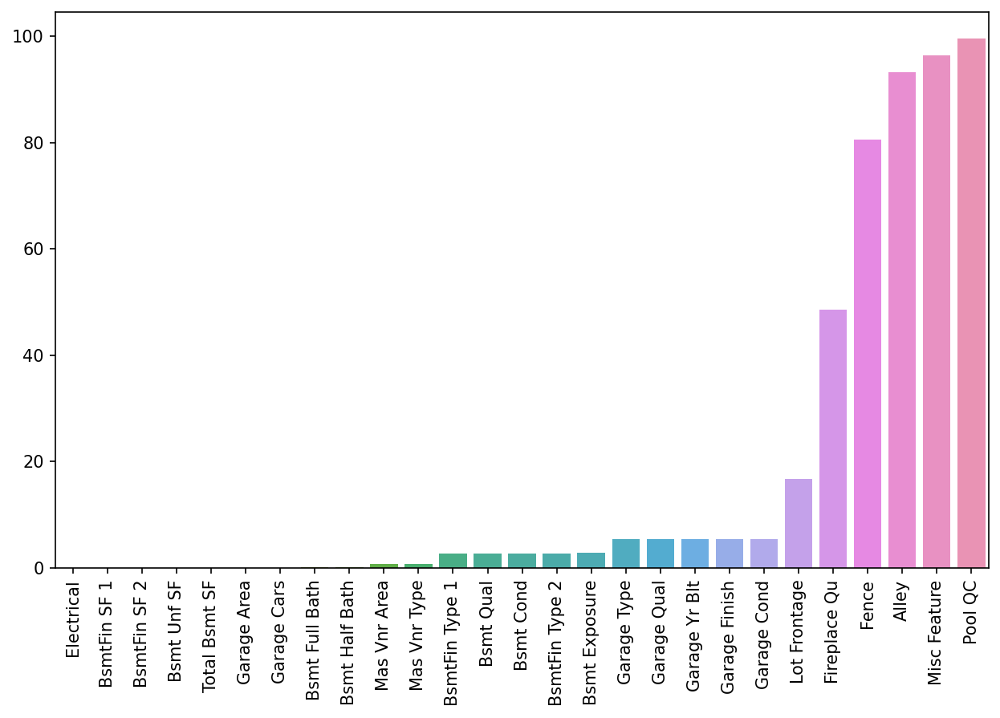

In [14]:
def null_perc(df):
  null_perc = (100*df.isnull().sum()/len(df)).sort_values()
  null_perc = null_perc[null_perc>0]

  plt.figure(figsize=(10,6),dpi=150)
  sns.barplot(x = null_perc.index,y=null_perc)
  plt.xticks(rotation=90);

null_perc(df)

* We can see There are observations for which all basement values are null, It is my guess that these property dont have a basement
* Therefore i have decided to fill the null values with '0' for numerical features and 'None' for categorical features

In [15]:
bsmt_num_cols = ['BsmtFin SF 1', 'BsmtFin SF 2', 'Bsmt Unf SF','Total Bsmt SF', 'Bsmt Full Bath', 'Bsmt Half Bath']
df[bsmt_num_cols] = df[bsmt_num_cols].fillna(0)

In [16]:
bsmt_str_cols =  ['Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2']
df[bsmt_str_cols] = df[bsmt_str_cols].fillna('None')

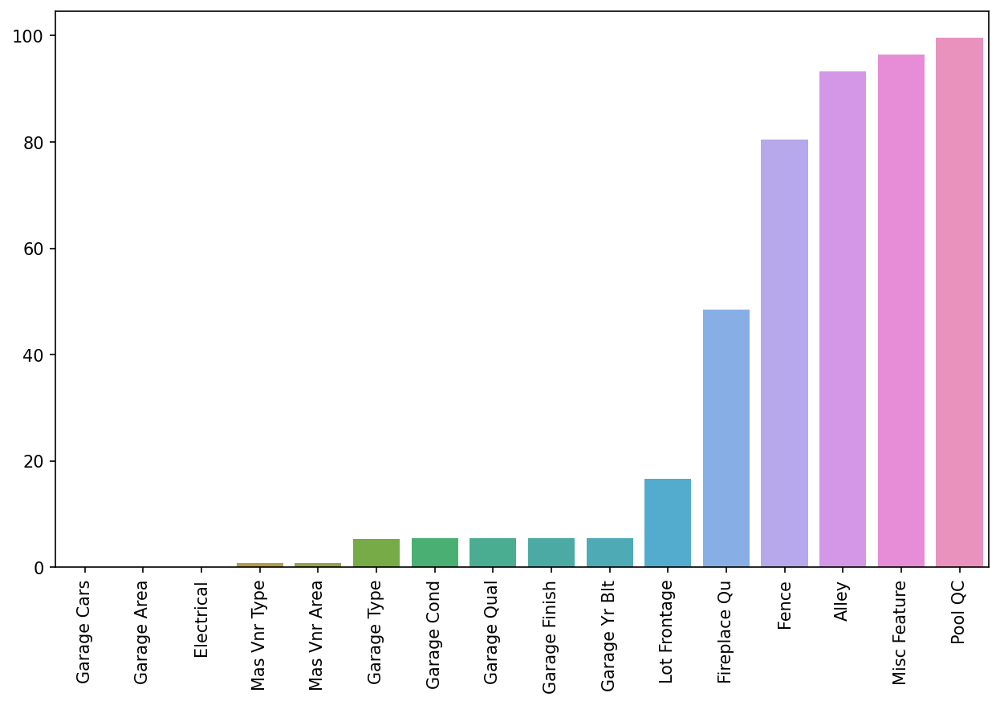

In [17]:
null_perc(df)

In [18]:
null = df.isnull().sum()
null[null>0].sort_values()

Electrical          1
Garage Cars         1
Garage Area         1
Mas Vnr Type       23
Mas Vnr Area       23
Garage Type       157
Garage Yr Blt     159
Garage Finish     159
Garage Qual       159
Garage Cond       159
Lot Frontage      490
Fireplace Qu     1422
Fence            2358
Alley            2732
Misc Feature     2824
Pool QC          2917
dtype: int64

In [19]:
df[['Garage Cars','Garage Area','Garage Type','Garage Yr Blt','Garage Finish','Garage Qual','Garage Cond']].isnull().sum()

Garage Cars        1
Garage Area        1
Garage Type      157
Garage Yr Blt    159
Garage Finish    159
Garage Qual      159
Garage Cond      159
dtype: int64

In [20]:
df[['Garage Cars','Garage Area','Garage Type','Garage Yr Blt','Garage Finish','Garage Qual','Garage Cond']]

,Garage Cars,Garage Area,Garage Type,Garage Yr Blt,Garage Finish,Garage Qual,Garage Cond
0,2.0,528.0,Attchd,1960.0,Fin,TA,TA
1,1.0,730.0,Attchd,1961.0,Unf,TA,TA
2,1.0,312.0,Attchd,1958.0,Unf,TA,TA
3,2.0,522.0,Attchd,1968.0,Fin,TA,TA
4,2.0,482.0,Attchd,1997.0,Fin,TA,TA
...,...,...,...,...,...,...,...
2925,2.0,588.0,Detchd,1984.0,Unf,TA,TA
2926,2.0,484.0,Attchd,1983.0,Unf,TA,TA
2927,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2928,2.0,418.0,Attchd,1975.0,RFn,TA,TA


In [21]:
df[df['Garage Cond'].isna()][['Garage Cars','Garage Area','Garage Type','Garage Yr Blt','Garage Finish','Garage Qual','Garage Cond']].head(15)

,Garage Cars,Garage Area,Garage Type,Garage Yr Blt,Garage Finish,Garage Qual,Garage Cond
27,0.0,0.0,NaN,NaN,NaN,NaN,NaN
119,0.0,0.0,NaN,NaN,NaN,NaN,NaN
125,0.0,0.0,NaN,NaN,NaN,NaN,NaN
129,0.0,0.0,NaN,NaN,NaN,NaN,NaN
130,0.0,0.0,NaN,NaN,NaN,NaN,NaN
170,0.0,0.0,NaN,NaN,NaN,NaN,NaN
171,0.0,0.0,NaN,NaN,NaN,NaN,NaN
186,0.0,0.0,NaN,NaN,NaN,NaN,NaN
203,0.0,0.0,NaN,NaN,NaN,NaN,NaN
206,0.0,0.0,NaN,NaN,NaN,NaN,NaN


In [22]:
df[df['Garage Cond'].isna()][['Garage Cars','Garage Area','Garage Type','Garage Yr Blt','Garage Finish','Garage Qual','Garage Cond']].sample(25)

,Garage Cars,Garage Area,Garage Type,Garage Yr Blt,Garage Finish,Garage Qual,Garage Cond
763,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1485,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1950,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1259,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2913,0.0,0.0,NaN,NaN,NaN,NaN,NaN
742,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1987,0.0,0.0,NaN,NaN,NaN,NaN,NaN
27,0.0,0.0,NaN,NaN,NaN,NaN,NaN
697,0.0,0.0,NaN,NaN,NaN,NaN,NaN
2907,0.0,0.0,NaN,NaN,NaN,NaN,NaN


* We can see that there are a few set of observations where all the garage related features null
* We can assume that there is no garage on these properties
* Therefore i have decided to fill the null values with '0' for numerical features and 'None' for categorical features

In [23]:
null = df.isnull().sum()
null[null>0].sort_values()

Electrical          1
Garage Cars         1
Garage Area         1
Mas Vnr Type       23
Mas Vnr Area       23
Garage Type       157
Garage Yr Blt     159
Garage Finish     159
Garage Qual       159
Garage Cond       159
Lot Frontage      490
Fireplace Qu     1422
Fence            2358
Alley            2732
Misc Feature     2824
Pool QC          2917
dtype: int64

In [24]:
garg_str_cols =  ['Garage Type','Garage Yr Blt','Garage Finish','Garage Qual','Garage Cond']
df[garg_str_cols] = df[garg_str_cols].fillna('None')

garg_num_cols = ['Garage Cars','Garage Area']
df[garg_num_cols] = df[garg_num_cols].fillna(0)

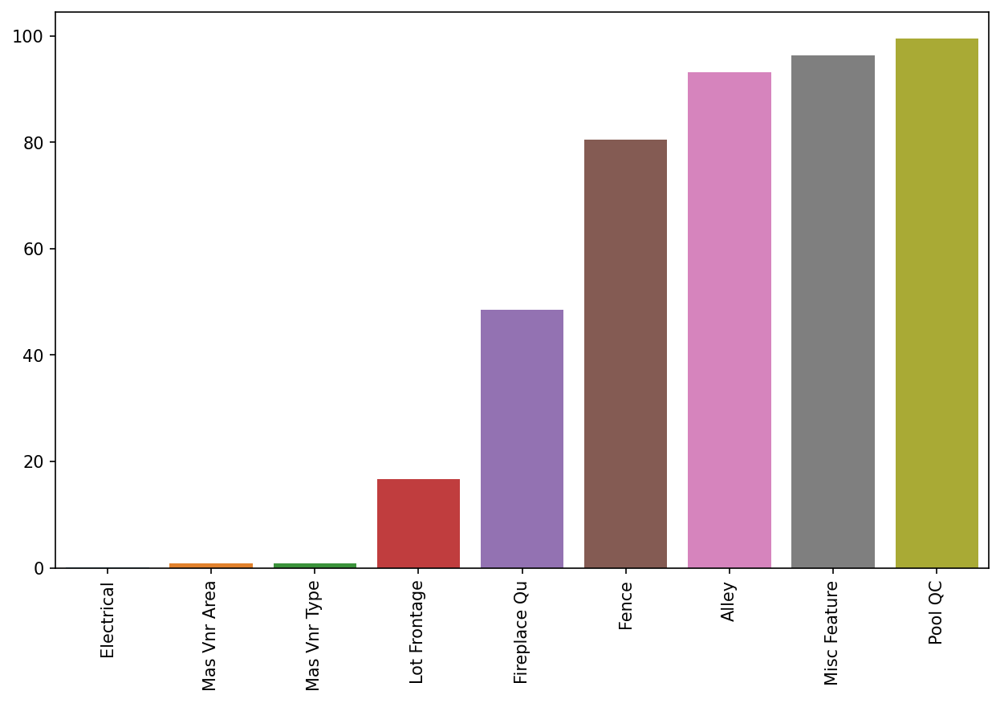

In [25]:
null_perc(df)

In [26]:
df[['Mas Vnr Type','Mas Vnr Area']]

,Mas Vnr Type,Mas Vnr Area
0,Stone,112.0
1,None,0.0
2,BrkFace,108.0
3,None,0.0
4,None,0.0
...,...,...
2925,None,0.0
2926,None,0.0
2927,None,0.0
2928,None,0.0


In [27]:
df.groupby('Mas Vnr Type')['Mas Vnr Area'].mean()

Mas Vnr Type
BrkCmn     195.480000
BrkFace    261.646591
CBlock     198.000000
None         0.703196
Stone      239.550201
Name: Mas Vnr Area, dtype: float64

In [28]:
null = df.isnull().sum()
null[null>0].sort_values()

Electrical         1
Mas Vnr Type      23
Mas Vnr Area      23
Lot Frontage     490
Fireplace Qu    1422
Fence           2358
Alley           2732
Misc Feature    2824
Pool QC         2917
dtype: int64

In [29]:
df[df['Mas Vnr Type'].isnull()][['Mas Vnr Type','Mas Vnr Area']]

,Mas Vnr Type,Mas Vnr Area
55,NaN,NaN
484,NaN,NaN
517,NaN,NaN
538,NaN,NaN
867,NaN,NaN
1095,NaN,NaN
1119,NaN,NaN
1122,NaN,NaN
1127,NaN,NaN
1184,NaN,NaN


* We can see the same observations for both 'Mas Vnr Type','Mas Vnr Area' are null
* From the feature description text file and googling i have found out that  Vnr is like a exterior wall finish used for elevation and decoration of a building therefore it is not a nessesary part of a building
* some people may choose not to put it this could be the reason for null values
* Therefore i have decided to fill the null values with '0' for numerical features and 'None' for categorical features

In [30]:
df['Mas Vnr Type'] = df['Mas Vnr Type'].fillna('None')

df['Mas Vnr Area'] = df['Mas Vnr Area'].fillna(0)

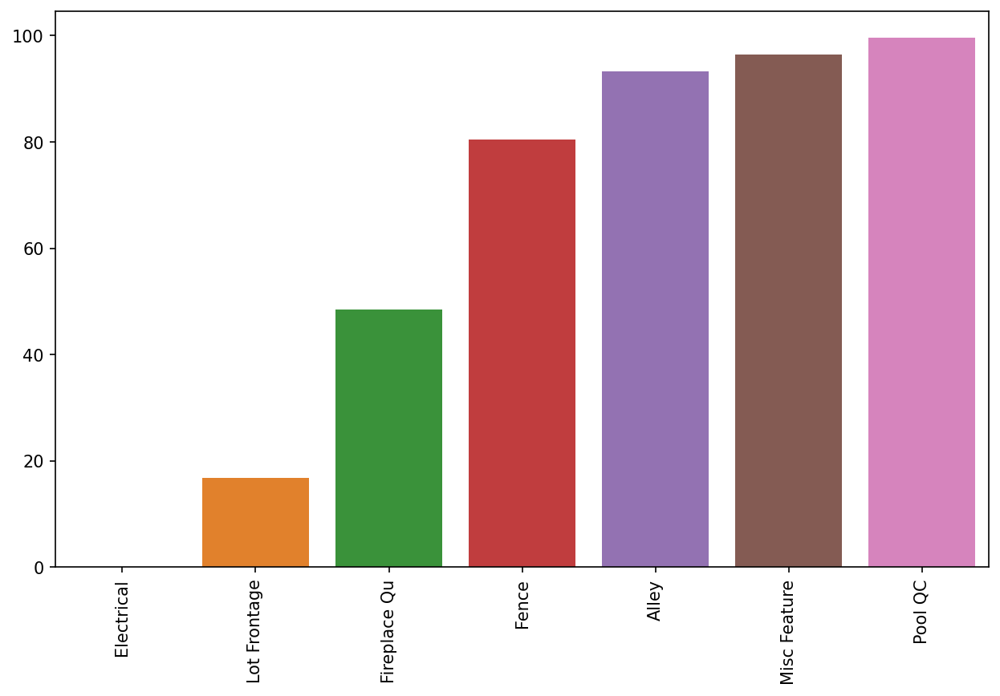

In [31]:
null_perc(df)

In [32]:
df['Electrical'].isnull().sum()

1

In [33]:
df['Electrical'].value_counts()/len(df)*100

SBrkr    91.535836
FuseA     6.416382
FuseF     1.706485
FuseP     0.273038
Mix       0.034130
Name: Electrical, dtype: float64

In [34]:
df[df['Electrical'].isnull()]

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
1577,916386080,80,RL,73.0,9735,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500


* Looks like almost 91.5% of the people are using SBrkr Electrical system
* so i have decided to impute The missing Value for electrical with mode

In [35]:
df['Electrical'] = df['Electrical'].fillna(df['Electrical'].mode()[0])

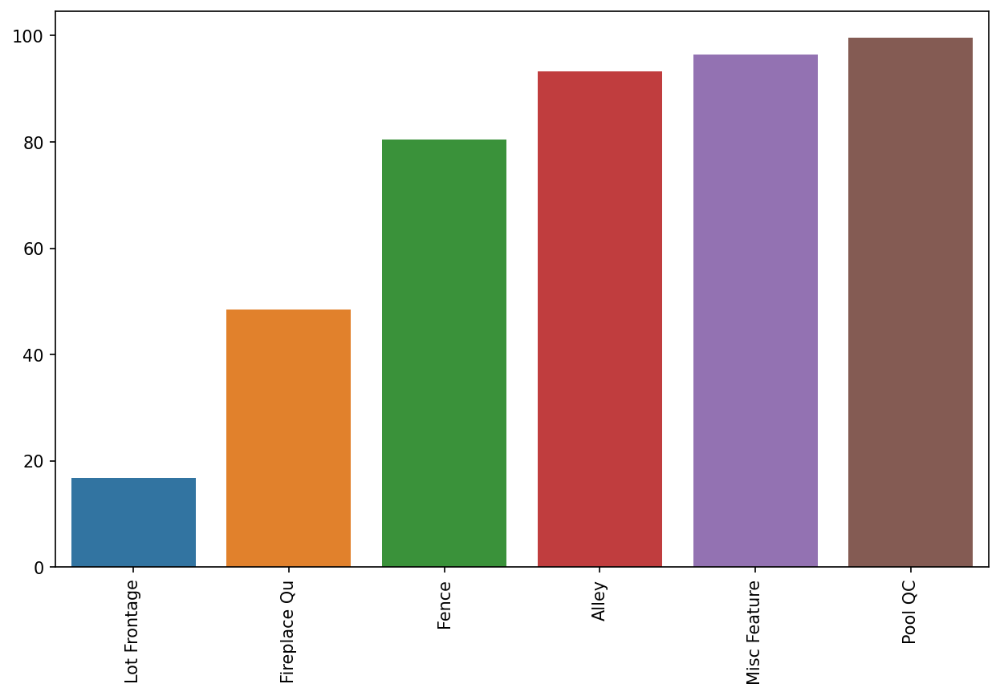

In [36]:
null_perc(df)

In [37]:
df['Lot Frontage'].describe()

count    2440.000000
mean       69.224590
std        23.365335
min        21.000000
25%        58.000000
50%        68.000000
75%        80.000000
max       313.000000
Name: Lot Frontage, dtype: float64

In [38]:
df['Lot Frontage'].isnull().sum()

490

In [39]:
df.groupby('MS Zoning')['Lot Frontage'].mean()

MS Zoning
A (agr)    102.500000
C (all)     65.608696
FV          59.529412
I (all)    109.000000
RH          55.434783
RL          73.926869
RM          52.246479
Name: Lot Frontage, dtype: float64

In [40]:
df.groupby('MS Zoning')['Lot Frontage'].median()

MS Zoning
A (agr)    102.5
C (all)     60.0
FV          65.0
I (all)    109.0
RH          60.0
RL          72.0
RM          52.0
Name: Lot Frontage, dtype: float64

* Imputing null values with median

In [41]:
df['Lot Frontage'] = df['Lot Frontage'].fillna(df.groupby('MS Zoning')['Lot Frontage'].transform('median'))

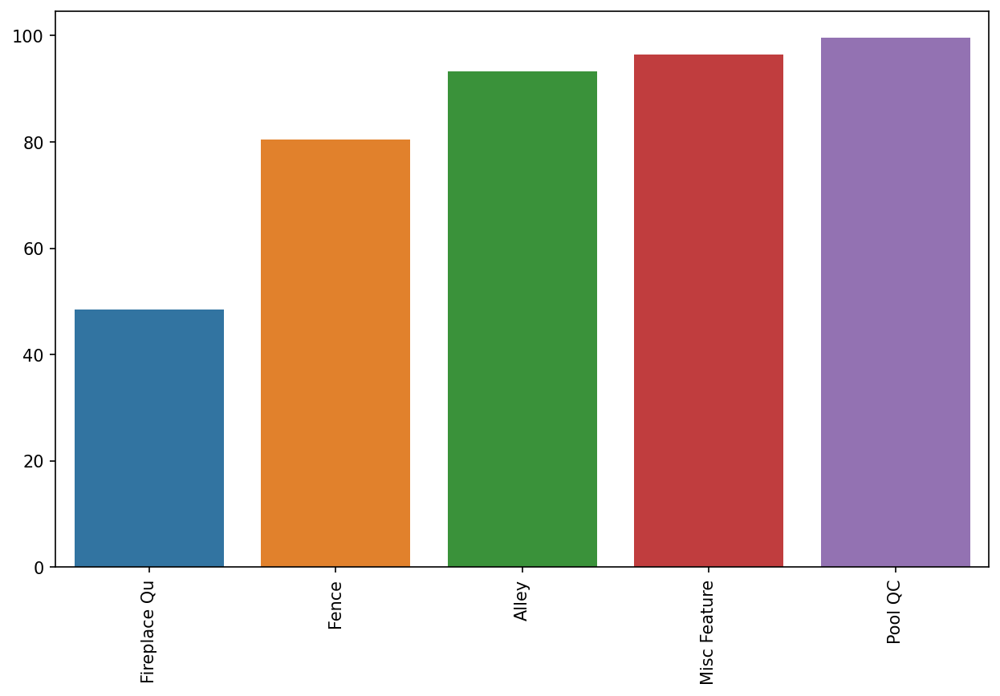

In [42]:
null_perc(df)

In [43]:
df['Fireplace Qu'].value_counts()

Gd    744
TA    600
Fa     75
Po     46
Ex     43
Name: Fireplace Qu, dtype: int64

In [44]:
df.groupby('Fireplace Qu')['SalePrice'].mean()

Fireplace Qu
Ex    344432.325581
Fa    166759.266667
Gd    231676.365591
Po    141959.413043
TA    204561.973333
Name: SalePrice, dtype: float64

In [45]:
df[df['Fireplace Qu'].isnull()]['SalePrice'].describe()

count      1422.000000
mean     141195.772152
std       44546.561029
min       13100.000000
25%      113550.000000
50%      135500.000000
75%      162375.000000
max      360000.000000
Name: SalePrice, dtype: float64

* In the feature description text it is given than For 'fireplace Qu' NA means there is no fireplace therefore i will replace the null values with 'None'

In [46]:
df['Fireplace Qu'] = df['Fireplace Qu'].fillna('None')

In [47]:
df['Fireplace Qu']

0         Gd
1       None
2       None
3         TA
4         TA
        ... 
2925    None
2926    None
2927    None
2928      TA
2929      TA
Name: Fireplace Qu, Length: 2930, dtype: object

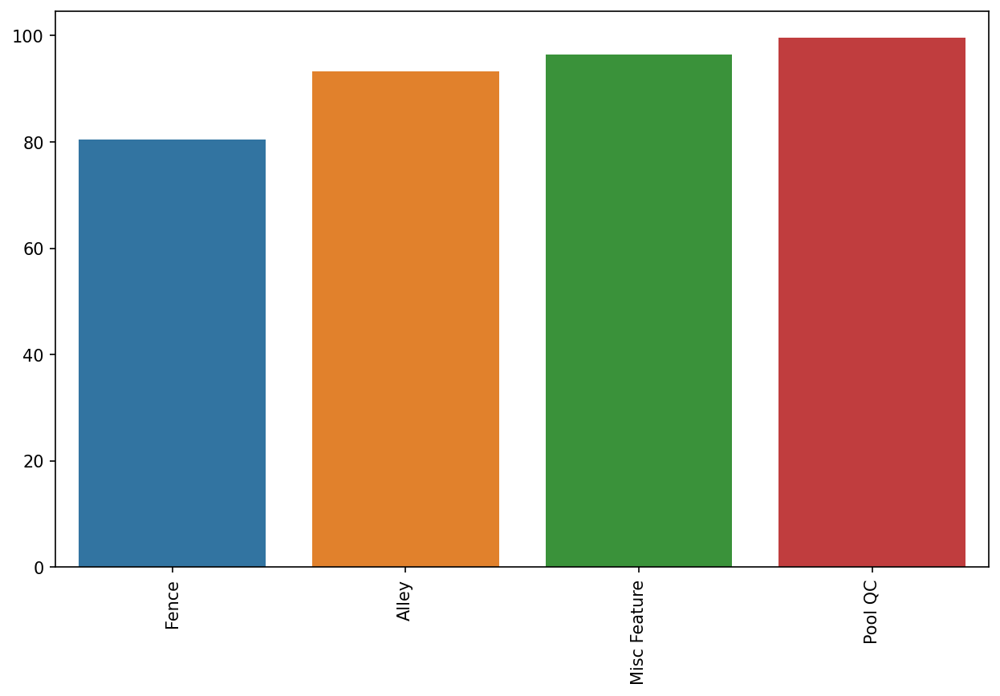

In [48]:
null_perc(df)

In [49]:
df['Fence']

0         NaN
1       MnPrv
2         NaN
3         NaN
4       MnPrv
        ...  
2925    GdPrv
2926    MnPrv
2927    MnPrv
2928      NaN
2929      NaN
Name: Fence, Length: 2930, dtype: object

In [50]:
df['Fence'].value_counts()

MnPrv    330
GdPrv    118
GdWo     112
MnWw      12
Name: Fence, dtype: int64

* In the feature description text it is given than For 'Fence' NA means there is no Fence therefore i will replace the null values with 'None'

In [51]:
df['Fence'] = df['Fence'].fillna('None')

In [52]:
df['Fence'].value_counts()

None     2358
MnPrv     330
GdPrv     118
GdWo      112
MnWw       12
Name: Fence, dtype: int64

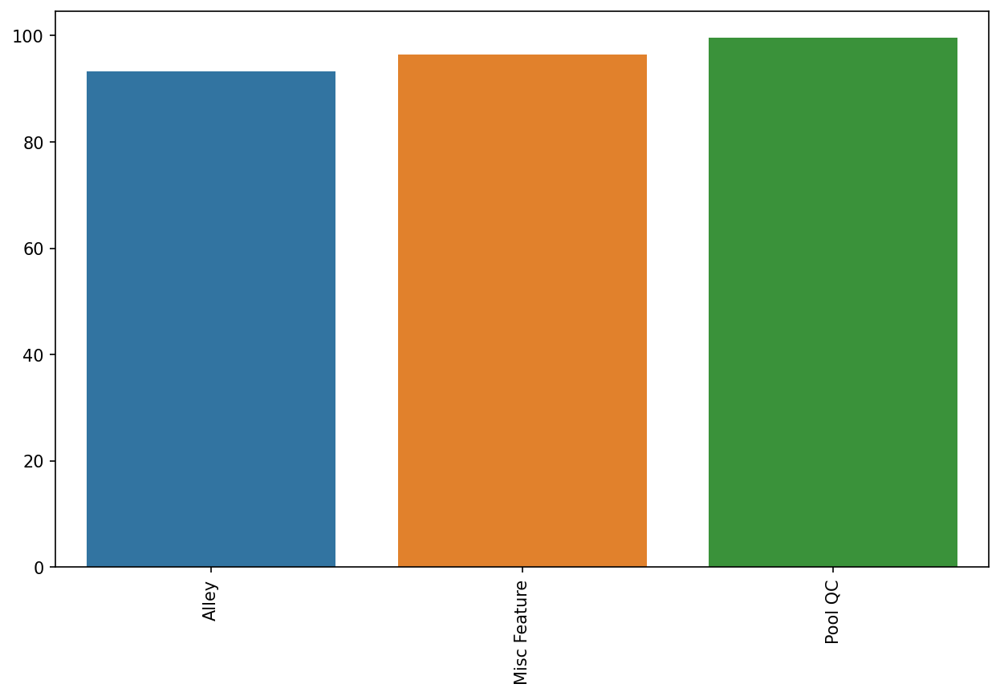

In [53]:
null_perc(df)

In [54]:
df['Alley'].value_counts()

Grvl    120
Pave     78
Name: Alley, dtype: int64

In [55]:
df.groupby('Alley')['SalePrice'].mean()

Alley
Grvl    123556.908333
Pave    176945.358974
Name: SalePrice, dtype: float64

* In the feature description text it is given than For 'Alley' NA means there is no Alley Access therefore i will replace the null values with 'None'

In [56]:
df['Alley'] = df['Alley'].fillna('None')

In [57]:
df.groupby('Alley')['SalePrice'].mean()

Alley
Grvl    123556.908333
None    183420.164348
Pave    176945.358974
Name: SalePrice, dtype: float64

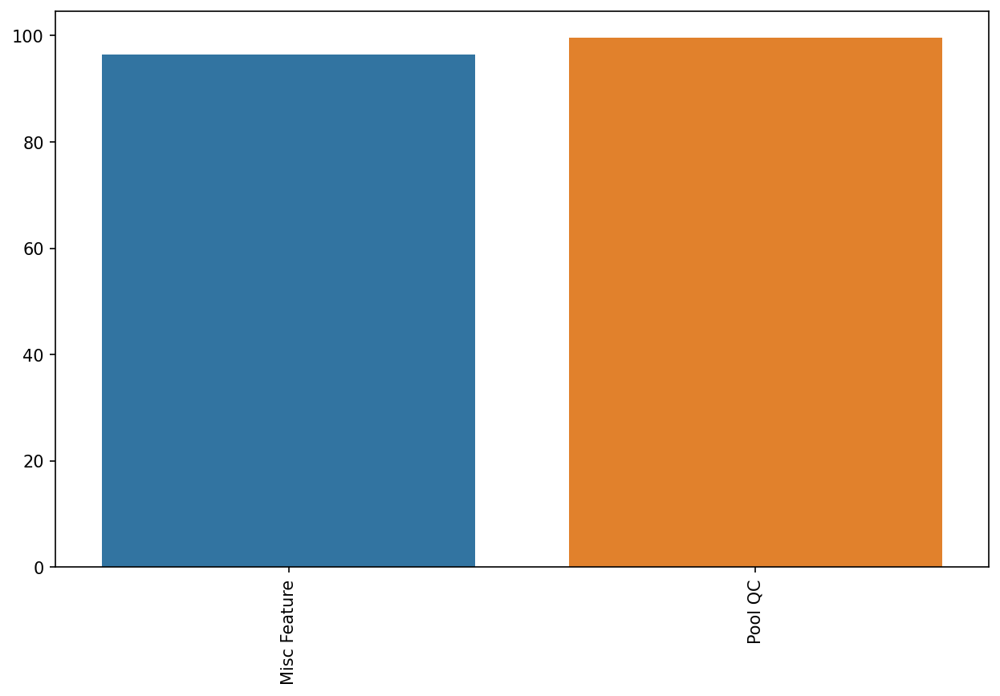

In [58]:
null_perc(df)

In [59]:
df['Misc Feature'].value_counts()

Shed    95
Gar2     5
Othr     4
Elev     1
TenC     1
Name: Misc Feature, dtype: int64

* In the feature description text it is given than For 'Misc Feature' NA means there is no Miscellaneous feature like elevator,shed etc therefore i will replace the null values with 'None'

In [60]:
df['Misc Feature'] = df['Misc Feature'].fillna('None')

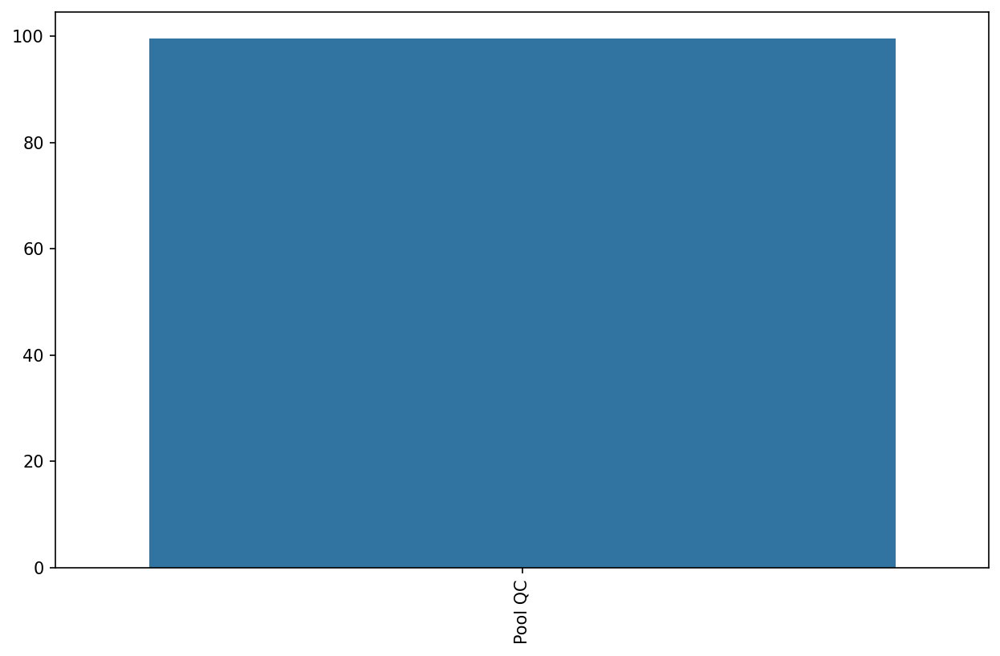

In [61]:
null_perc(df)

* In the feature description text it is given than For 'Pool QC' NA means there is no Pool therefore i will replace the null values with 'None'

In [62]:
df['Pool QC'] = df['Pool QC'].fillna('None')

In [63]:
df.isnull().sum().sort_values(ascending=False)

PID              0
Central Air      0
Garage Yr Blt    0
Garage Type      0
Fireplace Qu     0
                ..
Mas Vnr Area     0
Mas Vnr Type     0
Exterior 2nd     0
Exterior 1st     0
SalePrice        0
Length: 81, dtype: int64

In [64]:
df.isnull().sum().sum()

0

## Outlier Treatment, Analysis and  Feature Engineering

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   PID              2930 non-null   int64  
 1   MS SubClass      2930 non-null   int64  
 2   MS Zoning        2930 non-null   object 
 3   Lot Frontage     2930 non-null   float64
 4   Lot Area         2930 non-null   int64  
 5   Street           2930 non-null   object 
 6   Alley            2930 non-null   object 
 7   Lot Shape        2930 non-null   object 
 8   Land Contour     2930 non-null   object 
 9   Utilities        2930 non-null   object 
 10  Lot Config       2930 non-null   object 
 11  Land Slope       2930 non-null   object 
 12  Neighborhood     2930 non-null   object 
 13  Condition 1      2930 non-null   object 
 14  Condition 2      2930 non-null   object 
 15  Bldg Type        2930 non-null   object 
 16  House Style      2930 non-null   object 
 17  Overall Qual  

In [66]:
df_nums = df.select_dtypes(exclude='object')

In [67]:
len(df_nums.columns)

37

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\101038300.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


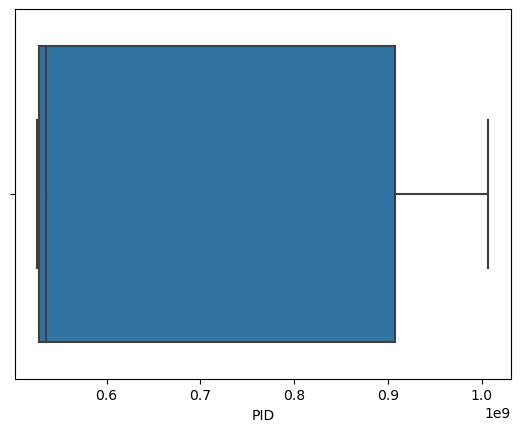

<Figure size 640x480 with 0 Axes>

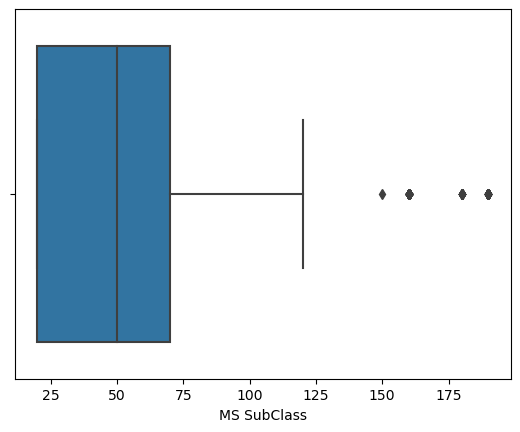

<Figure size 640x480 with 0 Axes>

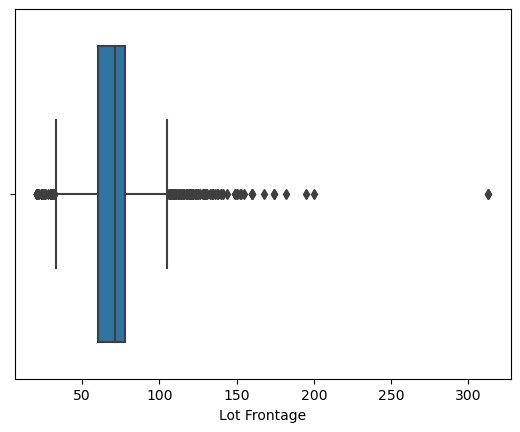

<Figure size 640x480 with 0 Axes>

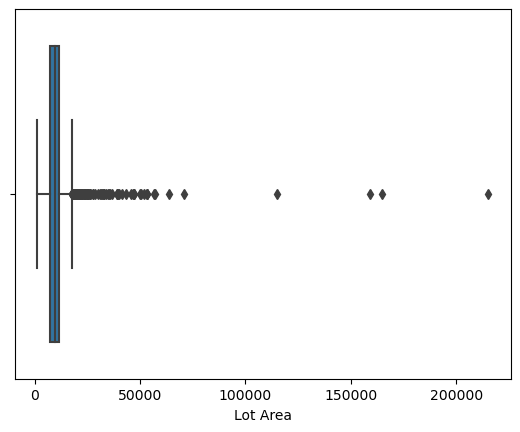

<Figure size 640x480 with 0 Axes>

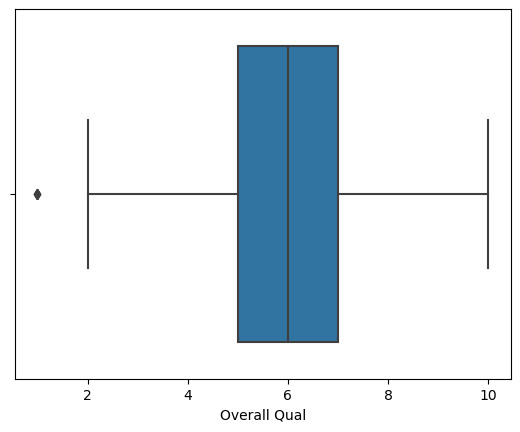

<Figure size 640x480 with 0 Axes>

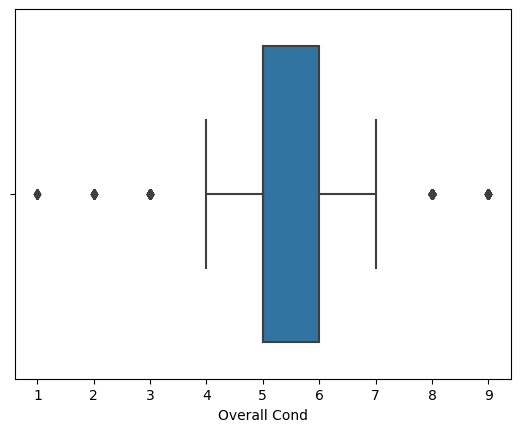

<Figure size 640x480 with 0 Axes>

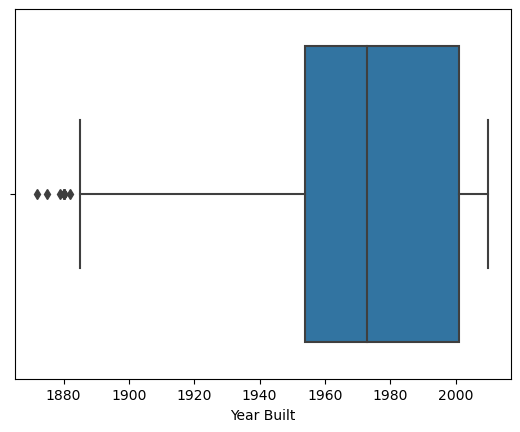

<Figure size 640x480 with 0 Axes>

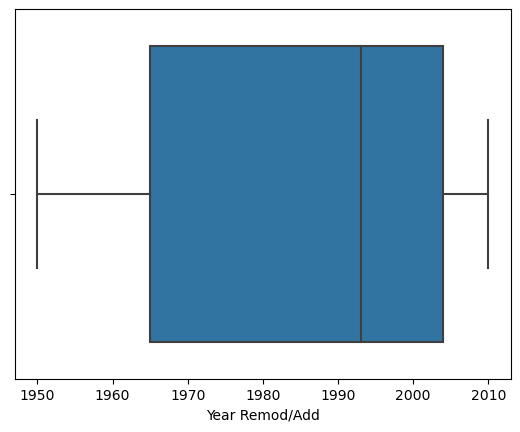

<Figure size 640x480 with 0 Axes>

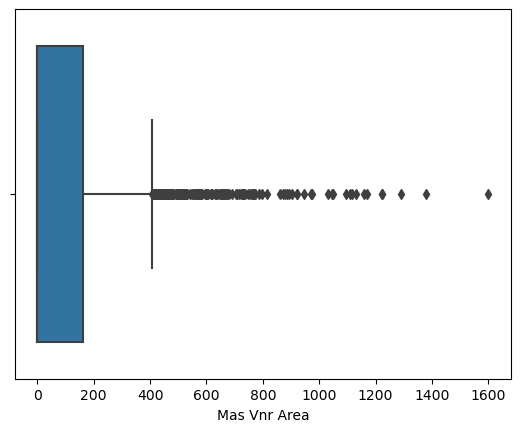

<Figure size 640x480 with 0 Axes>

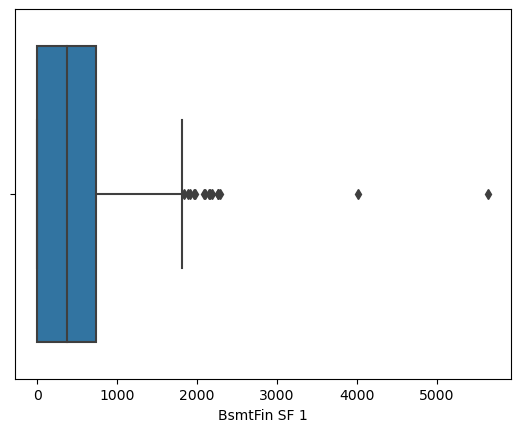

<Figure size 640x480 with 0 Axes>

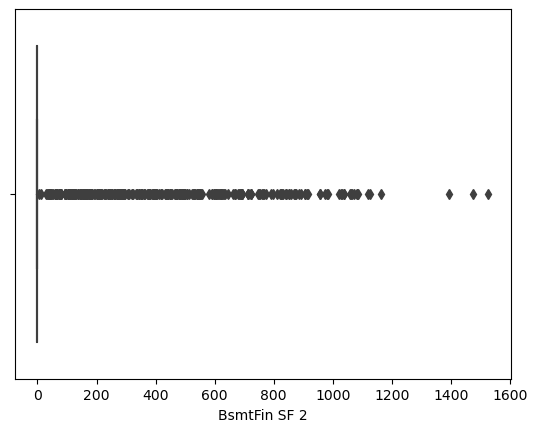

<Figure size 640x480 with 0 Axes>

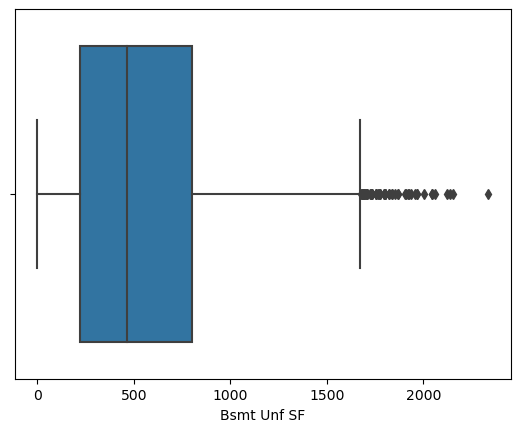

<Figure size 640x480 with 0 Axes>

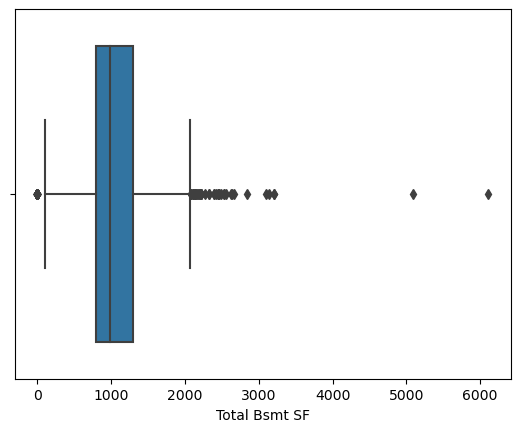

<Figure size 640x480 with 0 Axes>

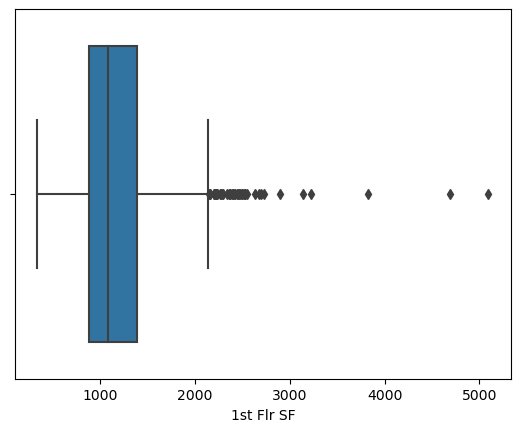

<Figure size 640x480 with 0 Axes>

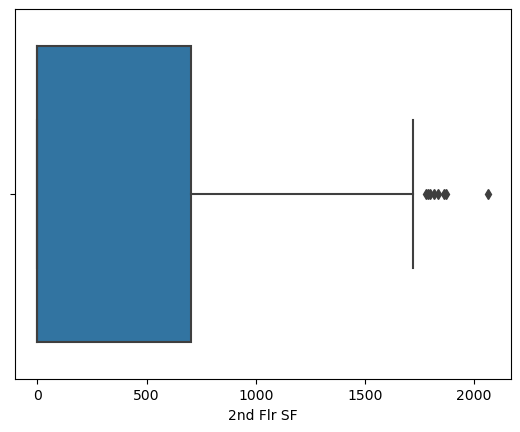

<Figure size 640x480 with 0 Axes>

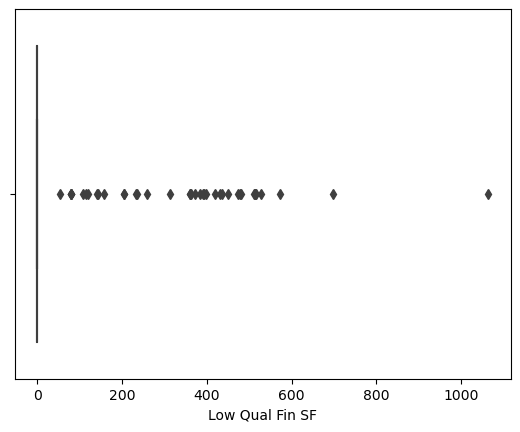

<Figure size 640x480 with 0 Axes>

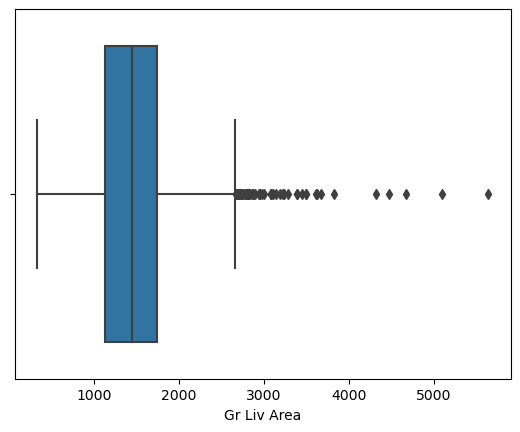

<Figure size 640x480 with 0 Axes>

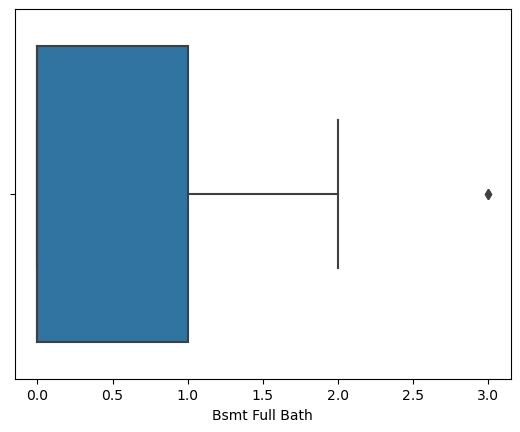

<Figure size 640x480 with 0 Axes>

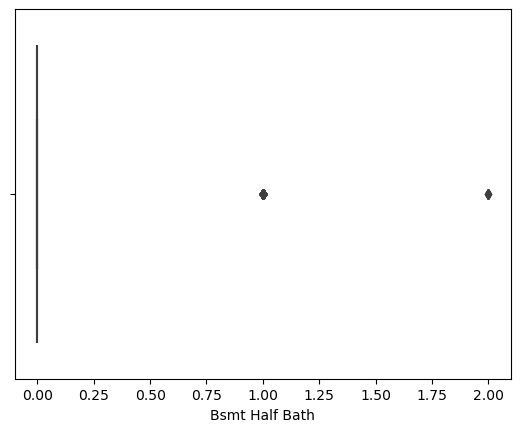

<Figure size 640x480 with 0 Axes>

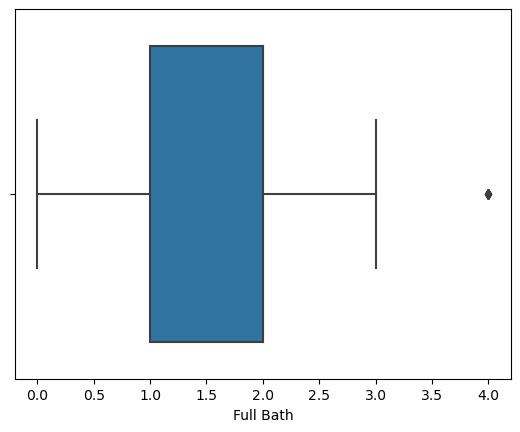

<Figure size 640x480 with 0 Axes>

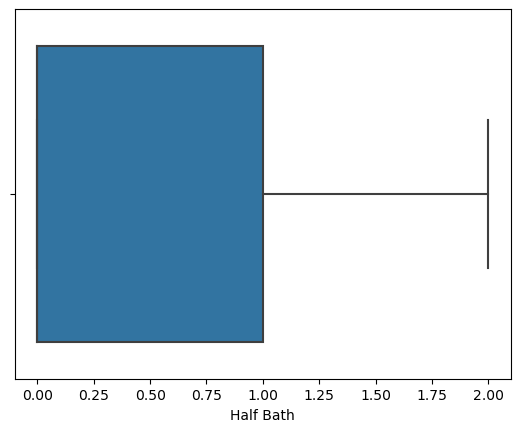

<Figure size 640x480 with 0 Axes>

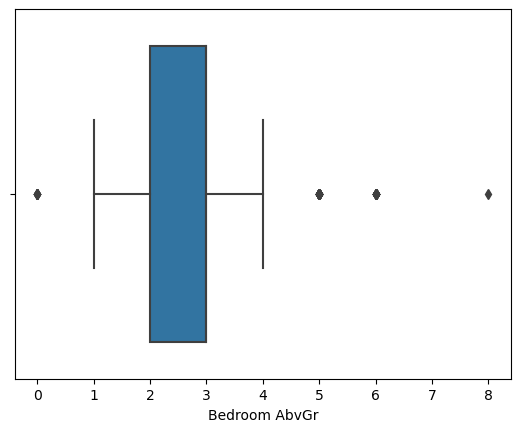

<Figure size 640x480 with 0 Axes>

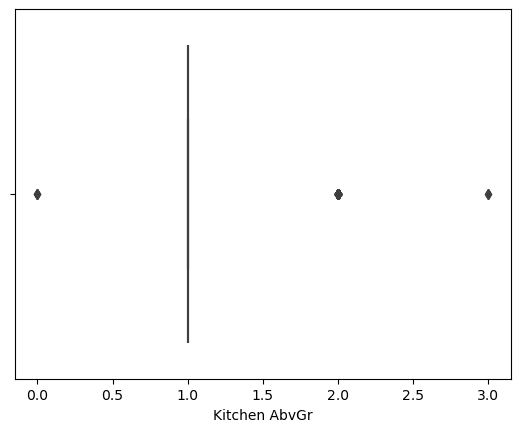

<Figure size 640x480 with 0 Axes>

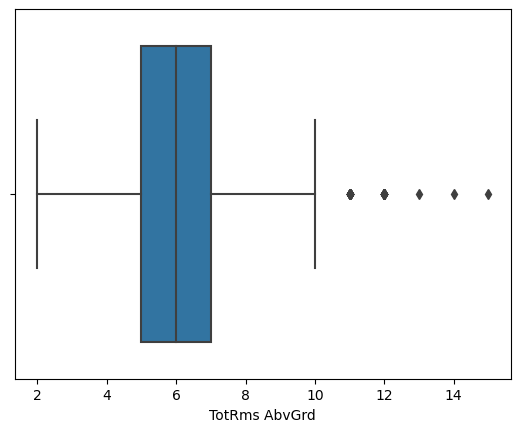

<Figure size 640x480 with 0 Axes>

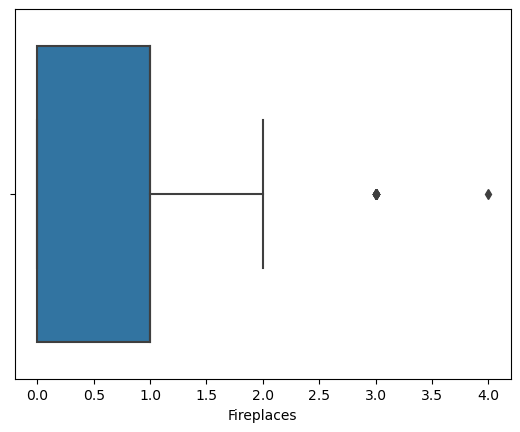

<Figure size 640x480 with 0 Axes>

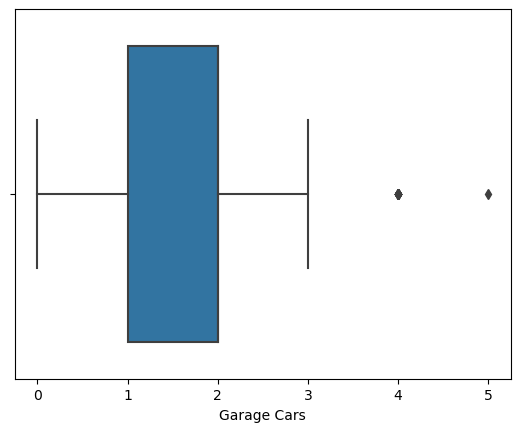

<Figure size 640x480 with 0 Axes>

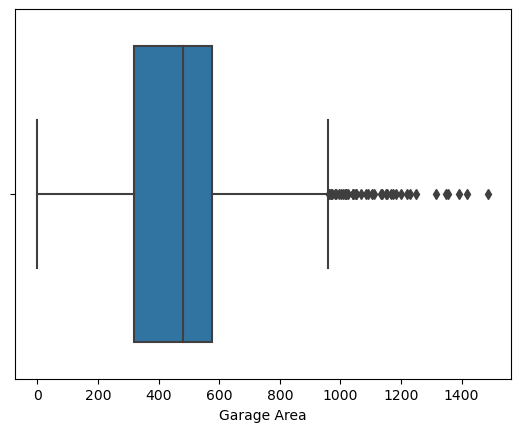

<Figure size 640x480 with 0 Axes>

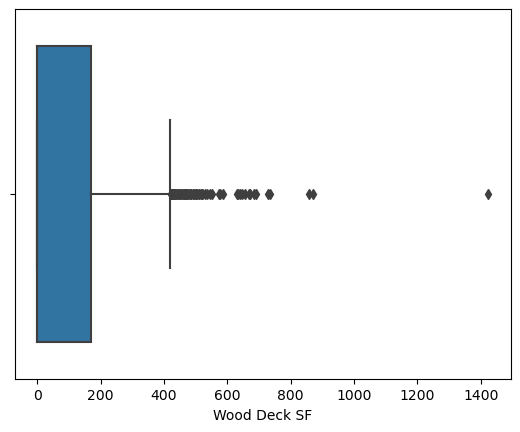

<Figure size 640x480 with 0 Axes>

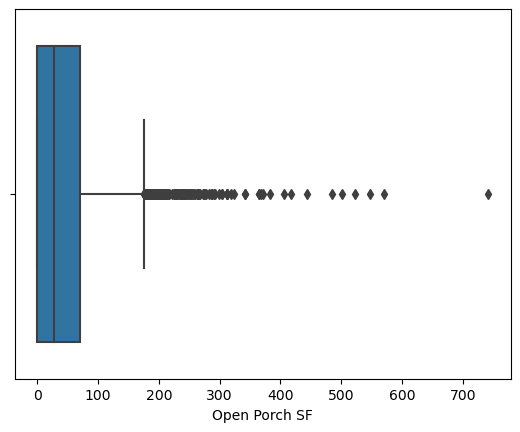

<Figure size 640x480 with 0 Axes>

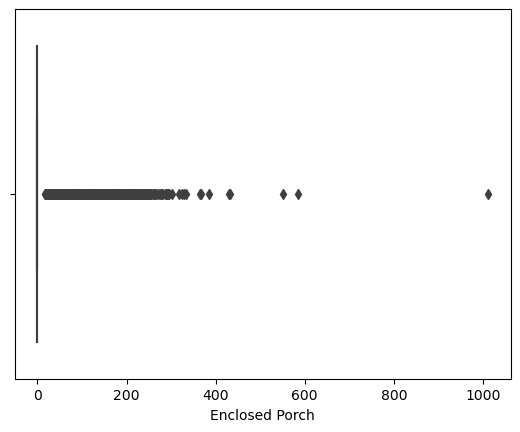

<Figure size 640x480 with 0 Axes>

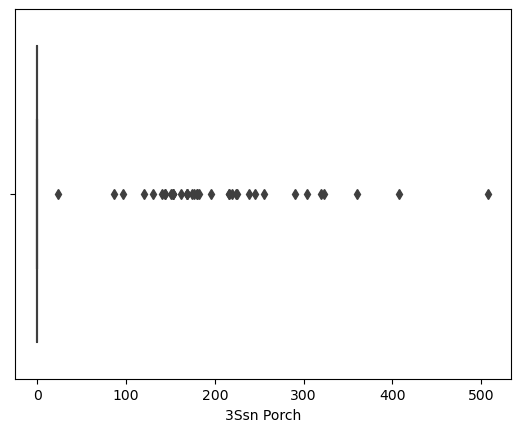

<Figure size 640x480 with 0 Axes>

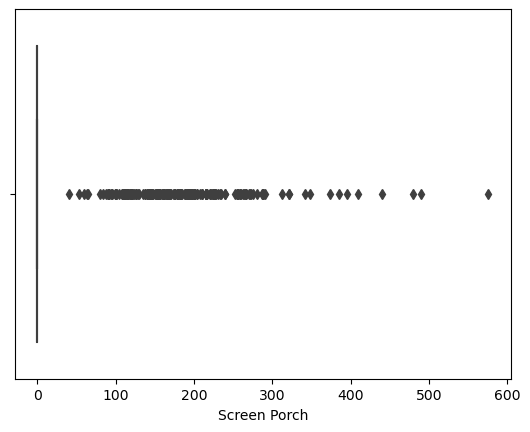

<Figure size 640x480 with 0 Axes>

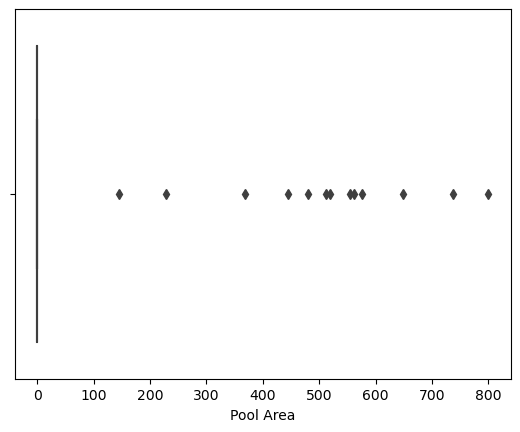

<Figure size 640x480 with 0 Axes>

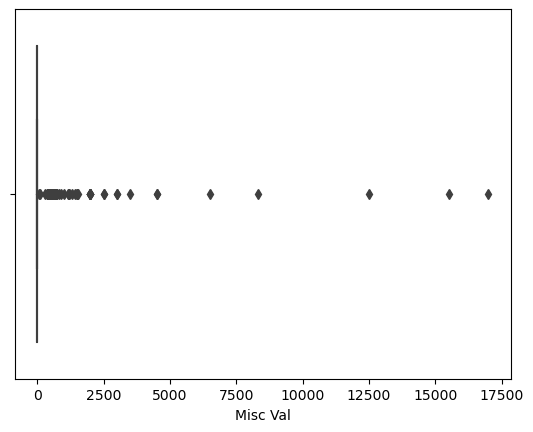

<Figure size 640x480 with 0 Axes>

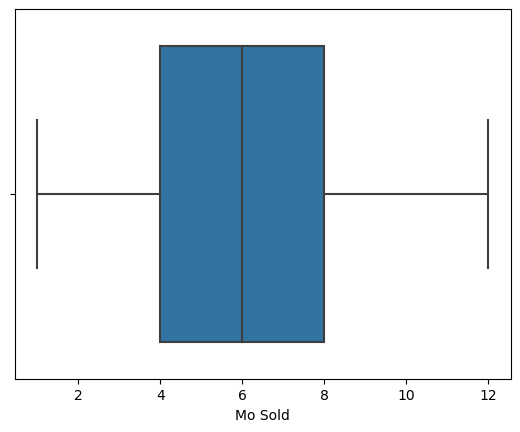

<Figure size 640x480 with 0 Axes>

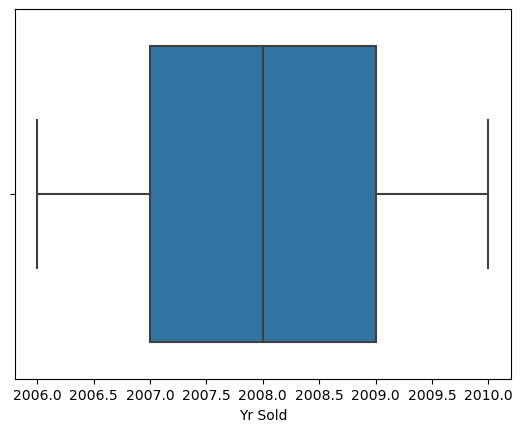

<Figure size 640x480 with 0 Axes>

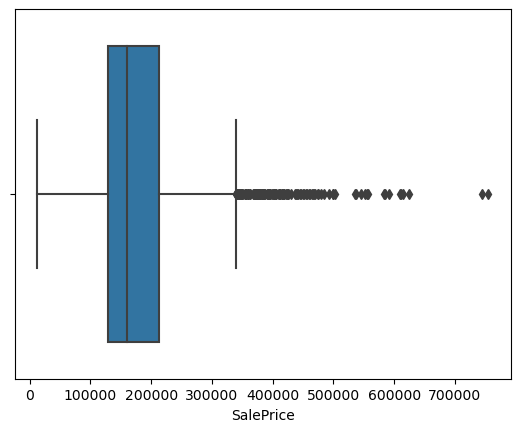

<Figure size 640x480 with 0 Axes>

In [68]:
for i in df_nums.columns:
  plt.figure()
  sns.boxplot(x=i,data=df)
  plt.figure()

In [69]:
df.corr()['SalePrice'].sort_values()

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\4269891110.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()['SalePrice'].sort_values()


PID               -0.246521
Enclosed Porch    -0.128787
Kitchen AbvGr     -0.119814
Overall Cond      -0.101697
MS SubClass       -0.085092
Low Qual Fin SF   -0.037660
Bsmt Half Bath    -0.035817
Yr Sold           -0.030569
Misc Val          -0.015691
BsmtFin SF 2       0.006018
3Ssn Porch         0.032225
Mo Sold            0.035259
Pool Area          0.068403
Screen Porch       0.112151
Bedroom AbvGr      0.143913
Bsmt Unf SF        0.183308
Lot Area           0.266549
2nd Flr SF         0.269373
Bsmt Full Bath     0.275823
Half Bath          0.285056
Open Porch SF      0.312951
Wood Deck SF       0.327143
Lot Frontage       0.344642
BsmtFin SF 1       0.433147
Fireplaces         0.474558
TotRms AbvGrd      0.495474
Mas Vnr Area       0.502196
Year Remod/Add     0.532974
Full Bath          0.545604
Year Built         0.558426
1st Flr SF         0.621676
Total Bsmt SF      0.632529
Garage Area        0.640138
Garage Cars        0.647562
Gr Liv Area        0.706780
Overall Qual       0

In [70]:
col = df.columns
col

Index(['PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area', 'Street',
       'Alley', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config',
       'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type',
       'House Style', 'Overall Qual', 'Overall Cond', 'Year Built',
       'Year Remod/Add', 'Roof Style', 'Roof Matl', 'Exterior 1st',
       'Exterior 2nd', 'Mas Vnr Type', 'Mas Vnr Area', 'Exter Qual',
       'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin SF 1', 'BsmtFin Type 2', 'BsmtFin SF 2',
       'Bsmt Unf SF', 'Total Bsmt SF', 'Heating', 'Heating QC', 'Central Air',
       'Electrical', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF',
       'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'Kitchen Qual',
       'TotRms AbvGrd', 'Functional', 'Fireplaces', 'Fireplace Qu',
       'Garage Type', 'Garage Yr Blt', 'Garage Finish'

In [71]:
# Creating lists to separate categorical and numerical features
cat = []
num = []

In [72]:
col[1]

'MS SubClass'

In [73]:
df[col[1]]

0       20
1       20
2       20
3       20
4       60
        ..
2925    80
2926    20
2927    85
2928    20
2929    60
Name: MS SubClass, Length: 2930, dtype: int64

In [74]:
df[col[1]].value_counts()

20     1079
60      575
50      287
120     192
30      139
160     129
70      128
80      118
90      109
190      61
85       48
75       23
45       18
180      17
40        6
150       1
Name: MS SubClass, dtype: int64

<Axes: xlabel='MS SubClass', ylabel='count'>

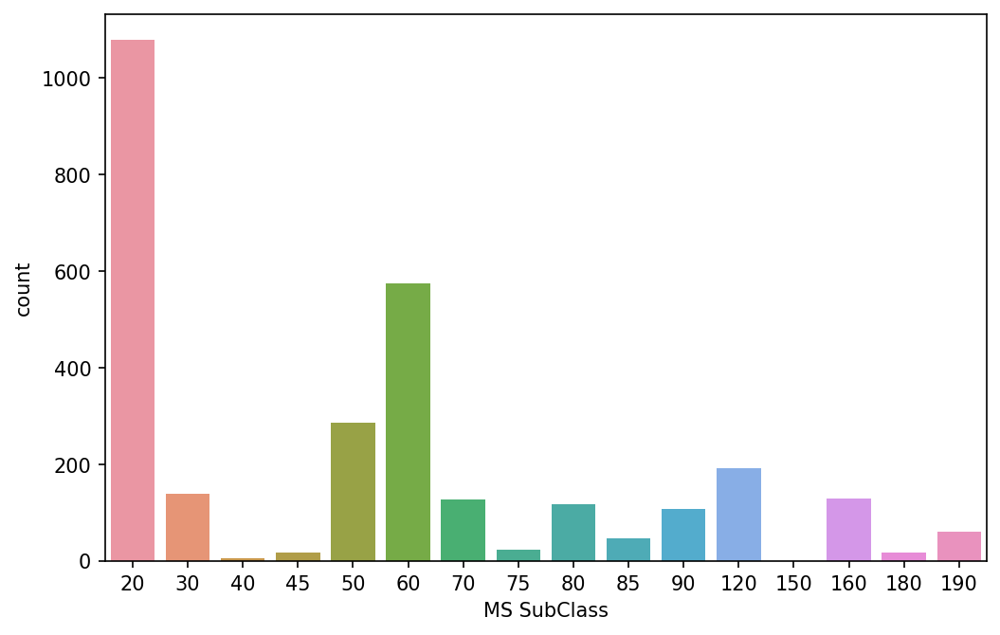

In [75]:
plt.figure(figsize=(8,5),dpi=150)
sns.countplot(x=col[1],data=df)

* Looks like Top 3 MS SubClass are 20,60,50

<Axes: xlabel='MS SubClass', ylabel='SalePrice'>

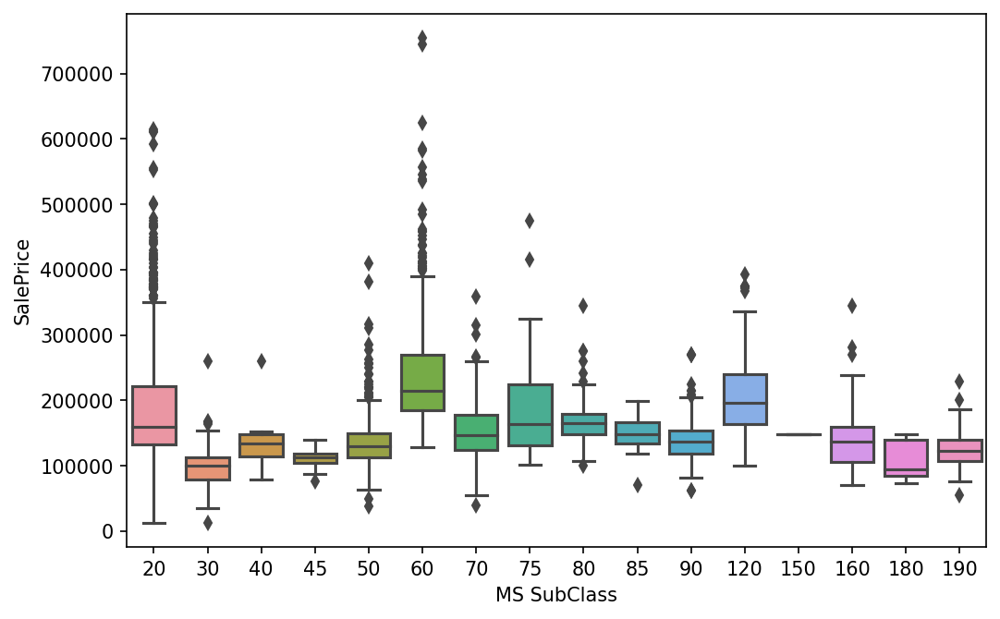

In [76]:
plt.figure(figsize=(8,5),dpi=150)
sns.boxplot(x=col[1],y='SalePrice',data=df)

In [77]:
df.corr()[col[1]]['SalePrice']

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\1183654445.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()[col[1]]['SalePrice']


-0.08509157560995916

* Looks like Sale price is highest for MS SubClass 60,120 and lowest for 30,180
* This is a categorical feature therefore appending it to category list

In [78]:
cat.append(col[1])
cat

['MS SubClass']

In [79]:
col[2]

'MS Zoning'

In [80]:
df[col[2]].value_counts()

RL         2273
RM          462
FV          139
RH           27
C (all)      25
I (all)       2
A (agr)       2
Name: MS Zoning, dtype: int64

<Axes: xlabel='MS Zoning', ylabel='count'>

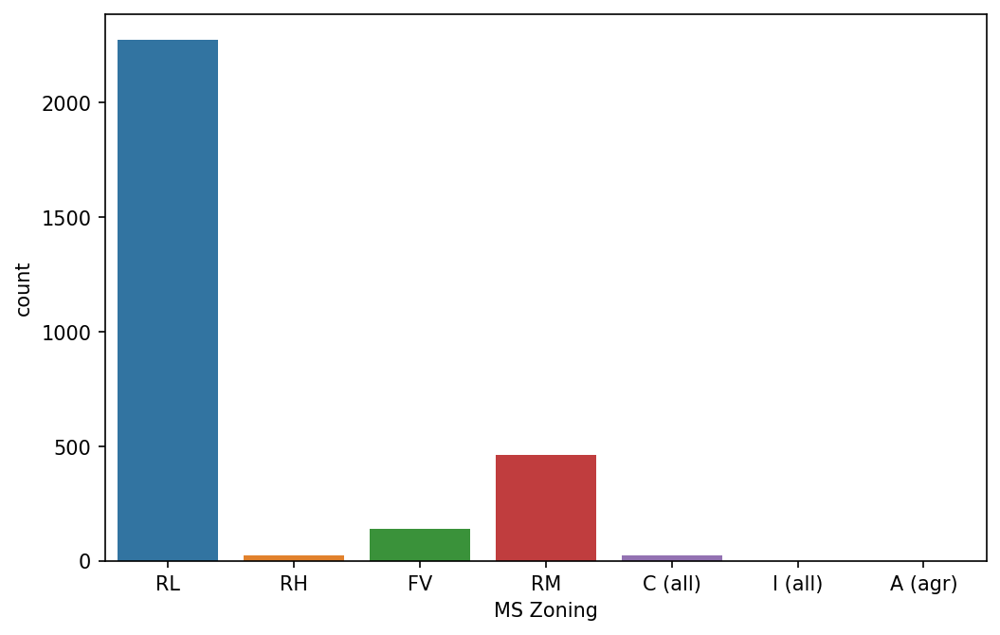

In [81]:
plt.figure(figsize=(8,5),dpi=150)
sns.countplot(x=col[2],data=df)

* Most of the people have RM,Rl type of MS Zoning

<Axes: xlabel='MS Zoning', ylabel='SalePrice'>

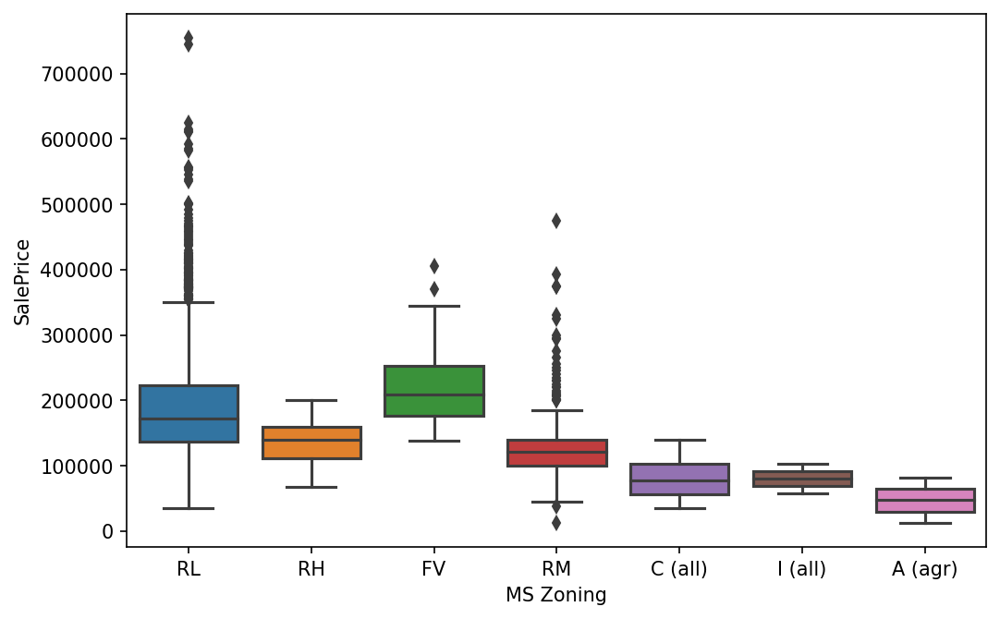

In [82]:
plt.figure(figsize=(8,5),dpi=150)
sns.boxplot(x=col[2],y='SalePrice',data=df)

* Sale price is highest for FV,RL type of MS Zoning
* Sale price is lowest got C,I,A typr MS Zoning

In [83]:
cat.append(col[2])
cat

['MS SubClass', 'MS Zoning']

In [84]:
col[3]

'Lot Frontage'

In [85]:
df[col[3]].describe()

count    2930.000000
mean       69.383276
std        21.451992
min        21.000000
25%        60.000000
50%        71.000000
75%        78.000000
max       313.000000
Name: Lot Frontage, dtype: float64

<Axes: xlabel='Lot Frontage'>

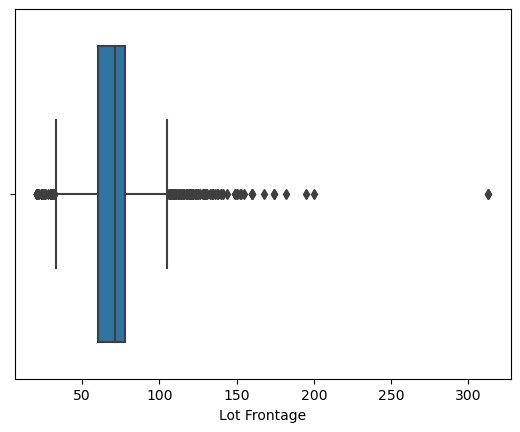

In [86]:
sns.boxplot(x=col[3],data=df)

<Axes: xlabel='Lot Frontage', ylabel='SalePrice'>

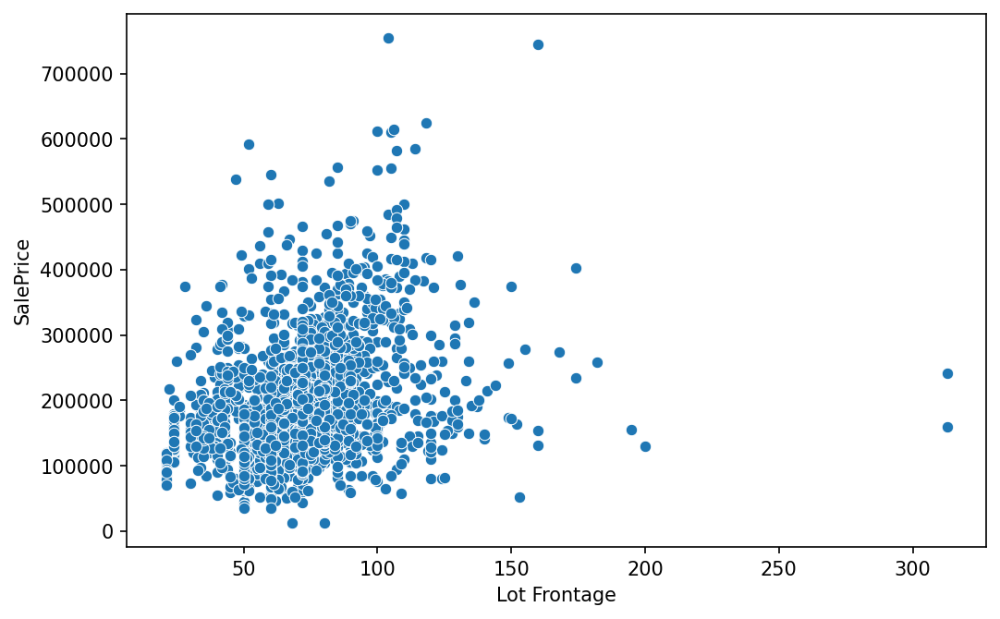

In [87]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[3],y='SalePrice',data=df)

(0.0, 175.0)

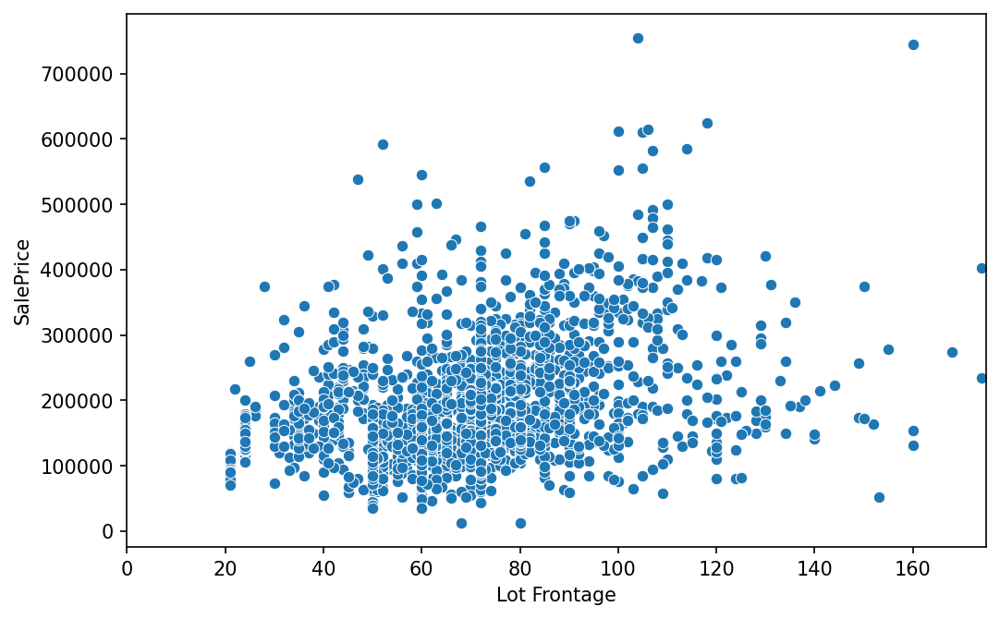

In [88]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[3],y='SalePrice',data=df)
plt.xlim(0,175)

<Axes: xlabel='Lot Frontage', ylabel='SalePrice'>

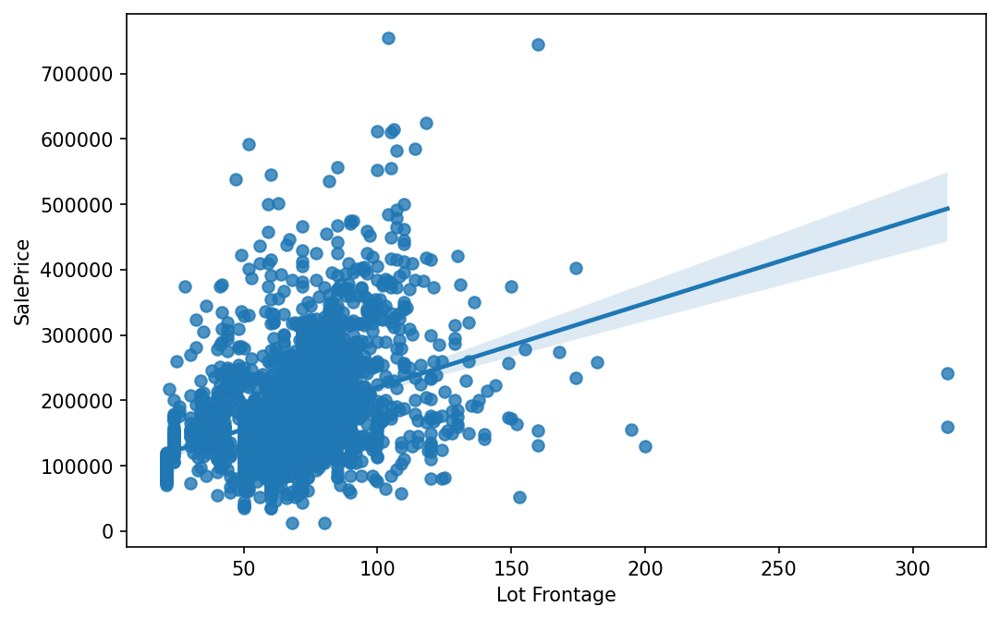

In [89]:
plt.figure(figsize=(8,5),dpi=150)
sns.regplot(x=col[3],y='SalePrice',data=df)

(160.0, 327.6)

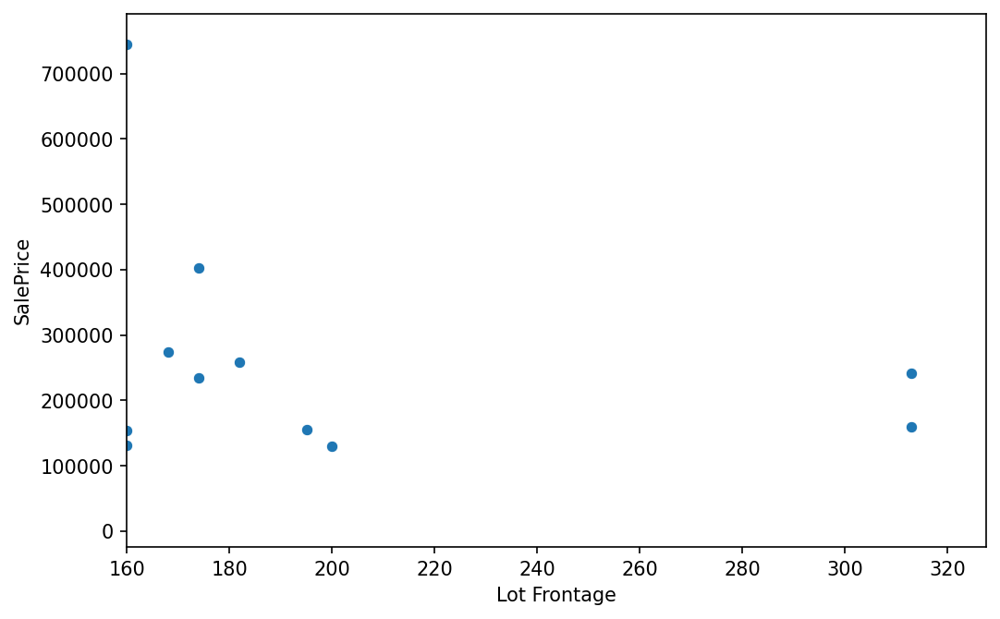

In [90]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[3],y='SalePrice',data=df)
plt.xlim(160,)

* Seeing the plots i feel lot frontage over 160 are outliers with regards to sale price
* Therefore Eliminating them

In [91]:
df = df[df['Lot Frontage']<160]

<Axes: xlabel='Lot Frontage', ylabel='SalePrice'>

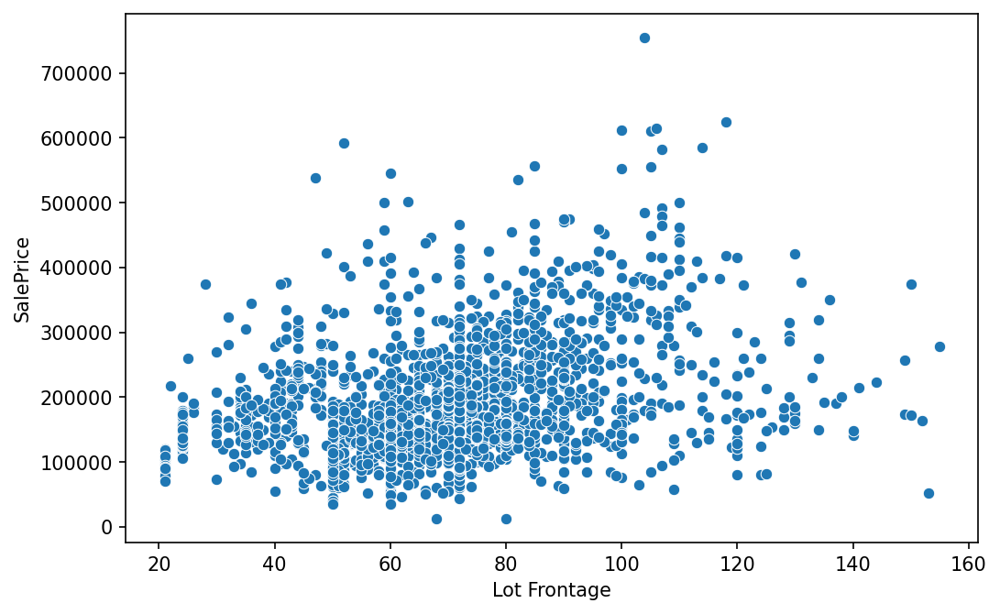

In [92]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[3],y='SalePrice',data=df)

In [93]:
cor = df.corr()['Lot Frontage']
np.abs(cor).sort_values(ascending=False)

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\2927595191.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()['Lot Frontage']


Lot Frontage       1.000000
MS SubClass        0.440241
1st Flr SF         0.415431
SalePrice          0.360841
Lot Area           0.352600
Garage Area        0.338531
Gr Liv Area        0.337432
TotRms AbvGrd      0.326552
Total Bsmt SF      0.323657
Garage Cars        0.300109
Bedroom AbvGr      0.237285
Fireplaces         0.236796
Mas Vnr Area       0.211153
Overall Qual       0.198229
Full Bath          0.182526
BsmtFin SF 1       0.163271
Open Porch SF      0.144870
Bsmt Unf SF        0.130493
Year Built         0.125101
Wood Deck SF       0.110334
PID                0.097927
Screen Porch       0.086190
Bsmt Full Bath     0.081615
Year Remod/Add     0.077691
Overall Cond       0.073857
BsmtFin SF 2       0.055238
Misc Val           0.044046
Half Bath          0.040743
Pool Area          0.038750
3Ssn Porch         0.032750
Bsmt Half Bath     0.020692
2nd Flr SF         0.017850
Kitchen AbvGr      0.011638
Low Qual Fin SF    0.011144
Enclosed Porch     0.010452
Mo Sold            0

* There are no features which are highly correlated to 'Lot Frontage'

In [94]:
num.append(col[3])
num

['Lot Frontage']

In [95]:
df[col[4]]

0       31770
1       11622
2       14267
3       11160
4       13830
        ...  
2925     7937
2926     8885
2927    10441
2928    10010
2929     9627
Name: Lot Area, Length: 2919, dtype: int64

In [96]:
df[col[4]].describe()

count      2919.000000
mean      10080.371703
std        7764.646156
min        1300.000000
25%        7430.500000
50%        9400.000000
75%       11500.000000
max      215245.000000
Name: Lot Area, dtype: float64

<Axes: xlabel='Lot Area'>

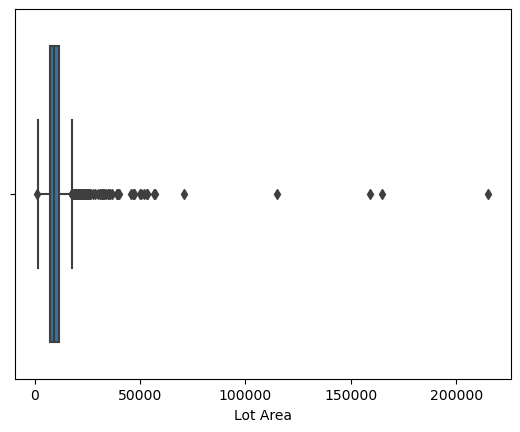

In [97]:
sns.boxplot(x=col[4],data=df)

(0.0, 50000.0)

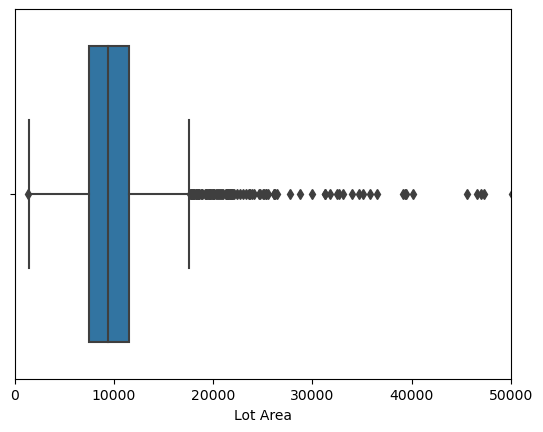

In [98]:
sns.boxplot(x=col[4],data=df)
plt.xlim(0,50000)

<Axes: xlabel='Lot Area', ylabel='SalePrice'>

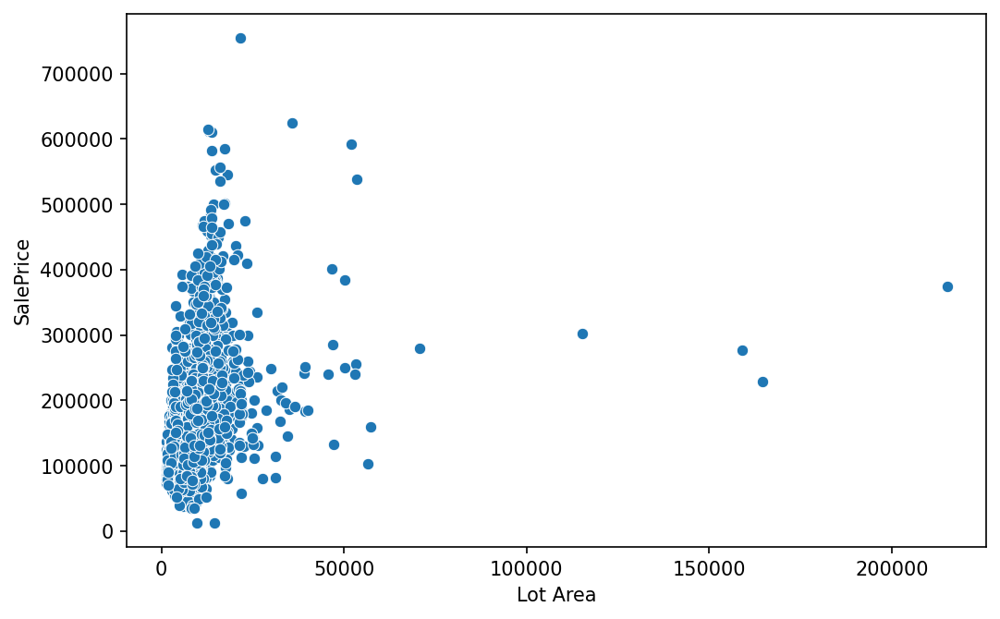

In [99]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[4],y='SalePrice',data=df)

(0.0, 100000.0)

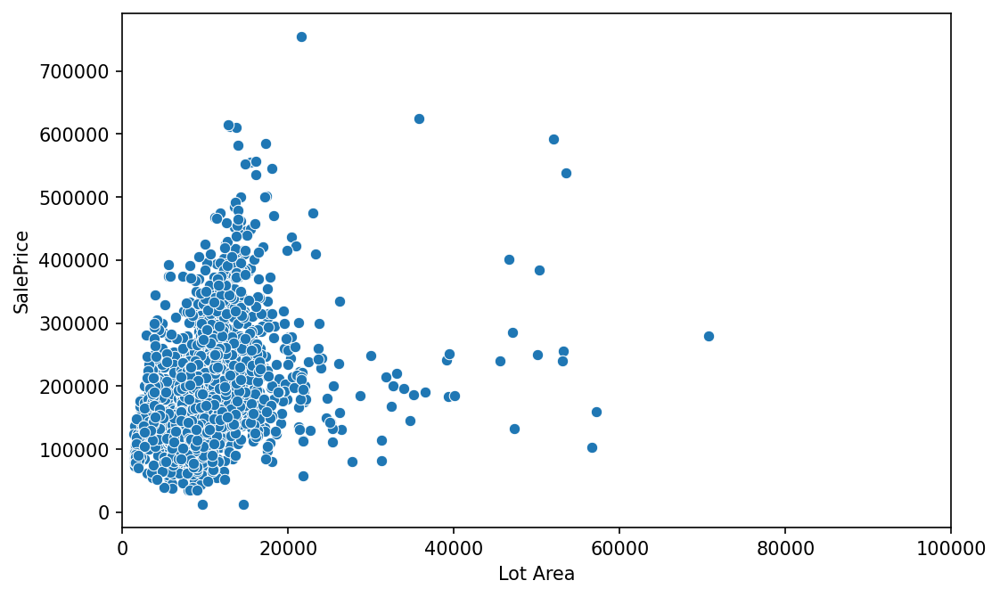

In [100]:
plt.figure(figsize=(8,5),dpi=150)
sns.scatterplot(x=col[4],y='SalePrice',data=df)
plt.xlim(0,100000)

<Axes: xlabel='Lot Area', ylabel='SalePrice'>

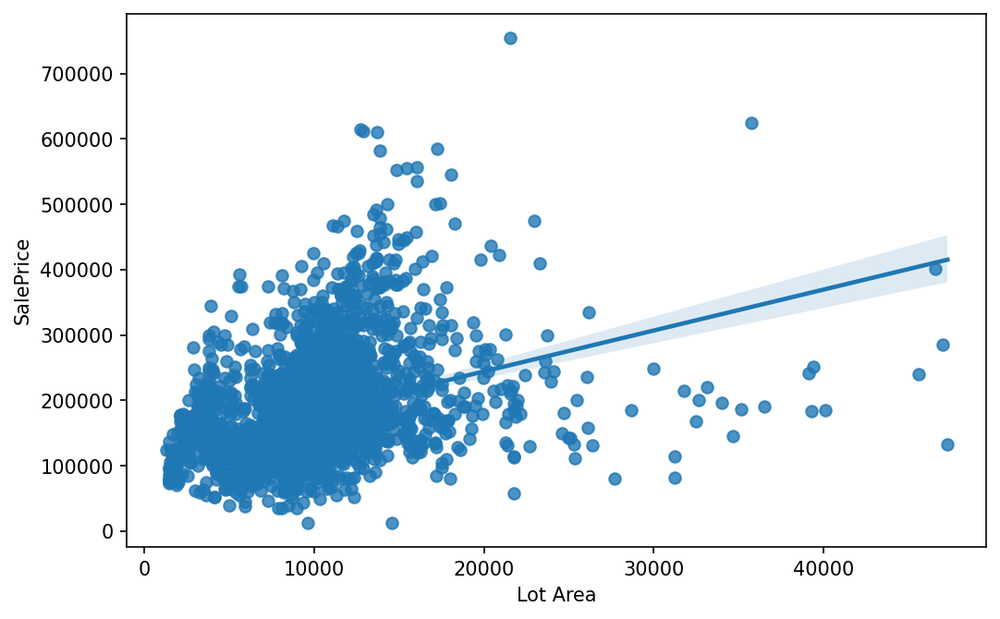

In [101]:
plt.figure(figsize=(8,5),dpi=150)
sns.regplot(x=col[4],y='SalePrice',data=df[df['Lot Area']<50000])

<Axes: xlabel='Lot Area', ylabel='SalePrice'>

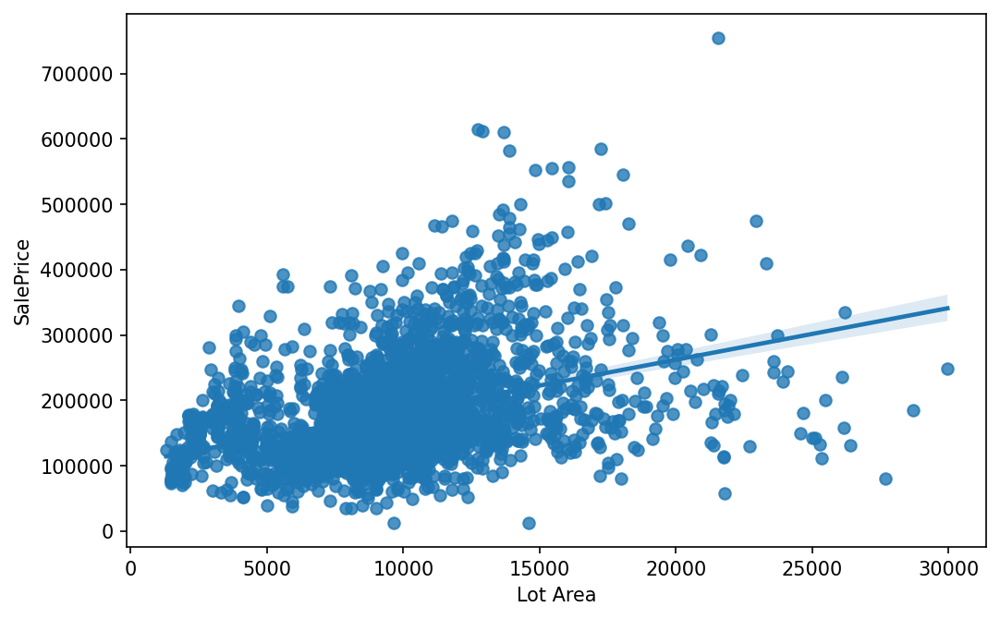

In [102]:
plt.figure(figsize=(8,5),dpi=150)
sns.regplot(x=col[4],y='SalePrice',data=df[df['Lot Area']<30000])

* From the above plots i feel  Lot area values over 60000 are outliers with
regards to Sale price
* It looks like Sale price increases with increase in lot area
* Therefore this could be an important feature for us

In [103]:
num.append(col[4])
num

['Lot Frontage', 'Lot Area']

In [104]:
df[col[5]]

0       Pave
1       Pave
2       Pave
3       Pave
4       Pave
        ... 
2925    Pave
2926    Pave
2927    Pave
2928    Pave
2929    Pave
Name: Street, Length: 2919, dtype: object

In [105]:
df[col[5]].value_counts()

Pave    2908
Grvl      11
Name: Street, dtype: int64

<Axes: xlabel='Street', ylabel='count'>

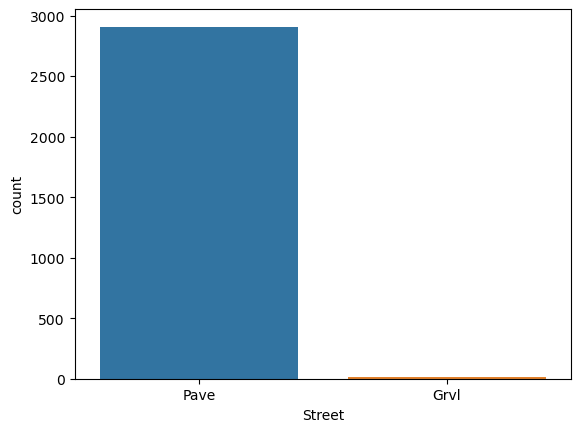

In [106]:
sns.countplot(x=col[5],data=df)

<Axes: xlabel='Street', ylabel='SalePrice'>

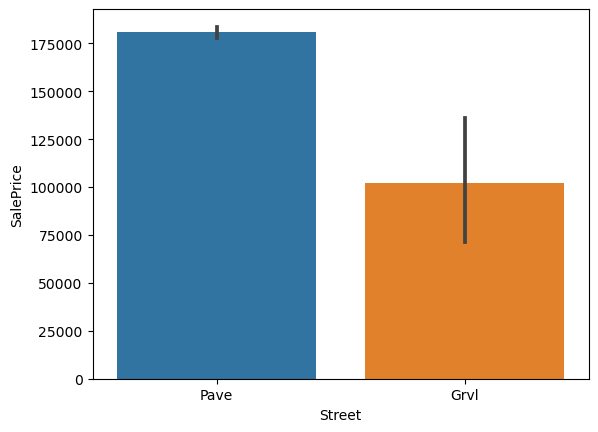

In [107]:
sns.barplot(x='Street',y='SalePrice',data=df)

* It looks like houses with Pave street type costs more than grvl
* This could be an important feature for us

In [108]:
cat.append(col[5])
cat

['MS SubClass', 'MS Zoning', 'Street']

In [109]:
col[6]

'Alley'

In [110]:
df[col[6]]

0       None
1       None
2       None
3       None
4       None
        ... 
2925    None
2926    None
2927    None
2928    None
2929    None
Name: Alley, Length: 2919, dtype: object

In [111]:
df[col[6]].value_counts()

None    2721
Grvl     120
Pave      78
Name: Alley, dtype: int64

<Axes: xlabel='Alley', ylabel='count'>

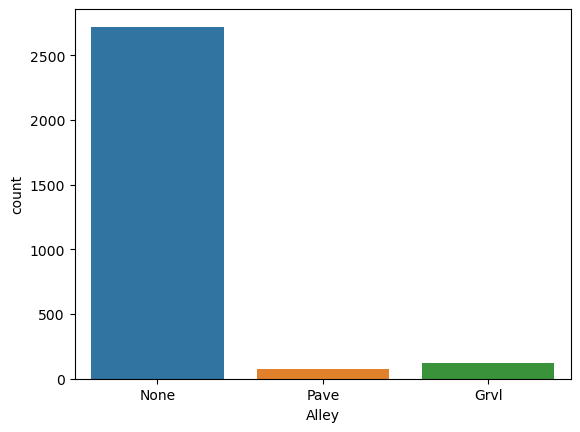

In [112]:
sns.countplot(x=col[6],data=df)

* Looks like most of the properties dont have alley access

<Axes: xlabel='Alley', ylabel='SalePrice'>

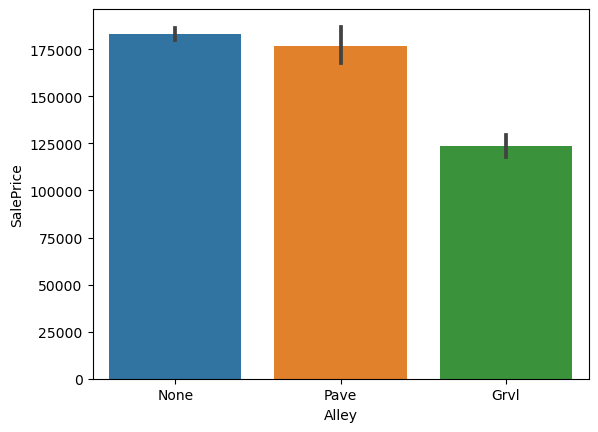

In [113]:
sns.barplot(x=col[6],y='SalePrice',data=df)

<Axes: xlabel='Alley', ylabel='SalePrice'>

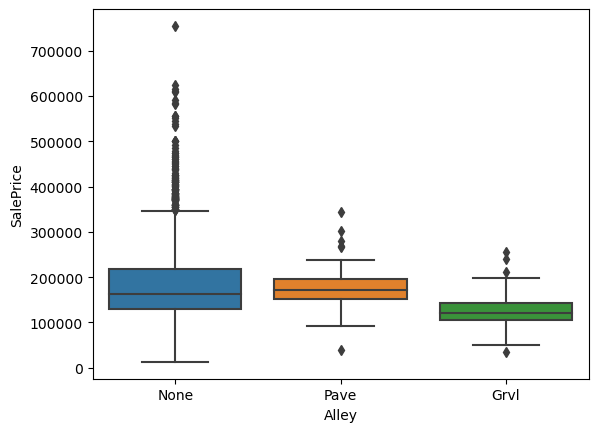

In [114]:
sns.boxplot(x=col[6],y='SalePrice',data=df)

* Looks like properties with gravel typr alley acess are cheaper compared to rest
* This could be an important feature

In [115]:
cat.append(col[6])
cat

['MS SubClass', 'MS Zoning', 'Street', 'Alley']

In [116]:
col[7]

'Lot Shape'

In [117]:
df[col[7]].value_counts()

Reg    1855
IR1     976
IR2      75
IR3      13
Name: Lot Shape, dtype: int64

<Axes: xlabel='Lot Shape', ylabel='count'>

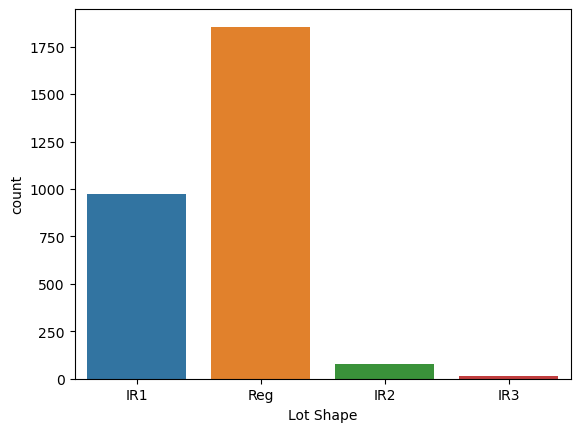

In [118]:
sns.countplot(x=col[7],data=df)

* Most common lot shapes are reg and IR1

<Axes: xlabel='Lot Shape', ylabel='SalePrice'>

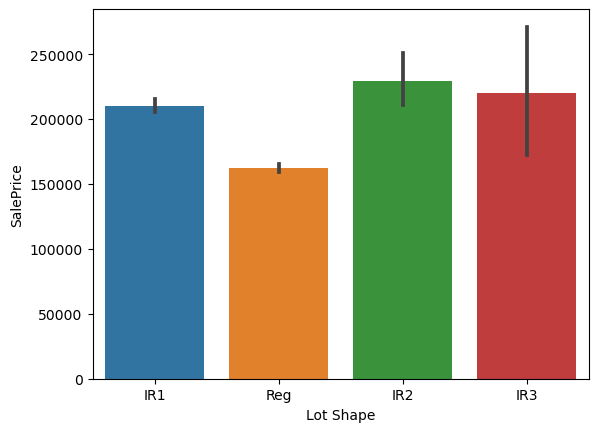

In [119]:
sns.barplot(x=col[7],y='SalePrice',data=df)

<Axes: xlabel='Lot Shape', ylabel='SalePrice'>

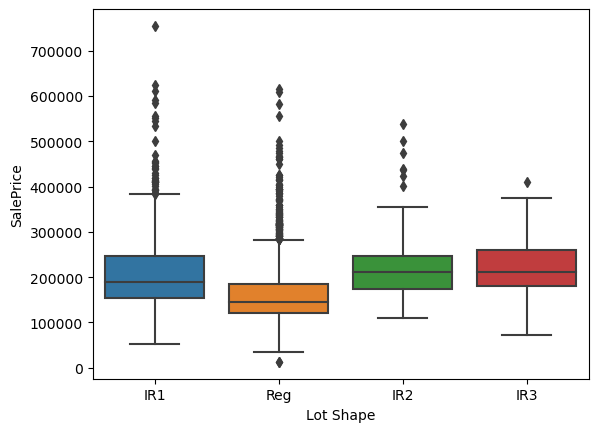

In [120]:
sns.boxplot(x=col[7],y='SalePrice',data=df)

* There are very less properties with lot shape IR2,IR3 and their sale price is also similar therefore i am creating labels and grouping these 2 in 1 label

In [121]:
df[col[7]]=df[col[7]].apply(lambda x: 0 if x in ['IR2','IR3'] else (1 if x=='IR1' else 2))


C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\3928031428.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col[7]]=df[col[7]].apply(lambda x: 0 if x in ['IR2','IR3'] else (1 if x=='IR1' else 2))


<Axes: xlabel='Lot Shape', ylabel='SalePrice'>

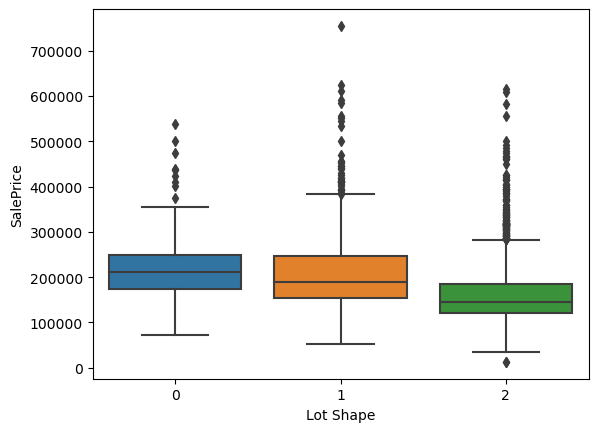

In [122]:
sns.boxplot(x=col[7],y='SalePrice',data=df)

In [123]:
num.append(col[7])
num

['Lot Frontage', 'Lot Area', 'Lot Shape']

In [124]:
col[8]

'Land Contour'

In [125]:
df[col[8]].value_counts()

Lvl    2625
HLS     118
Bnk     116
Low      60
Name: Land Contour, dtype: int64

<Axes: xlabel='Land Contour', ylabel='count'>

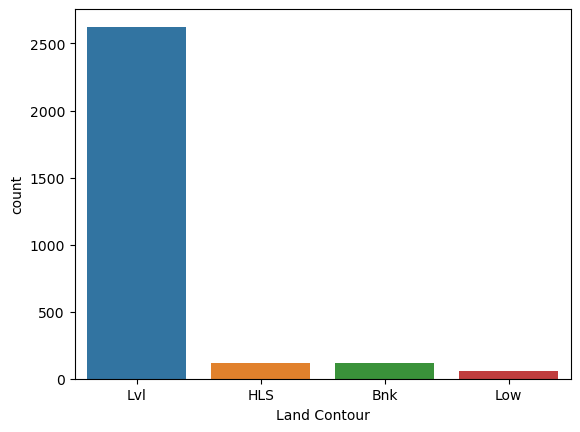

In [126]:
sns.countplot(x=col[8],data=df)

* Most of the properties are of Land Contot type Lvl

<Axes: xlabel='Land Contour', ylabel='SalePrice'>

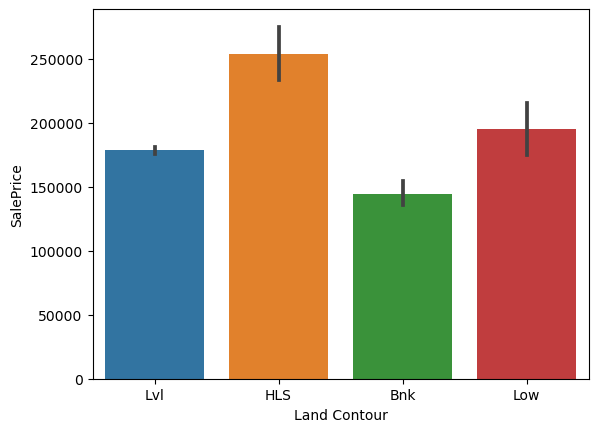

In [127]:
sns.barplot(x=col[8],y='SalePrice',data=df)

<Axes: xlabel='Land Contour', ylabel='SalePrice'>

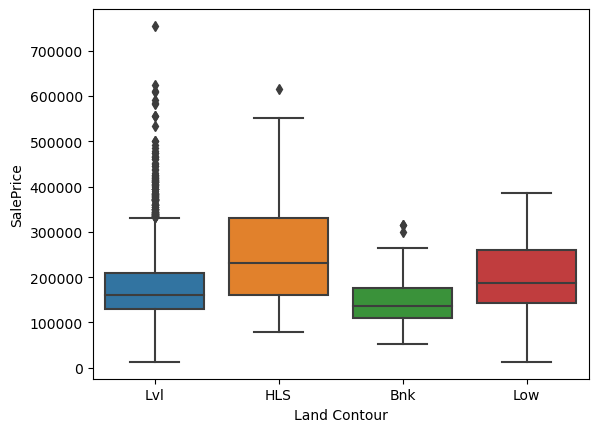

In [128]:
sns.boxplot(x=col[8],y='SalePrice',data=df)

* Properties with Land Contour type HLS is the costliest
* Properties with Land Contour type Bnk is the cheapest

In [129]:
cat.append(col[8])
cat

['MS SubClass', 'MS Zoning', 'Street', 'Alley', 'Land Contour']

In [130]:
col[9]

'Utilities'

In [131]:
df[col[9]].value_counts()

AllPub    2916
NoSewr       2
NoSeWa       1
Name: Utilities, dtype: int64

<Axes: xlabel='Utilities', ylabel='count'>

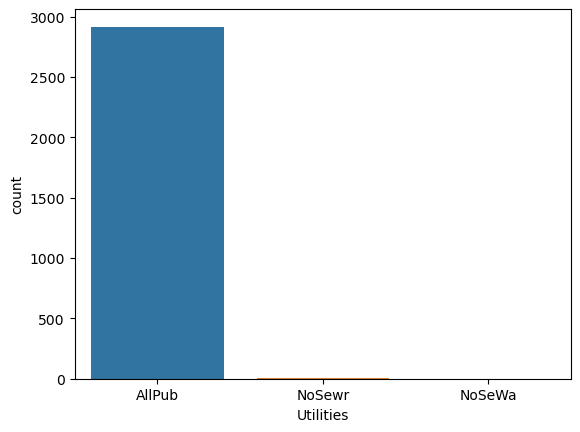

In [132]:
sns.countplot(x=col[9],data=df)

<Axes: xlabel='Utilities', ylabel='SalePrice'>

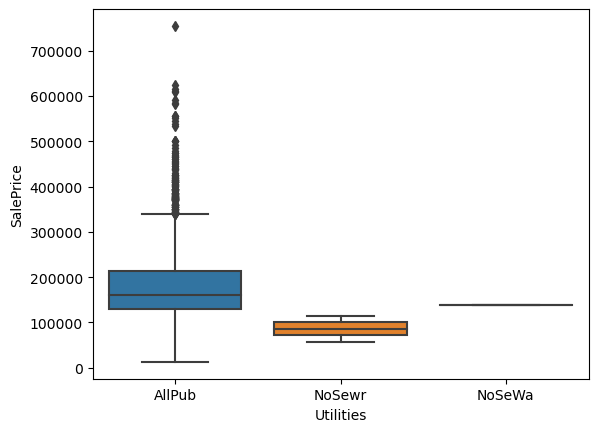

In [133]:
sns.boxplot(x=col[9],y='SalePrice',data=df)

<Axes: xlabel='Utilities', ylabel='SalePrice'>

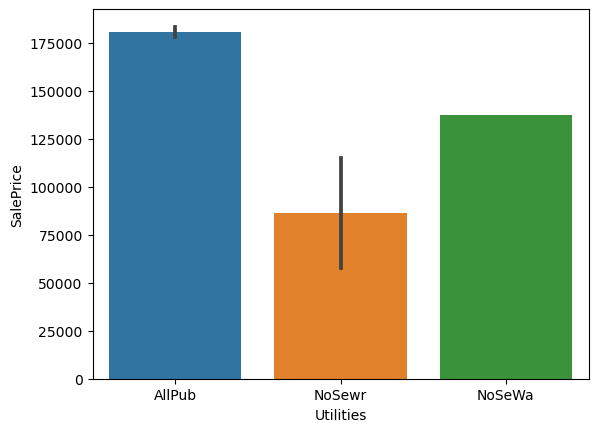

In [134]:
sns.barplot(x=col[9],y='SalePrice',data=df)

* Looks like SalePrice is different for different utilities

In [135]:
cat.append(col[9])
cat

['MS SubClass', 'MS Zoning', 'Street', 'Alley', 'Land Contour', 'Utilities']

In [136]:
col[10]

'Lot Config'

In [137]:
df[col[10]].value_counts()

Inside     2135
Corner      507
CulDSac     179
FR2          84
FR3          14
Name: Lot Config, dtype: int64

In [138]:
def plot_cat(col):
  plt.figure(figsize=(10,5),dpi=150)
  sns.countplot(x=col,data=df)
  plt.xticks(rotation=90)
  plt.plot()

  plt.figure(figsize=(10,5),dpi=150)
  sns.barplot(x=col,y='SalePrice',data=df)
  plt.xticks(rotation=90)
  plt.plot()

  plt.figure(figsize=(10,5),dpi=150)
  sns.boxplot(x=col,y='SalePrice',data=df)
  plt.xticks(rotation=90)
  plt.plot()

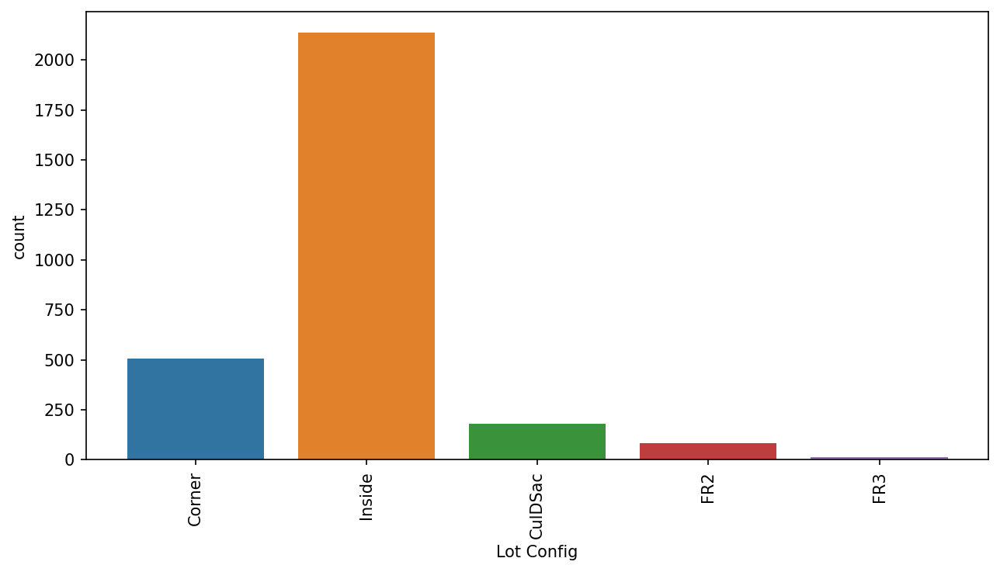

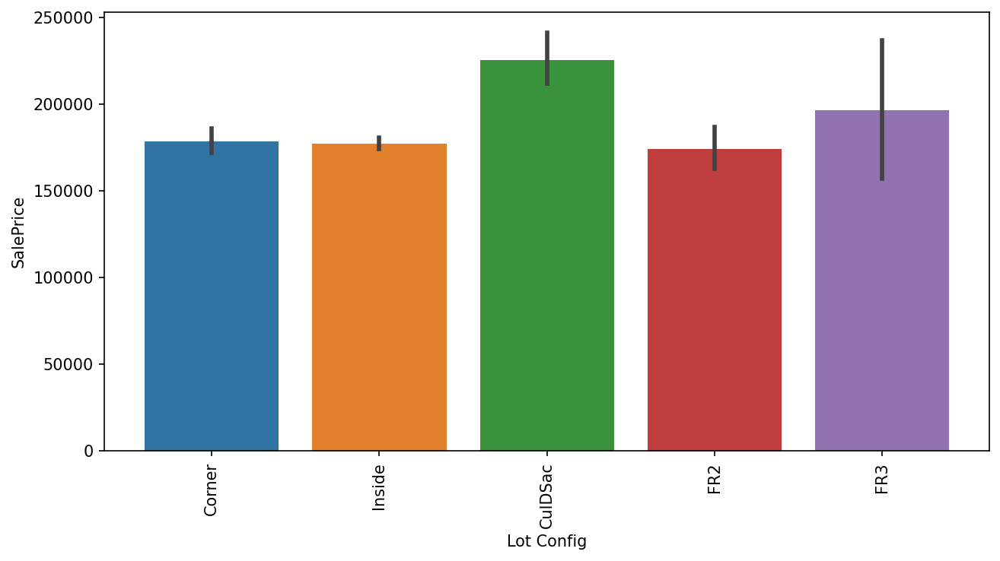

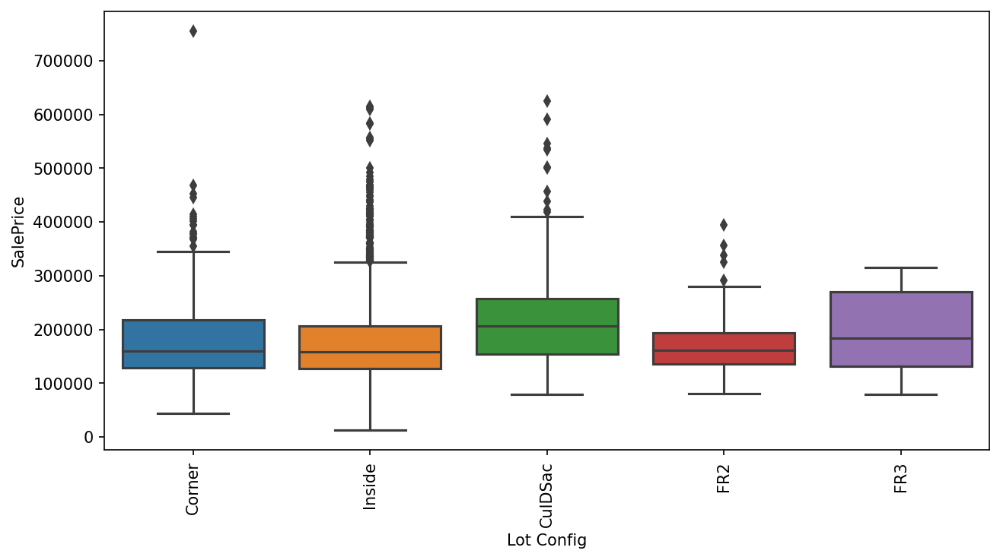

In [139]:
plot_cat(col[10])

* Most of the properties have lot Config type Corner or inside
* Sale price is different with respect to different lot config
* This could be an important feature

In [140]:
cat.append(col[10])

In [141]:
col[11]

'Land Slope'

In [143]:
df[col[11]].value_counts()

Gtl    2779
Mod     124
Sev      16
Name: Land Slope, dtype: int64

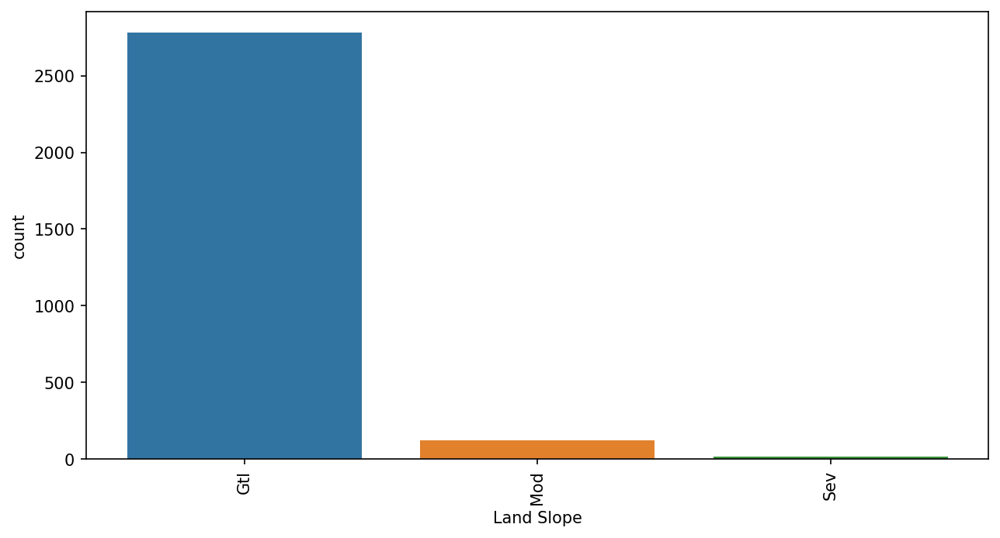

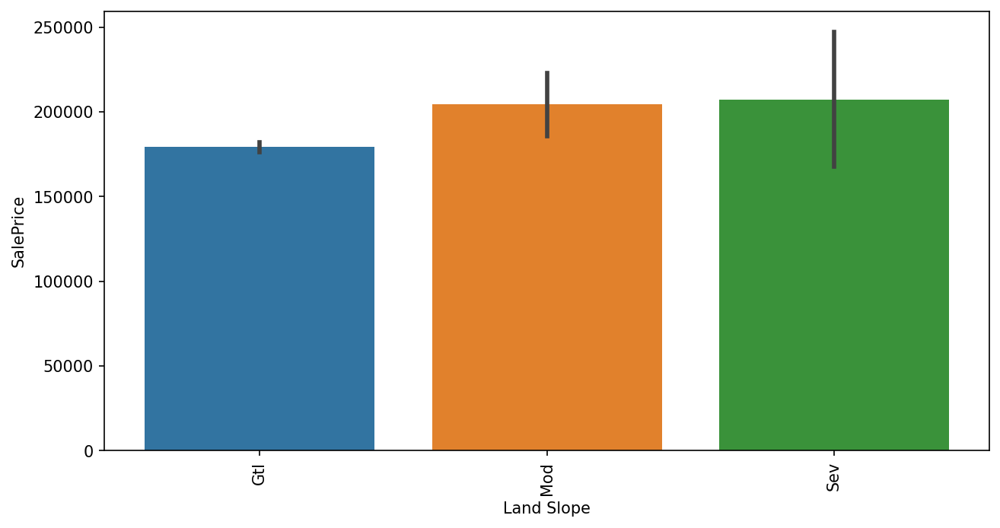

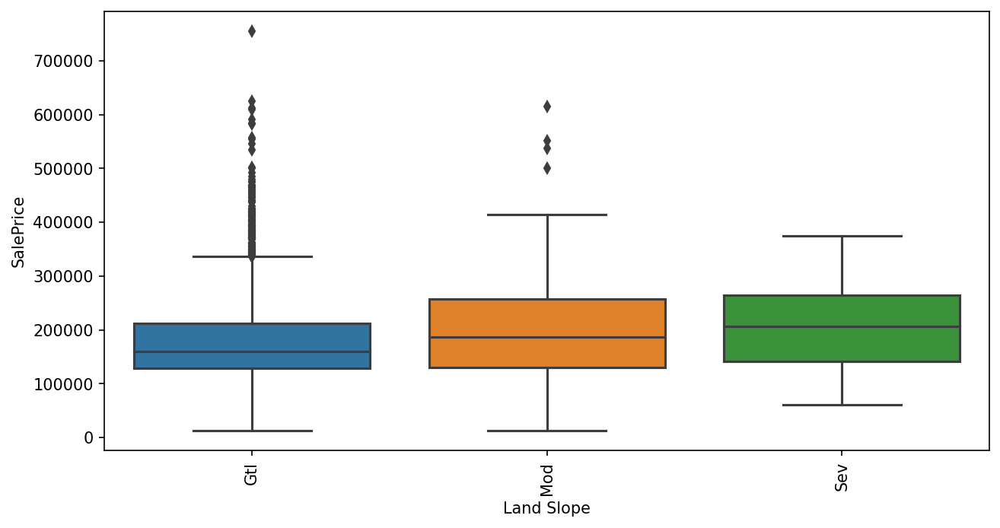

In [144]:
plot_cat(col[11])

* Most properties have land slope type Gtl
* As there are very less instances of land slope Mod,Sev and their corresponding sale price is also similar i have decided to group these 2 as in one category
* I am creating labels for this feature

In [145]:
df[col[11]] = df[col[11]].apply(lambda x: 1 if x=='Gtl' else 0)

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\87669800.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col[11]] = df[col[11]].apply(lambda x: 1 if x=='Gtl' else 0)


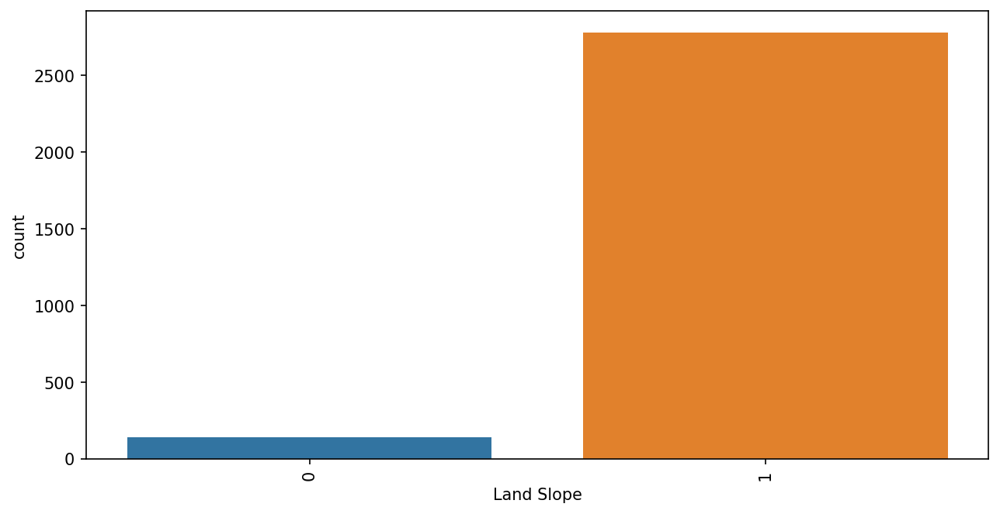

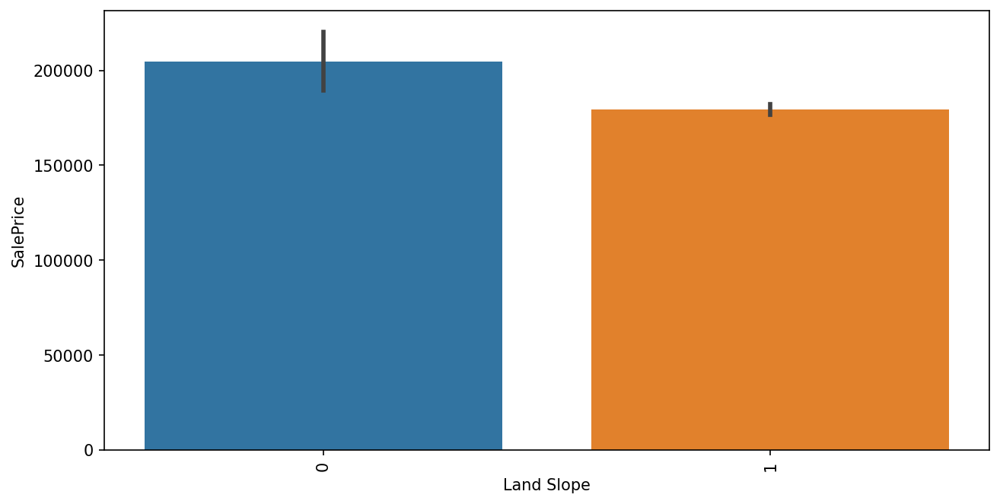

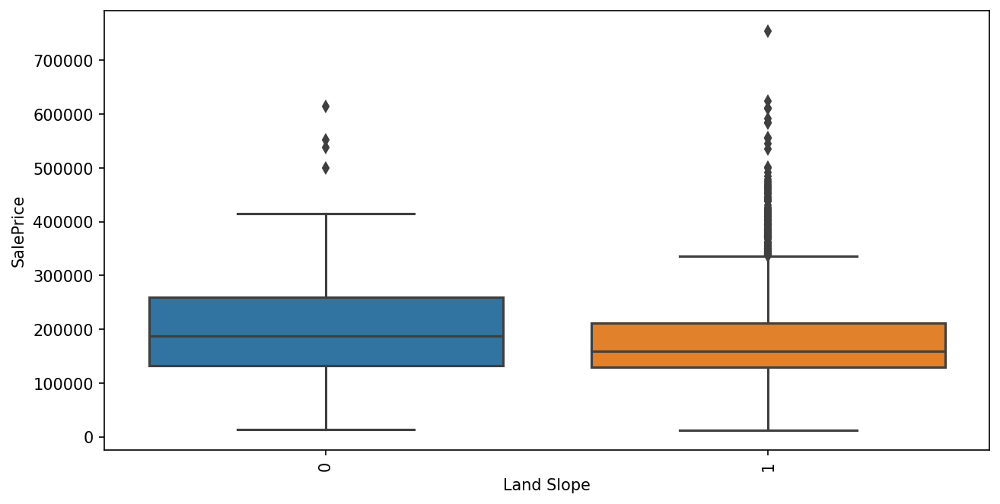

In [146]:
plot_cat(col[11])

In [147]:
cat.append(col[11])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope']

In [148]:
col[12]

'Neighborhood'

In [149]:
df[col[12]].value_counts()

NAmes      441
CollgCr    267
OldTown    239
Edwards    193
Somerst    182
NridgHt    166
Gilbert    161
Sawyer     151
NWAmes     131
SawyerW    125
Mitchel    112
BrkSide    108
Crawfor    103
IDOTRR      93
Timber      72
NoRidge     69
StoneBr     51
SWISU       48
ClearCr     44
MeadowV     37
BrDale      30
Blmngtn     28
Veenker     24
NPkVill     23
Blueste     10
Greens       8
GrnHill      2
Landmrk      1
Name: Neighborhood, dtype: int64

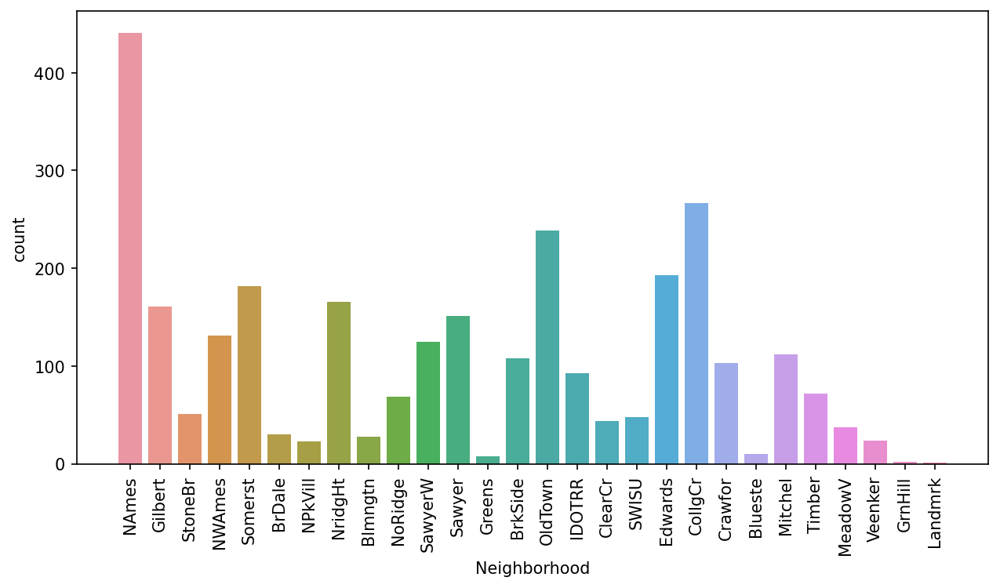

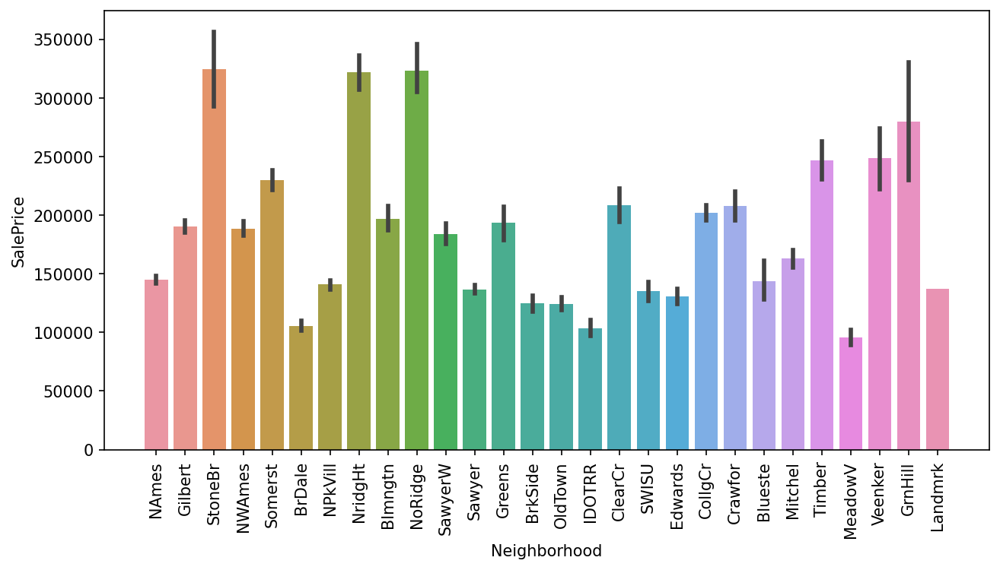

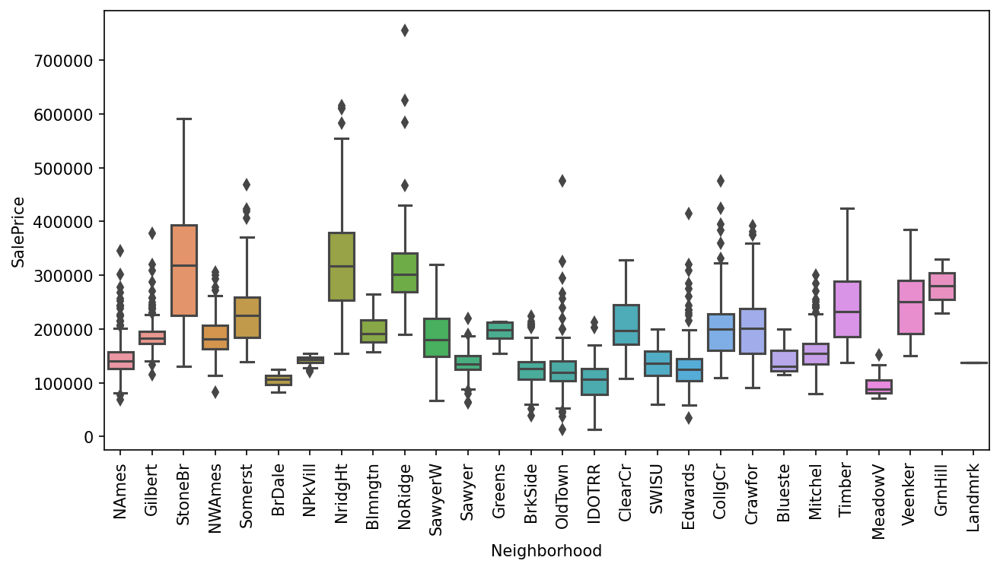

In [150]:
plot_cat(col[12])

* We can see that  property prices are varying in different neighbourhoods
* This could be an important feature for us

In [151]:
cat.append(col[12])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood']

In [152]:
col[13]

'Condition 1'

In [153]:
df[col[13]].value_counts()

Norm      2515
Feedr      163
Artery      90
RRAn        50
PosN        39
RRAe        28
PosA        19
RRNn         9
RRNe         6
Name: Condition 1, dtype: int64

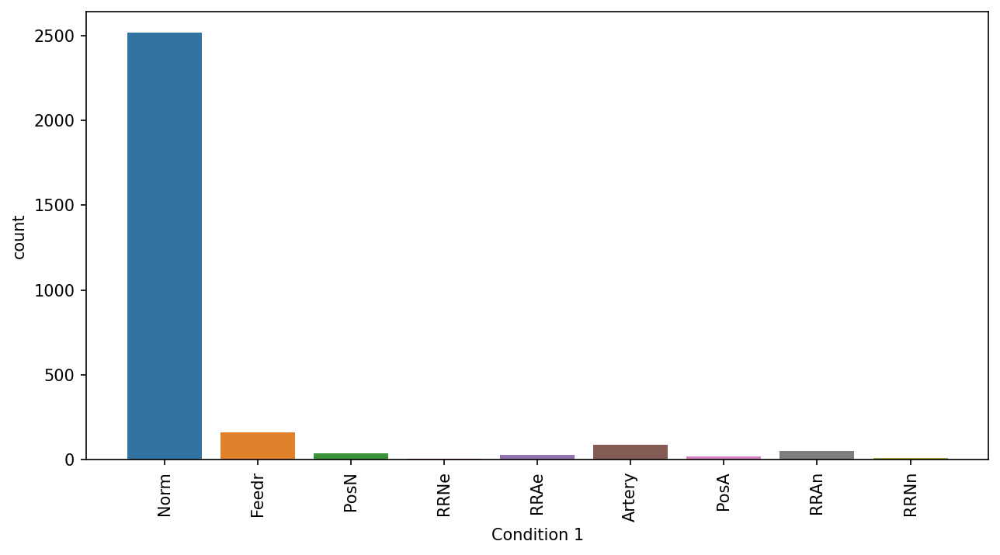

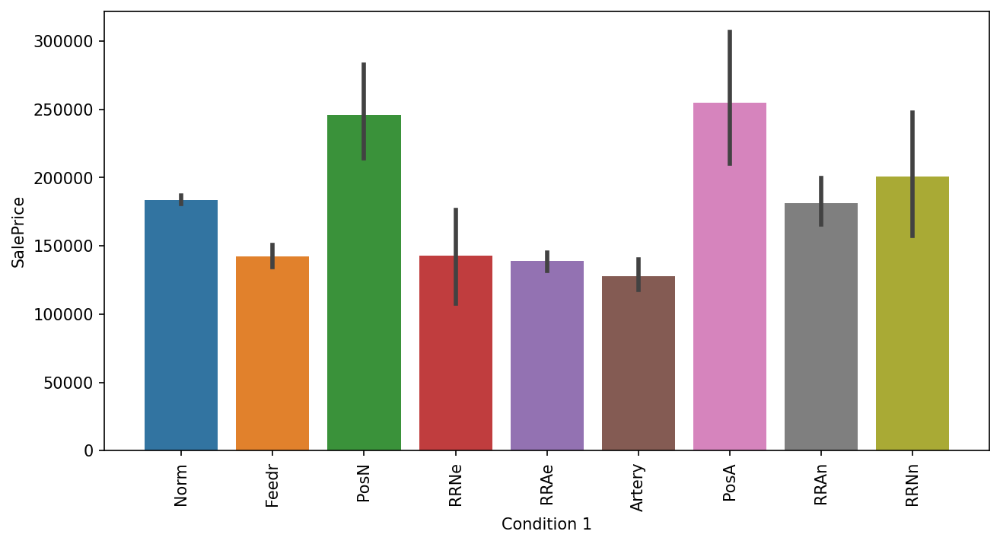

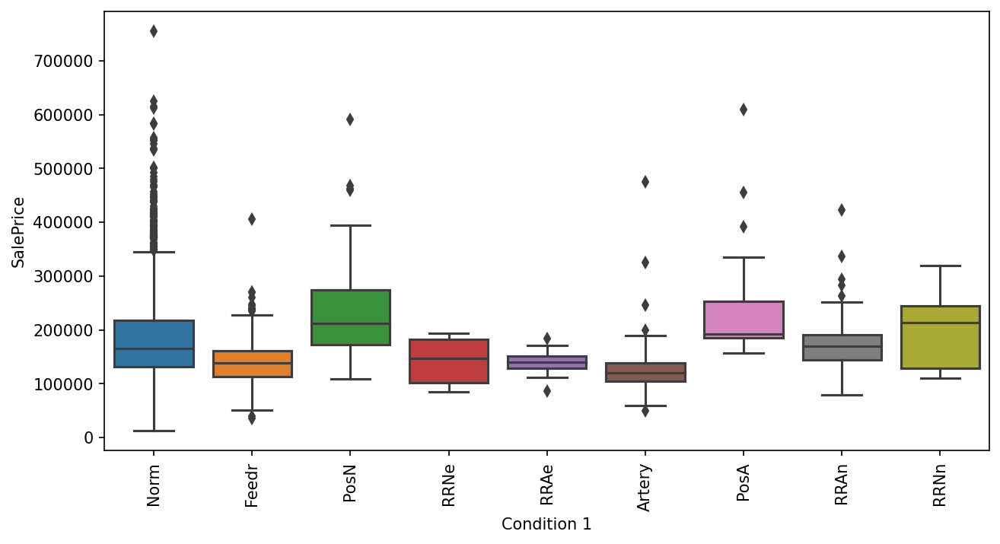

In [154]:
plot_cat(col[13])

* Most of the properties are of condition 1 type Norm
* Different values for Conditions 1 correspond to different sale process

In [155]:
cat.append(col[13])

In [156]:
col[14]

'Condition 2'

In [157]:
df[col[14]]

0       Norm
1       Norm
2       Norm
3       Norm
4       Norm
        ... 
2925    Norm
2926    Norm
2927    Norm
2928    Norm
2929    Norm
Name: Condition 2, Length: 2919, dtype: object

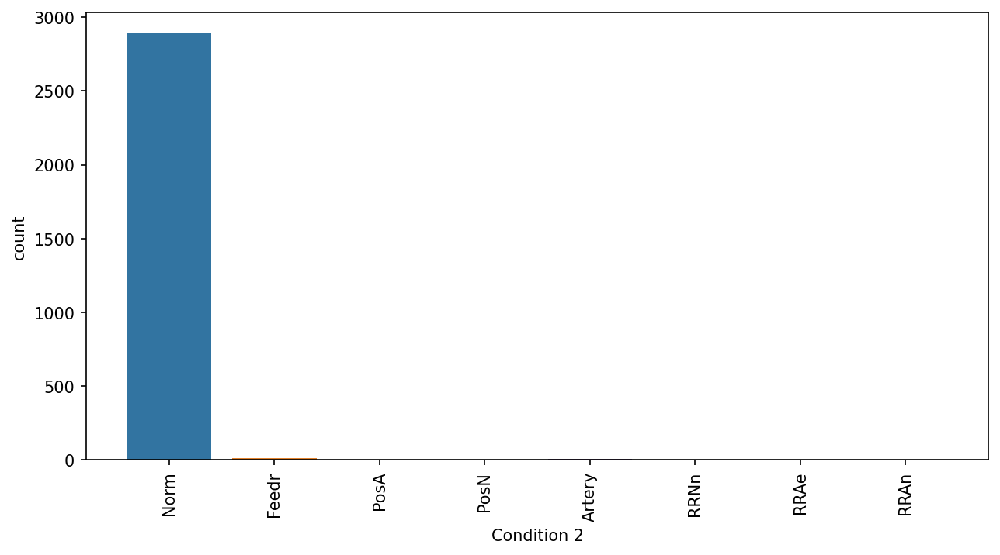

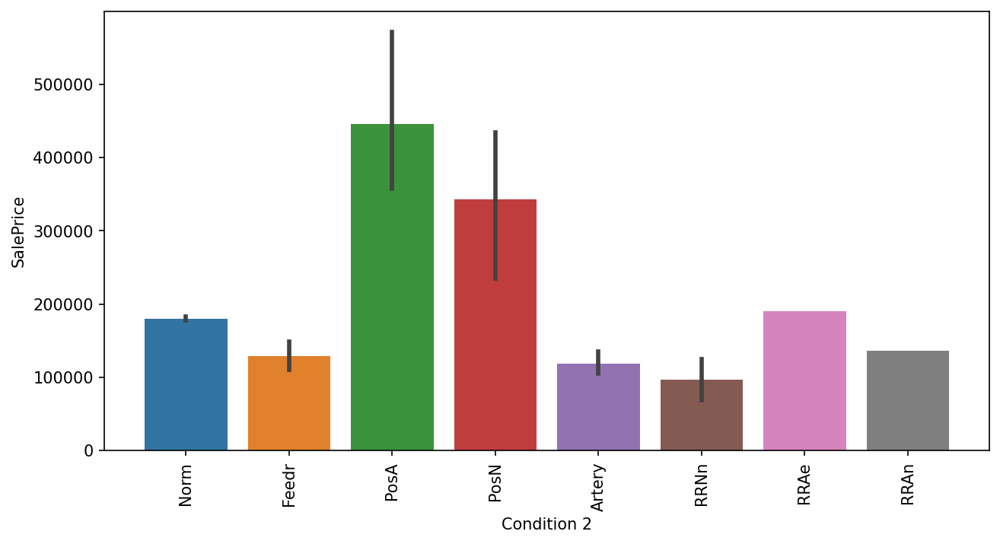

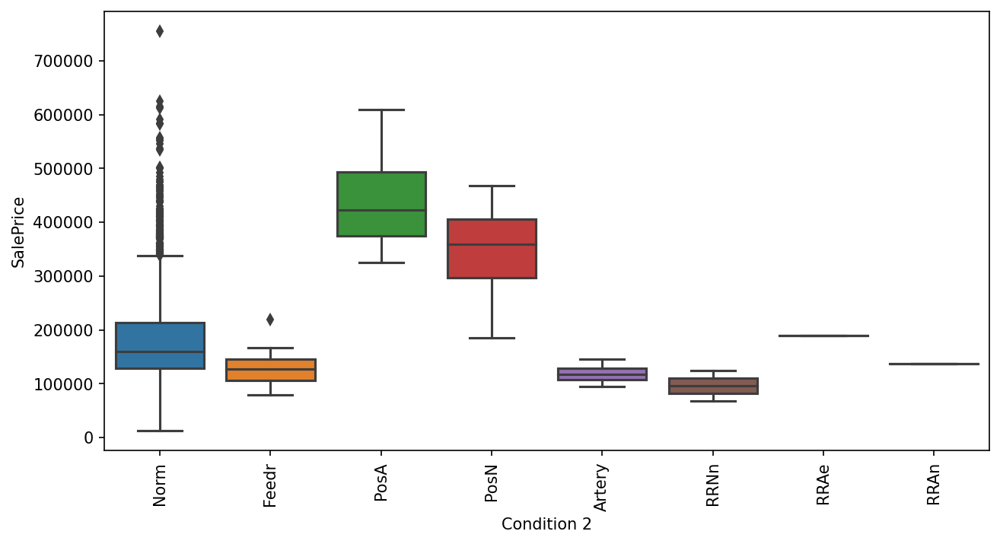

In [158]:
plot_cat(col[14])

* Most of the properties are of condition 2 type PosA or PosN
* Different values for Conditions 2 correspond to different sale process

In [159]:
cat.append(col[14])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2']

In [160]:
col[15]

'Bldg Type'

In [161]:
df[col[15]].value_counts()

1Fam      2415
TwnhsE     233
Duplex     109
Twnhs      101
2fmCon      61
Name: Bldg Type, dtype: int64

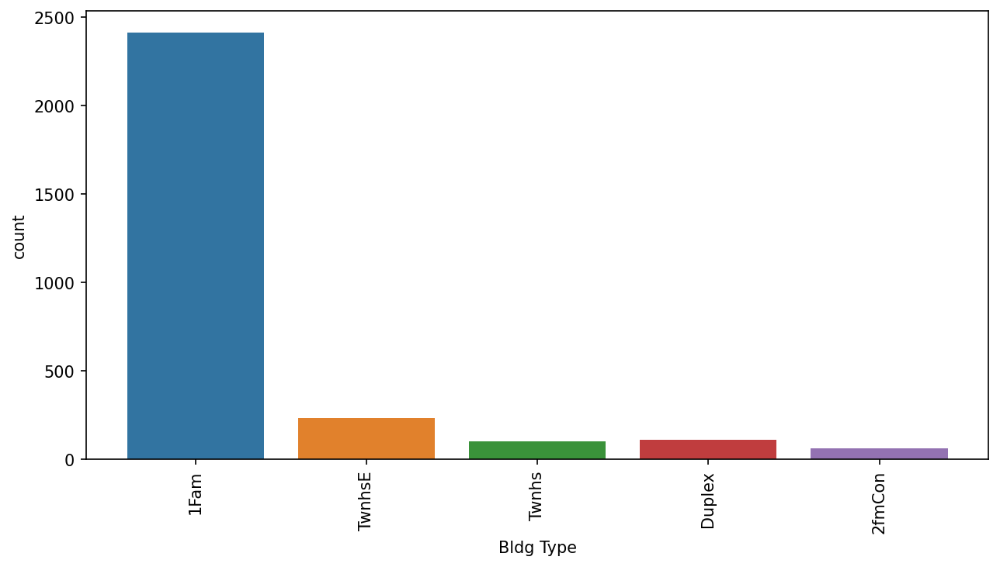

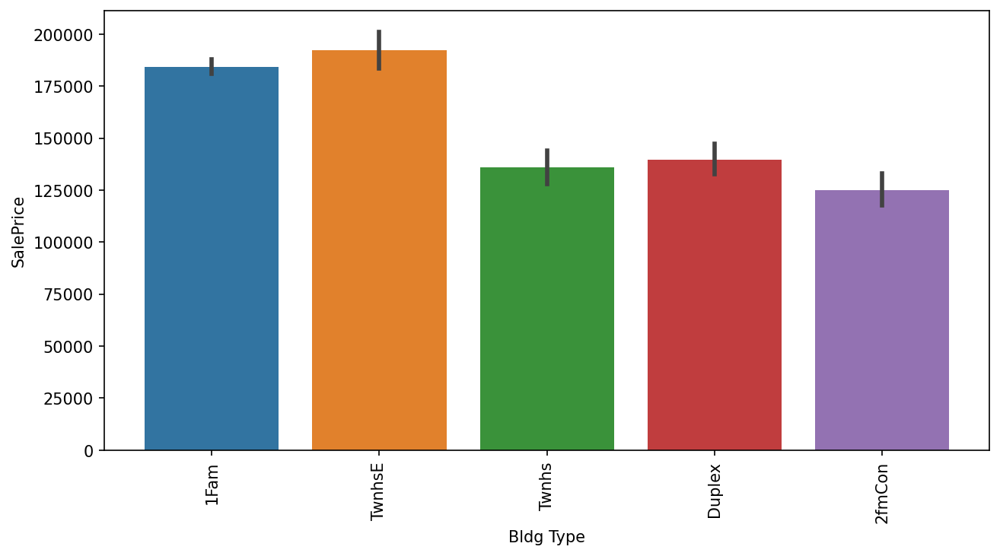

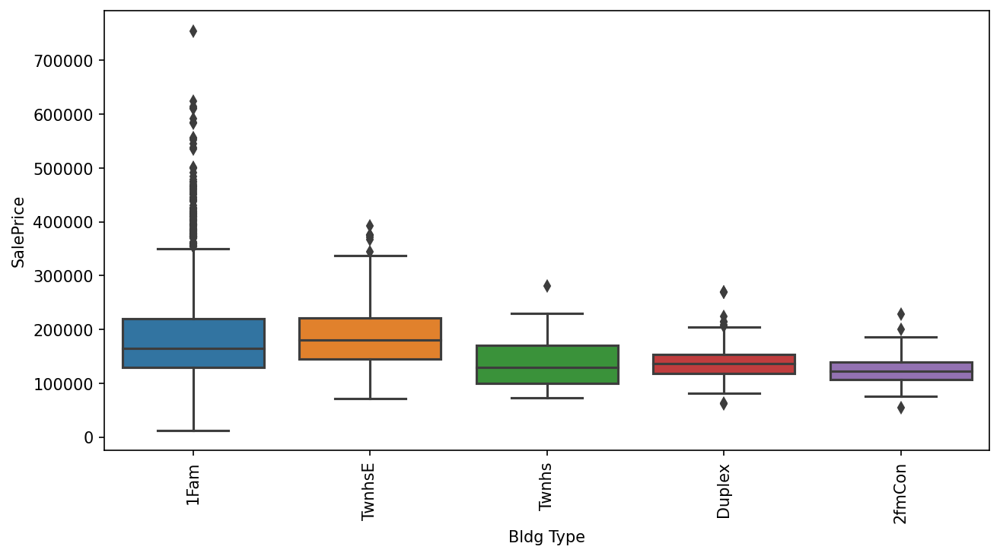

In [162]:
plot_cat(col[15])

* Most of the buildings are 1fam bldg type
* There are different sale prics for different bldg type

In [163]:
cat.append(col[15])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type']

In [164]:
df[col[16]].value_counts()

1Story    1475
2Story     868
1.5Fin     314
SLvl       128
SFoyer      83
2.5Unf      24
1.5Unf      19
2.5Fin       8
Name: House Style, dtype: int64

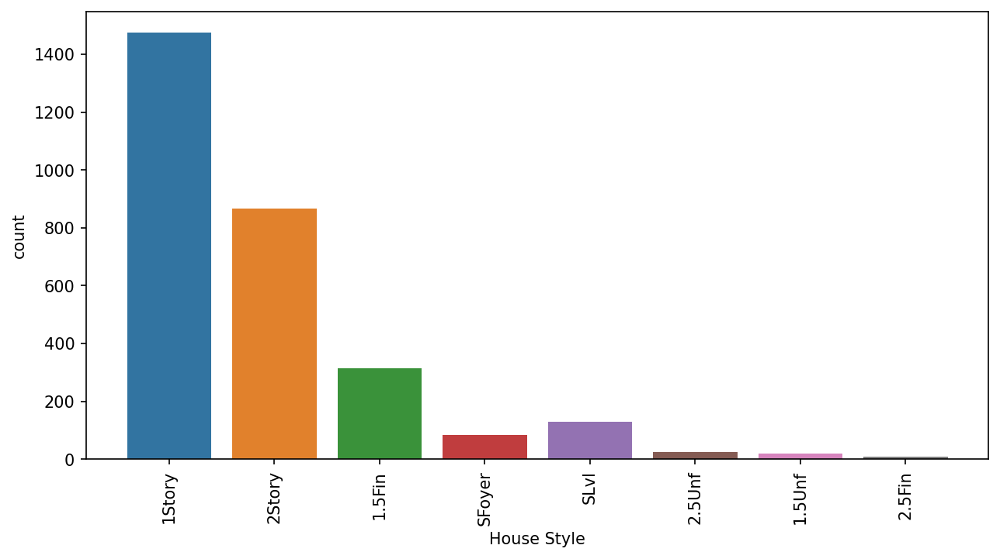

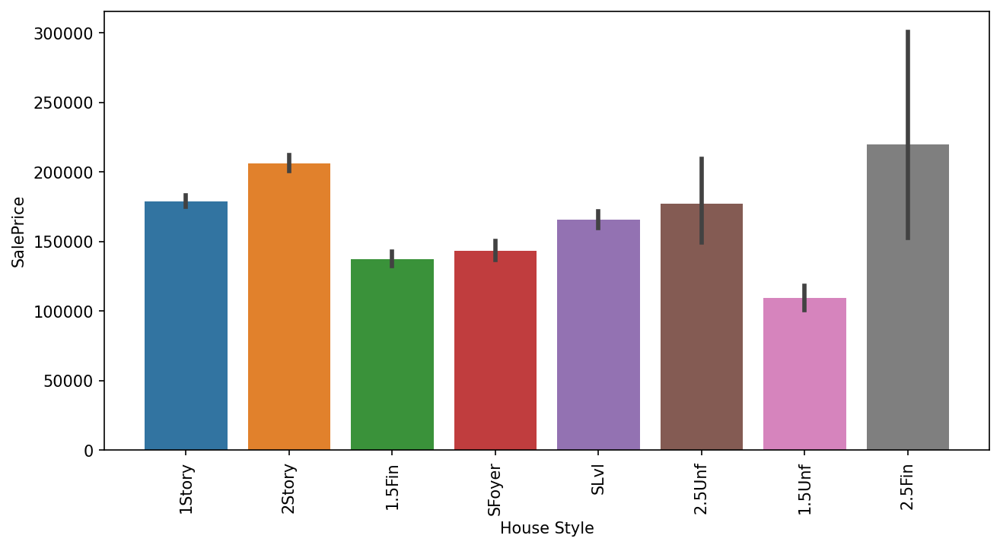

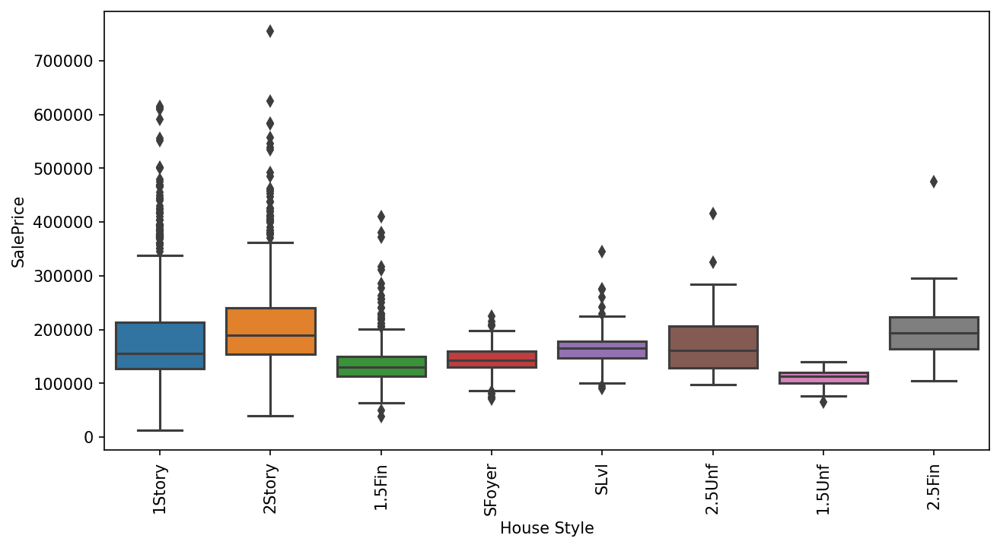

In [165]:
plot_cat(col[16])

* Most of the buildings are 1 story or 2 story
* We can see there are different sale prices for diferent house style

In [166]:
cat.append(col[16])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style']

In [167]:
col[17]

'Overall Qual'

In [168]:
df[col[17]].describe()

count    2919.000000
mean        6.091812
std         1.407338
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: Overall Qual, dtype: float64

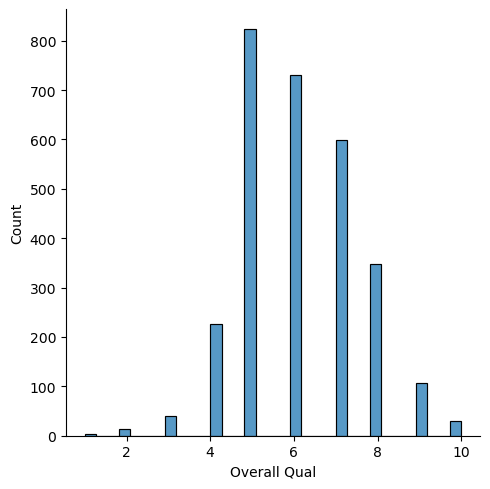

In [169]:
sns.displot(df[col[17]])

<Axes: xlabel='Overall Qual'>

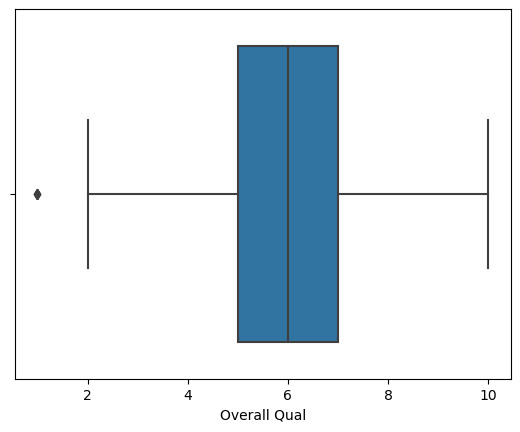

In [170]:
sns.boxplot(x=col[17],data=df)

<Axes: xlabel='Overall Qual', ylabel='SalePrice'>

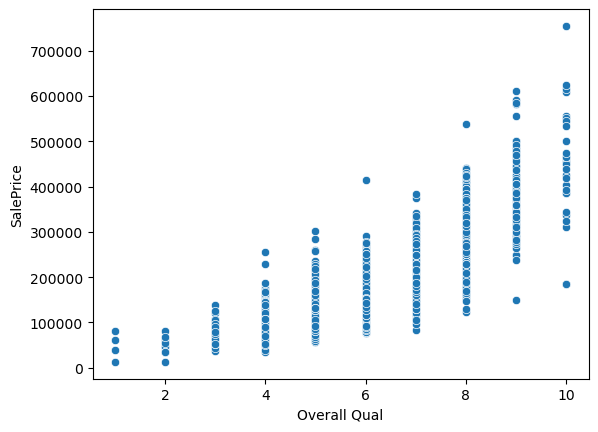

In [171]:
sns.scatterplot(x=col[17],y='SalePrice',data=df)

<Axes: xlabel='Overall Qual', ylabel='SalePrice'>

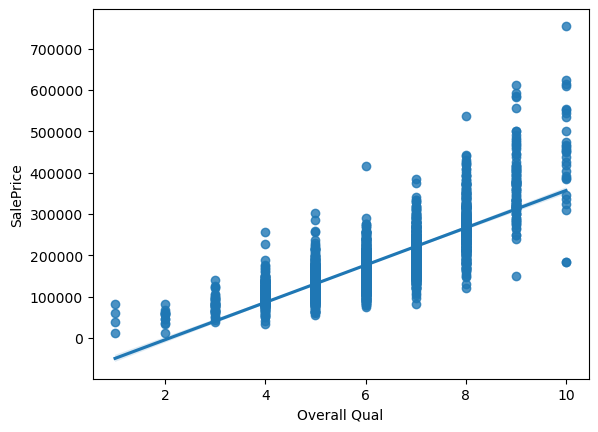

In [172]:
sns.regplot(x=col[17],y='SalePrice',data=df)

* We Can see sale price increased as overall quality increases
* This is an important feature for us

In [173]:
num.append(col[17])
num

['Lot Frontage', 'Lot Area', 'Lot Shape', 'Overall Qual']

In [174]:
col[18]

'Overall Cond'

In [175]:
df[col[18]].describe()

count    2919.000000
mean        5.563892
std         1.112246
min         1.000000
25%         5.000000
50%         5.000000
75%         6.000000
max         9.000000
Name: Overall Cond, dtype: float64

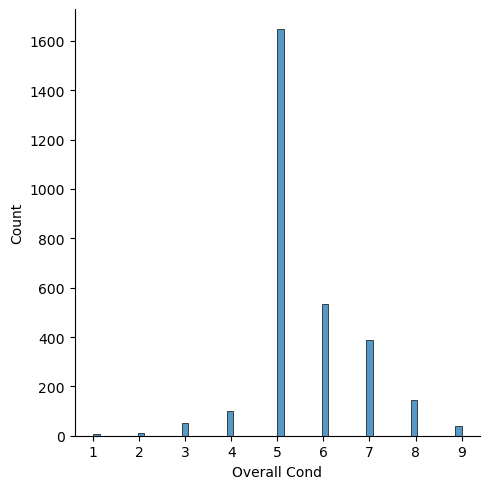

In [176]:
sns.displot(df[col[18]])

<Axes: xlabel='Overall Cond'>

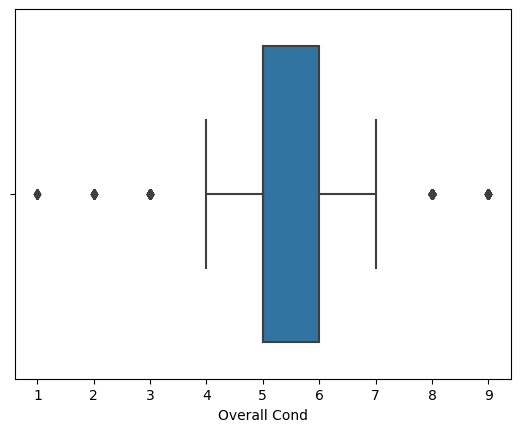

In [177]:
sns.boxplot(x=col[18],data=df)

<Axes: xlabel='Overall Cond', ylabel='SalePrice'>

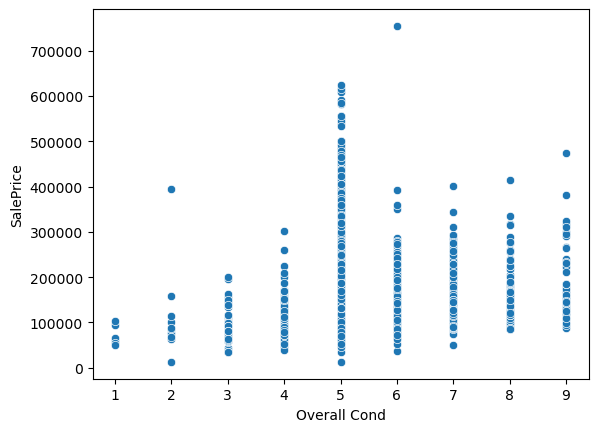

In [178]:
sns.scatterplot(x=col[18],y='SalePrice',data=df)

<Axes: xlabel='Overall Cond', ylabel='SalePrice'>

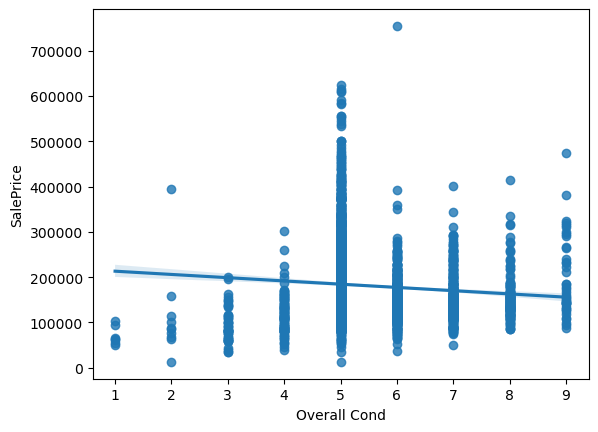

In [179]:
sns.regplot(x=col[18],y='SalePrice',data=df)

<Axes: xlabel='Overall Cond', ylabel='SalePrice'>

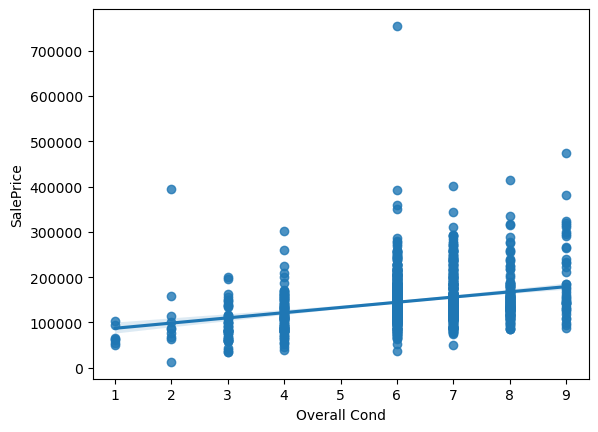

In [180]:
sns.regplot(x=col[18],y='SalePrice',data=df[(df[col[18]]>5) | (df[col[18]]<5)])

* According to the feature description text, overall quality and overall cond are measures of how good the property is
* It is fair to assume that as their score increases the sale price should also increase
* but as we can see in the above regplot the sale proce is following a decreasing trend
* we can see that overall cond of 5 is acting abnormally compared to others
* After removing the score of 5 we can see that sale price is increasing with increasing overall Cond
* I think This feature would create a negative impact on our model
* as we already have a similar feature(Overall qual) , I have decided to not use this feature in our final model

In [181]:
col[19]

'Year Built'

In [182]:
df[col[19]].describe()

count    2919.000000
mean     1971.339842
std        30.255474
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2001.000000
max      2010.000000
Name: Year Built, dtype: float64

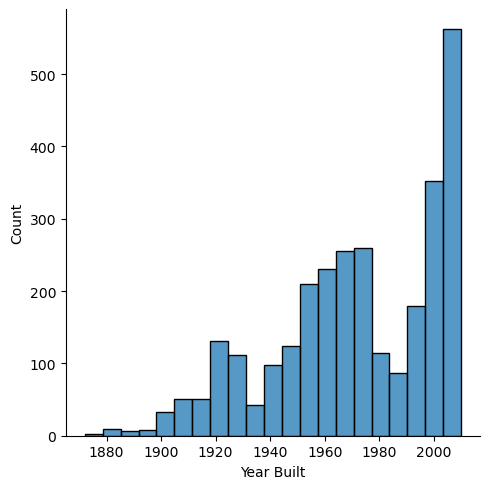

In [183]:
sns.displot(df[col[19]])

<Axes: xlabel='Overall Cond'>

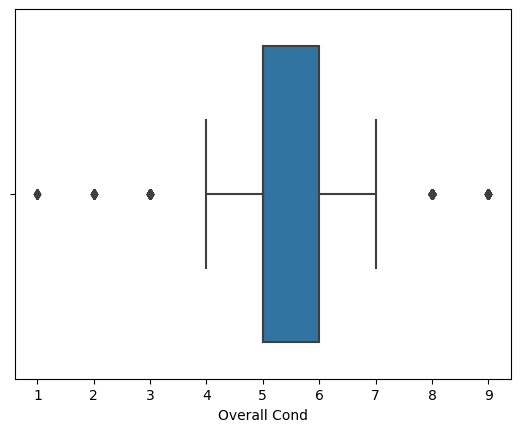

In [184]:
sns.boxplot(x=col[18],data=df)

<Axes: xlabel='Year Built', ylabel='SalePrice'>

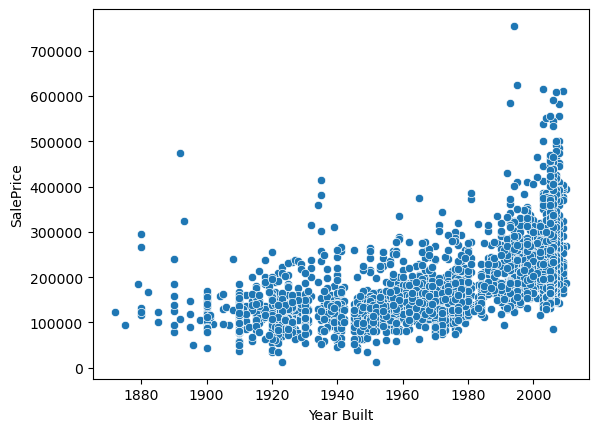

In [185]:
sns.scatterplot(x=col[19],y='SalePrice',data=df)

<Axes: xlabel='Year Built', ylabel='SalePrice'>

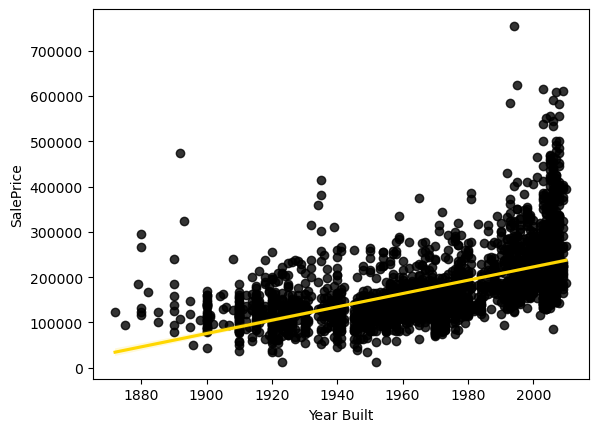

In [186]:
sns.regplot(x=col[19],y='SalePrice',data=df,scatter_kws={"color": "black"}, line_kws={"color": "gold"})

* We can see that in general recent buildings are more costly
* there are a few old buildings whivh are costly too
* There are a few buildings whose value increases as they get very old, they coould hold any historical significance
* many people are interested in collecting antique things and are willing to pay a lot for them
* I have decided to keep all the observatons
* This is an important feature

In [187]:
num.append(col[19])

In [188]:
num

['Lot Frontage', 'Lot Area', 'Lot Shape', 'Overall Qual', 'Year Built']

In [189]:
col[20]

'Year Remod/Add'

In [190]:
def plot_num(col):
  plt.figure(figsize=(10,5),dpi=150)
  sns.displot(df[col])
  plt.plot()

  plt.figure(figsize=(10,5),dpi=150)
  sns.boxplot(x=col,data=df)
  plt.plot()

  plt.figure(figsize=(10,5),dpi=150)
  sns.scatterplot(x=col,y='SalePrice',data=df)
  plt.plot()

  plt.figure(figsize=(10,5),dpi=150)
  sns.regplot(x=col,y='SalePrice',data=df,scatter_kws={"color": "black"}, line_kws={"color": "gold"})
  plt.plot()

<Figure size 1500x750 with 0 Axes>

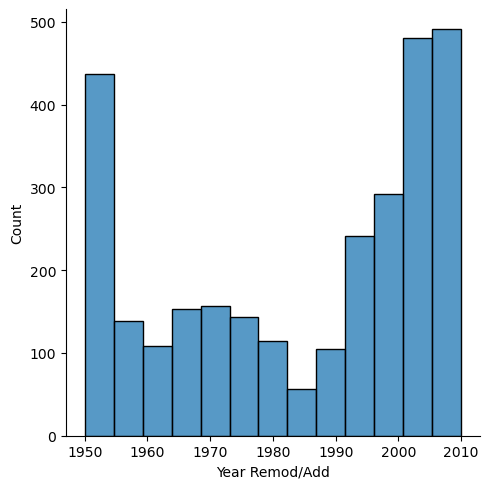

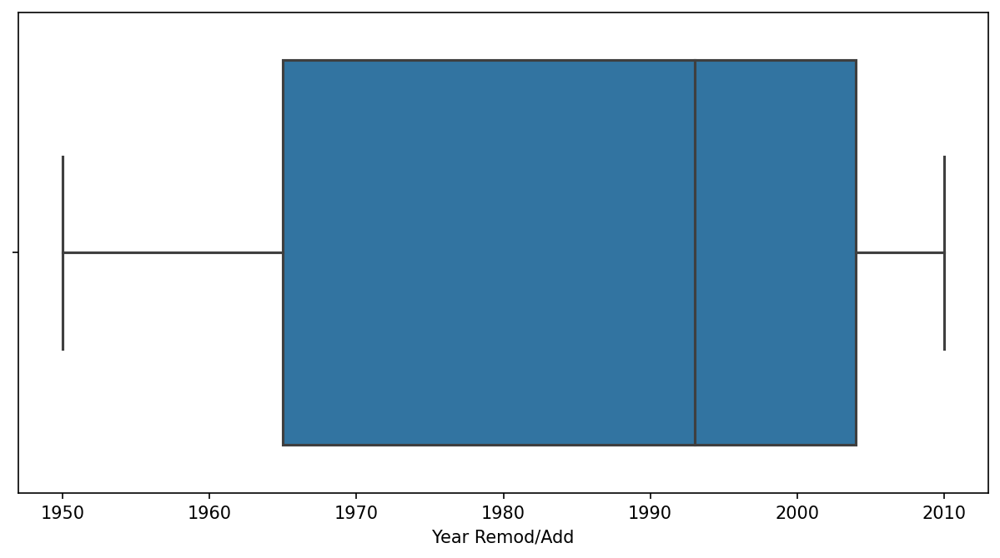

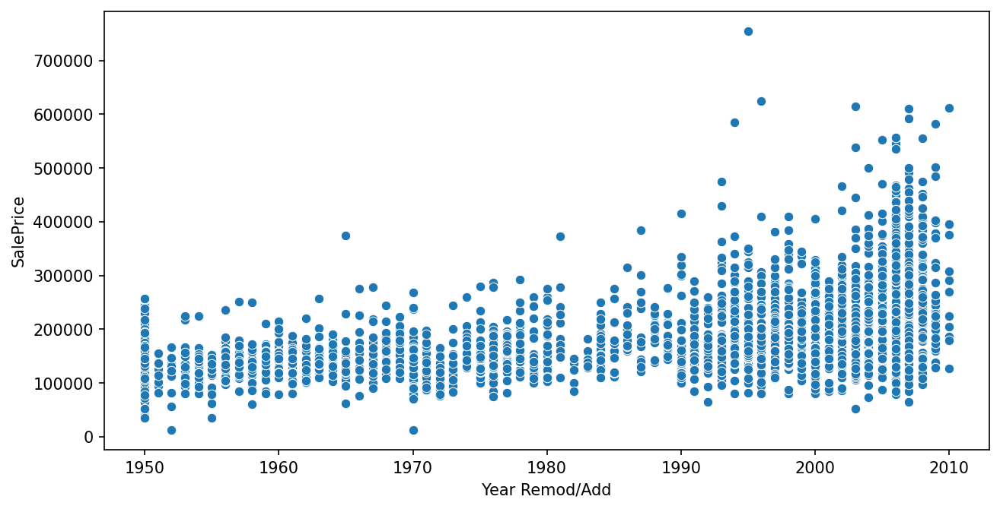

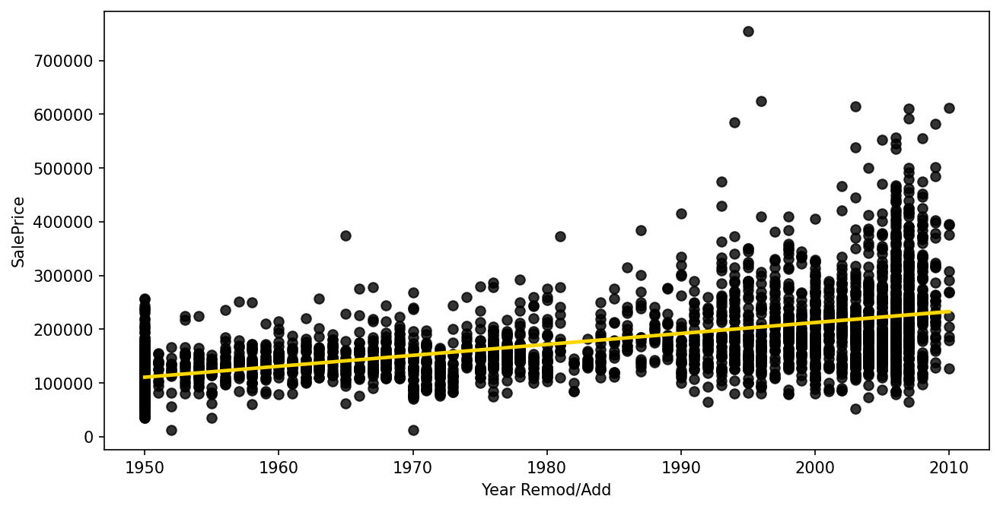

In [191]:
plot_num(col[20])

* We can see there are no outliers in the feature
* We can also see an that recently remodelled houses are priced higher
* This is an important feature for us

In [192]:
num.append(col[20])

In [193]:
col[21]

'Roof Style'

In [194]:
df[col[21]].value_counts()

Gable      2314
Hip         548
Gambrel      22
Flat         19
Mansard      11
Shed          5
Name: Roof Style, dtype: int64

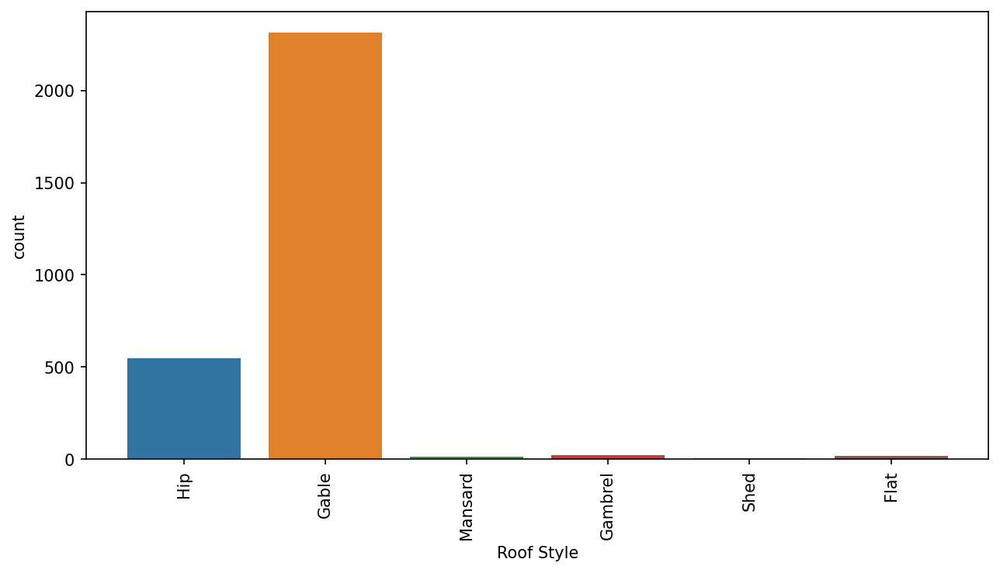

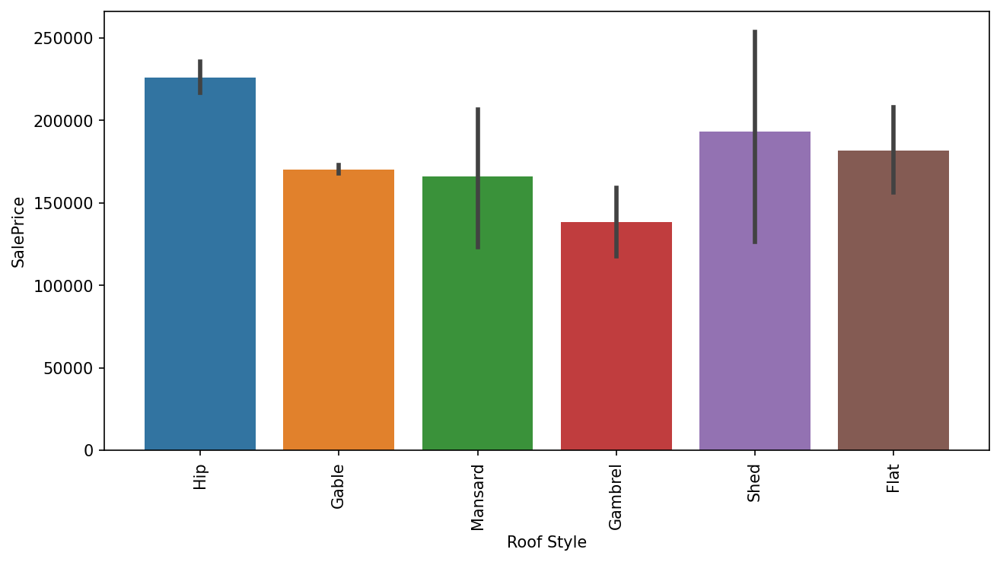

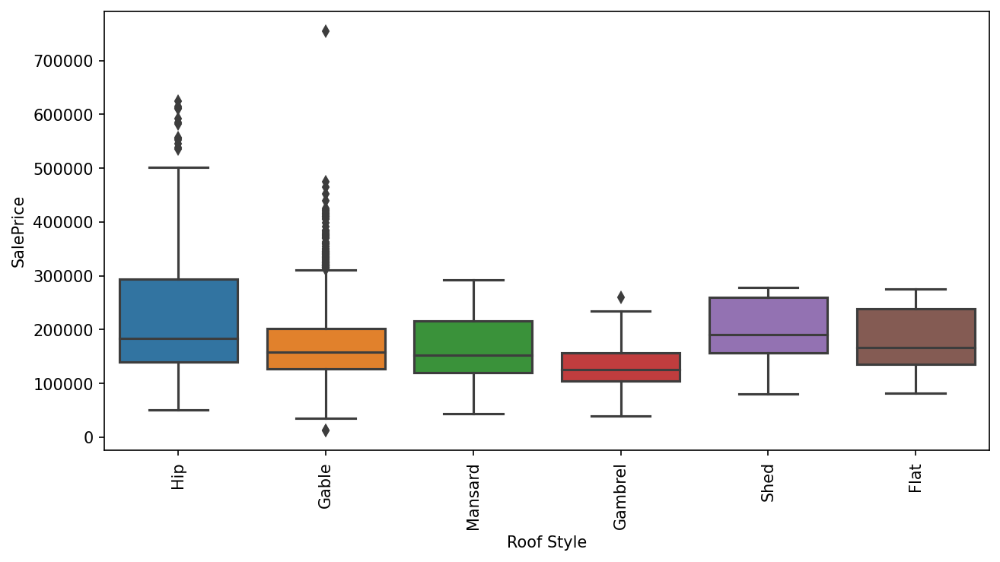

In [195]:
plot_cat(col[21])

* Most houses are Gable or Hip roof style
* We can see there are different sale prices for diferent roof style
* This could be an important feature for us

In [196]:
cat.append(col[21])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style']

In [197]:
col[22]

'Roof Matl'

In [198]:
df[col[22]].value_counts()

CompShg    2878
Tar&Grv      22
WdShake       9
WdShngl       7
Membran       1
Roll          1
Metal         1
Name: Roof Matl, dtype: int64

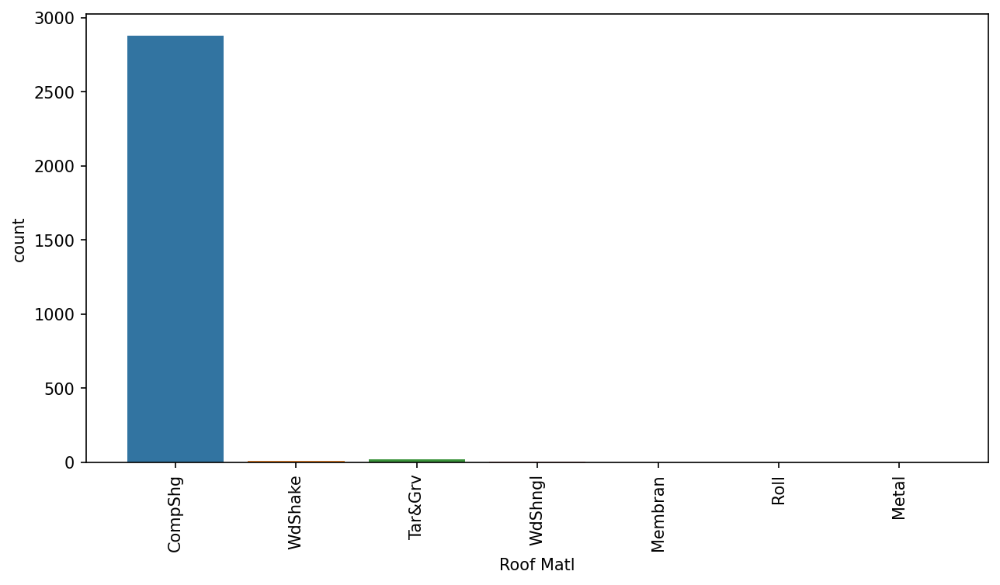

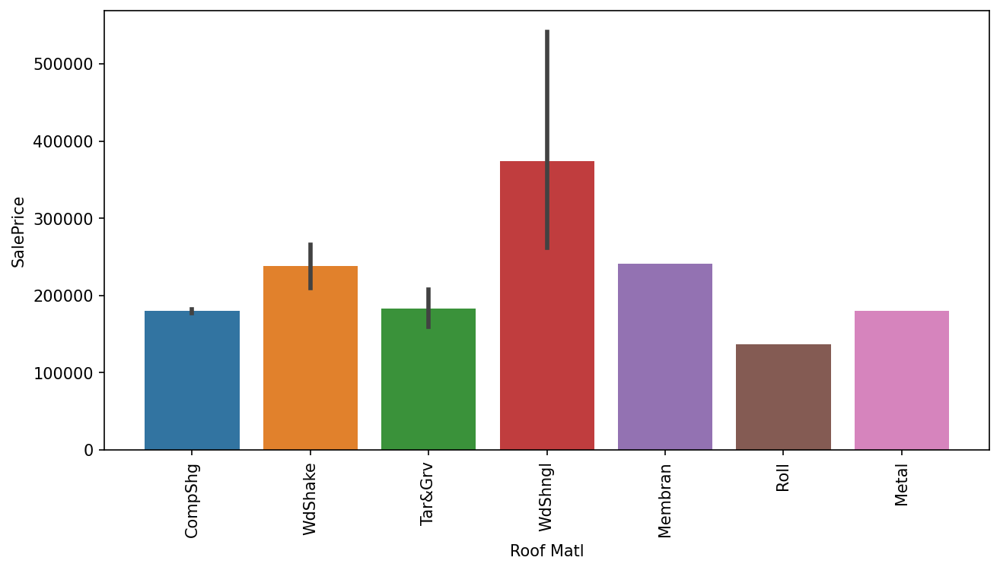

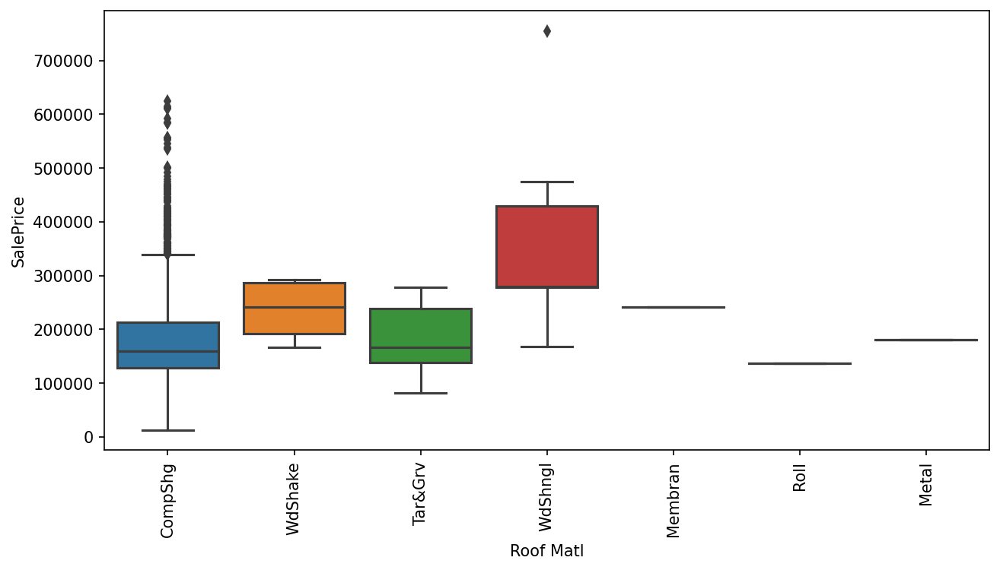

In [199]:
plot_cat(col[22])

In [200]:
df[col[22]] = df[col[22]].apply(lambda x: 0 if x=='CompShg' else(1 if x=='Tar&Grv' else 2) )

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\3887045810.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col[22]] = df[col[22]].apply(lambda x: 0 if x=='CompShg' else(1 if x=='Tar&Grv' else 2) )


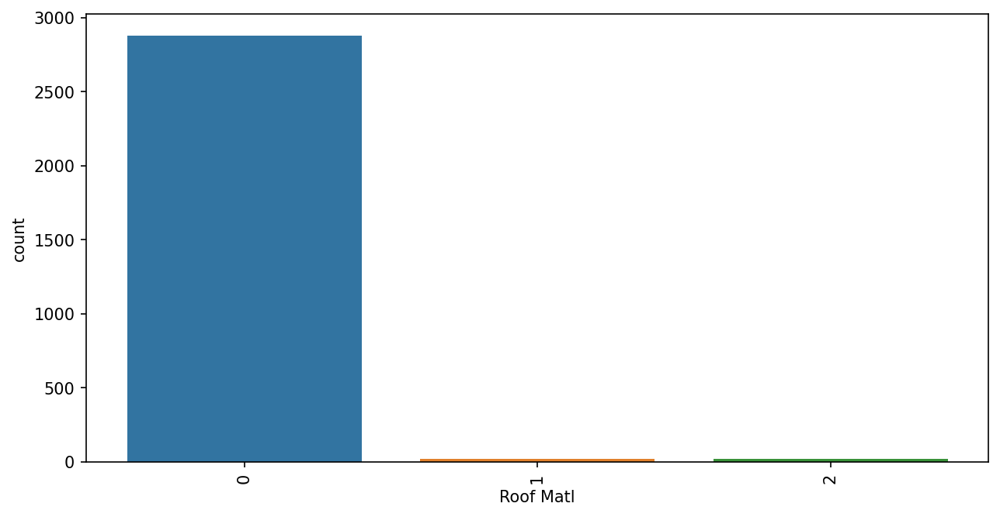

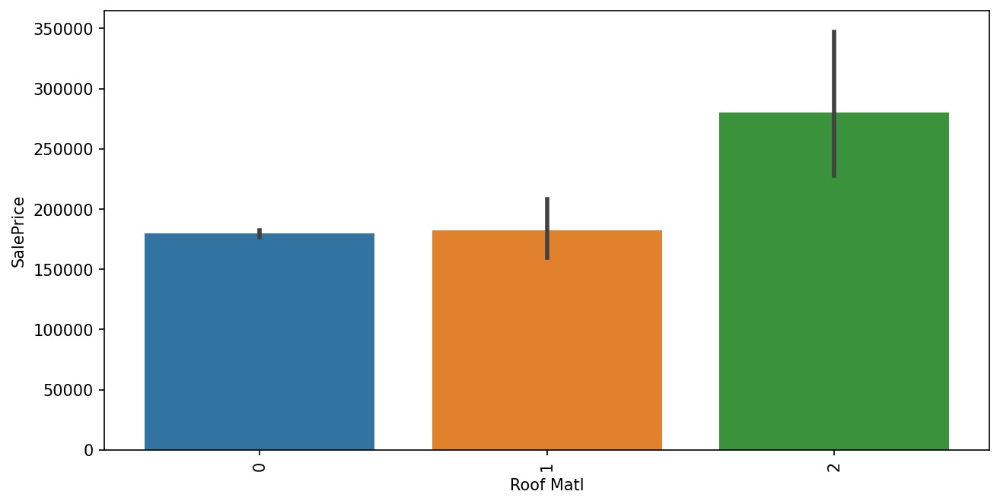

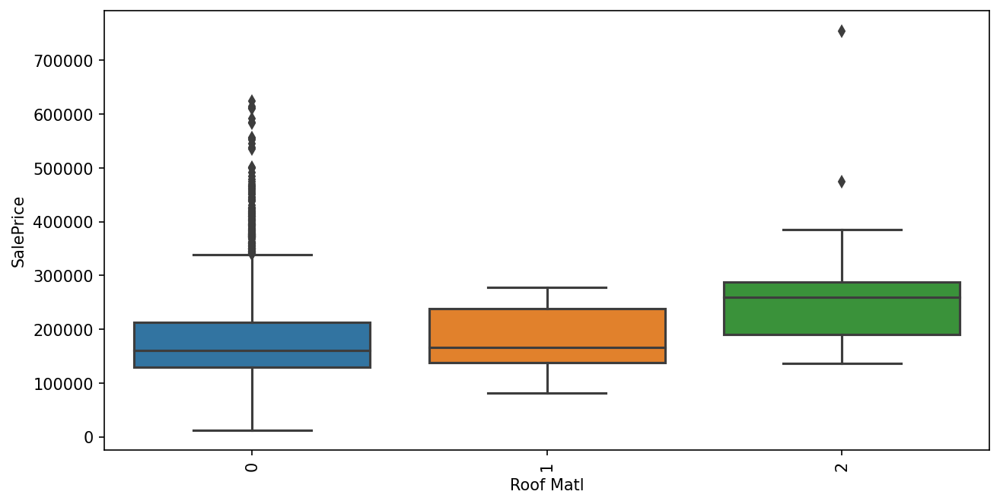

In [201]:
plot_cat(col[22])

* As there were a lot of categories and most of them are in very small numbers i have grouped some in a single laabel

In [202]:
num.append(col[22])
num

['Lot Frontage',
 'Lot Area',
 'Lot Shape',
 'Overall Qual',
 'Year Built',
 'Year Remod/Add',
 'Roof Matl']

In [203]:
col[23]

'Exterior 1st'

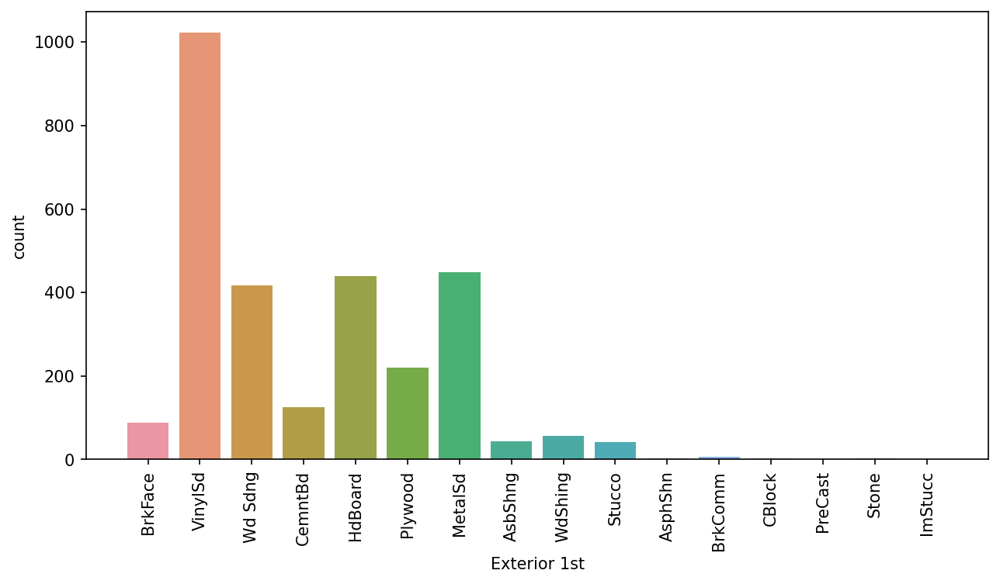

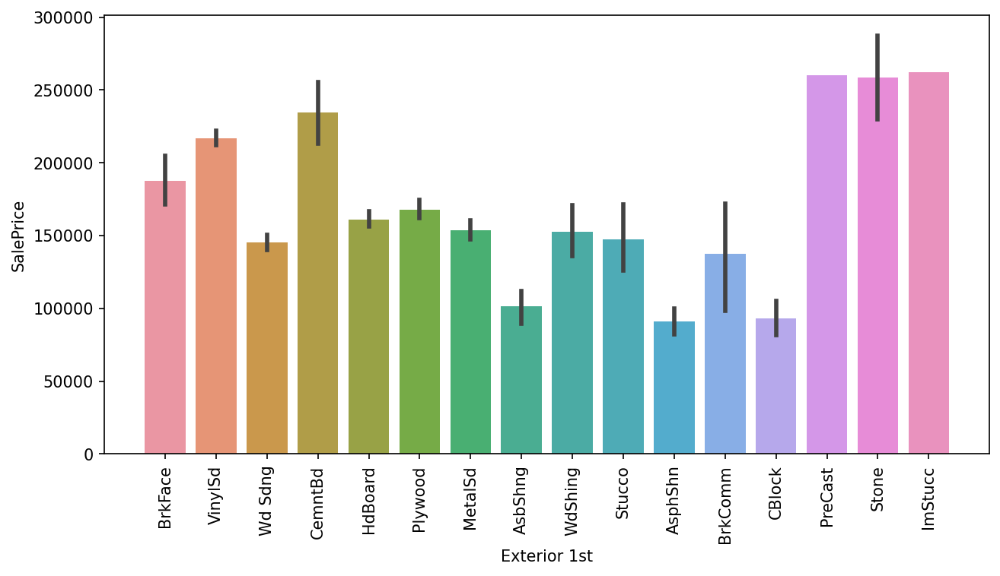

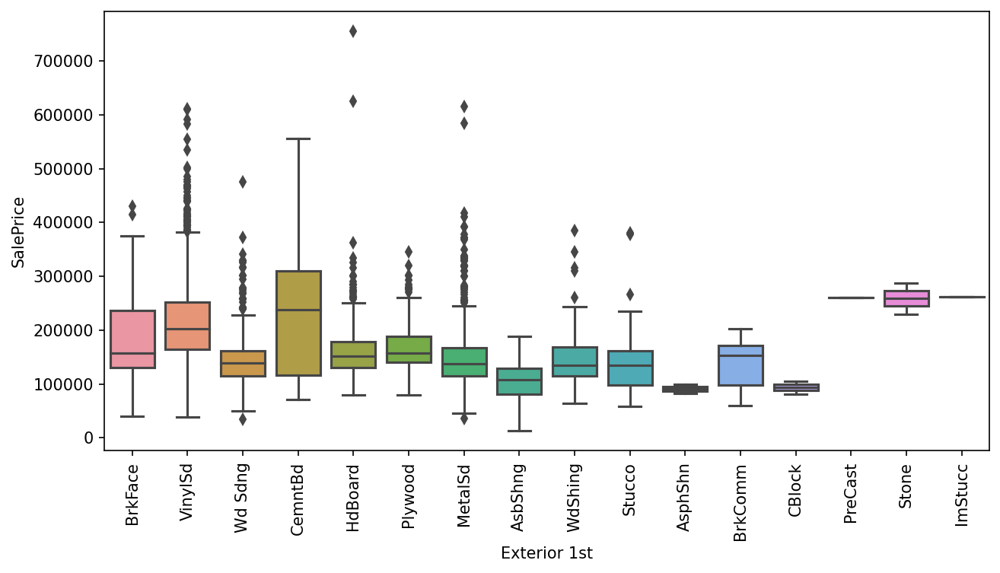

In [204]:
plot_cat(col[23])

* There are different sale prices for different Exterior 1st categories

In [205]:
cat.append(col[23])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Exterior 1st']

In [206]:
col[24]

'Exterior 2nd'

In [207]:
df[col[24]].value_counts()

VinylSd    1011
MetalSd     446
HdBoard     404
Wd Sdng     396
Plywood     274
CmentBd     126
Wd Shng      81
BrkFace      47
Stucco       45
AsbShng      38
Brk Cmn      22
ImStucc      14
Stone         6
AsphShn       4
CBlock        3
PreCast       1
Other         1
Name: Exterior 2nd, dtype: int64

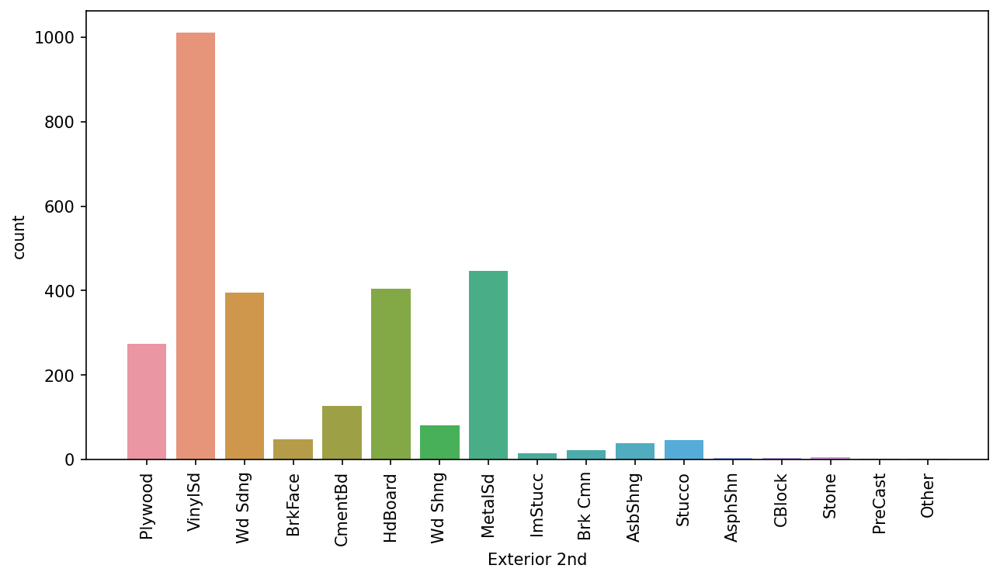

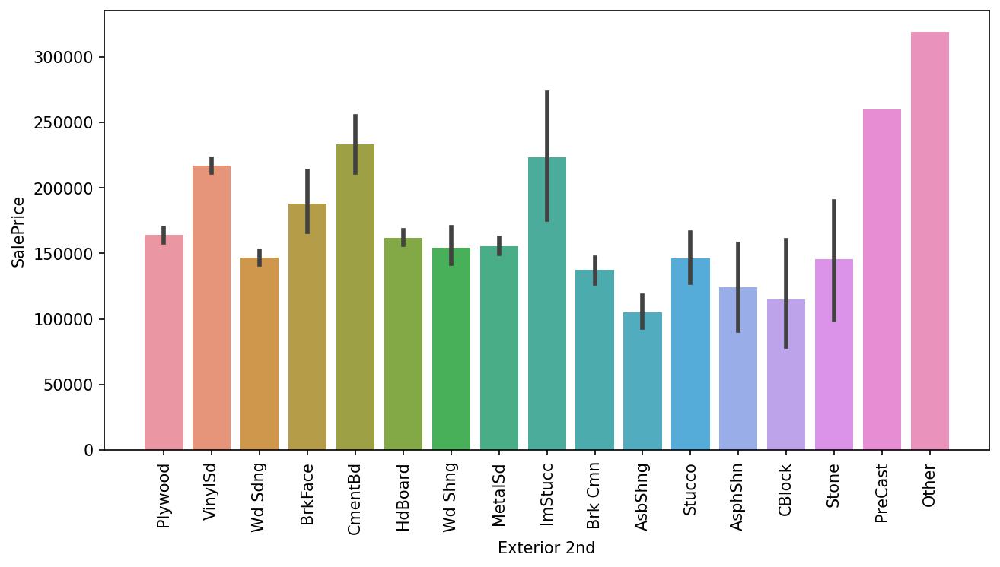

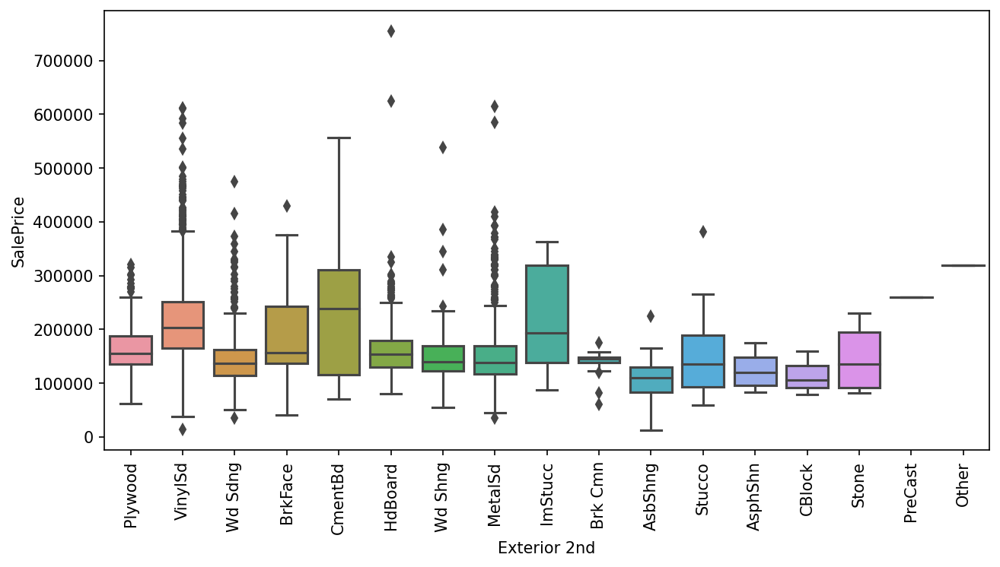

In [208]:
plot_cat(col[24])

* Exterior 2nd is behaving similar to Exterior 1 in many cases
* Therefore i have decided not to use this feature to build my model

In [209]:
col[25]

'Mas Vnr Type'

In [210]:
df[col[25]]

0         Stone
1          None
2       BrkFace
3          None
4          None
         ...   
2925       None
2926       None
2927       None
2928       None
2929    BrkFace
Name: Mas Vnr Type, Length: 2919, dtype: object

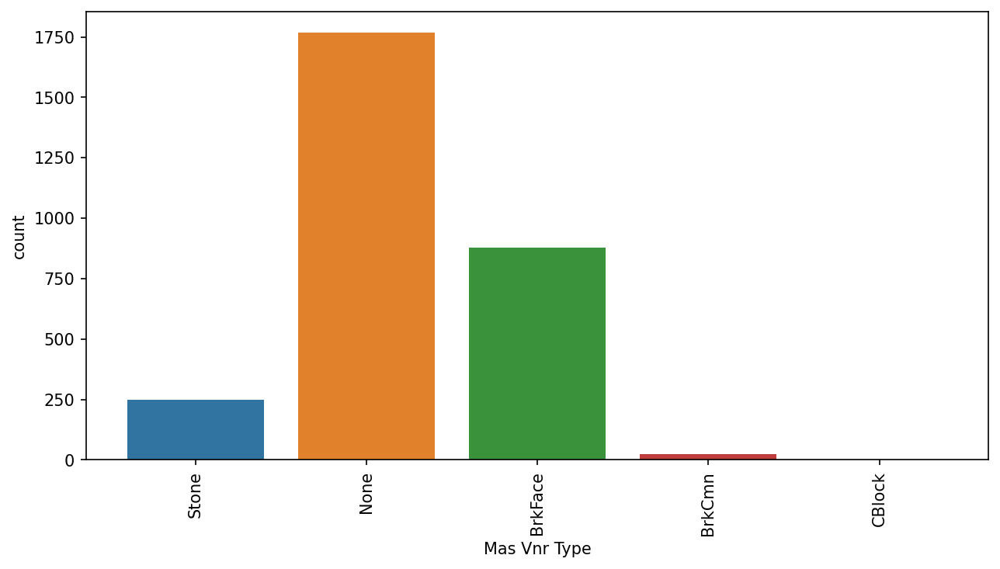

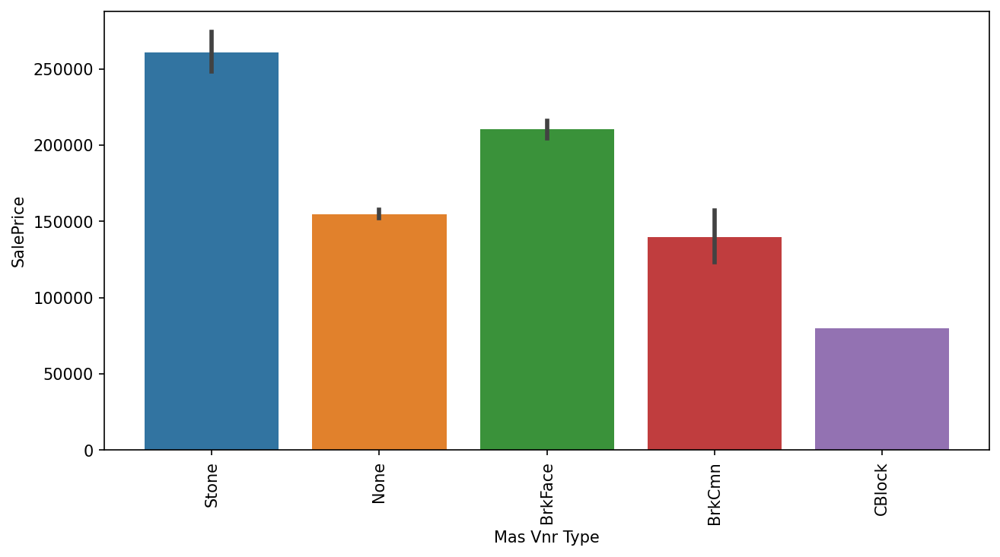

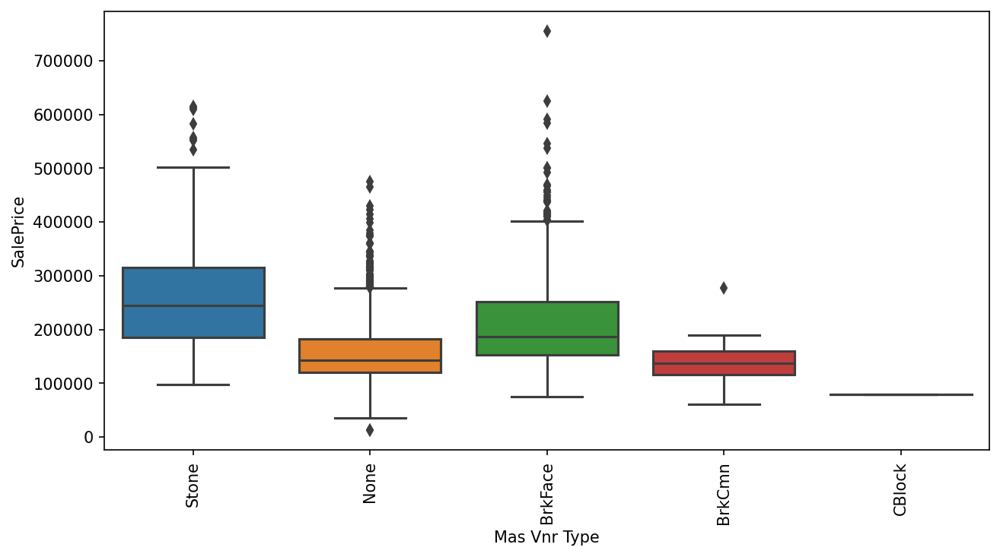

In [211]:
plot_cat(col[25])

* We can see a lot of people dont have Mas Vnr in their home
* It looks like brkface is the most common used Mas Vnr type
* There are different sla eprices for different mas vnr types
* This could be an important feature

In [212]:
cat.append(col[25])
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Exterior 1st',
 'Mas Vnr Type']

In [213]:
col[26]

'Mas Vnr Area'

In [214]:
df[col[26]].describe()

count    2919.000000
mean      100.984584
std       178.270642
min         0.000000
25%         0.000000
50%         0.000000
75%       163.000000
max      1600.000000
Name: Mas Vnr Area, dtype: float64

<Figure size 1500x750 with 0 Axes>

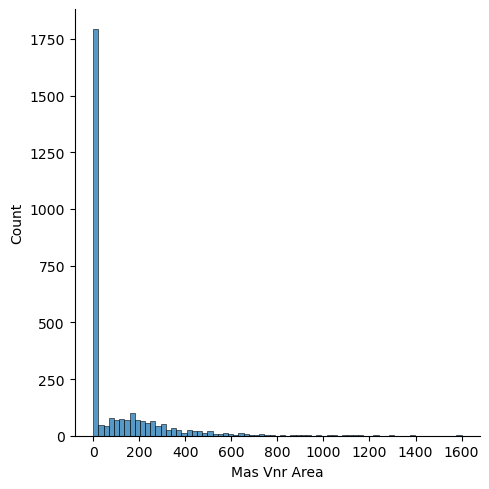

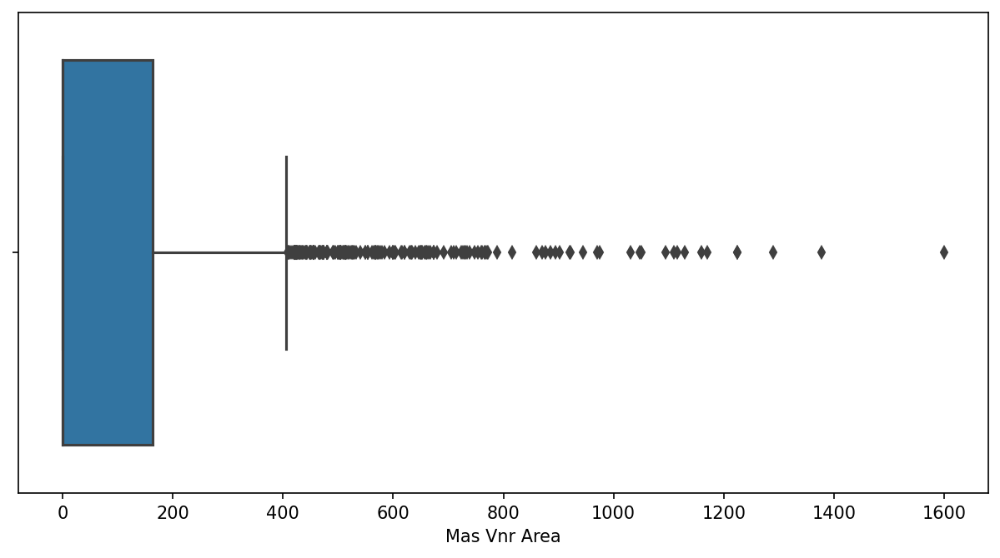

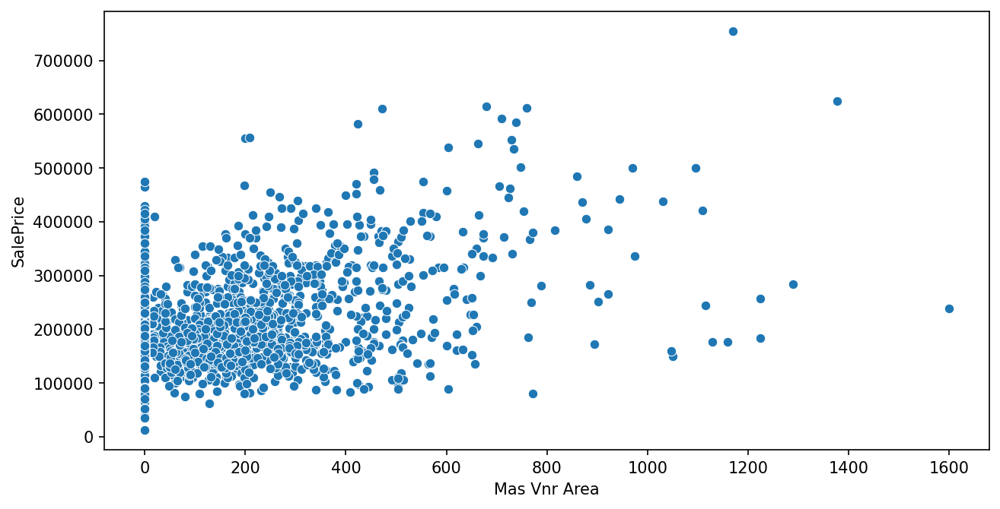

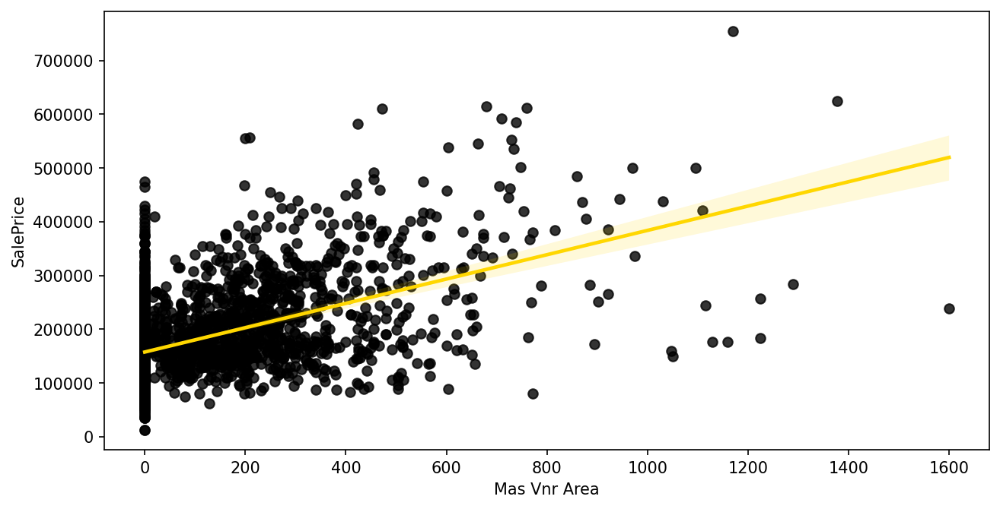

In [215]:
plot_num(col[26])

* We can see Sale prices increase with increase in mas vnr area
* I feel observations for mas vnr area over 1200 therefore i am removing them

In [216]:
df = df[df[col[26]]<1200]

<Figure size 1500x750 with 0 Axes>

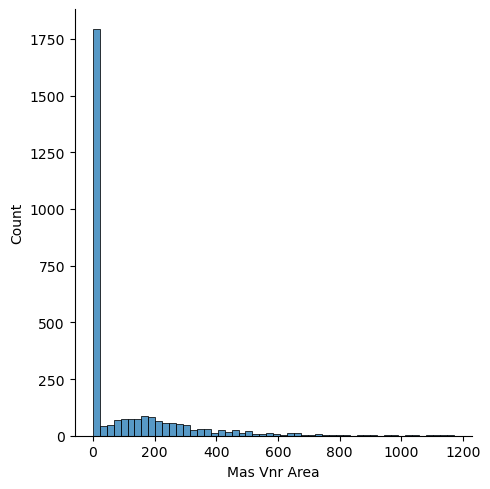

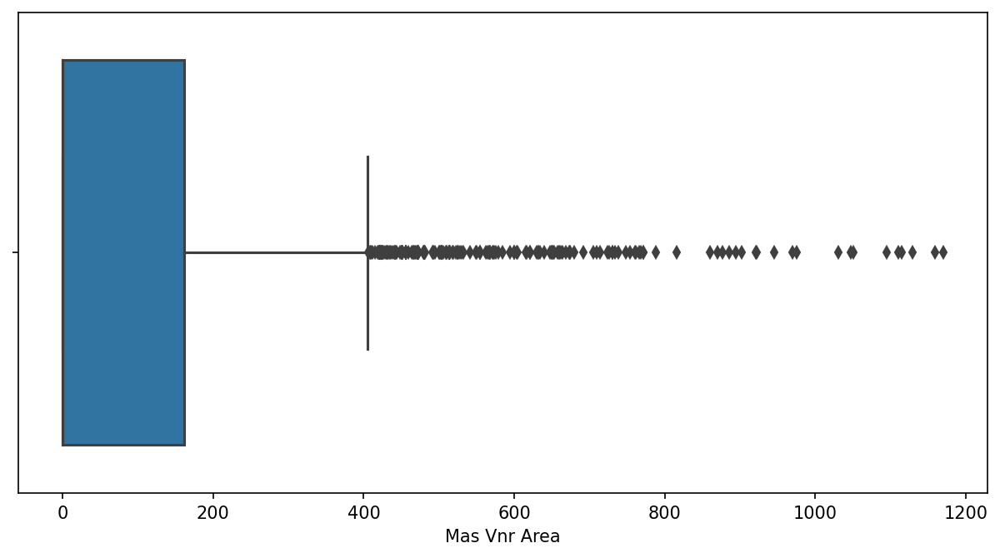

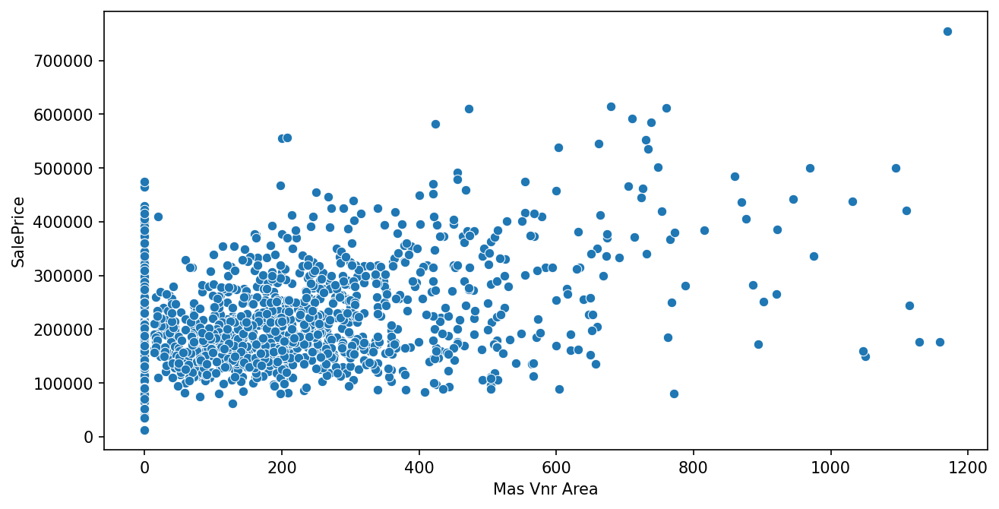

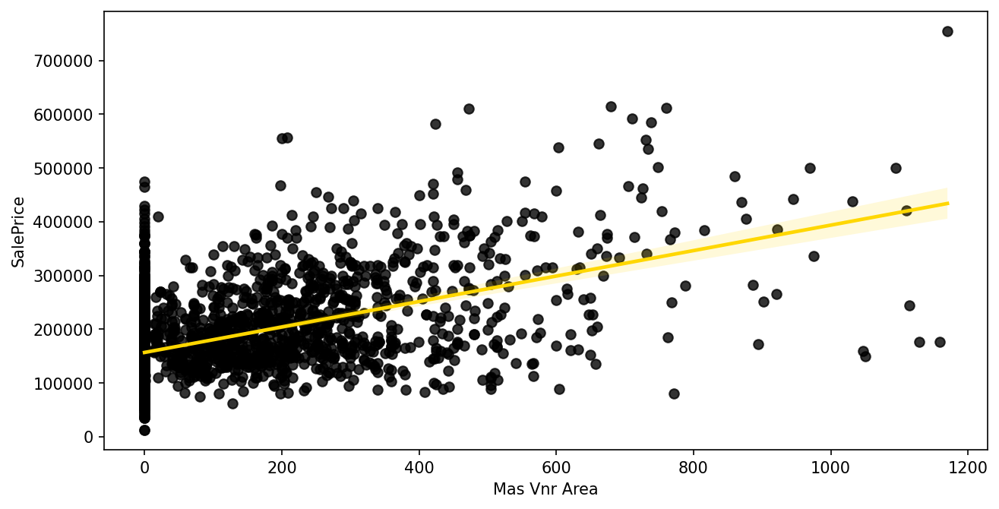

In [217]:
plot_num(col[26])

In [218]:
num.append(col[26])
num[-1]

'Mas Vnr Area'

In [219]:
col[27]

'Exter Qual'

In [220]:
df[col[27]].value_counts()

TA    1793
Gd     981
Ex     105
Fa      35
Name: Exter Qual, dtype: int64

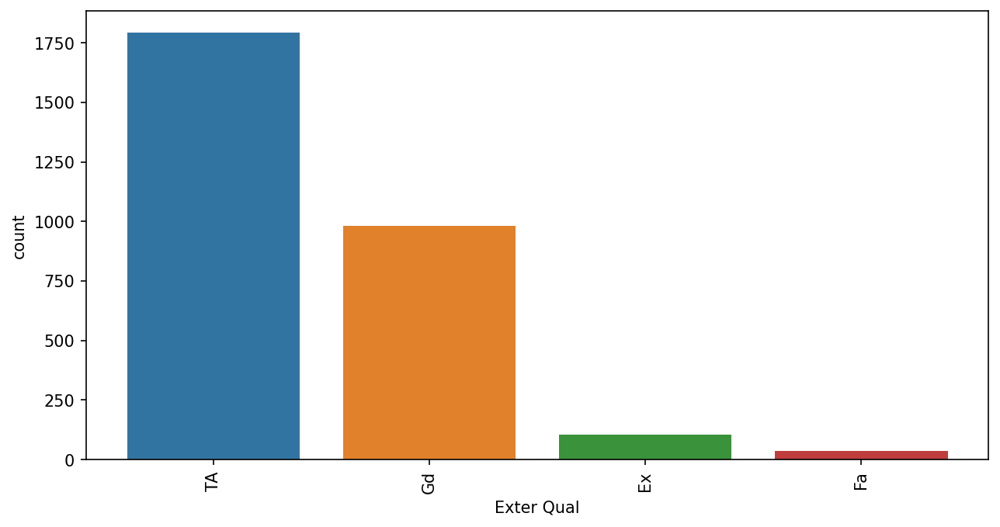

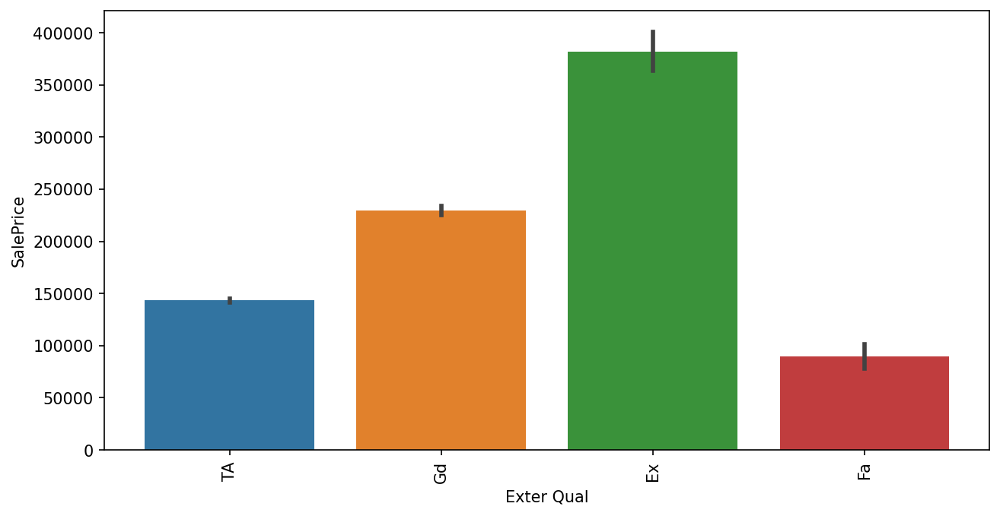

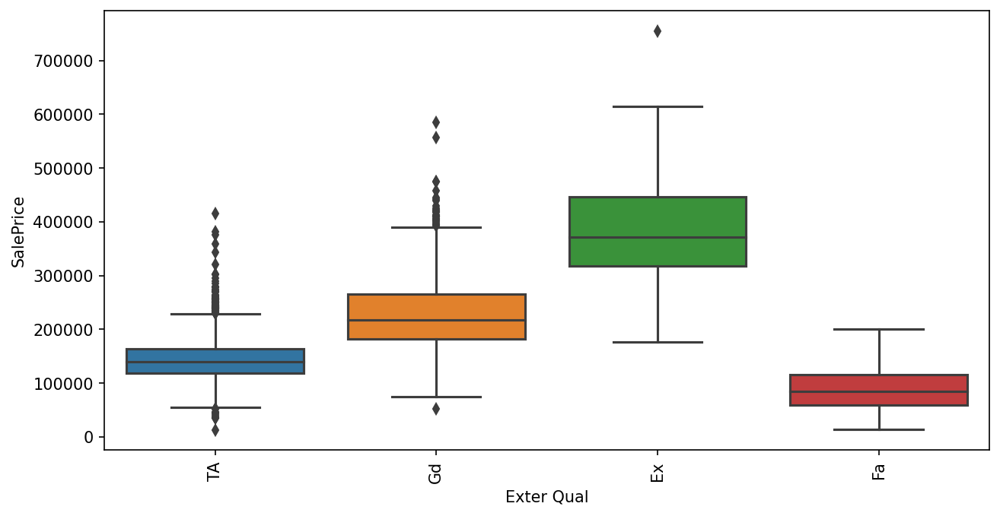

In [221]:
plot_cat(col[27])

* Most of the Exter qual are TA and GD
* There are different values for sales price w.r.t  exter Qual
* This could be an important feature

In [222]:
cat.append(col[27])
cat[-1]

'Exter Qual'

In [223]:
col[28]

'Exter Cond'

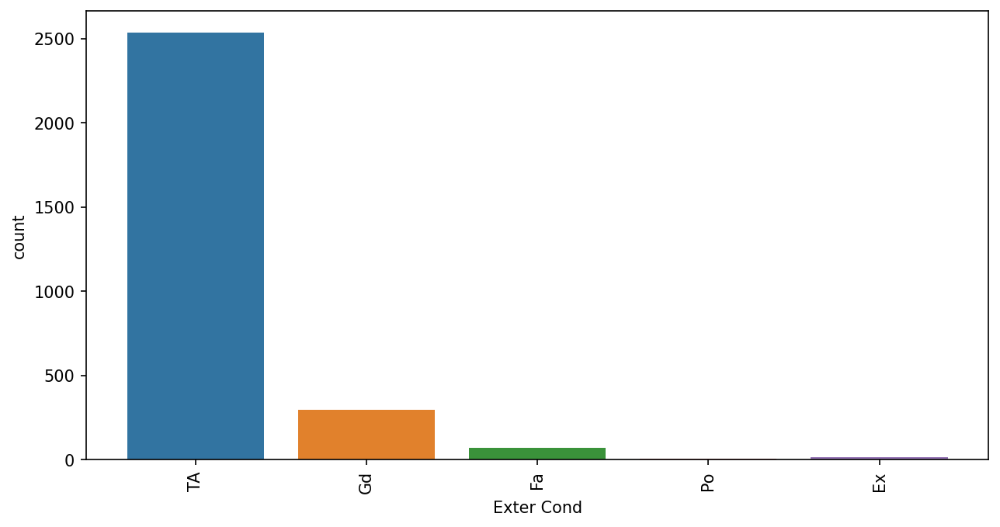

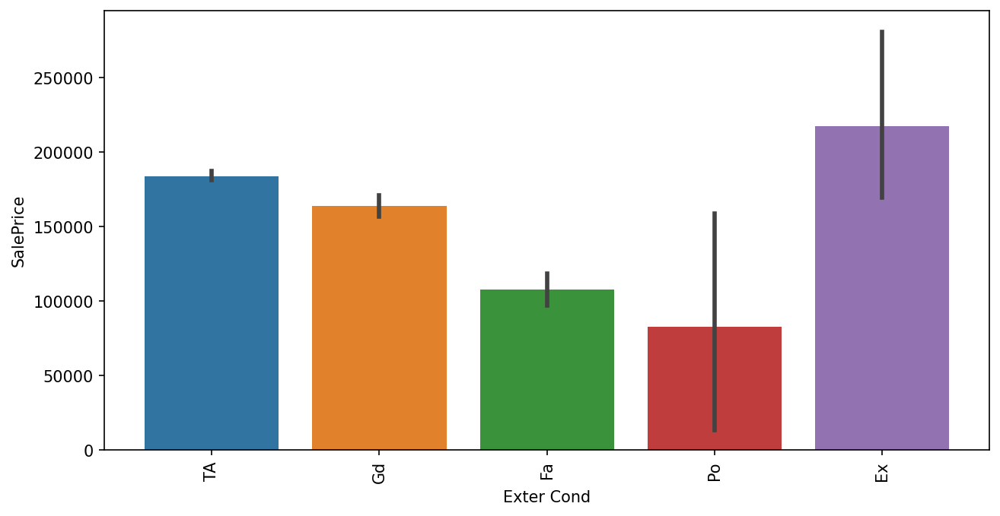

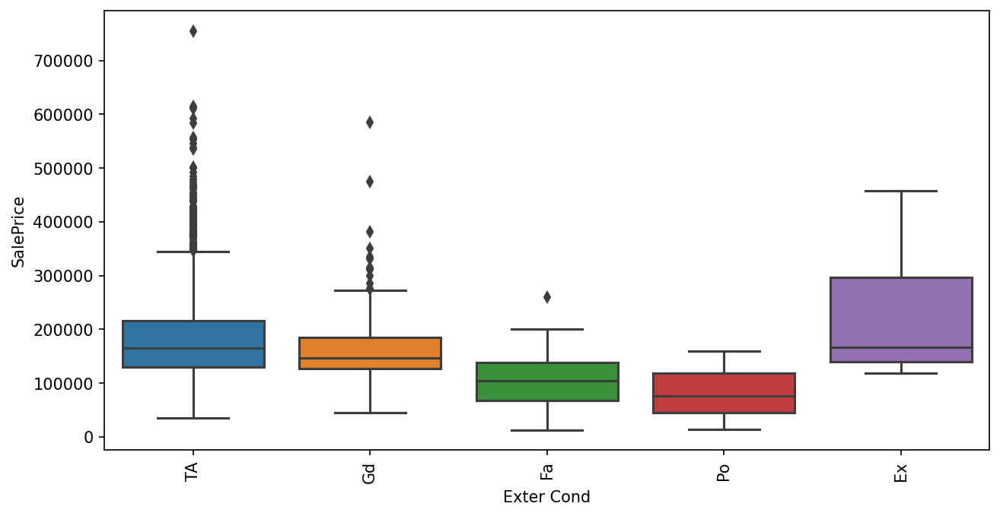

In [224]:
plot_cat(col[28])

* Most of the Exter Cond are TA and GD
* There are different values for sales price w.r.t  exter Cond
* This could be an important feature

In [225]:
cat.append(col[28])
cat[-1]

'Exter Cond'

In [226]:
col[29]

'Foundation'

In [227]:
df[col[29]].value_counts()

PConc     1300
CBlock    1238
BrkTil     311
Slab        49
Stone       11
Wood         5
Name: Foundation, dtype: int64

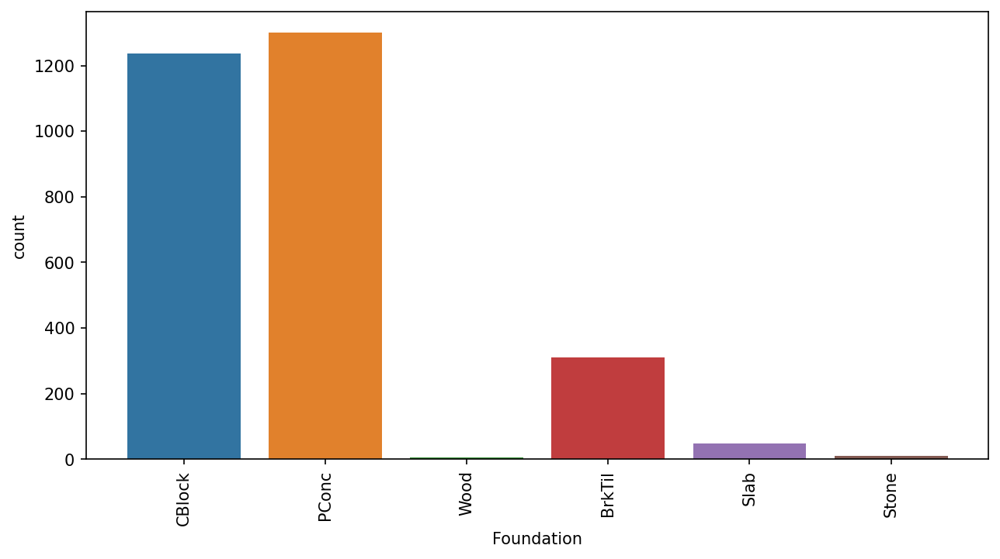

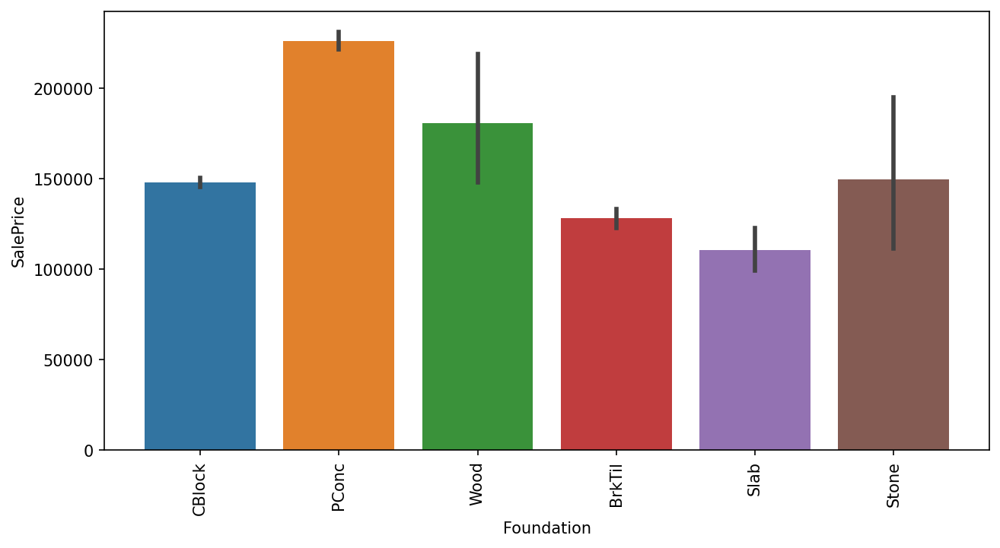

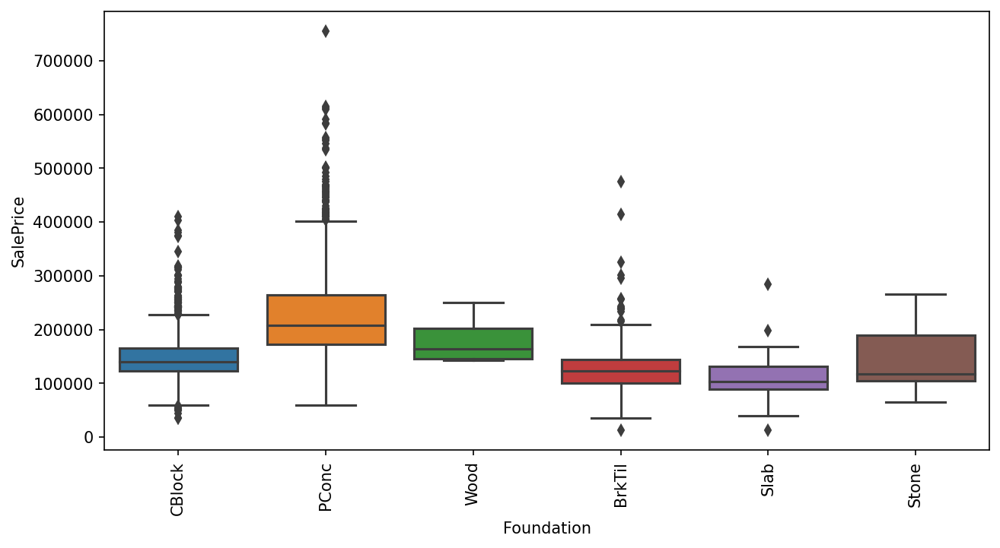

In [228]:
plot_cat(col[29])

In [229]:
#
cat.append(col[29])
cat[-1]

'Foundation'

In [230]:
col[30]

'Bsmt Qual'

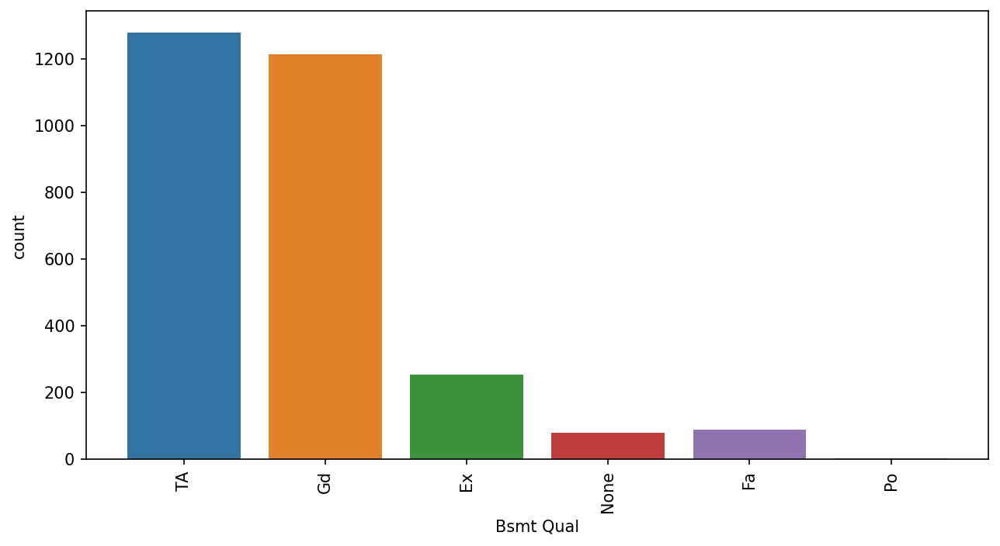

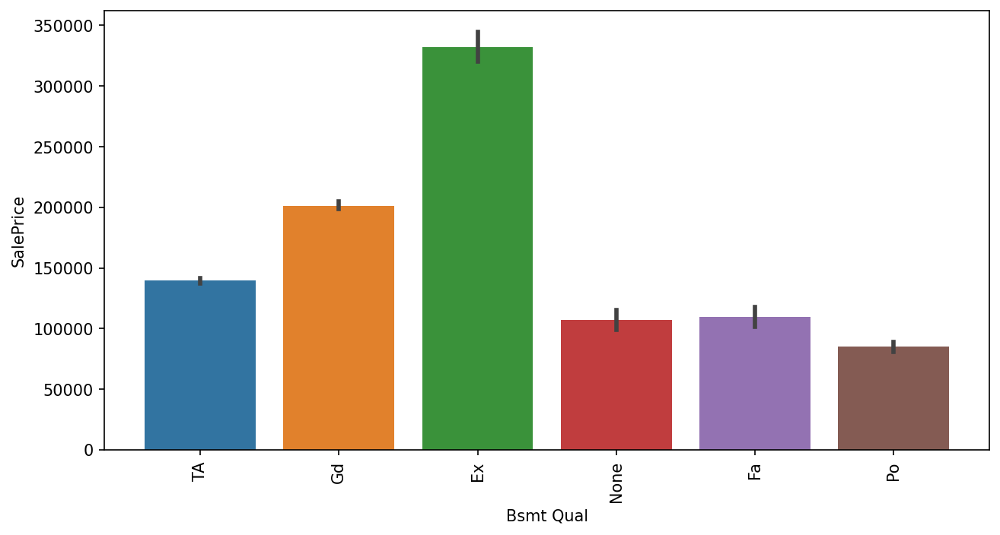

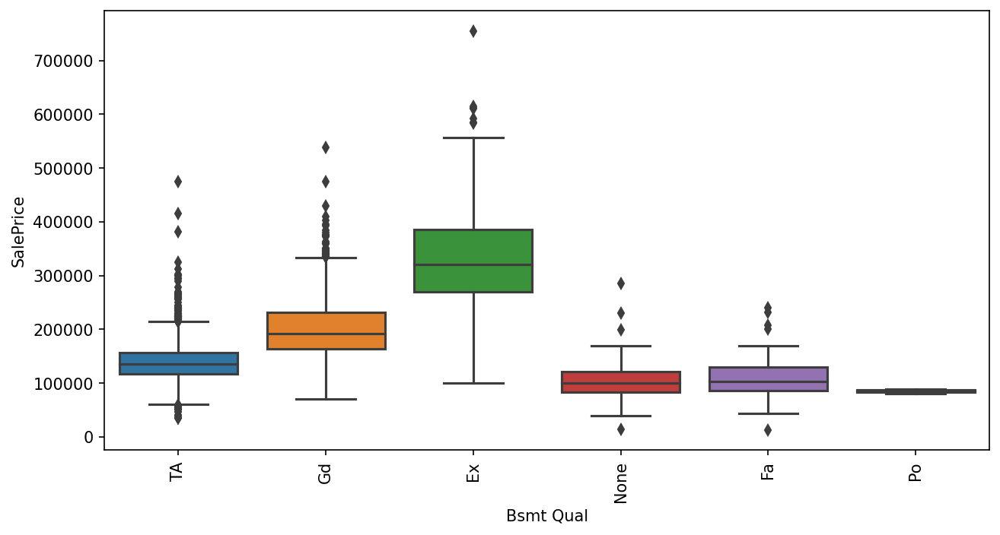

In [231]:
plot_cat(col[30])

In [232]:
df[col[30]].value_counts()

TA      1279
Gd      1213
Ex       253
Fa        88
None      79
Po         2
Name: Bsmt Qual, dtype: int64

In [233]:
df[col[30]] = df[col[30]].apply(lambda x: 0 if x=='TA' else (1 if x=='Gd' else (2 if x=='Ex' else 3 )))

In [234]:
df[col[30]].value_counts()

0    1279
1    1213
2     253
3     169
Name: Bsmt Qual, dtype: int64

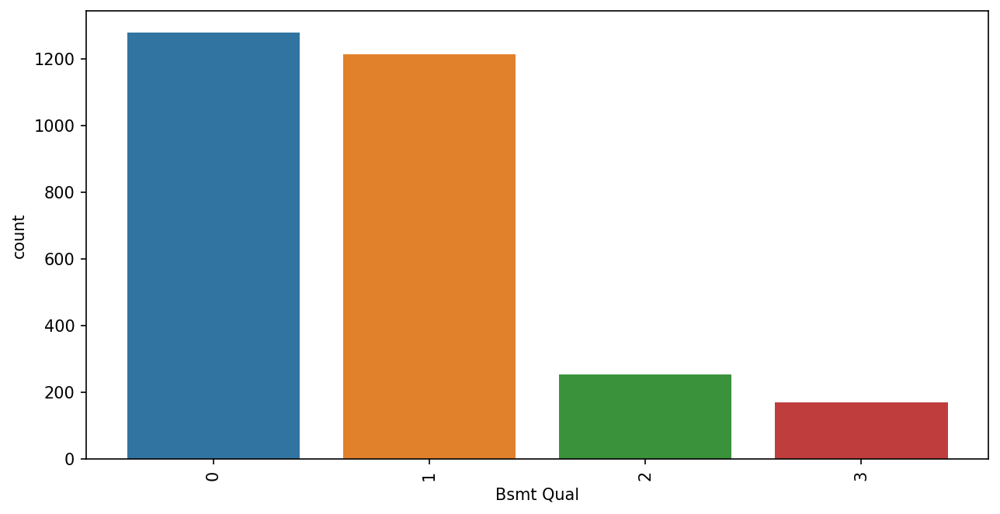

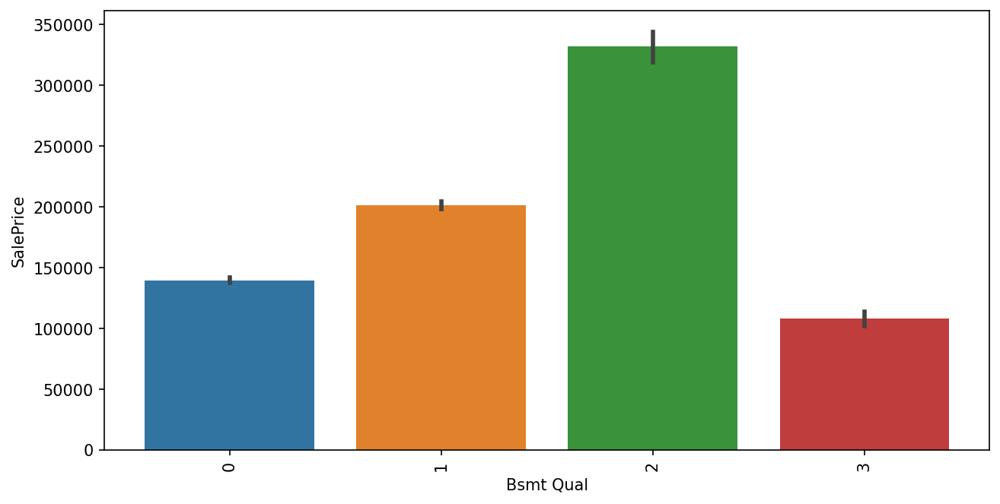

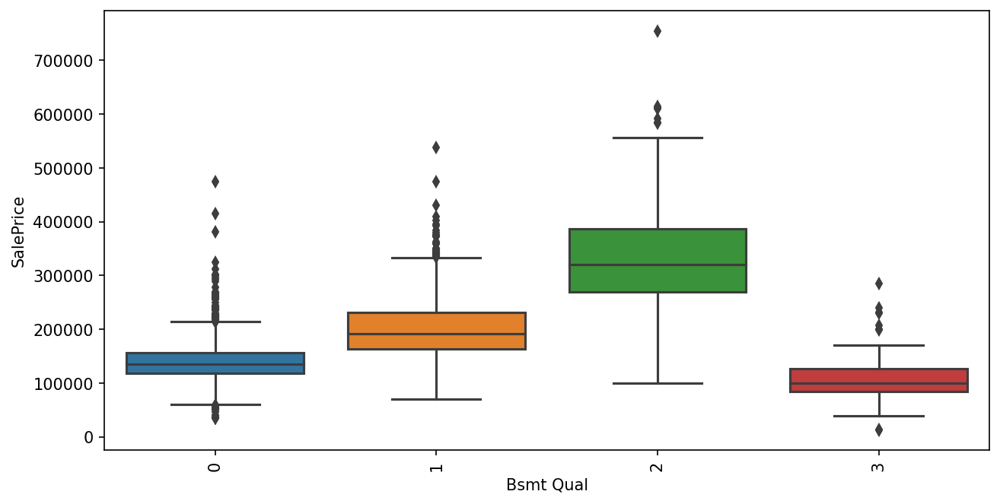

In [235]:
plot_cat(col[30])

In [236]:
num.append(col[30])
num[-1]

'Bsmt Qual'

In [237]:
col[31]

'Bsmt Cond'

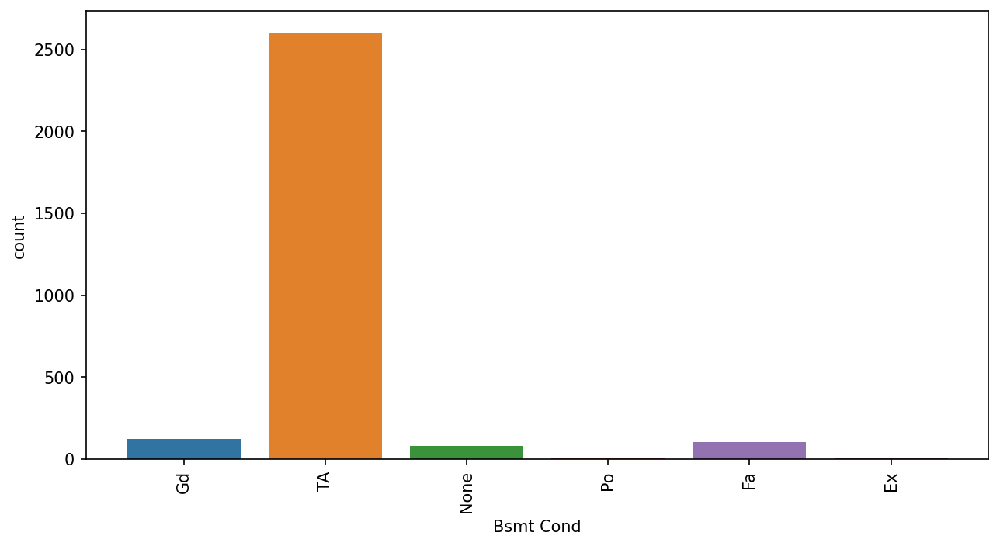

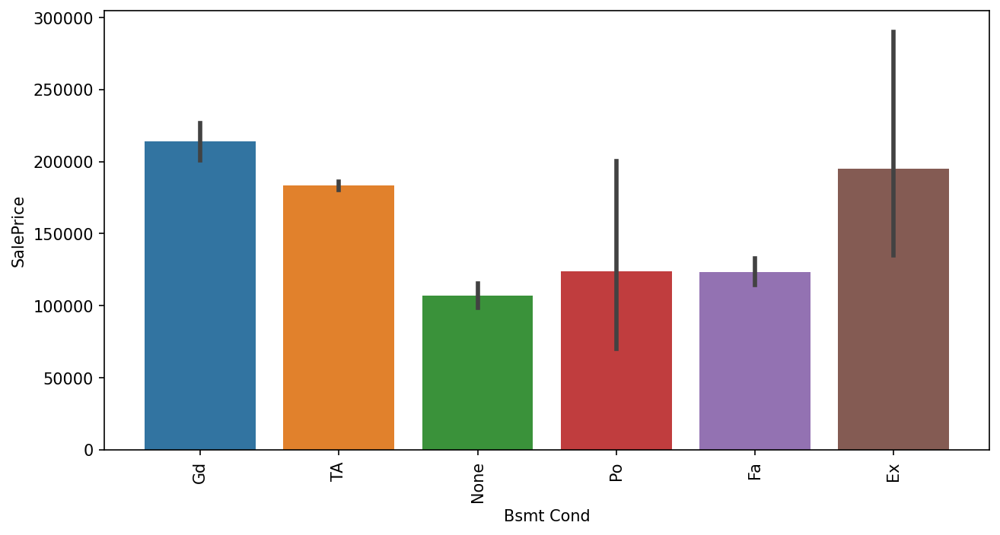

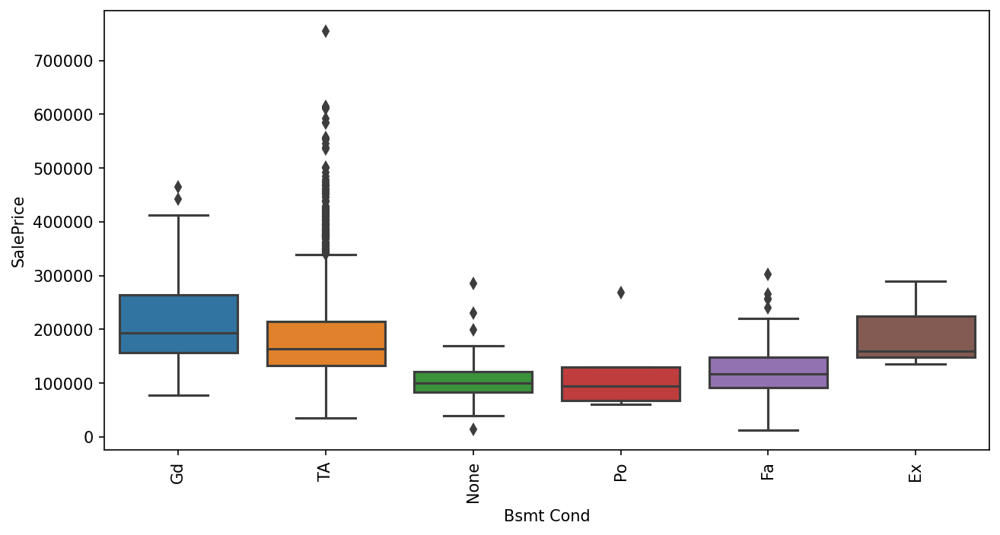

In [238]:
plot_cat(col[31])

In [239]:
cat.append(col[31])
cat[-1]

'Bsmt Cond'

In [240]:
col[32]

'Bsmt Exposure'

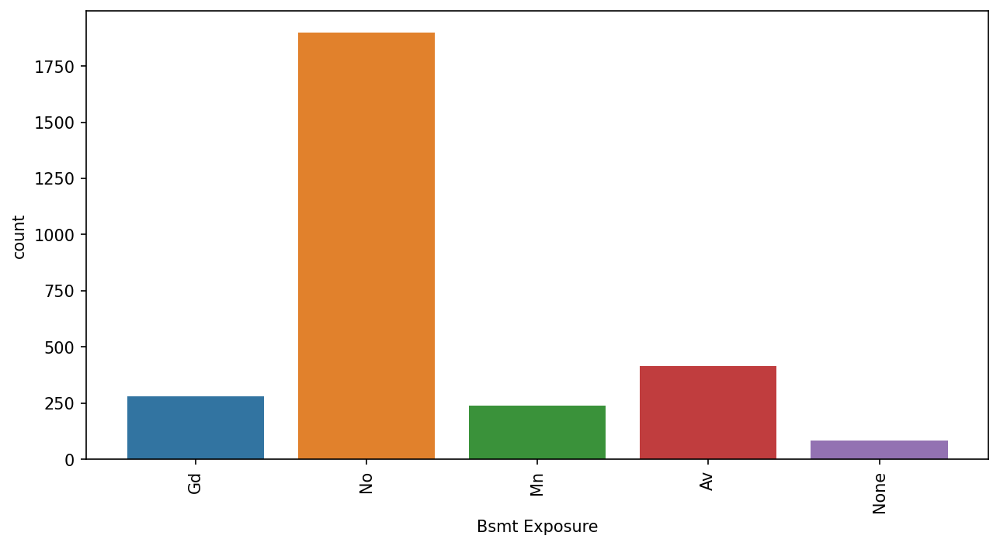

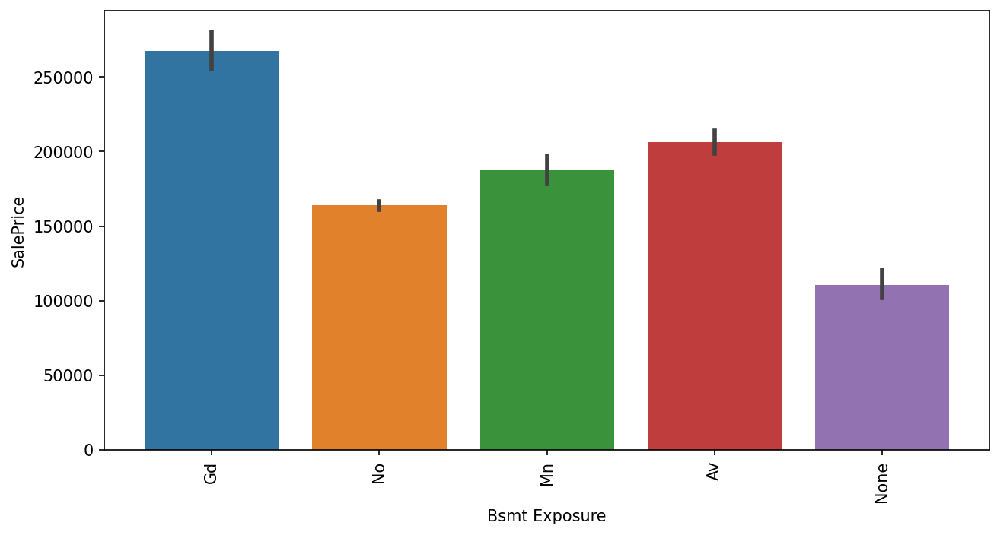

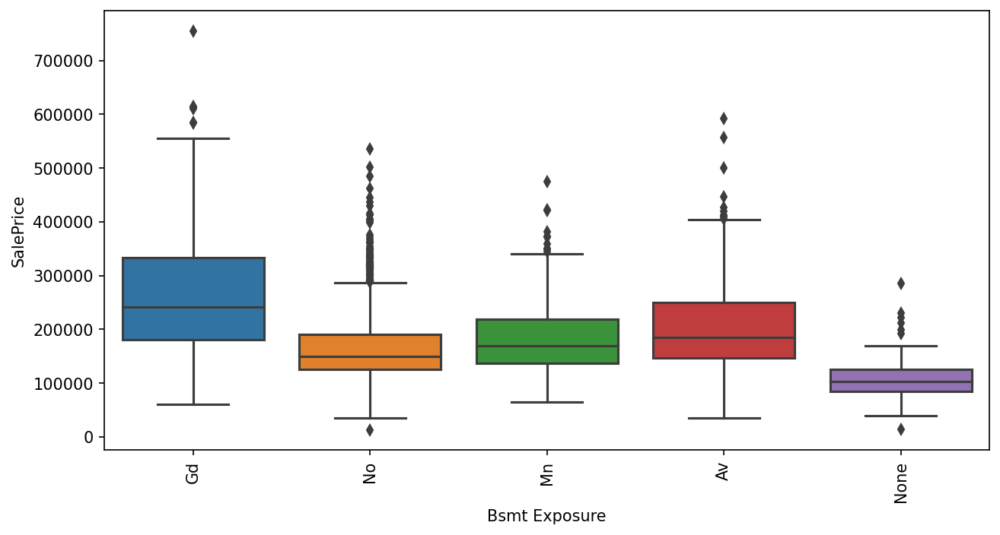

In [241]:
plot_cat(col[32])

In [242]:
cat.append(col[32])
cat[-1]

'Bsmt Exposure'

In [243]:
col[33]

'BsmtFin Type 1'

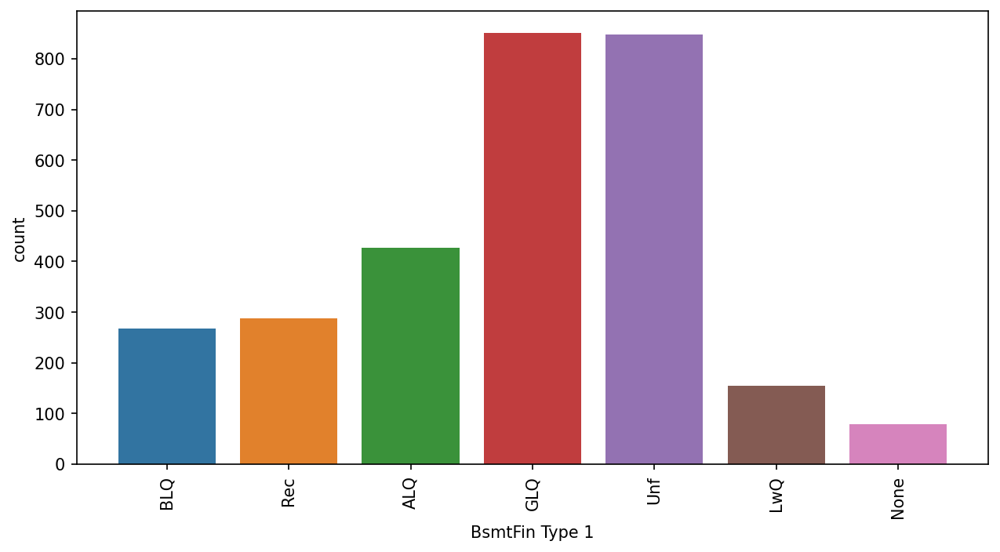

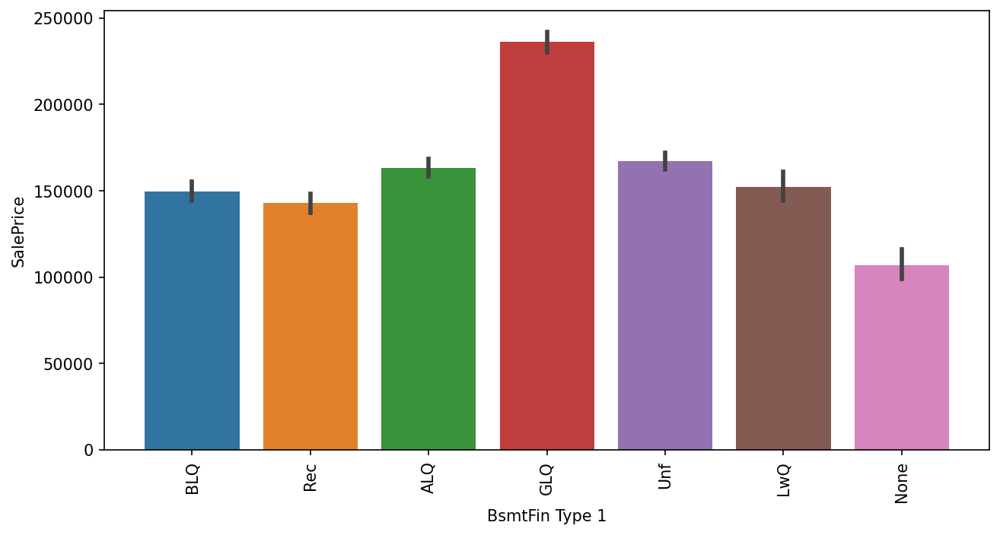

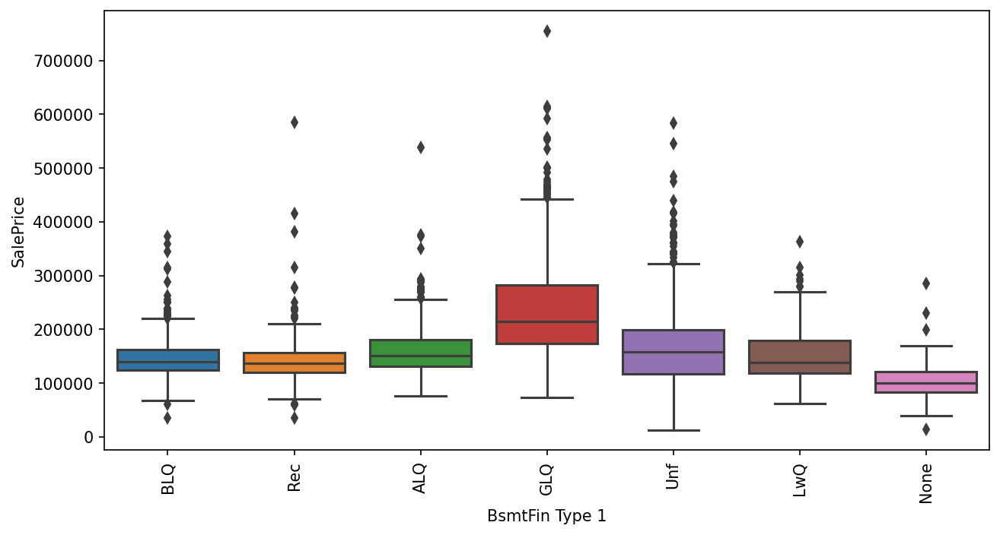

In [244]:
plot_cat(col[33])

In [245]:
df[col[33]] = df[col[33]].apply(lambda x: 1 if x=='GLQ' else (2 if x=='Unf' else 0))

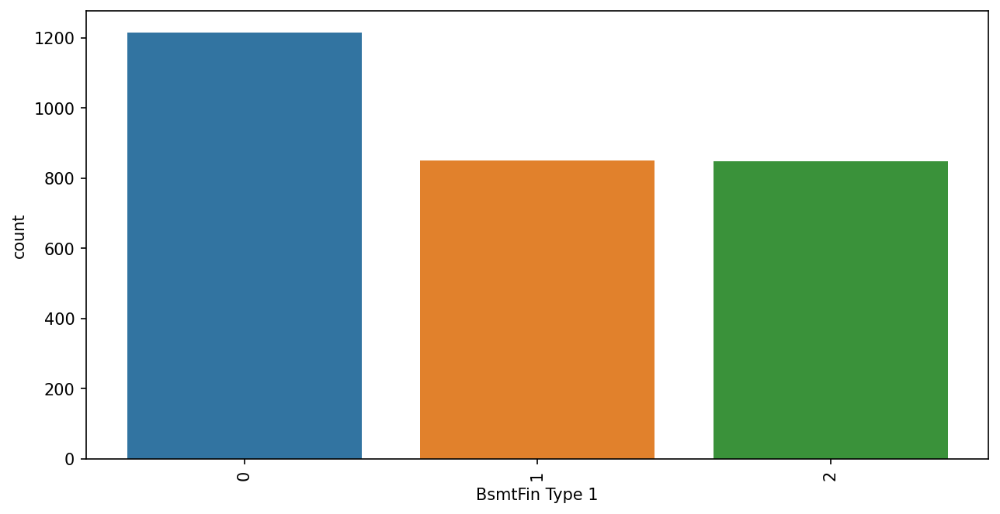

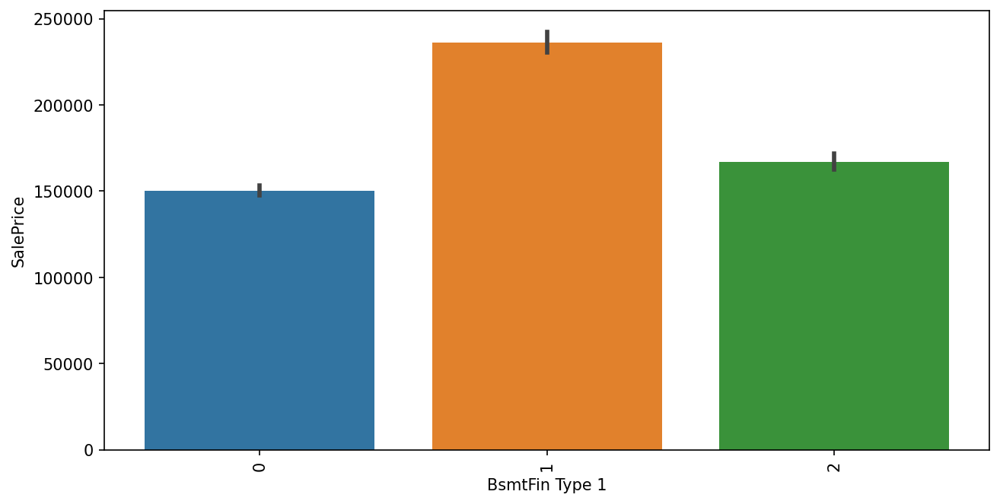

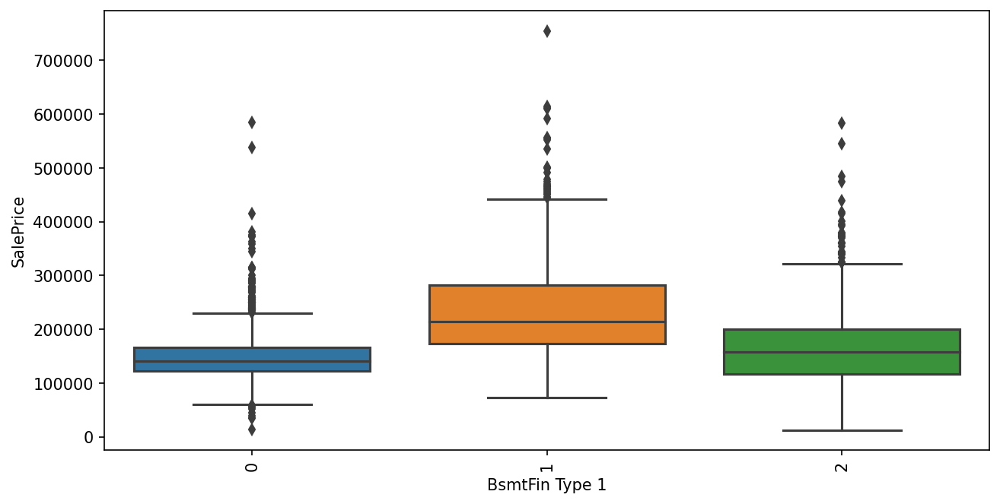

In [246]:
plot_cat(col[33])

In [247]:
num.append(col[33])
num[-1]

'BsmtFin Type 1'

In [248]:
col[34]

'BsmtFin SF 1'

<Figure size 1500x750 with 0 Axes>

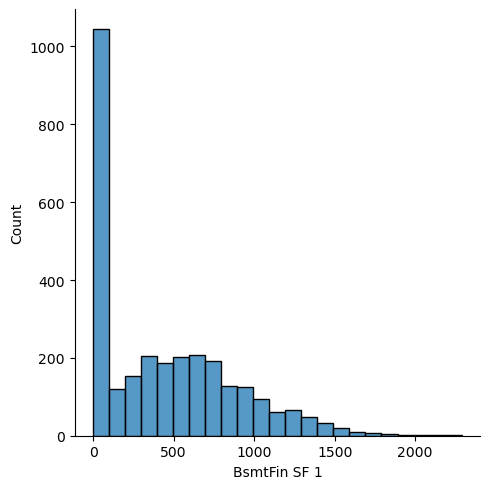

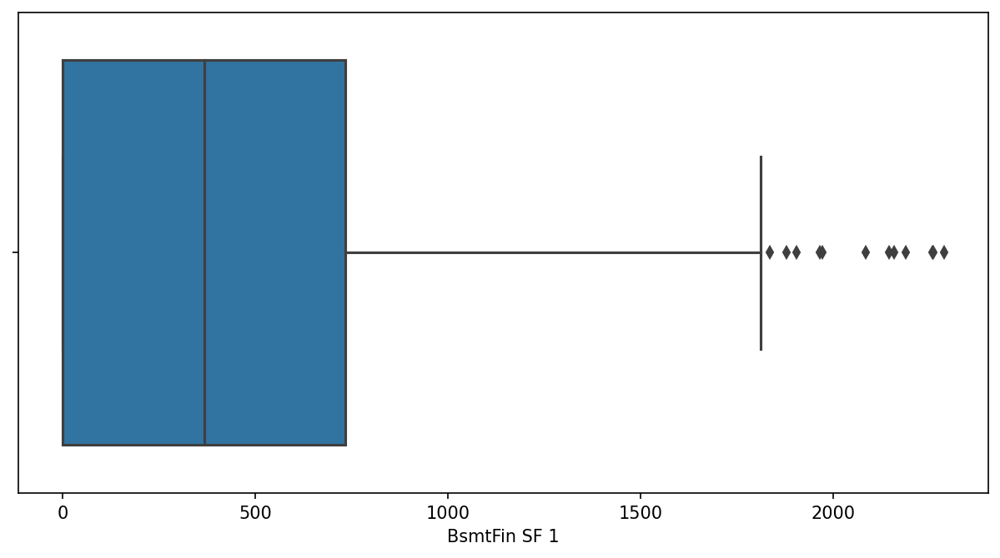

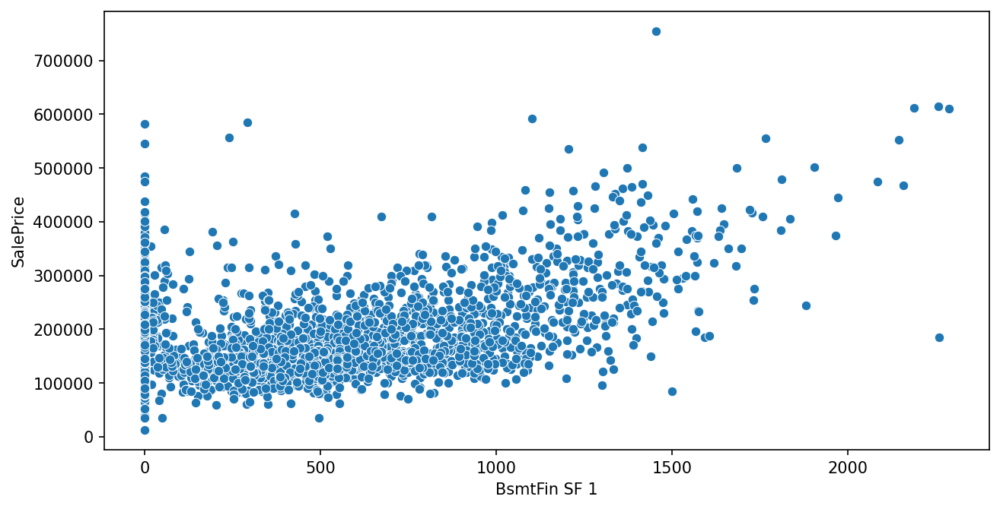

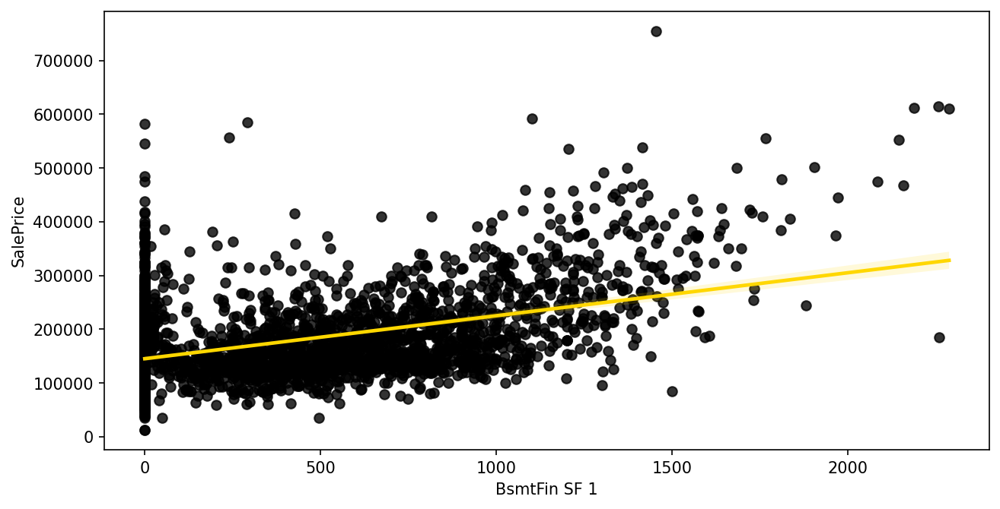

In [249]:
plot_num(col[34])

In [250]:
num.append(col[34])
num[-1]

'BsmtFin SF 1'

In [251]:
col[35]

'BsmtFin Type 2'

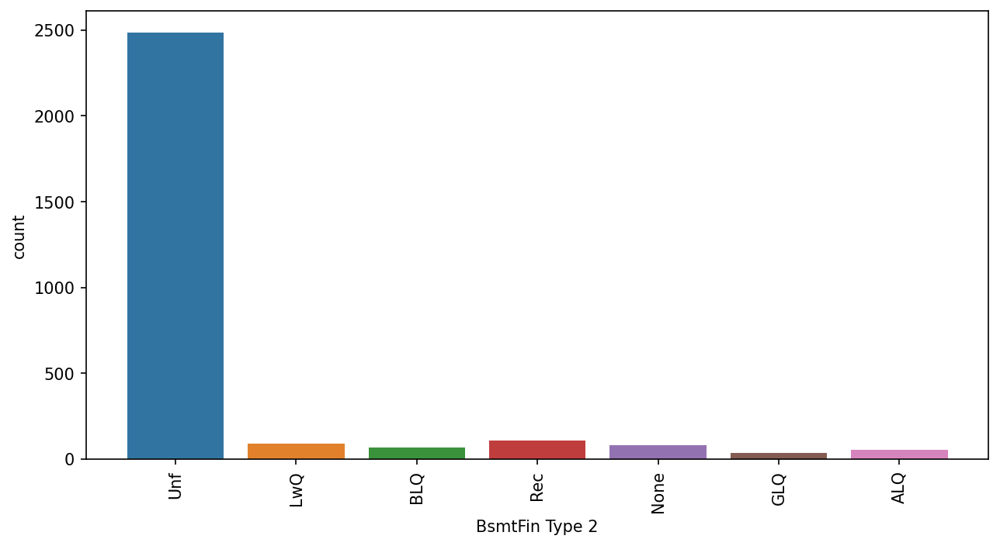

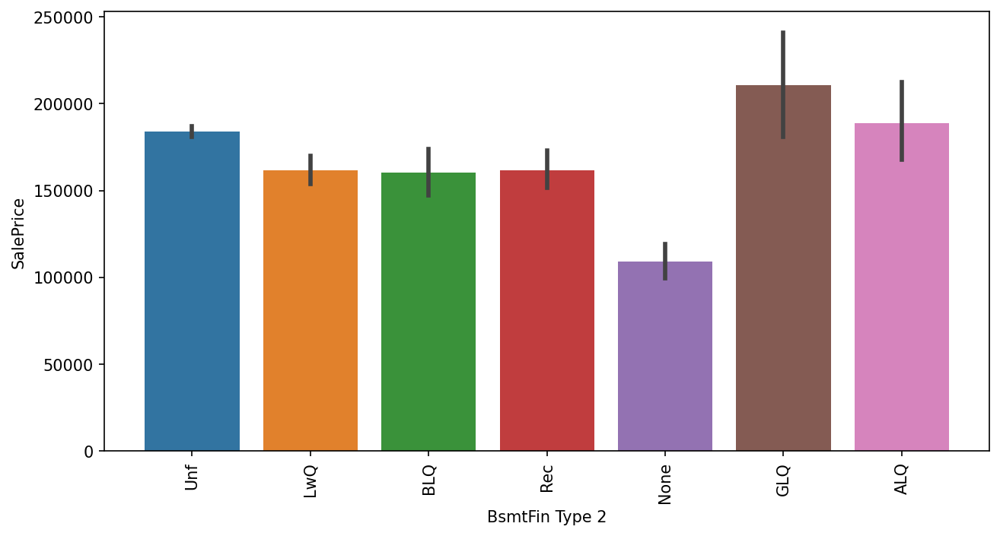

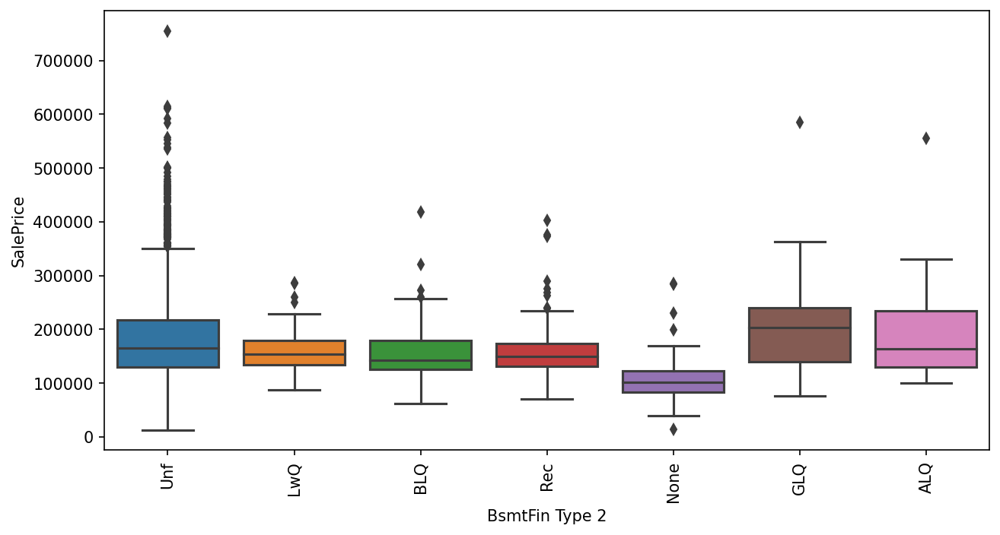

In [252]:
plot_cat(col[35])

In [253]:
df[col[35]] = df[col[35]].apply(lambda x: 1 if x=='GLQ' else (2 if x in ['Unf','ALQ'] else (3 if x=='None' else 0)))

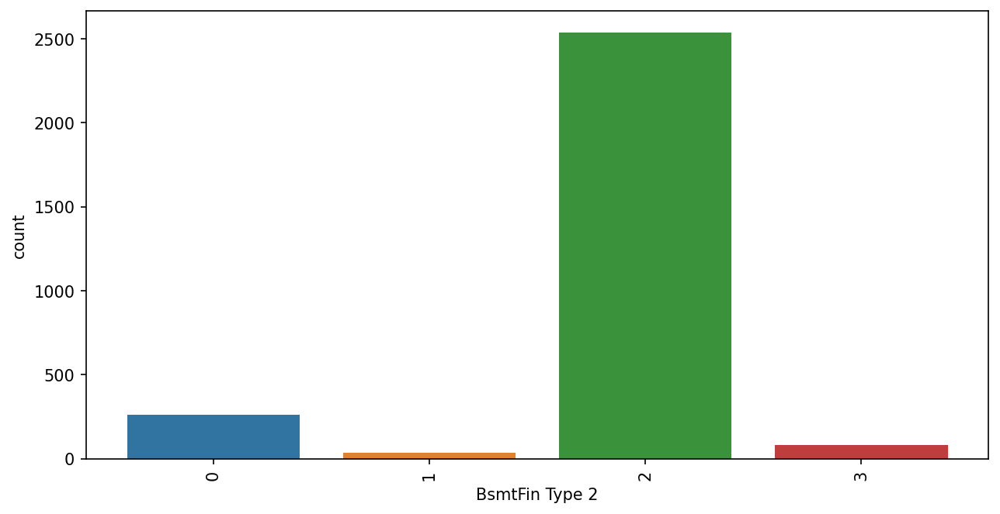

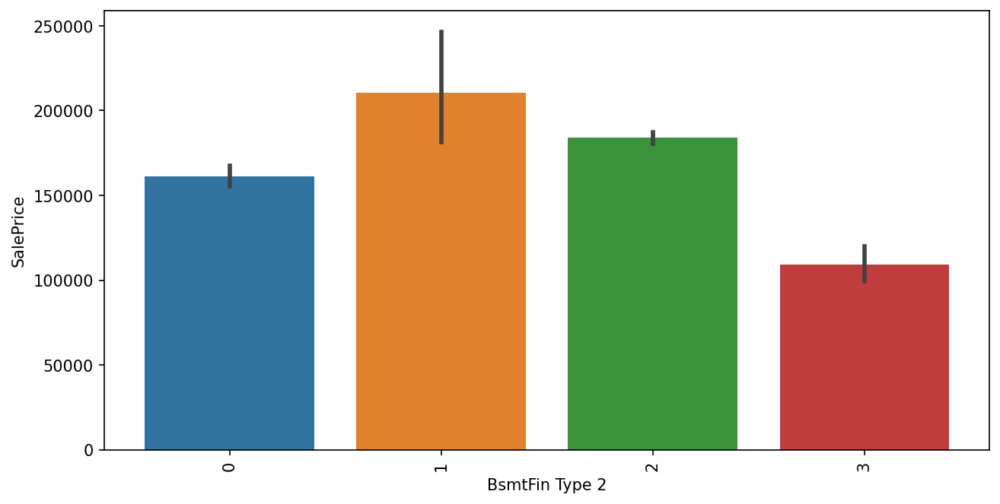

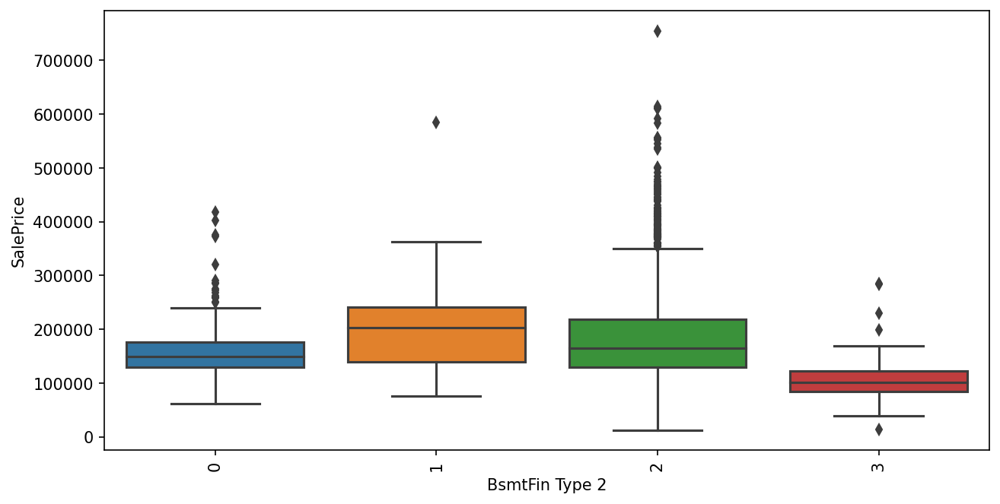

In [254]:
plot_cat(col[35])

In [255]:
num.append(col[35])
num[-1]

'BsmtFin Type 2'

In [256]:
col[36]

'BsmtFin SF 2'

<Figure size 1500x750 with 0 Axes>

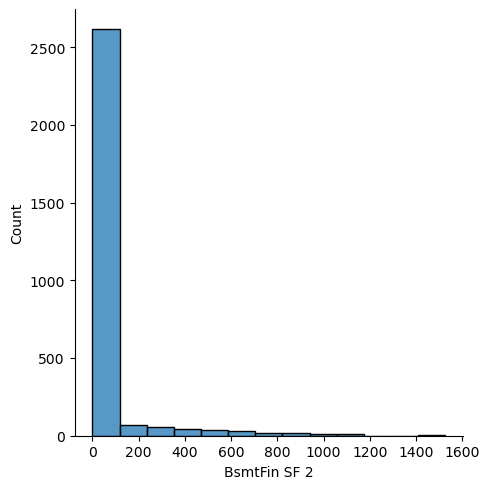

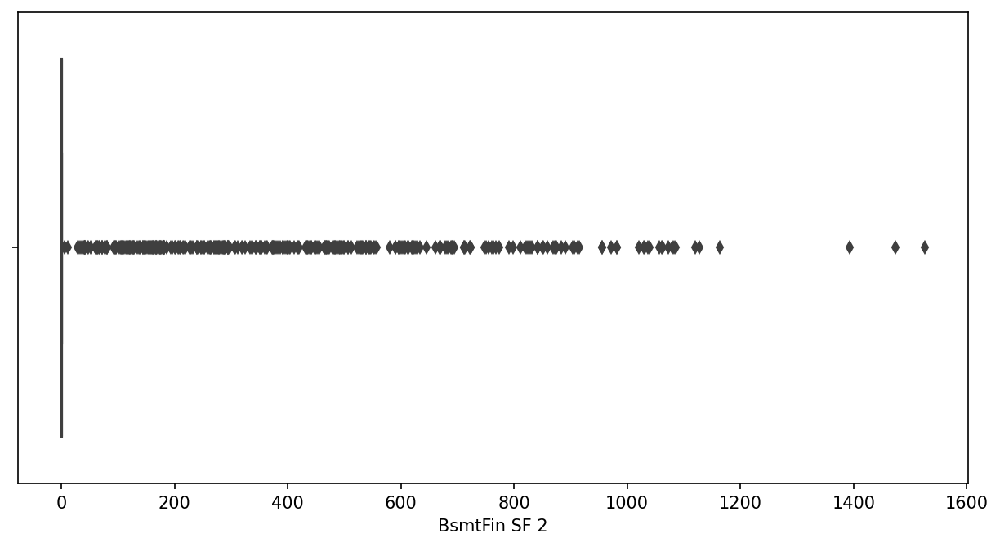

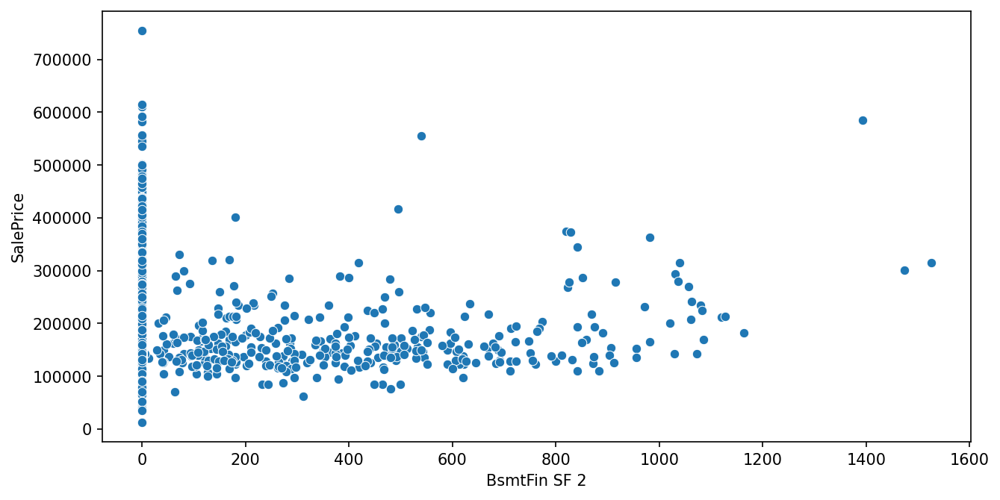

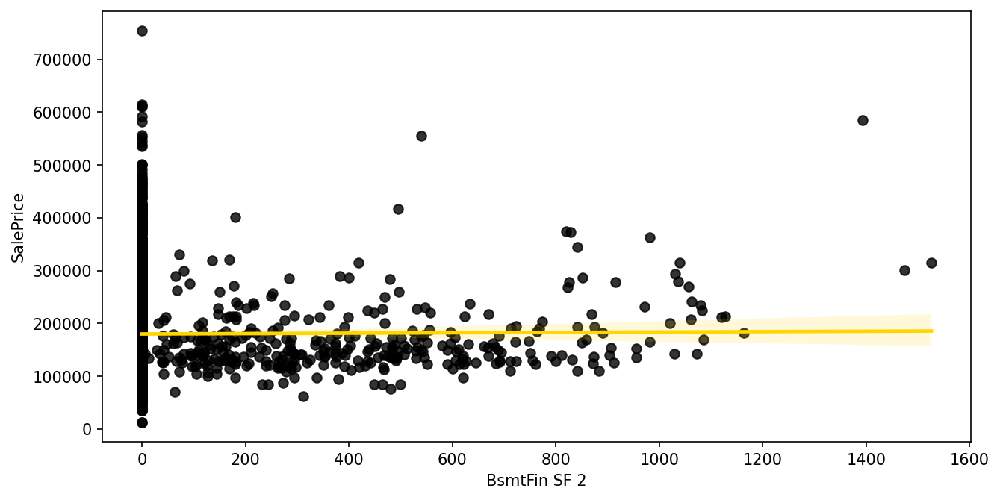

In [257]:
plot_num(col[36])

* Eliminating this feature because sale prices doesnt change much wrt this feature

In [258]:
# df = df.drop(col[36],axis=1)

In [259]:
col[37]

'Bsmt Unf SF'

<Figure size 1500x750 with 0 Axes>

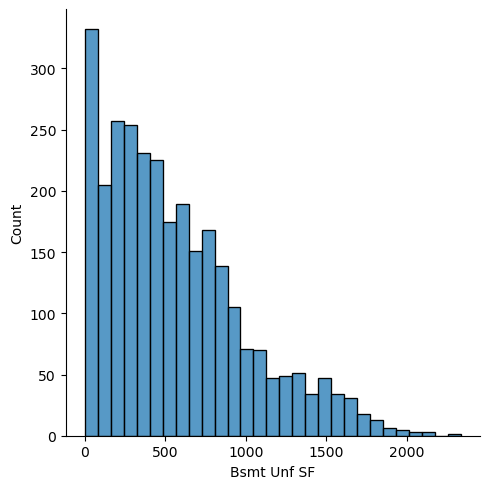

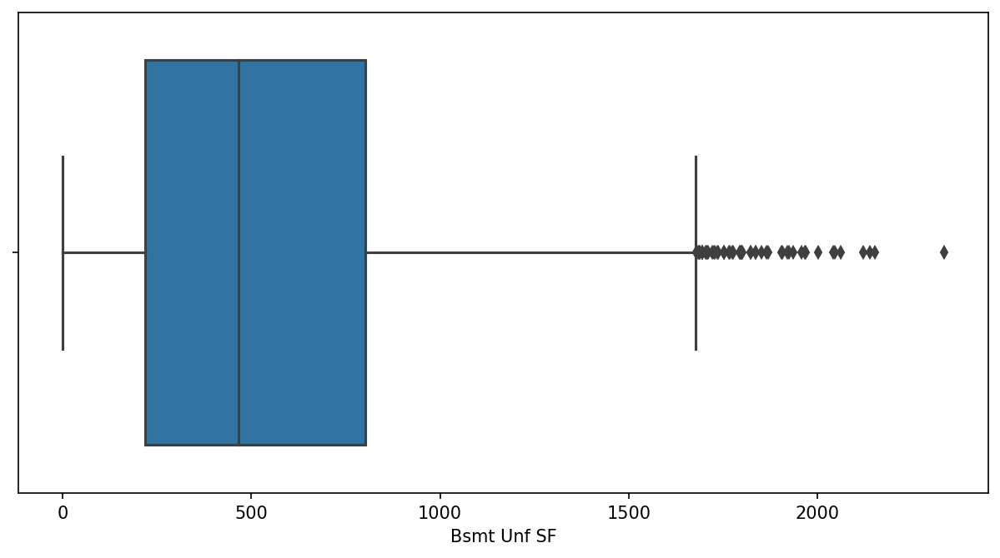

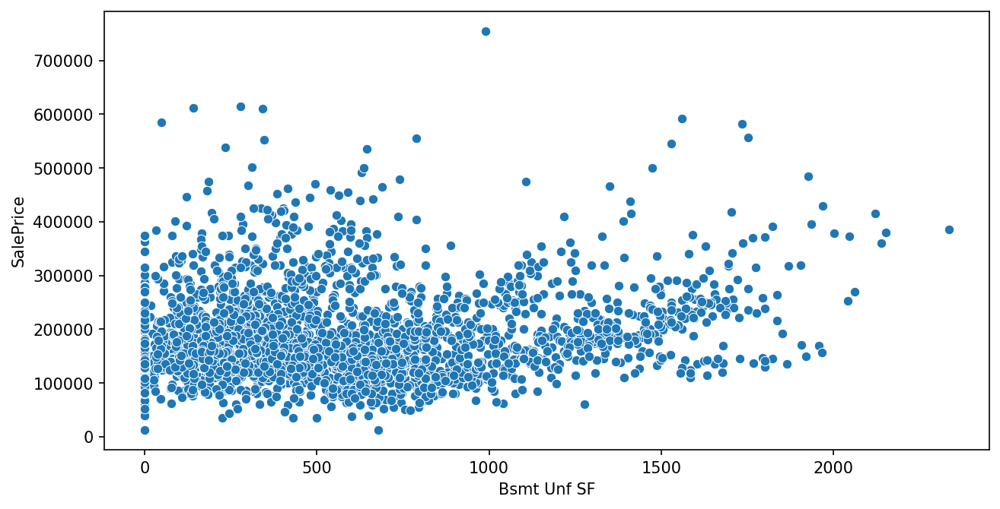

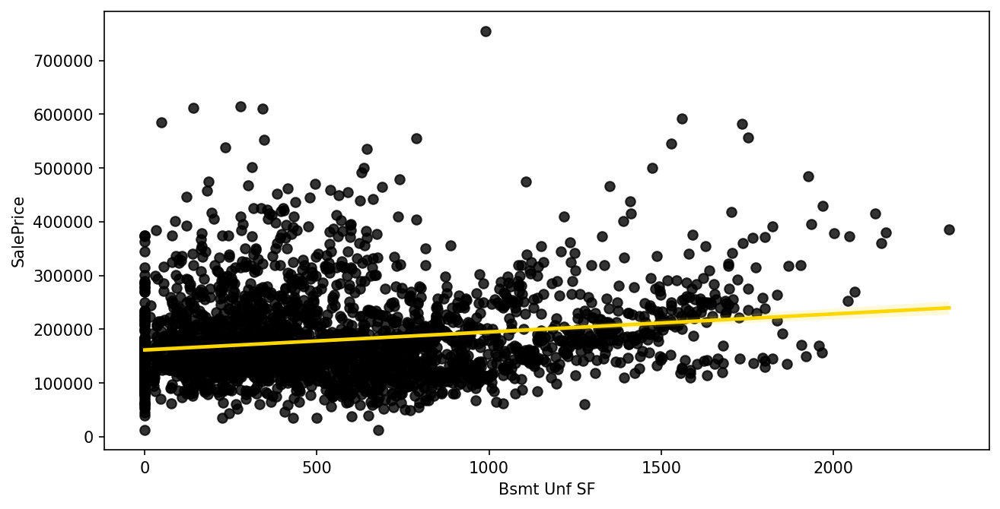

In [260]:
plot_num(col[37])

* Eliminating this feature

In [261]:
col[38]

'Total Bsmt SF'

<Figure size 1500x750 with 0 Axes>

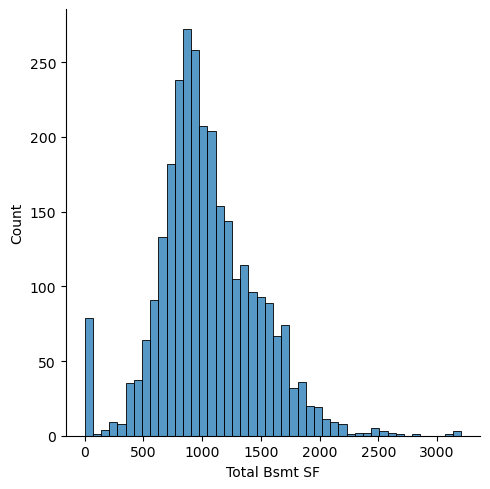

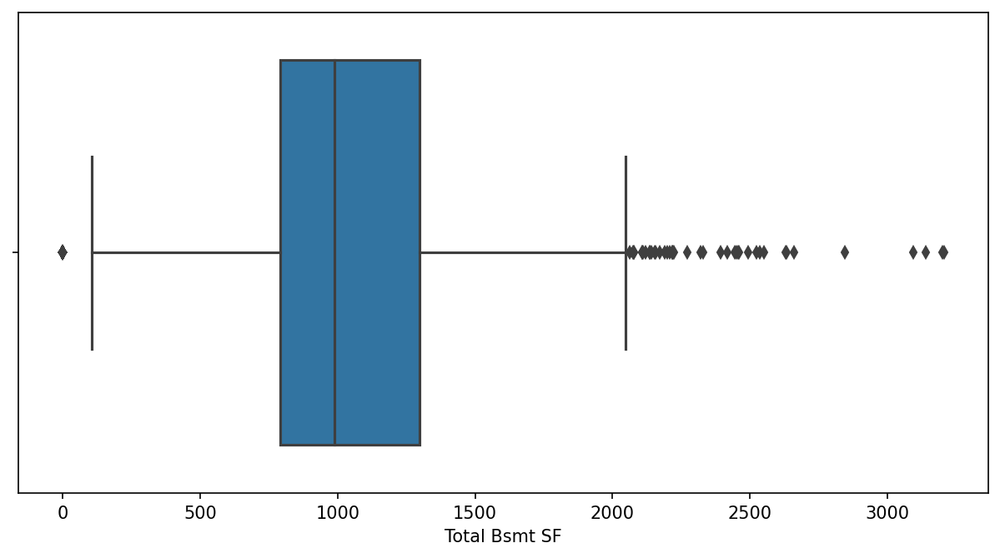

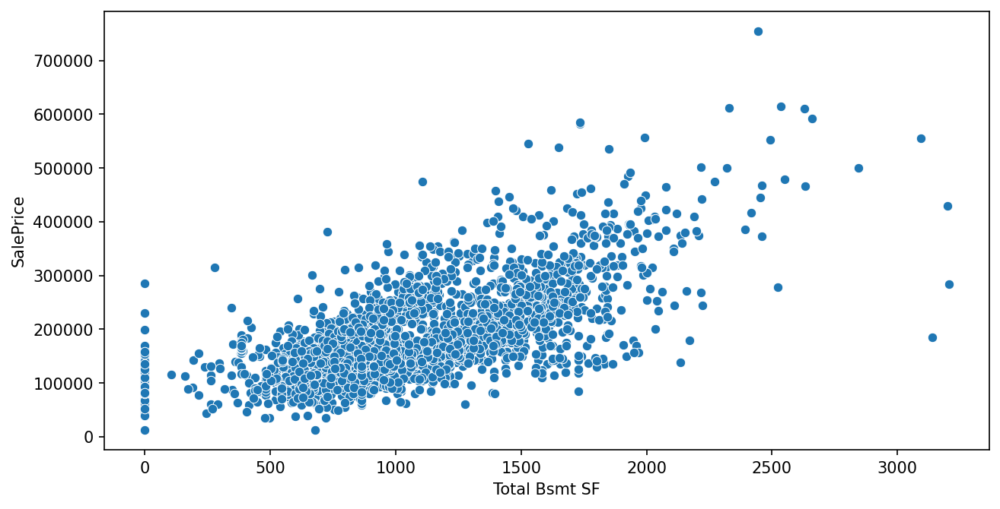

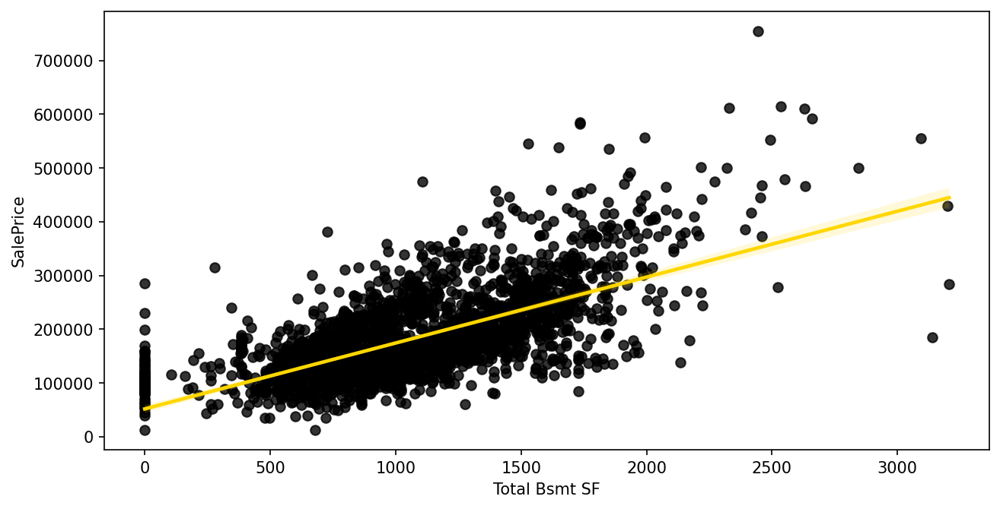

In [262]:
plot_num(col[38])

In [263]:
df = df[df[col[38]]<2750]

<Figure size 1500x750 with 0 Axes>

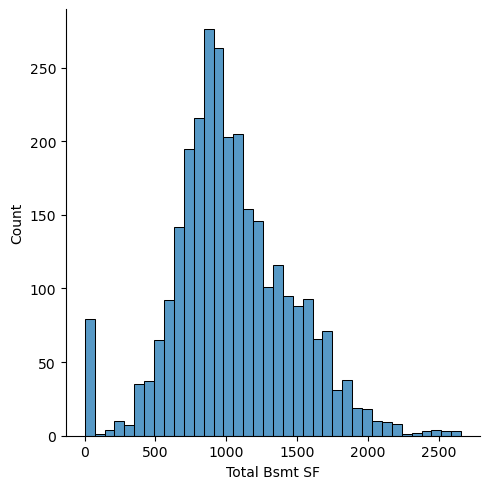

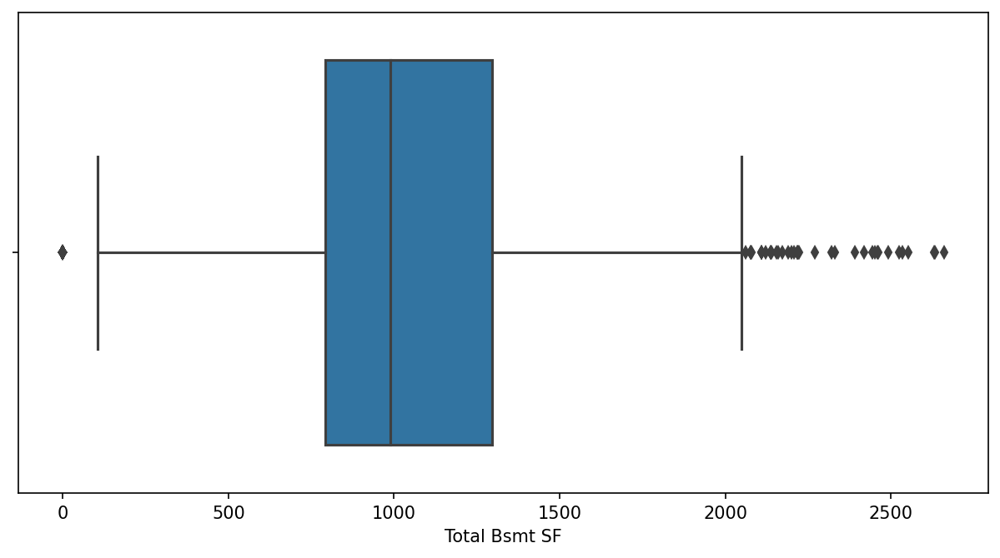

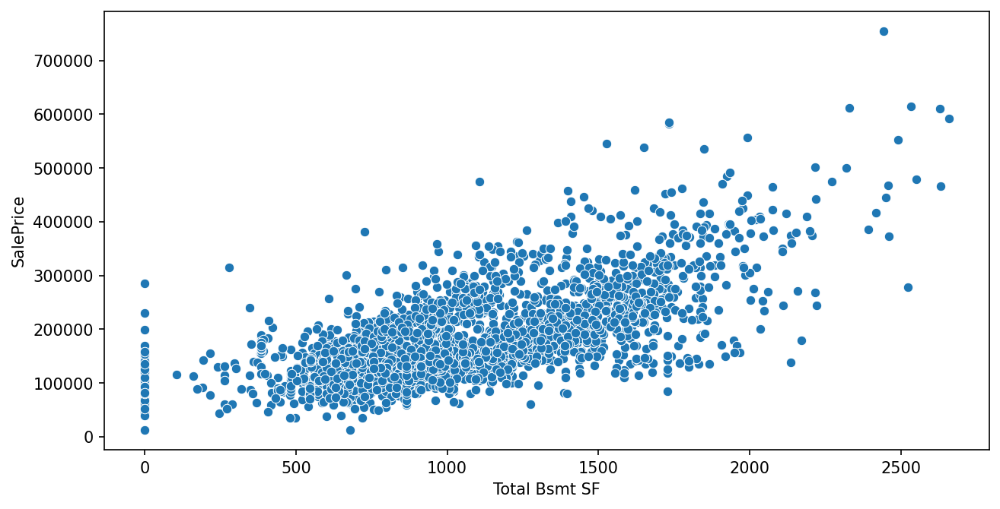

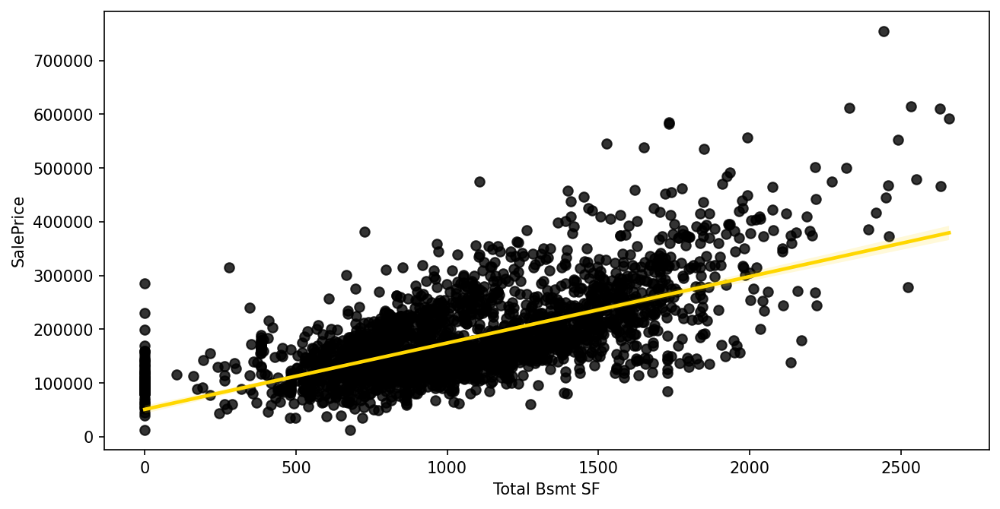

In [264]:
plot_num(col[38])

In [265]:
num.append(col[38])
num[-1]

'Total Bsmt SF'

In [266]:
col[39]

'Heating'

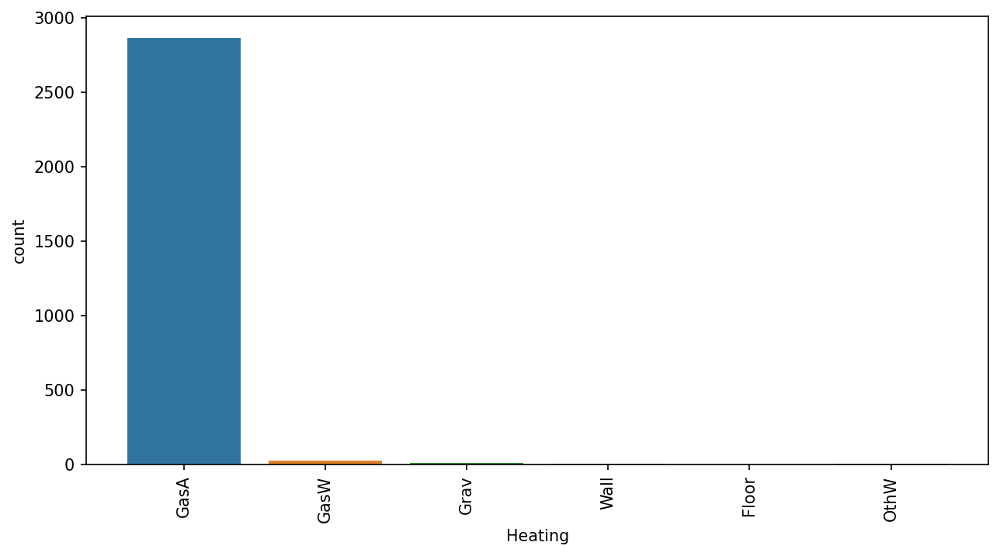

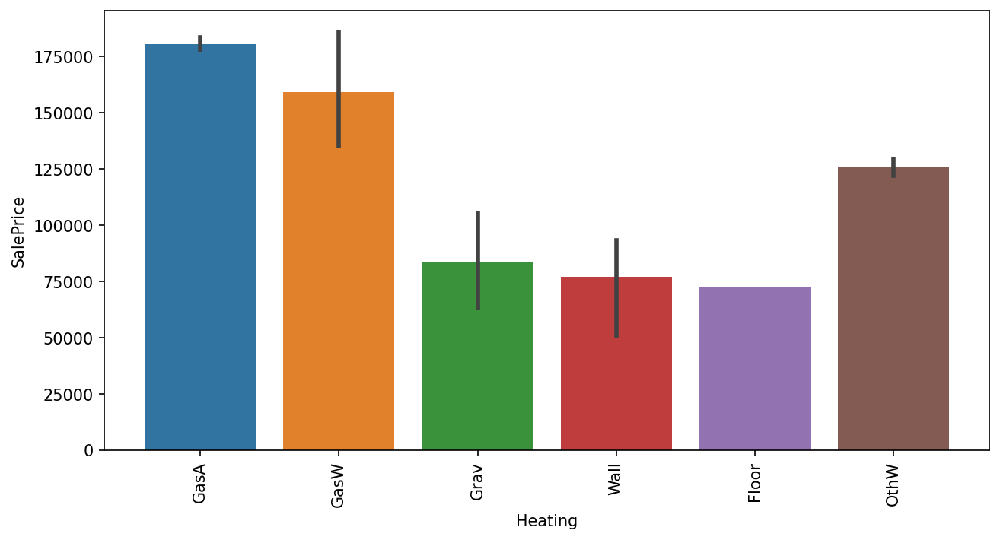

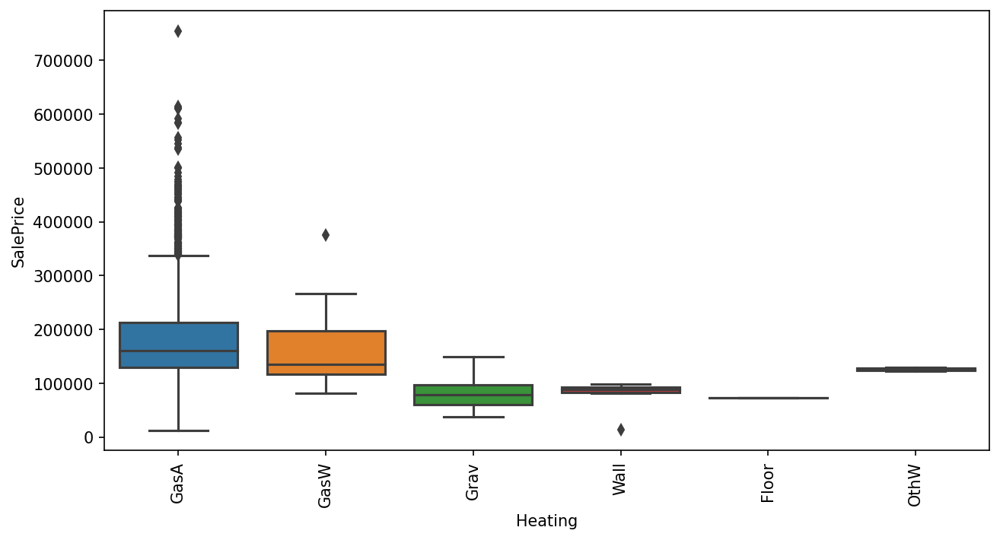

In [267]:
plot_cat(col[39])

In [268]:
df[col[39]] = df[col[39]].apply(lambda x: 1 if x=='GasA' else (2 if x=='GasW' else 0))

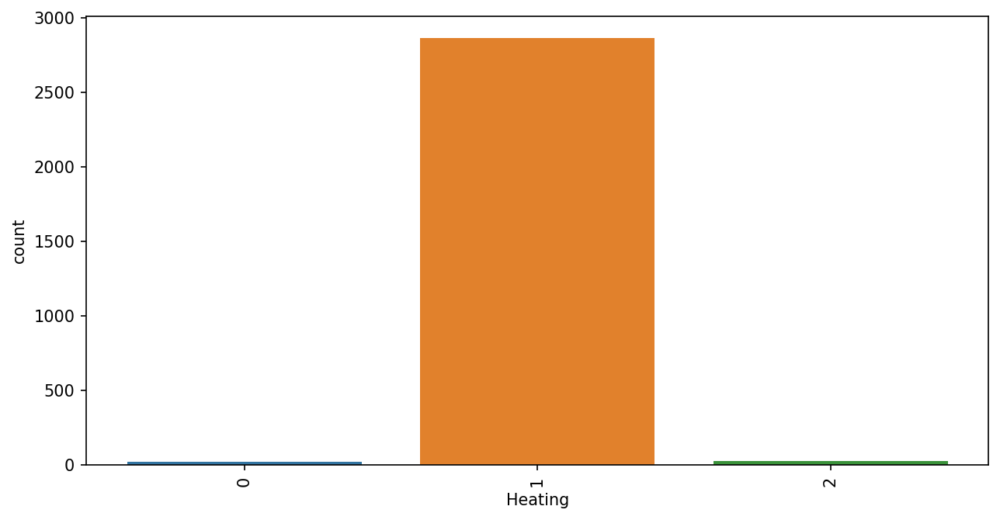

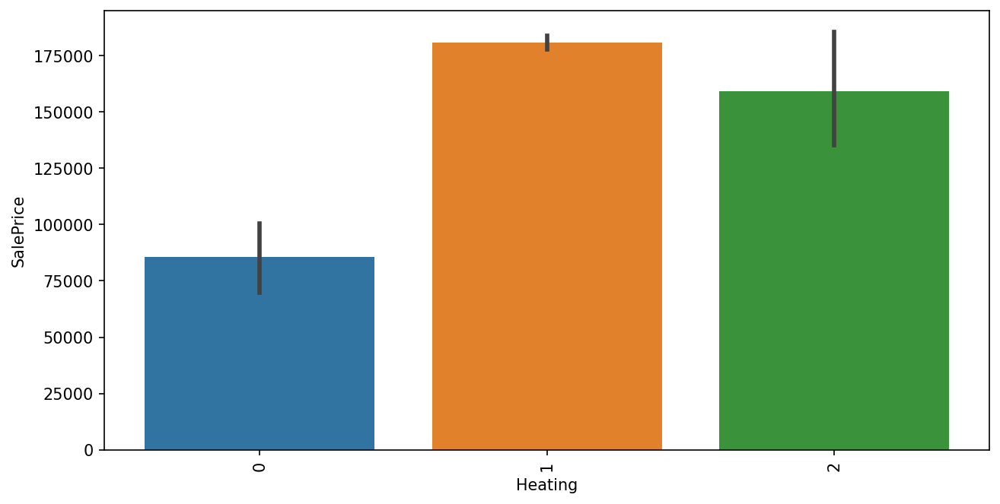

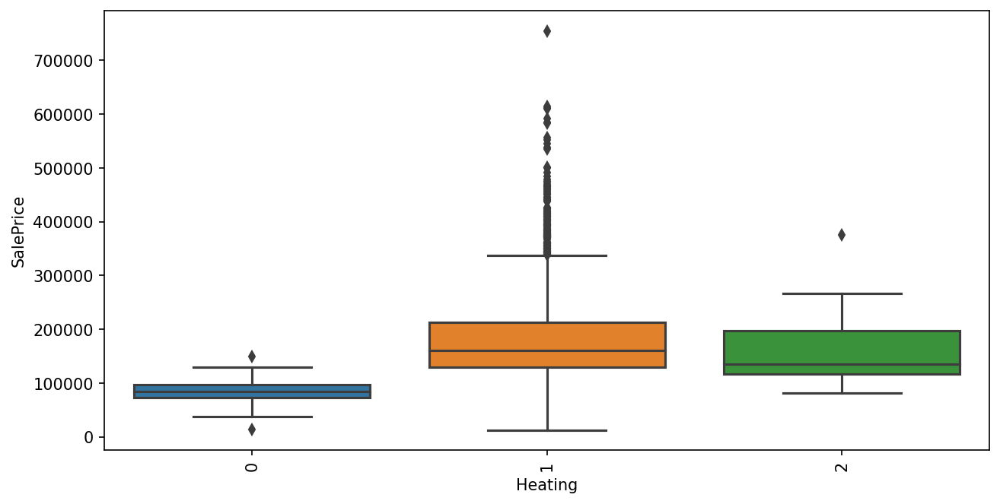

In [269]:
plot_cat(col[39])

In [270]:
num.append(col[39])
num[-1]

'Heating'

In [271]:
col[40]

'Heating QC'

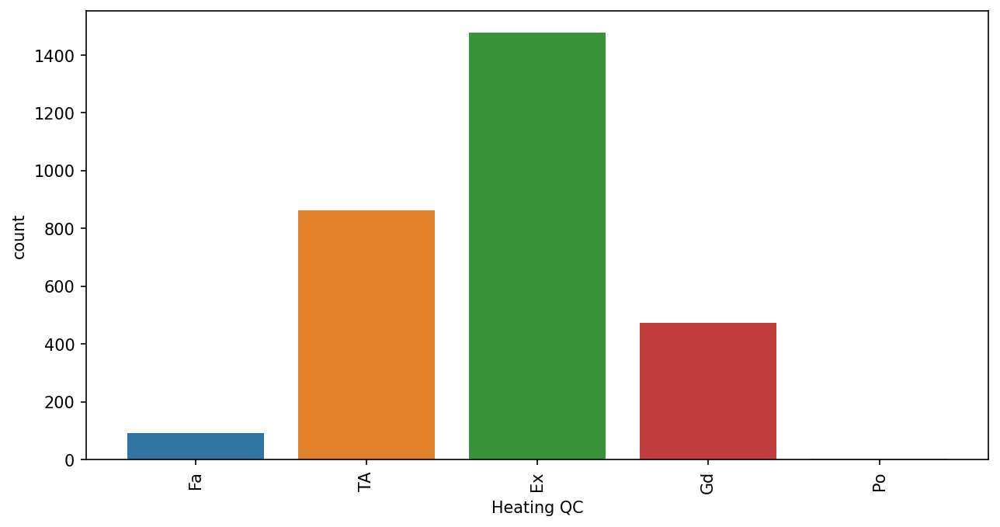

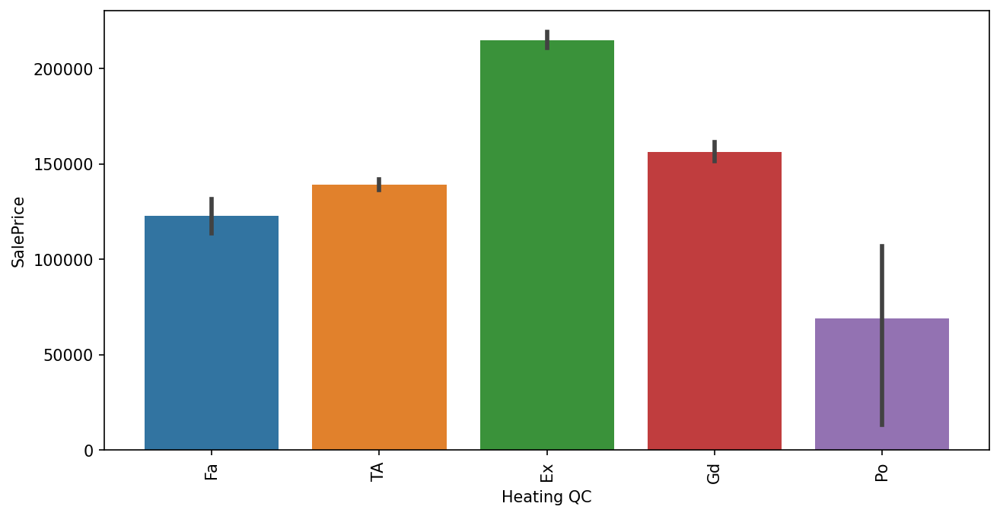

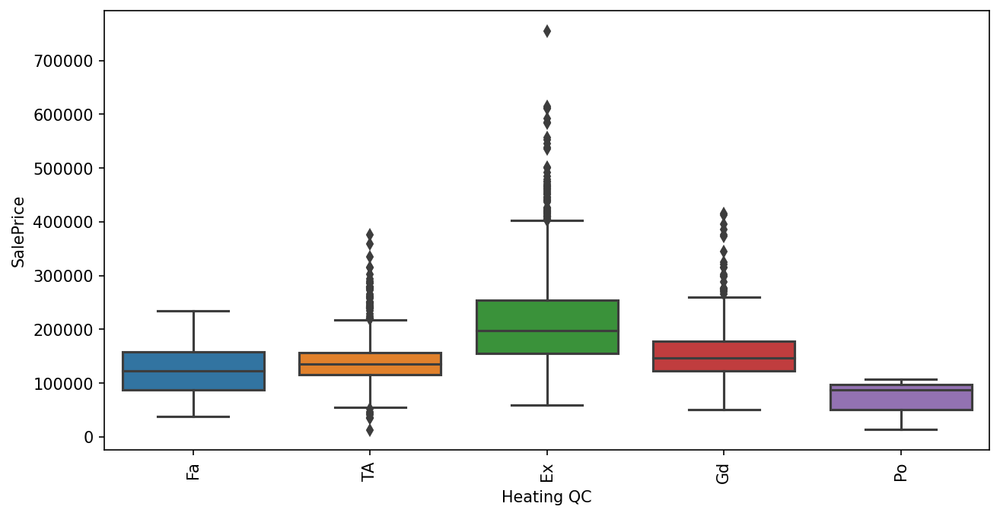

In [272]:
plot_cat(col[40])

In [273]:
cat.append(col[40])
cat[-1]

'Heating QC'

In [274]:
col[41]

'Central Air'

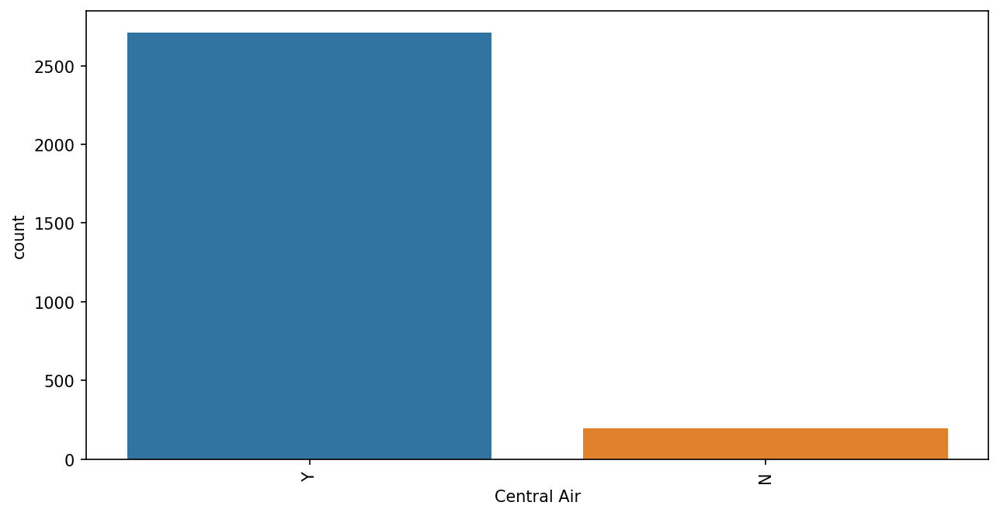

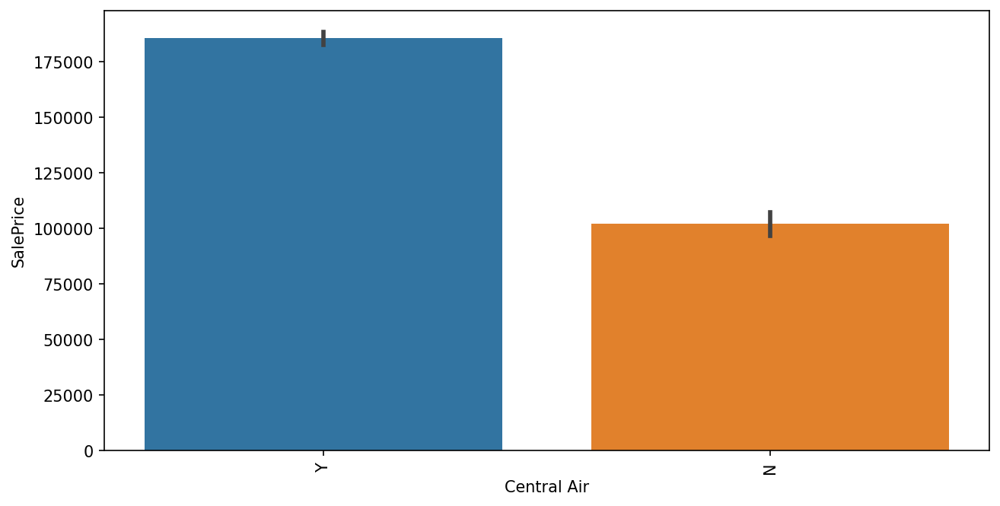

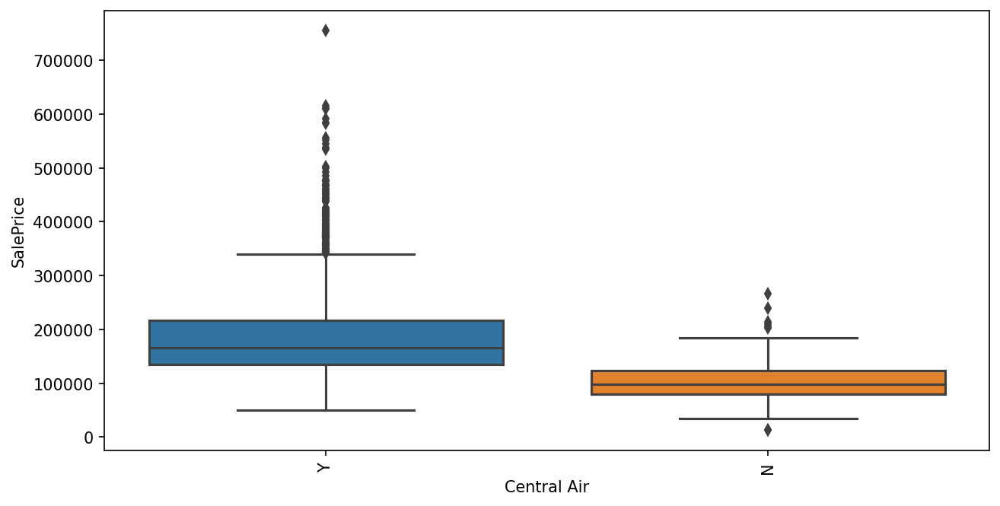

In [275]:
plot_cat(col[41])

* House with central air conditioning cost more

In [276]:
cat.append(col[41])
cat[-1]

'Central Air'

In [277]:
col[42]

'Electrical'

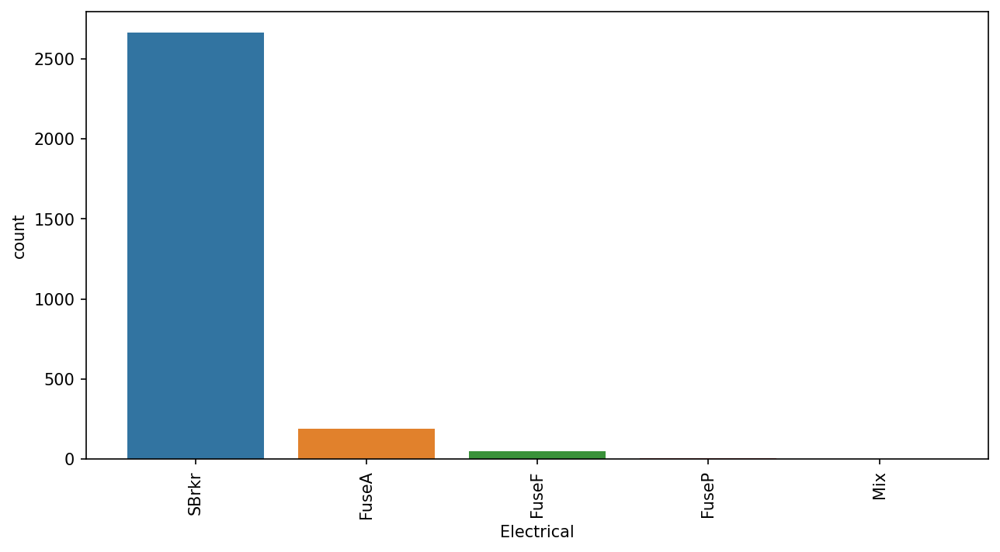

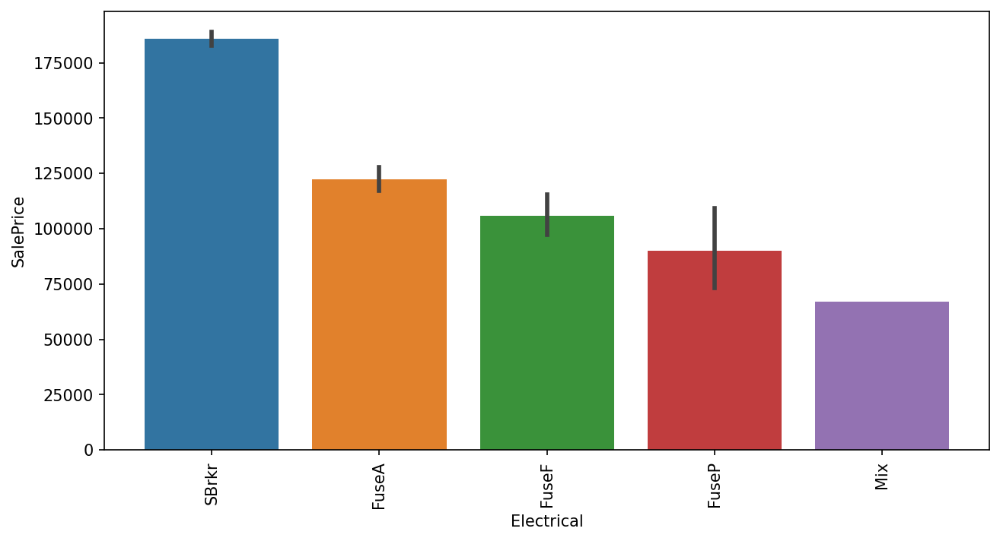

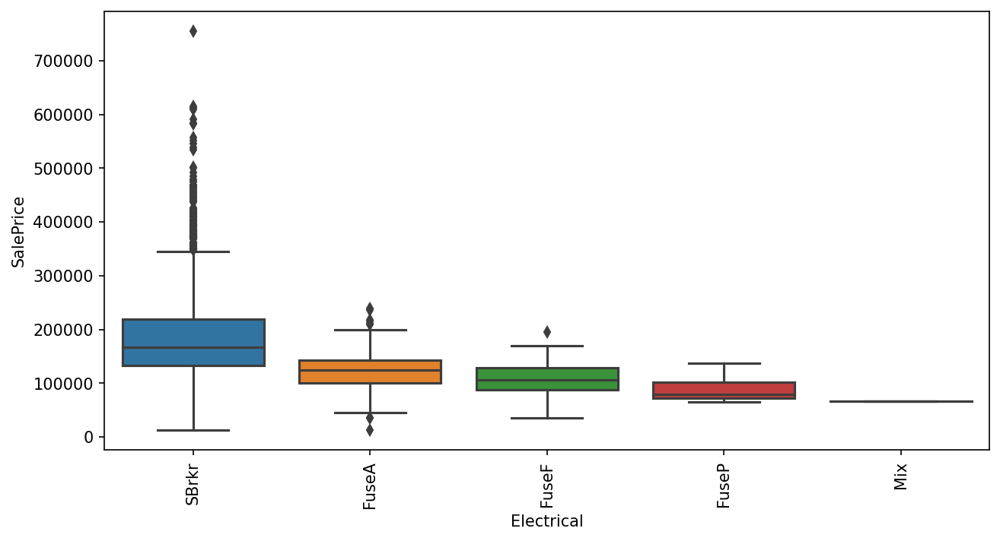

In [278]:
plot_cat(col[42])

In [279]:
cat.append(col[42])
cat[-1]

'Electrical'

In [280]:
col[43]

'1st Flr SF'

<Figure size 1500x750 with 0 Axes>

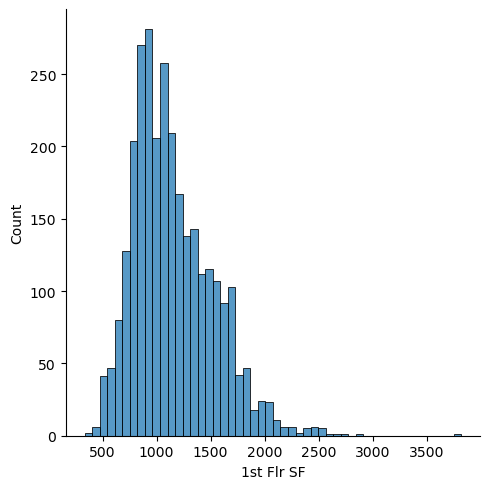

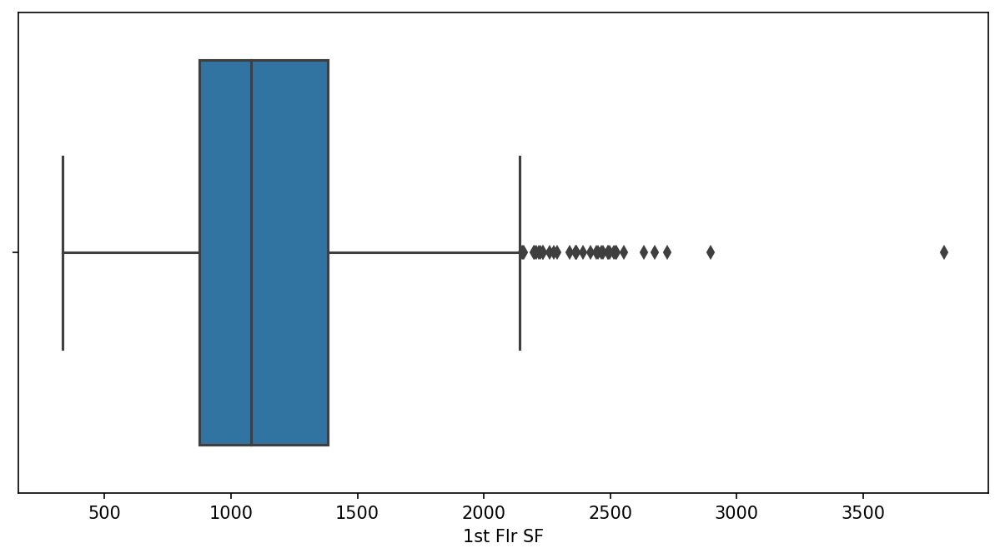

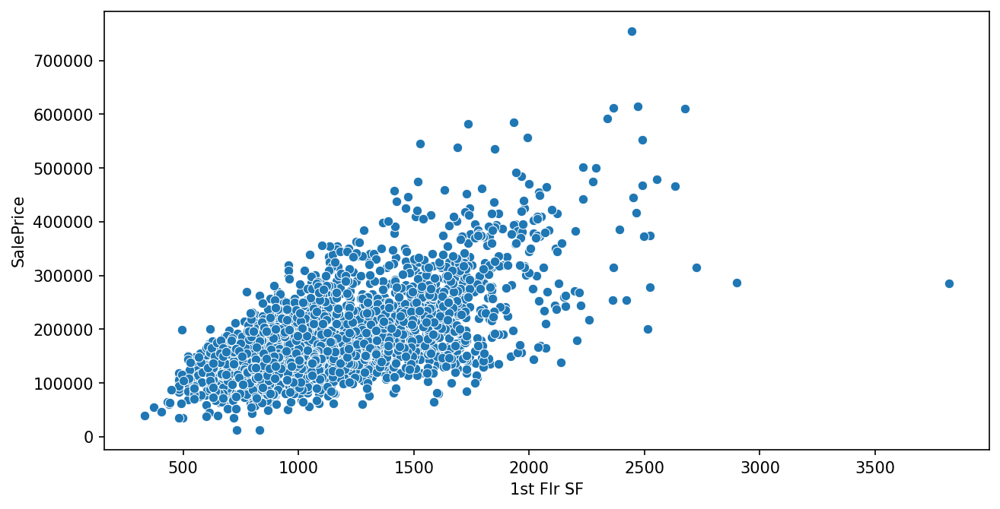

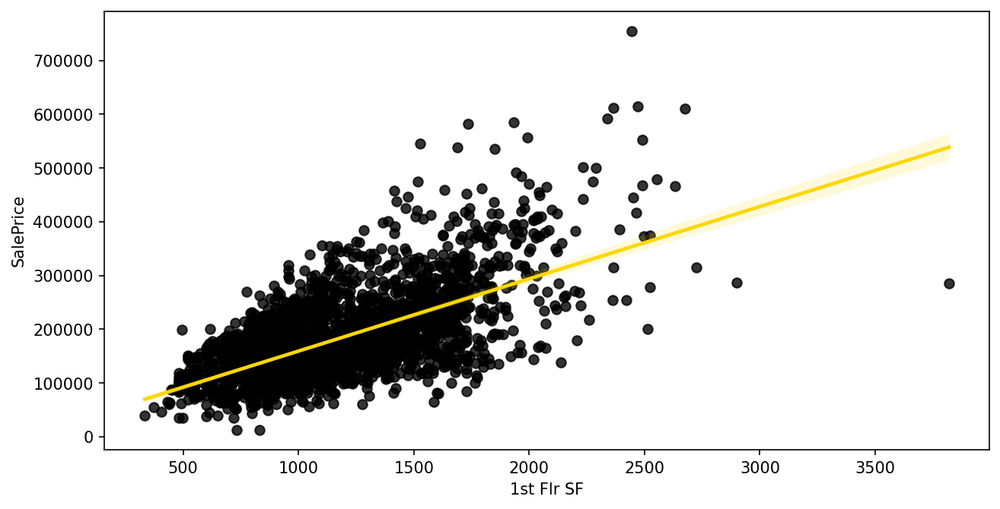

In [281]:
plot_num(col[43])

In [282]:
df = df[df[col[43]]<2700]

<Figure size 1500x750 with 0 Axes>

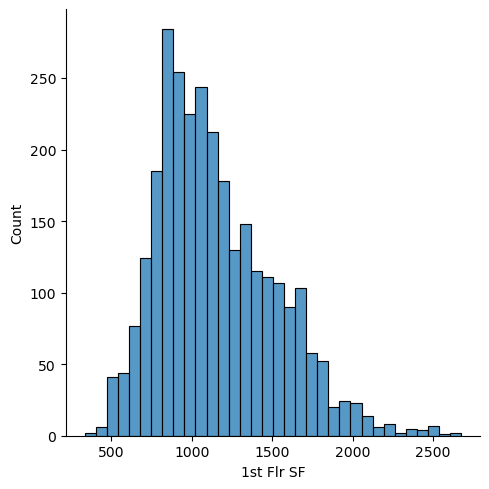

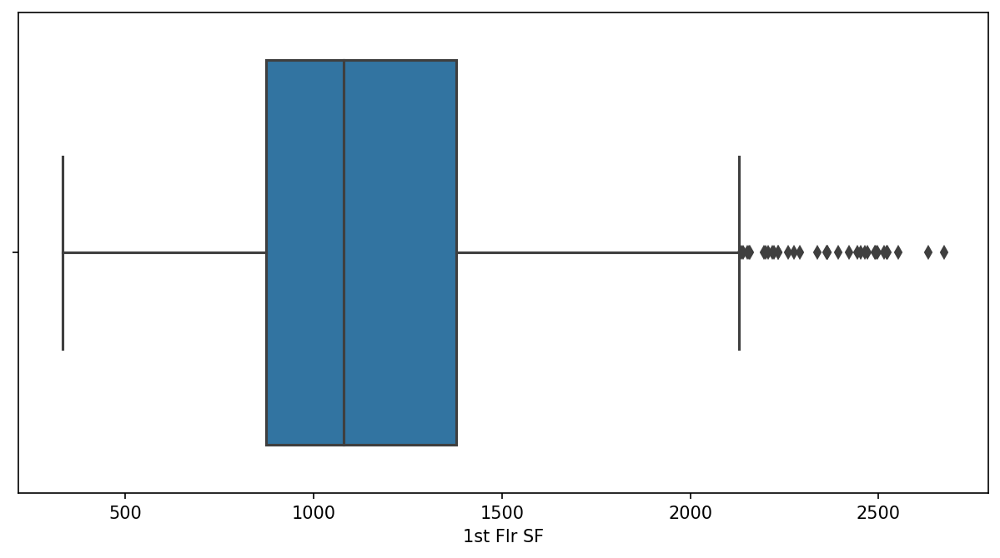

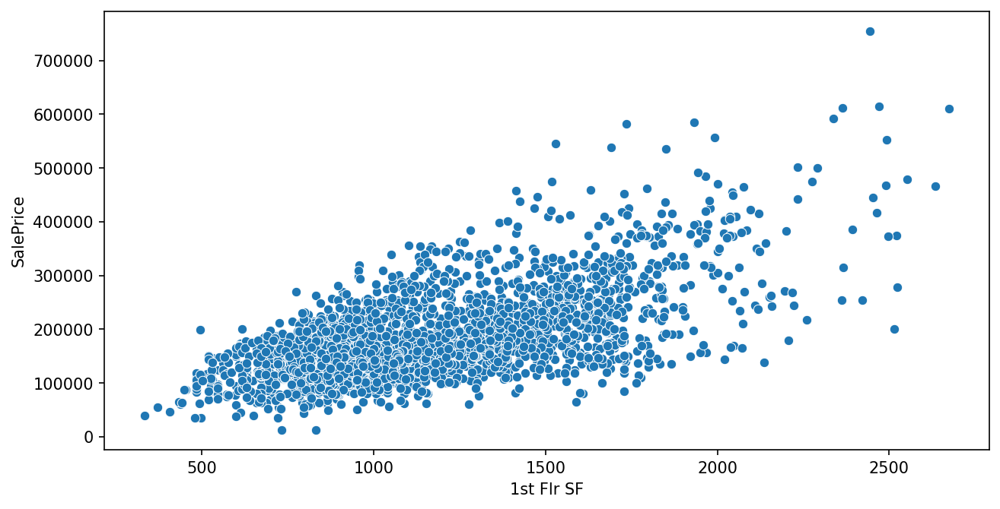

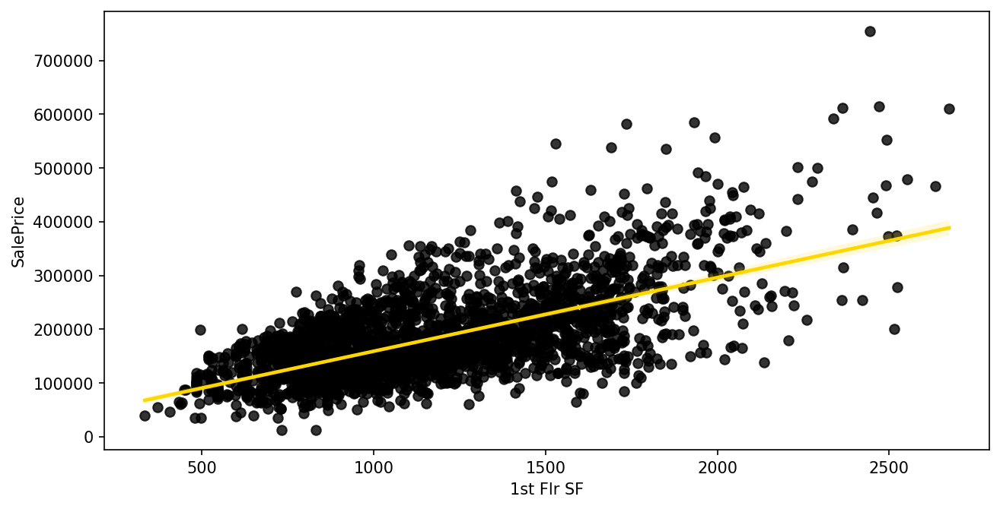

In [283]:
plot_num(col[43])

* saleprice increases with increase in 1st flr sf

In [284]:
num.append(col[43])
num[-1]

'1st Flr SF'

In [285]:
col[44]

'2nd Flr SF'

<Figure size 1500x750 with 0 Axes>

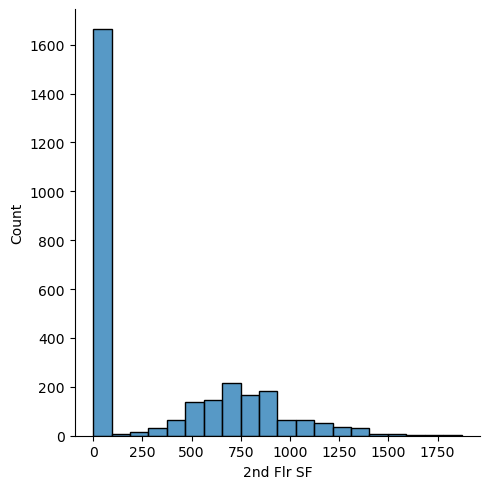

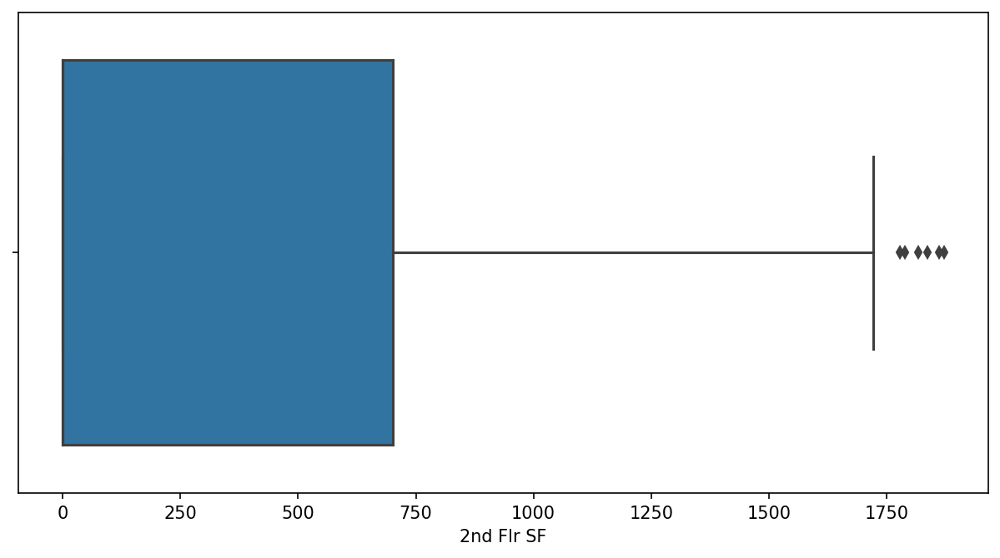

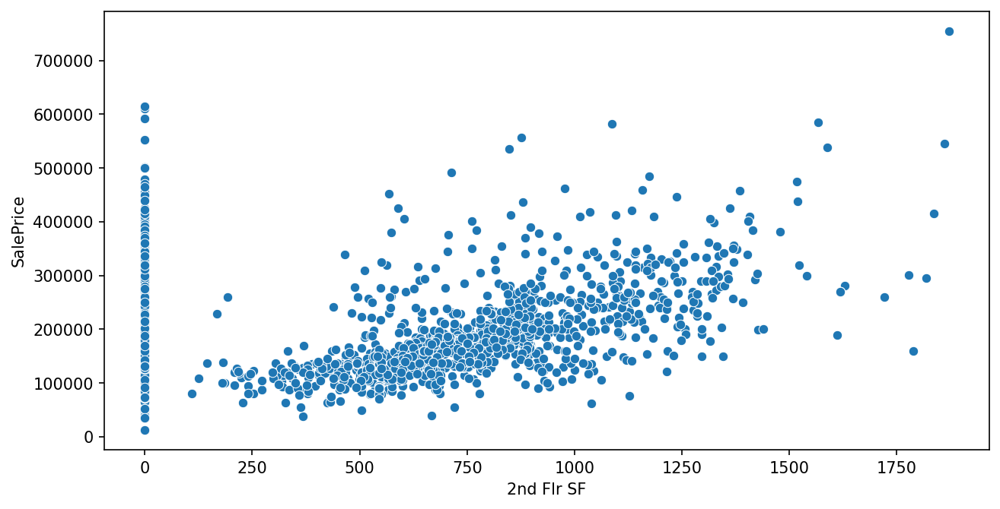

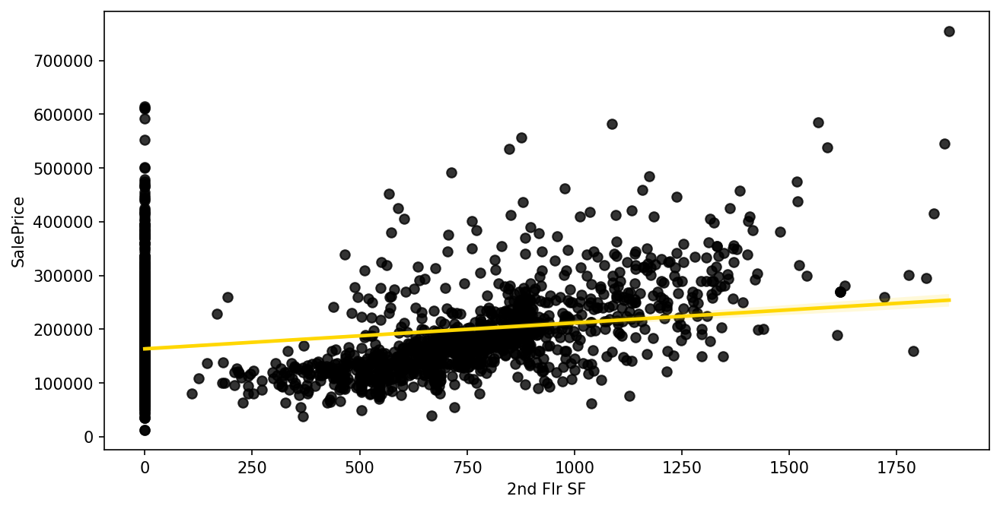

In [286]:
plot_num(col[44])

In [287]:
df = df[df[col[44]]<1750]

<Figure size 1500x750 with 0 Axes>

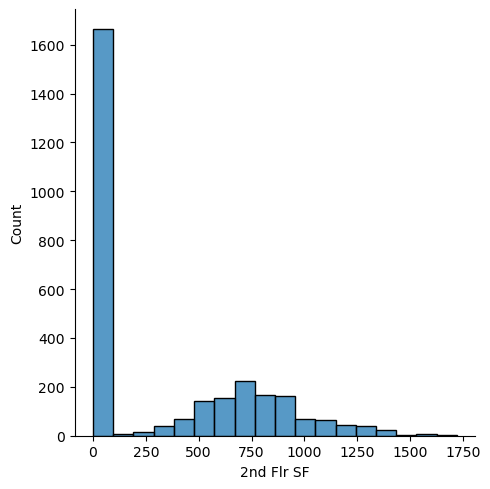

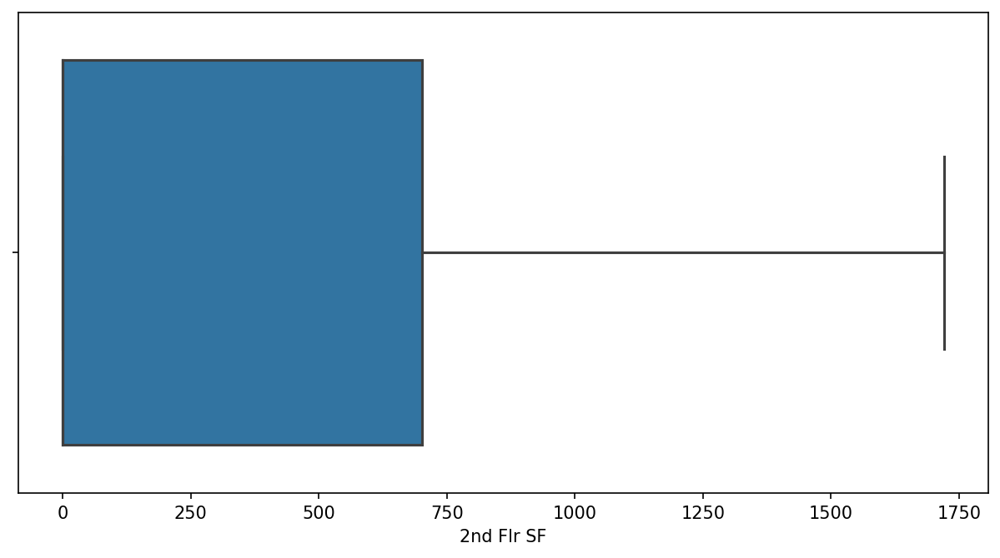

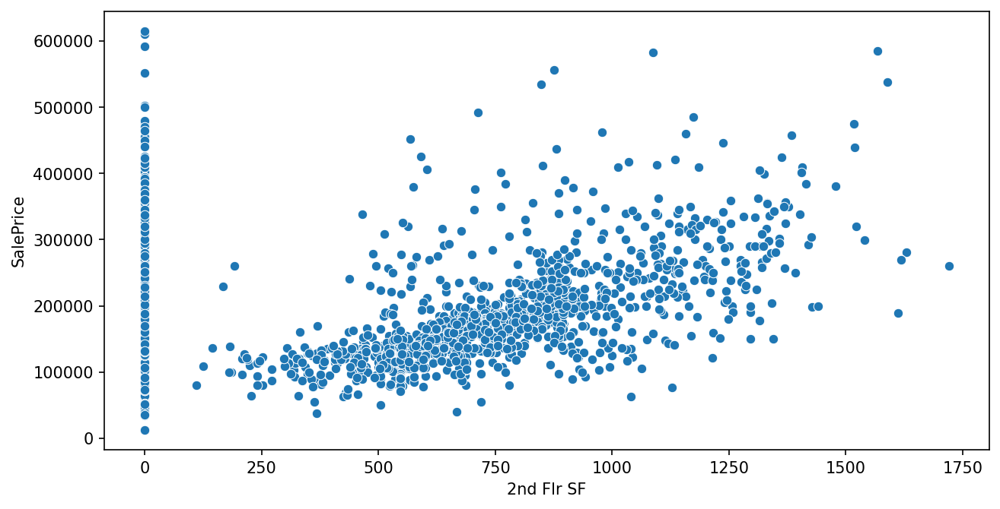

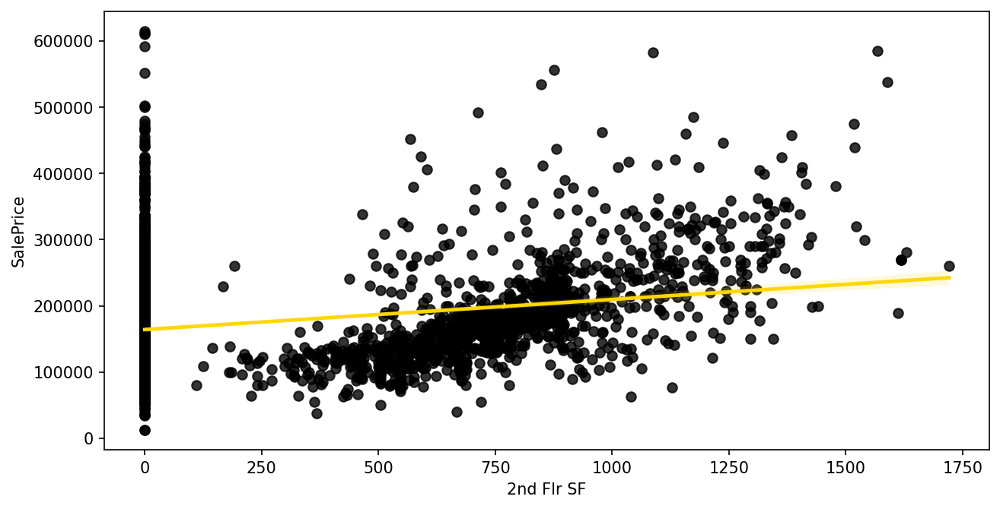

In [288]:
plot_num(col[44])

In [289]:
num.append(col[44])
num[-1]

'2nd Flr SF'

In [290]:
col[45]

'Low Qual Fin SF'

<Figure size 1500x750 with 0 Axes>

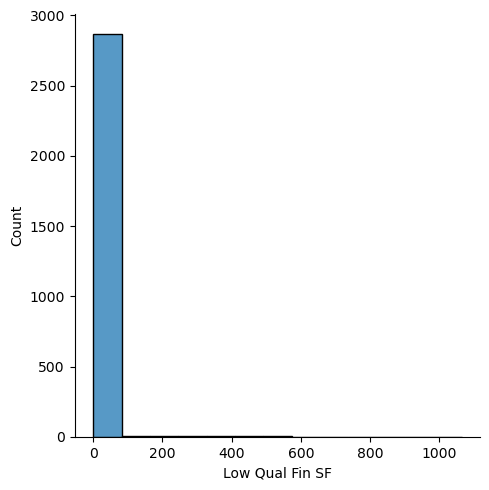

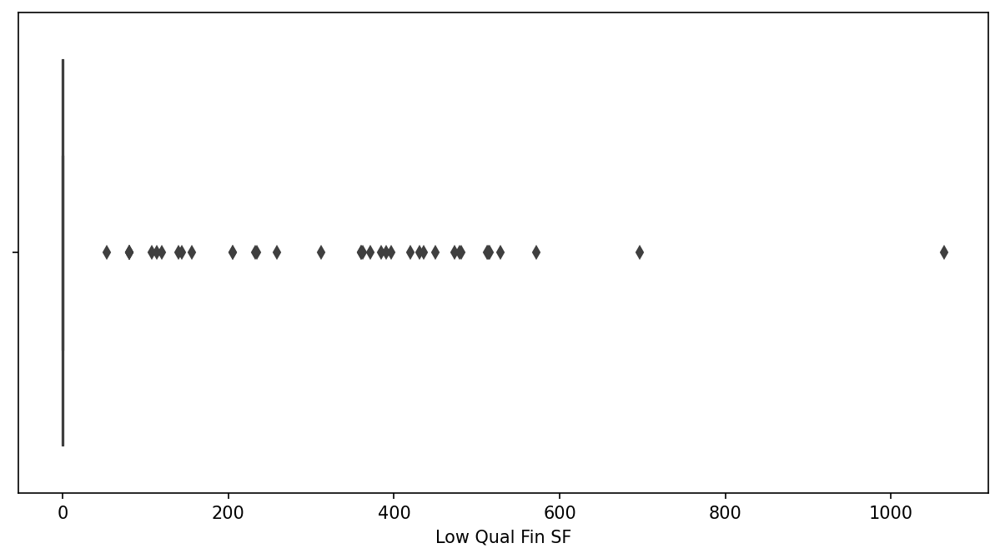

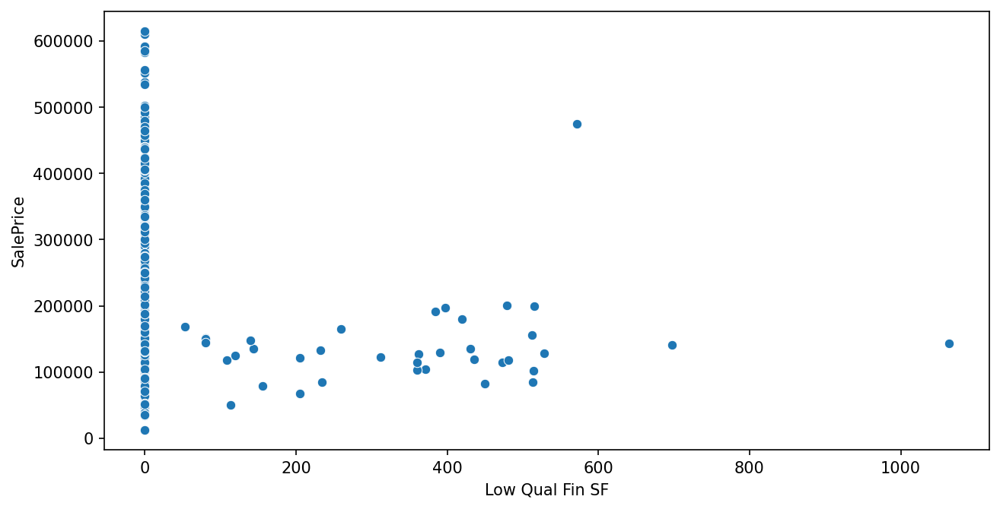

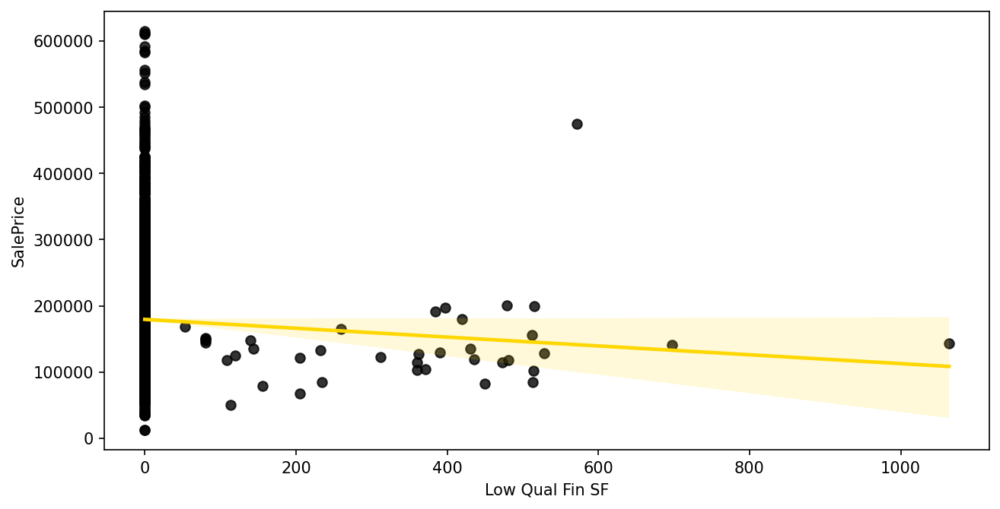

In [291]:
plot_num(col[45])

* Eliminating Feature

In [292]:
col[46]

'Gr Liv Area'

<Figure size 1500x750 with 0 Axes>

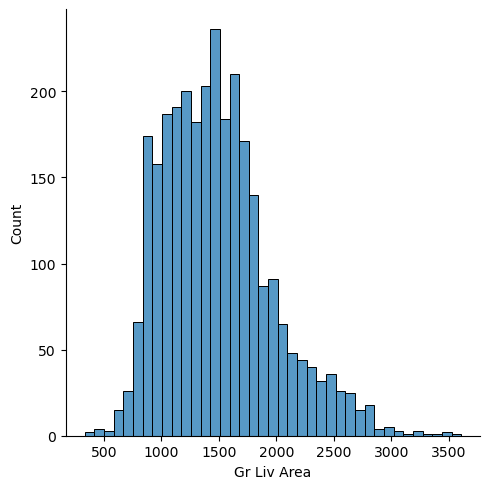

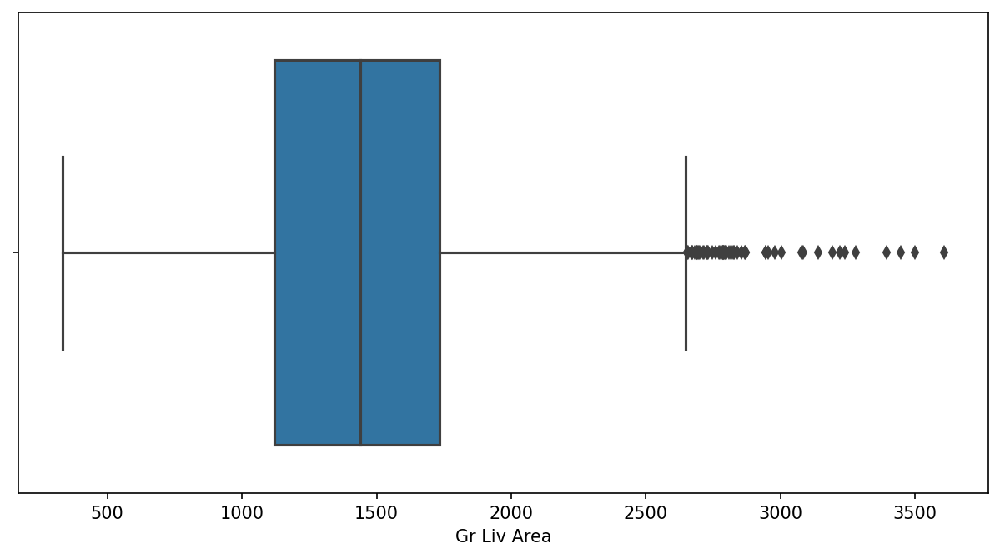

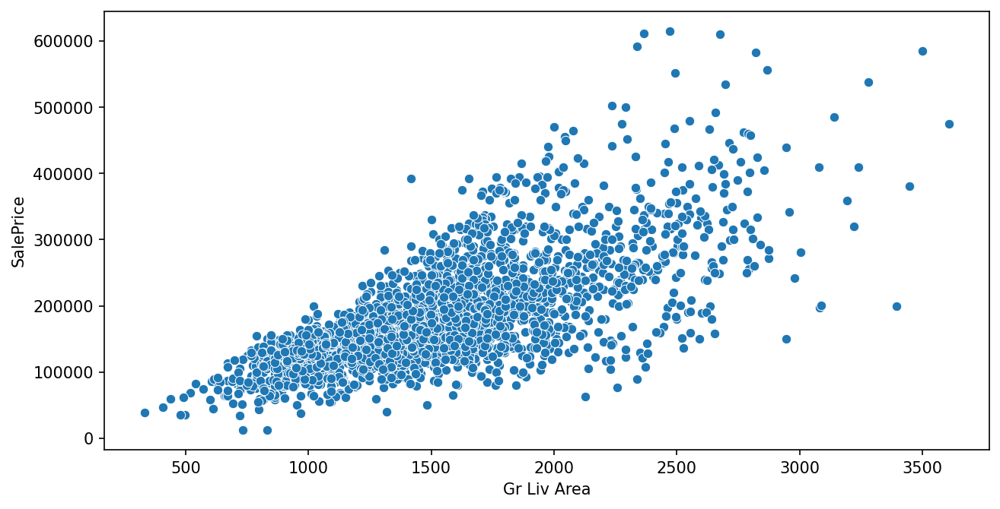

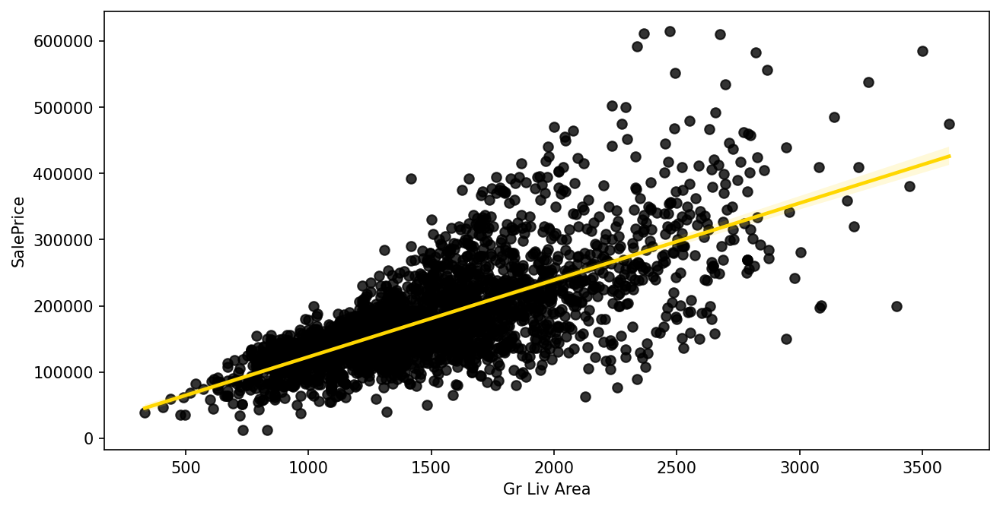

In [293]:
plot_num(col[46])

In [294]:
num.append(col[46])
num[-1]

'Gr Liv Area'

In [295]:
col[47]

'Bsmt Full Bath'

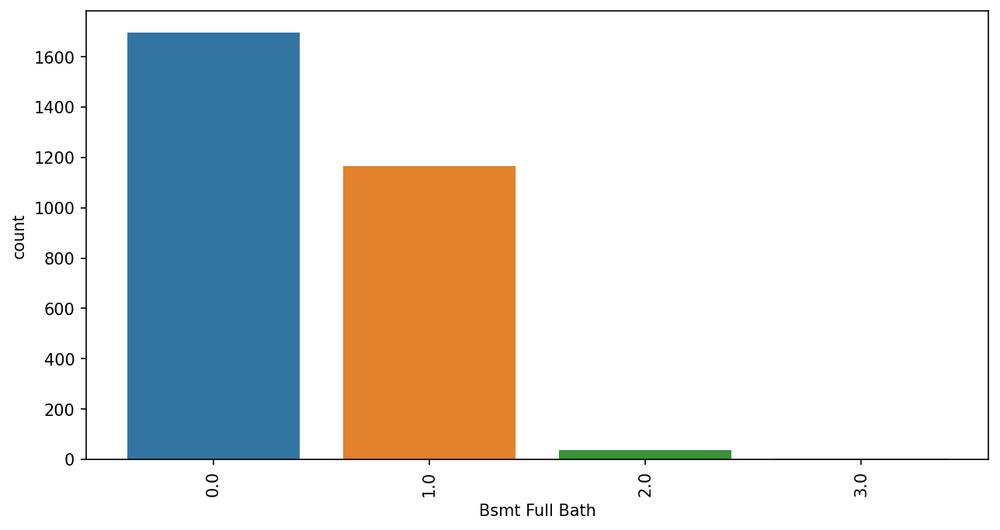

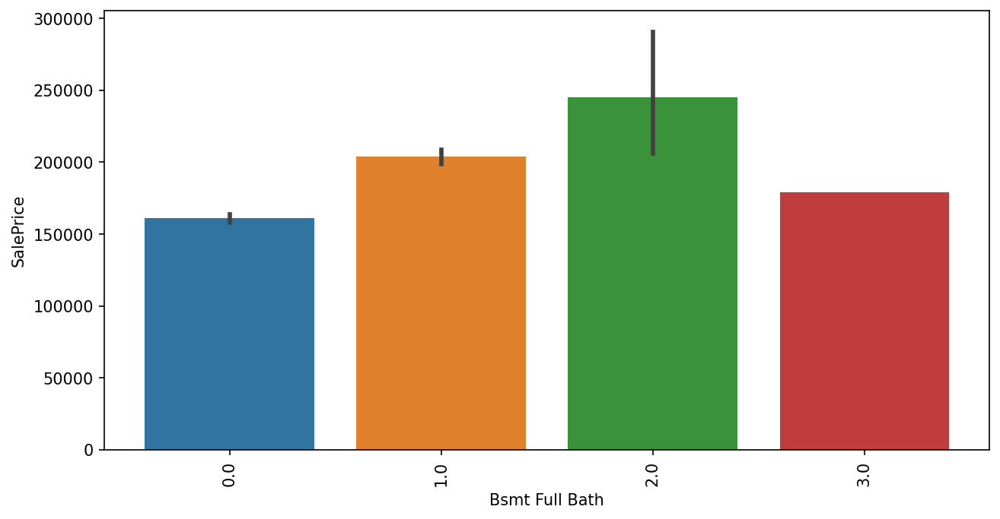

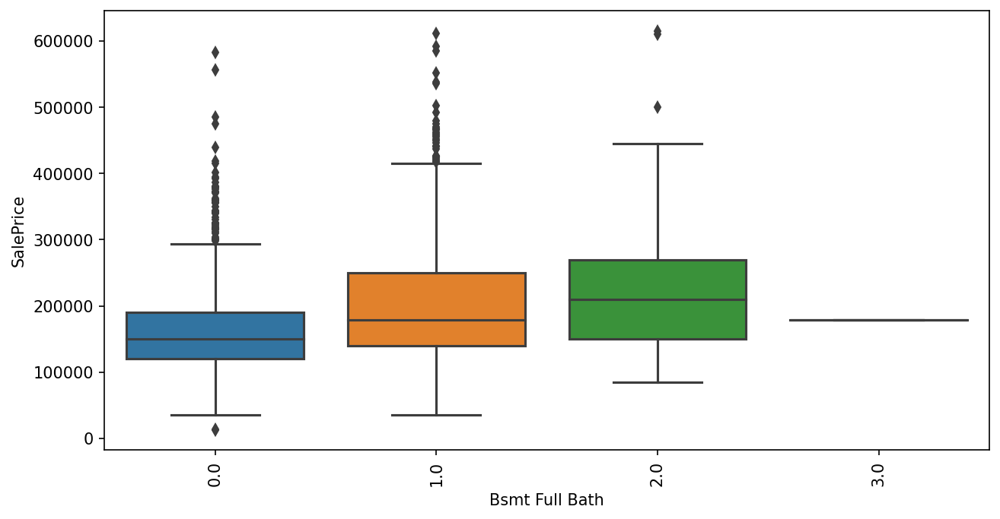

In [296]:
plot_cat(col[47])

In [297]:
df = df[df[col[47]]<3]

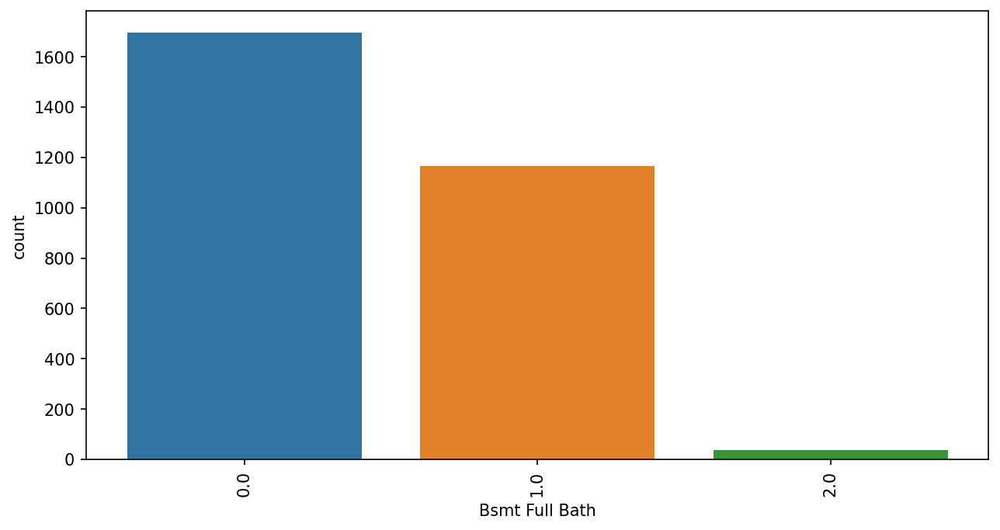

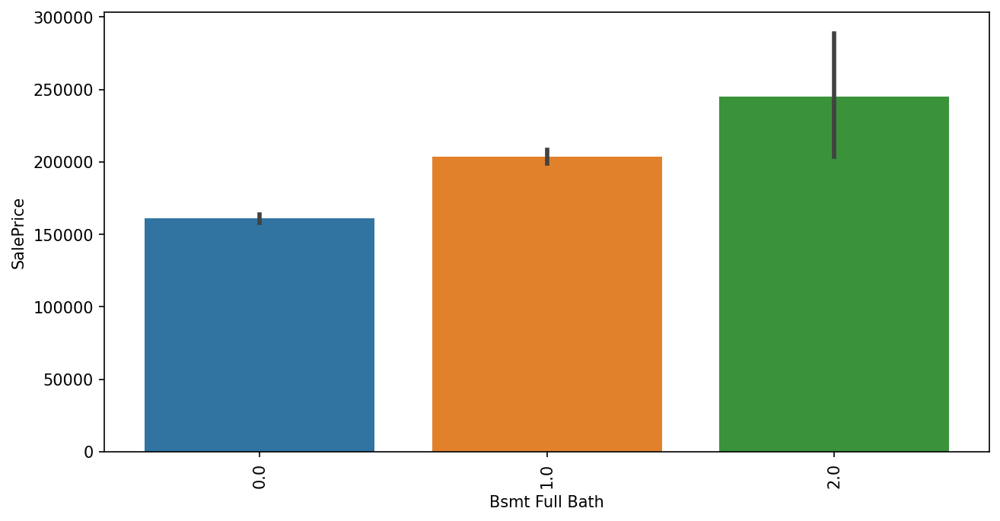

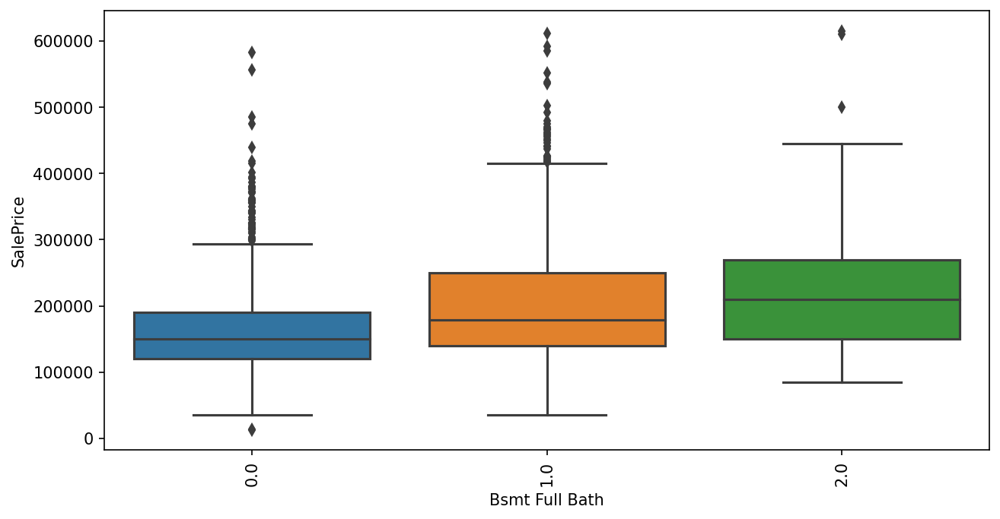

In [298]:
plot_cat(col[47])

In [299]:
num.append(col[47])
num[-1]

'Bsmt Full Bath'

In [300]:
col[48]

'Bsmt Half Bath'

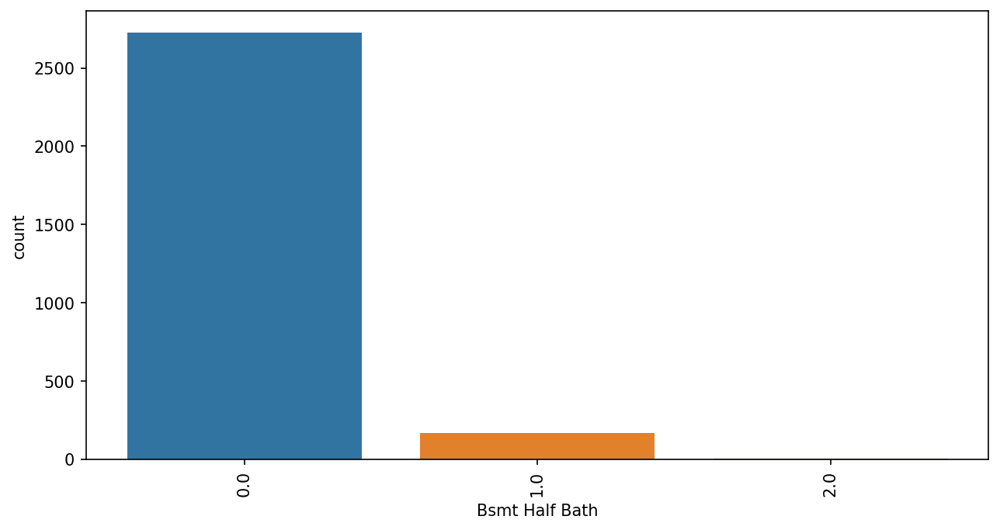

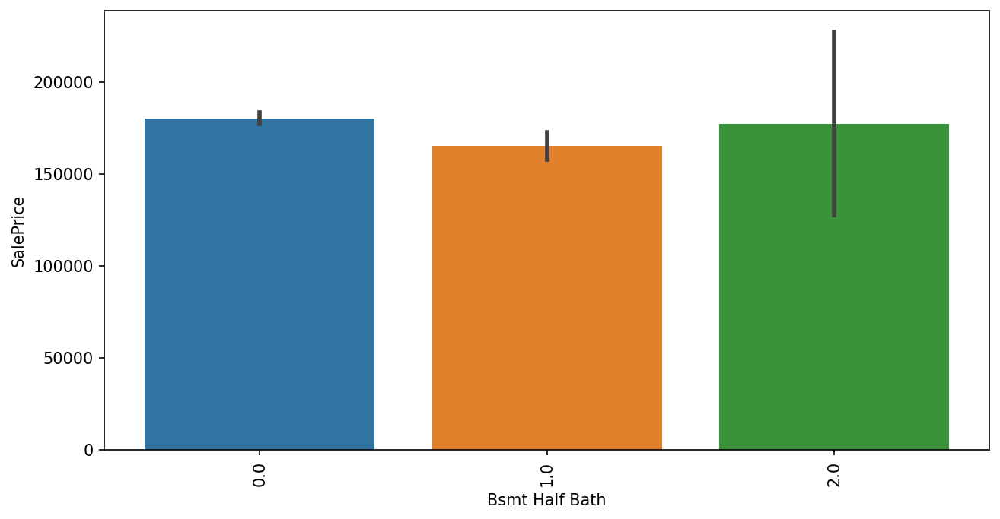

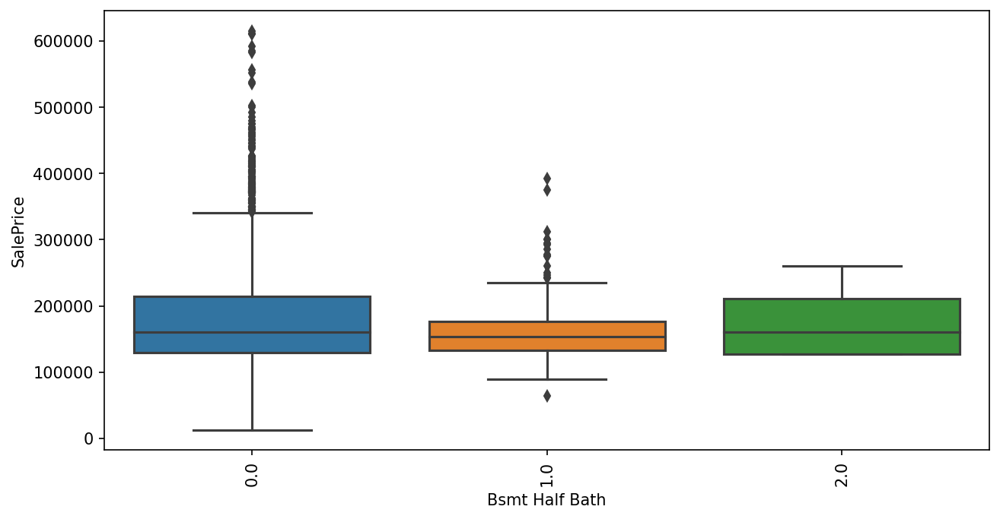

In [301]:
plot_cat(col[48])

eliminating this feature

In [302]:
col[49]

'Full Bath'

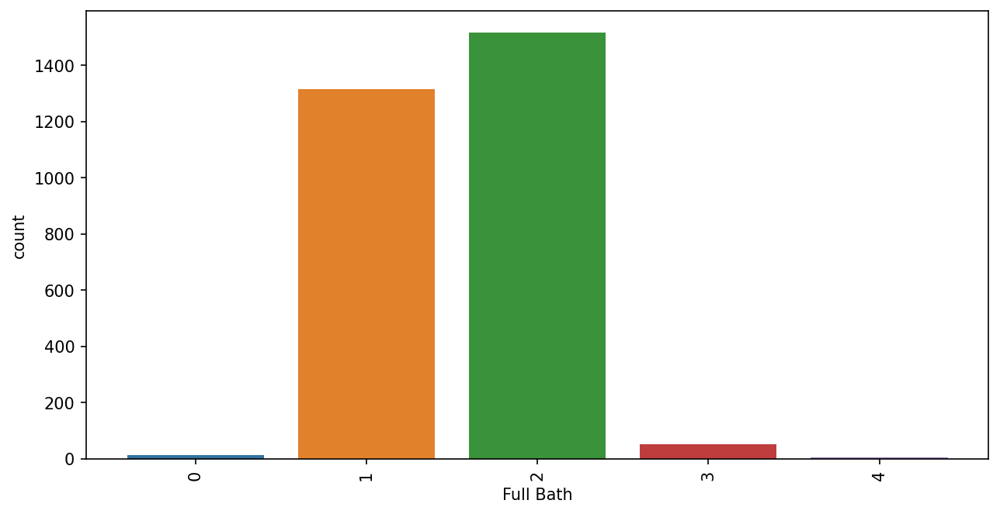

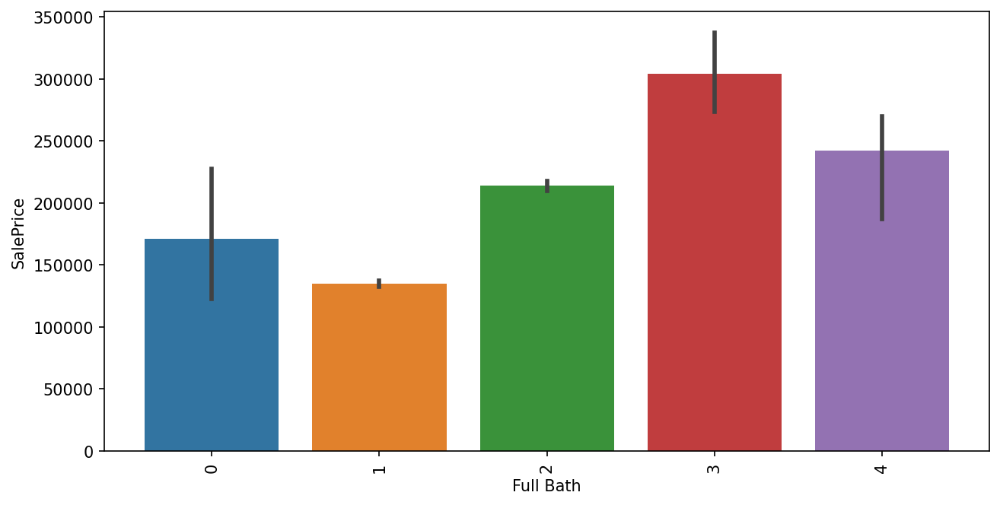

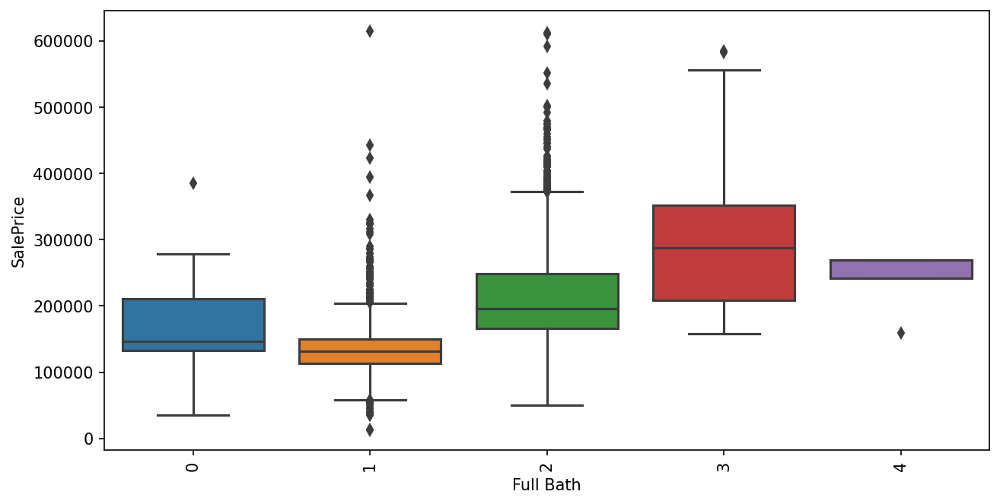

In [303]:
plot_cat(col[49])

In [304]:
df[col[49]].value_counts()

2    1517
1    1314
3      51
0      12
4       4
Name: Full Bath, dtype: int64

In [305]:
# cat.append(col[50])
cat.append(col[49])
cat[-1]

'Full Bath'

In [306]:
len(cat) + len(num)

43

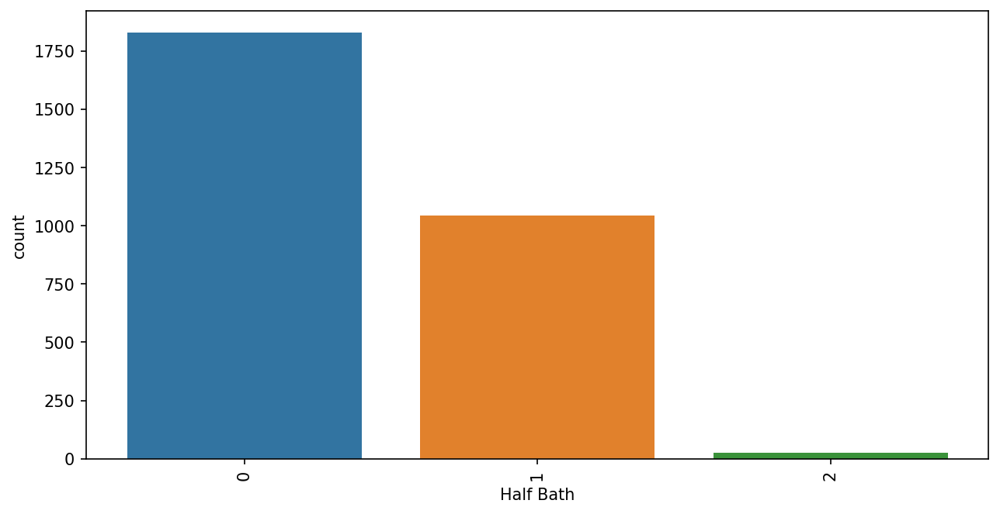

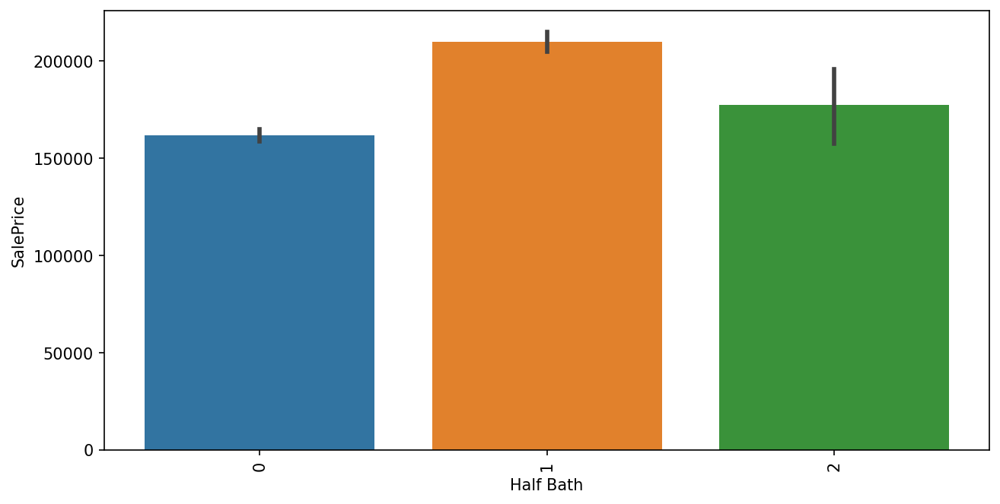

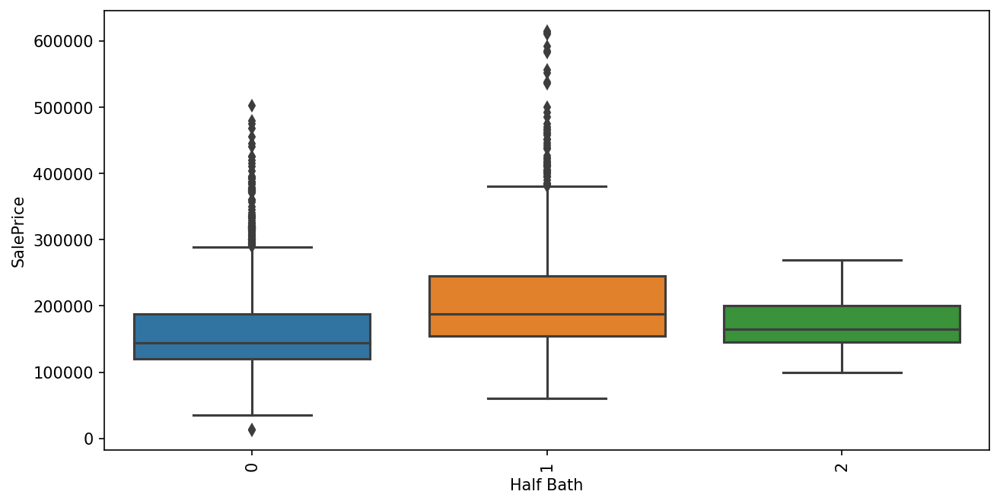

In [307]:
plot_cat(col[50])

In [308]:
cat.append(col[50])
# cat.append(col[49])
cat[-1]

'Half Bath'

In [309]:
col[51]

'Bedroom AbvGr'

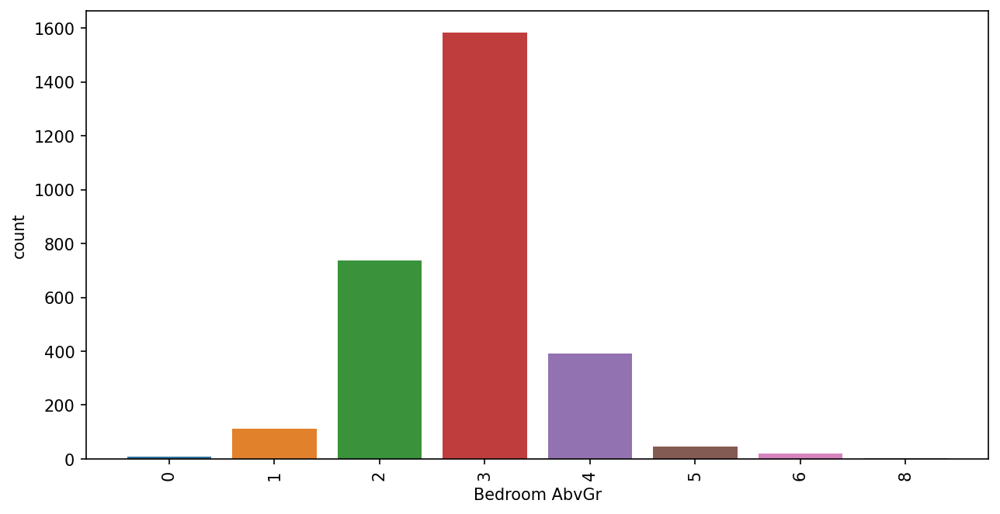

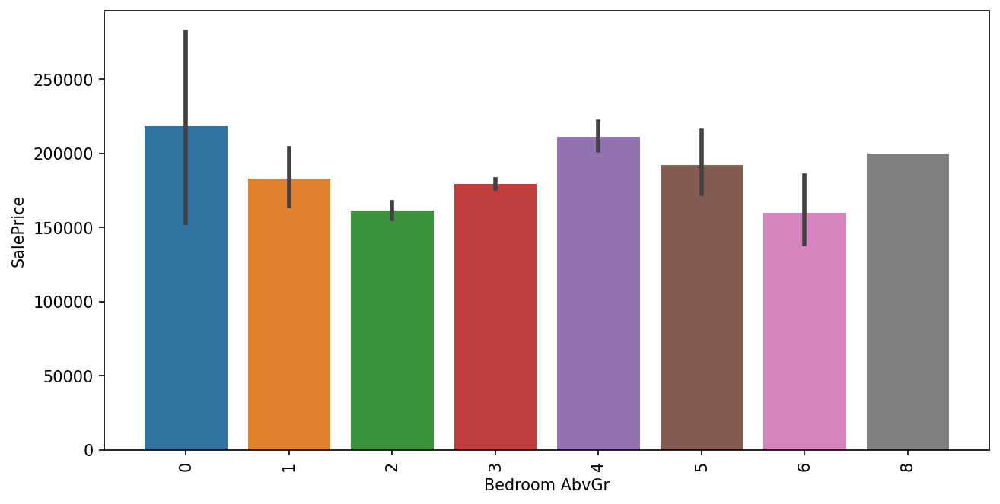

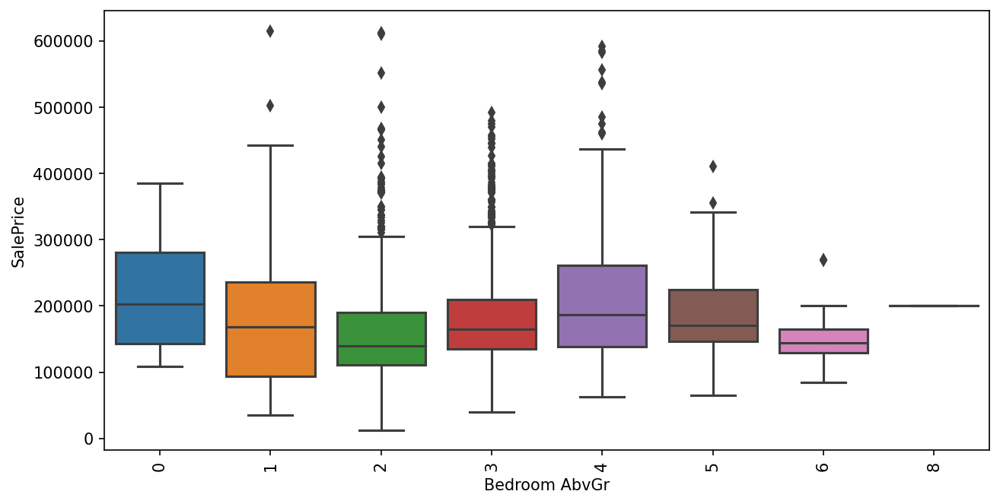

In [310]:
plot_cat(col[51])

* eliminating this feature

In [311]:
col[52]

'Kitchen AbvGr'

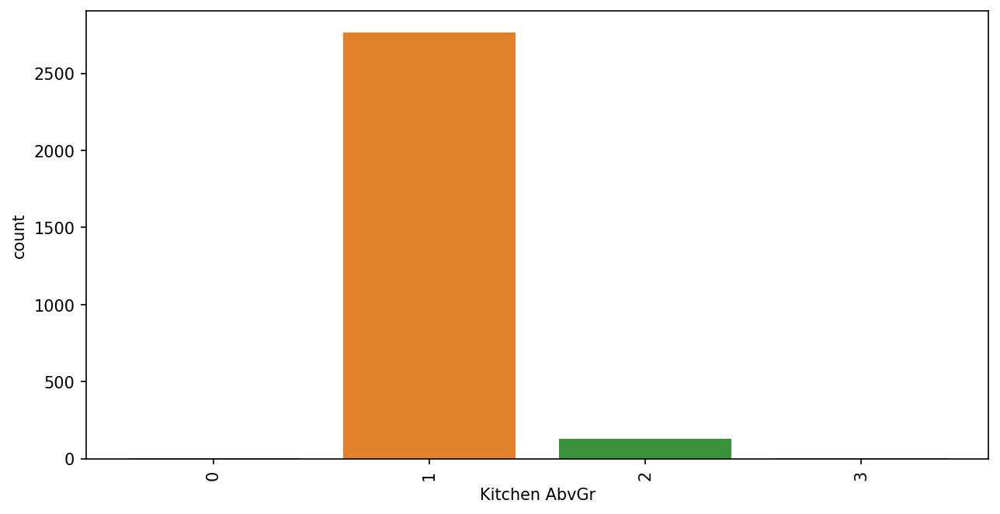

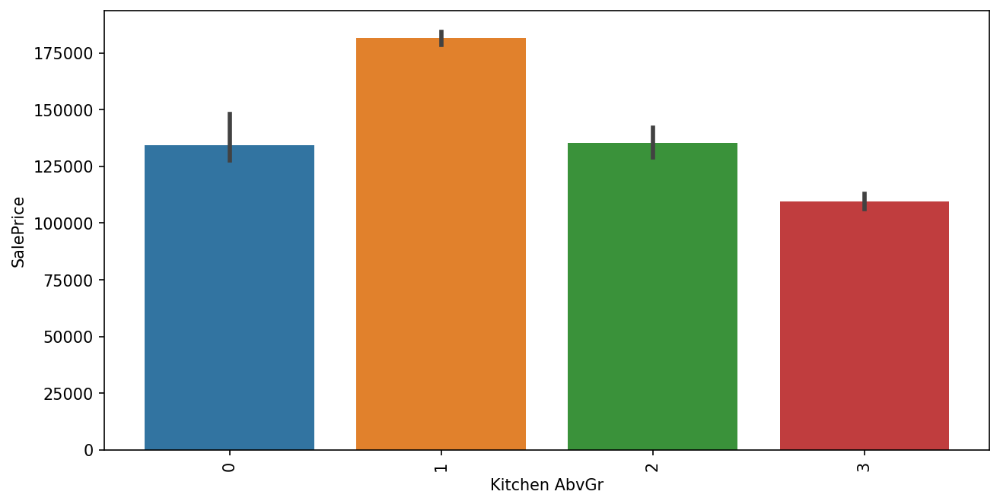

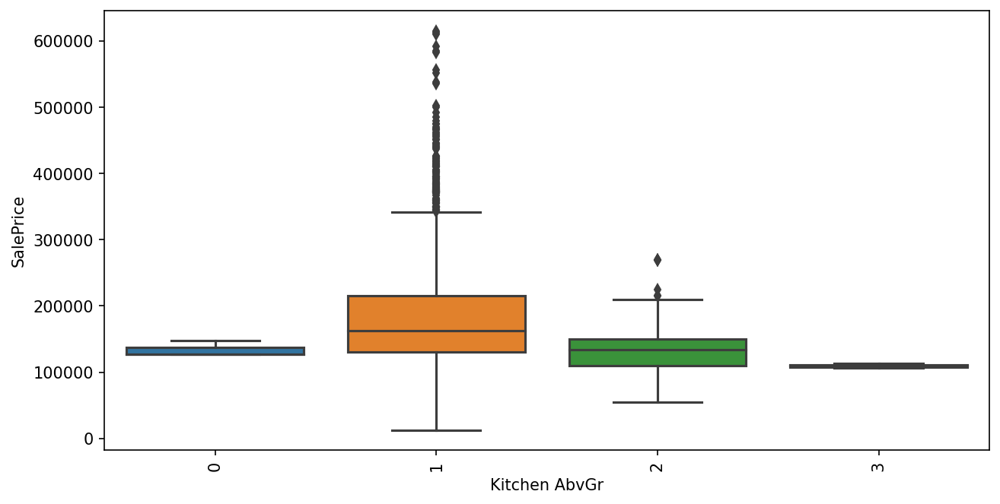

In [312]:
plot_cat(col[52])

In [313]:
num.append(col[52])
num[-1]

'Kitchen AbvGr'

In [314]:
col[53]

'Kitchen Qual'

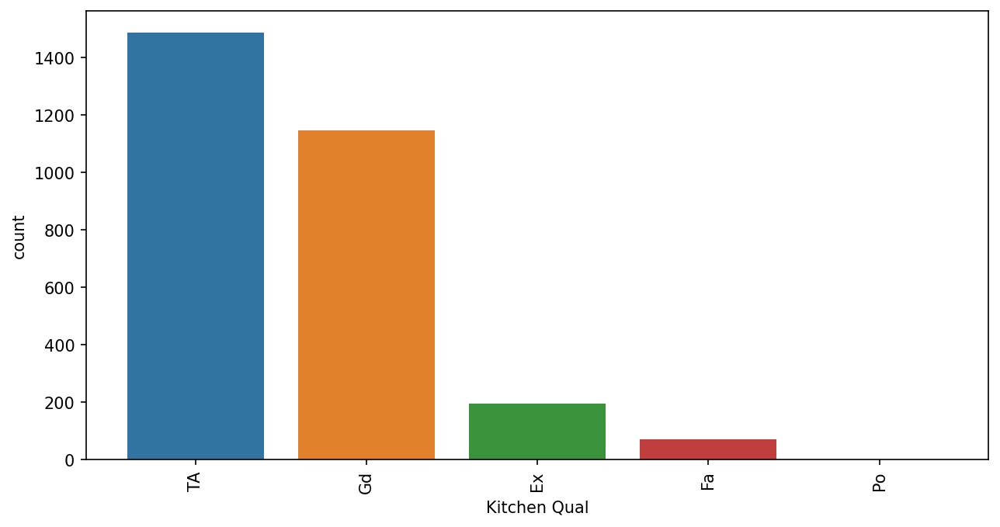

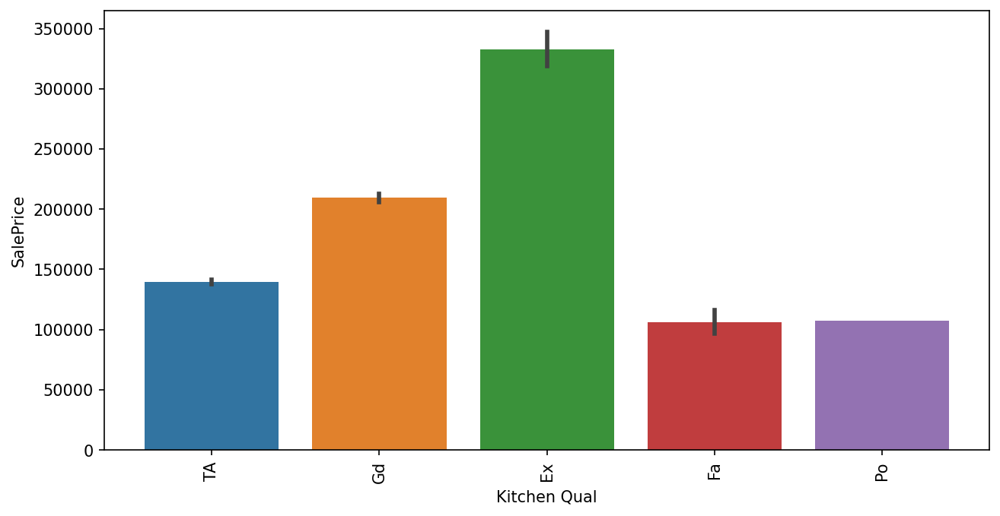

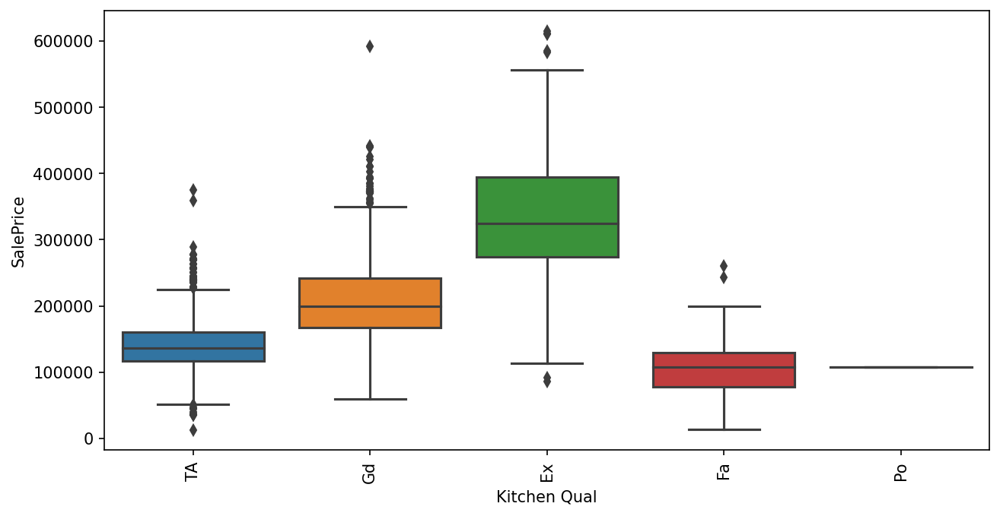

In [315]:
plot_cat(col[53])

In [316]:
df[col[53]].value_counts()

TA    1487
Gd    1145
Ex     195
Fa      70
Po       1
Name: Kitchen Qual, dtype: int64

In [317]:
df[col[53]] = df[col[53]].apply(lambda x: 1 if x=='TA' else (2 if x=='Gd' else (3 if x=='Ex' else 0)))

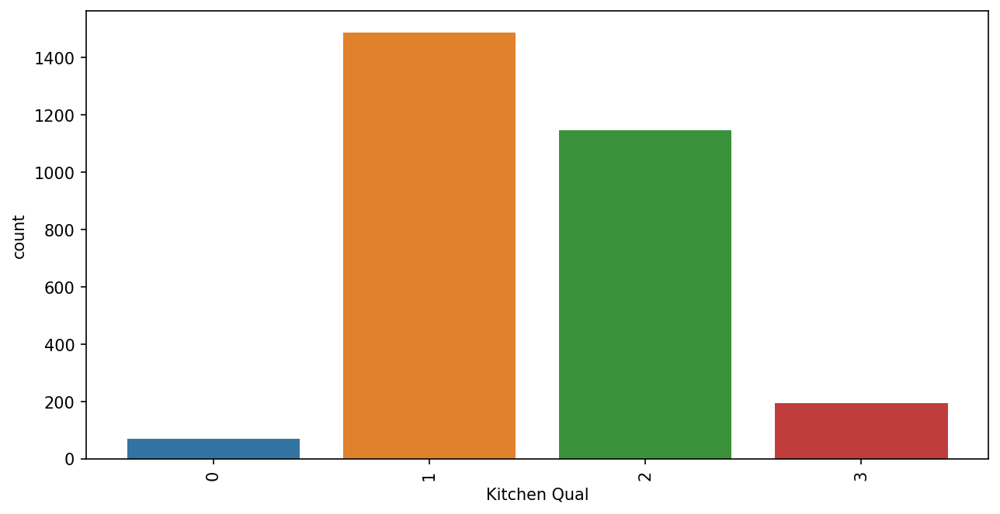

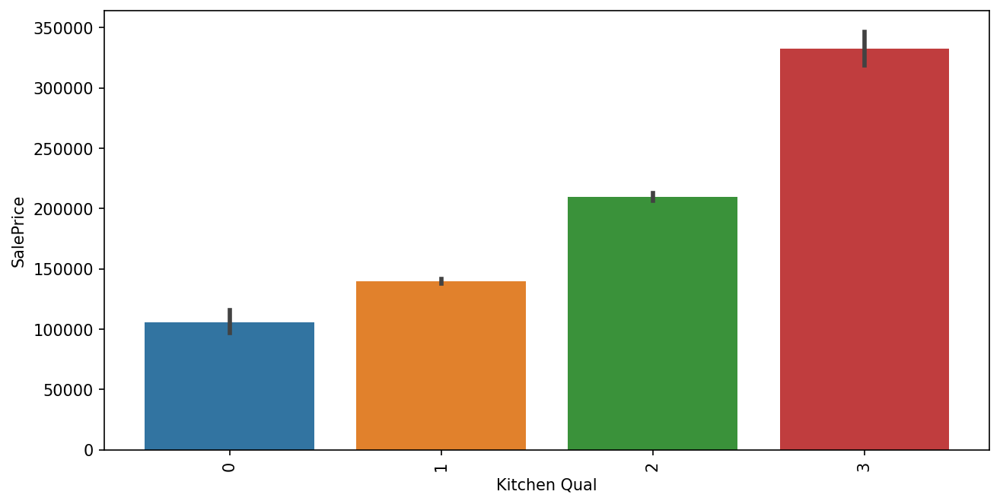

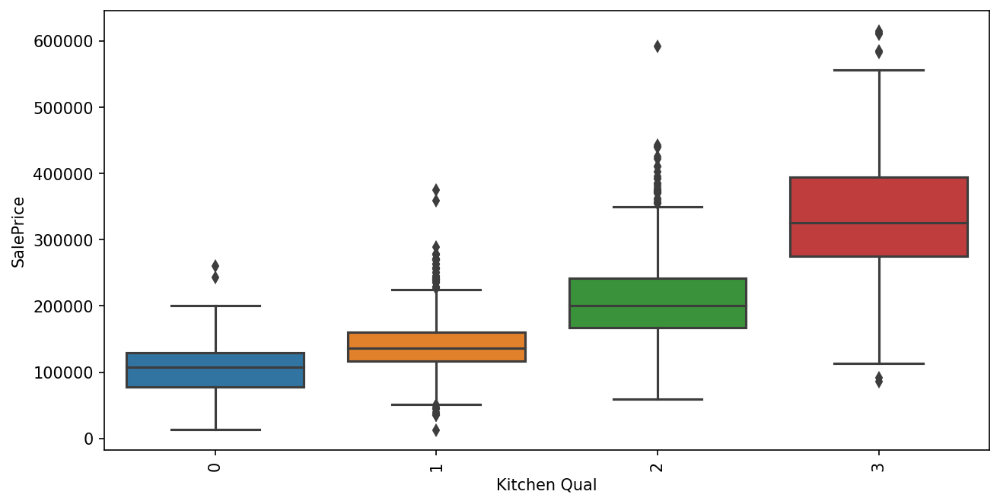

In [318]:
plot_cat(col[53])

In [319]:
num.append(col[53])
num[-1]

'Kitchen Qual'

In [320]:
col[54]

'TotRms AbvGrd'

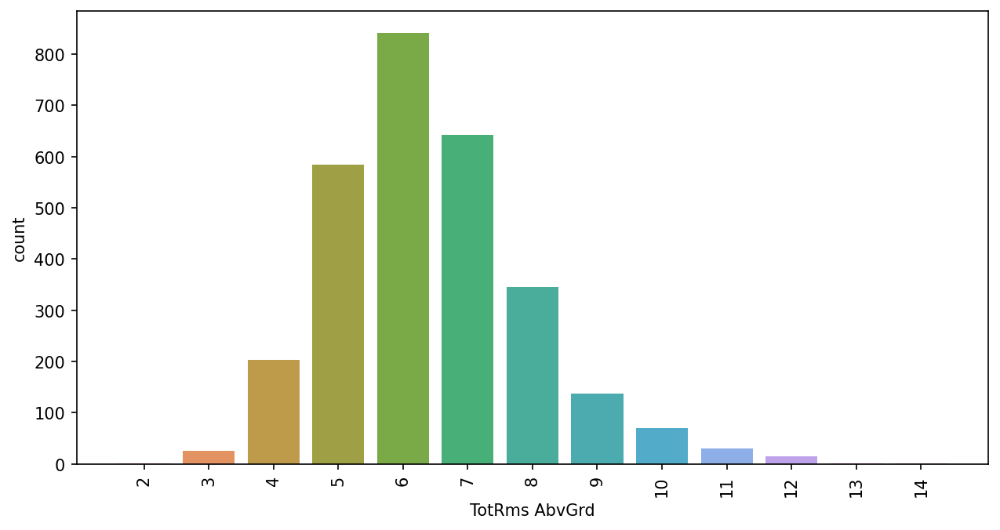

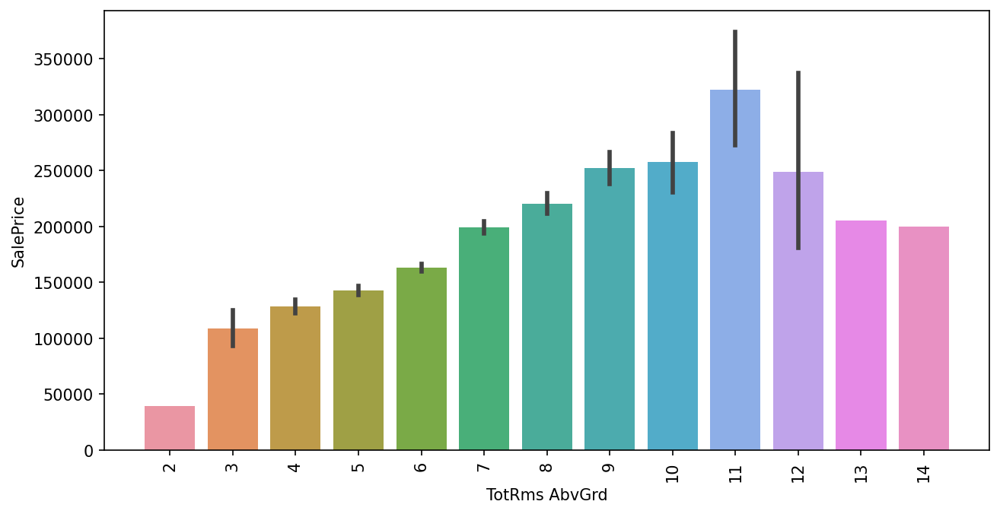

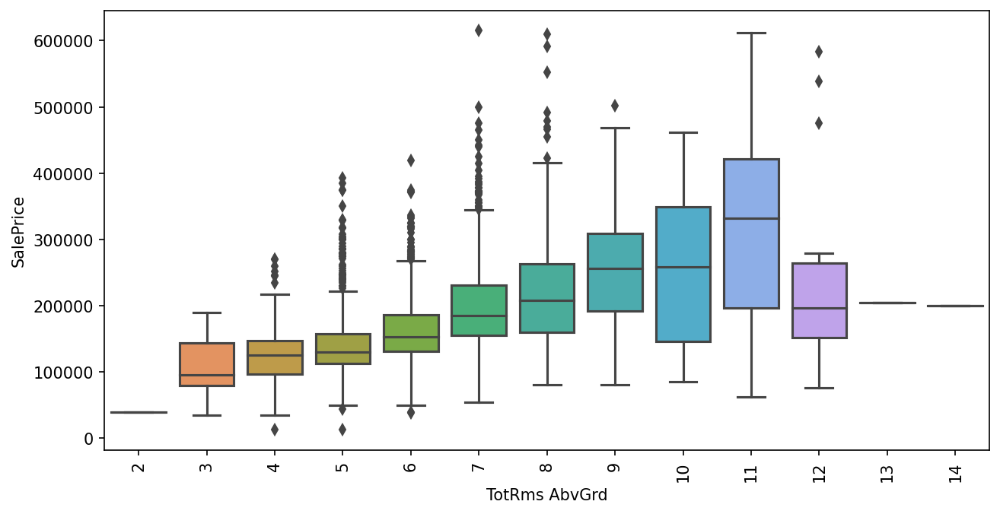

In [321]:
plot_cat(col[54])

In [322]:
num.append(col[54])
num[-1]

'TotRms AbvGrd'

In [323]:
col[55]

'Functional'

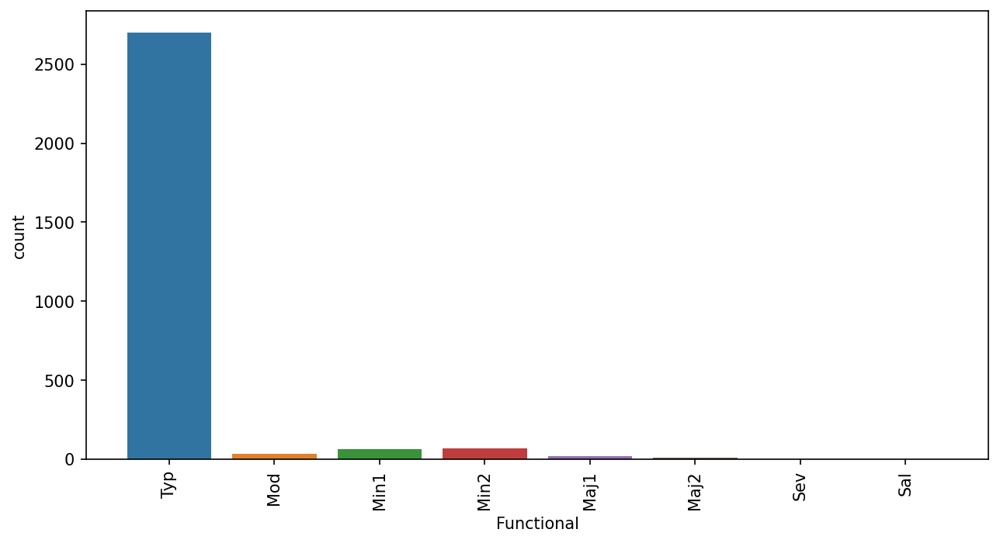

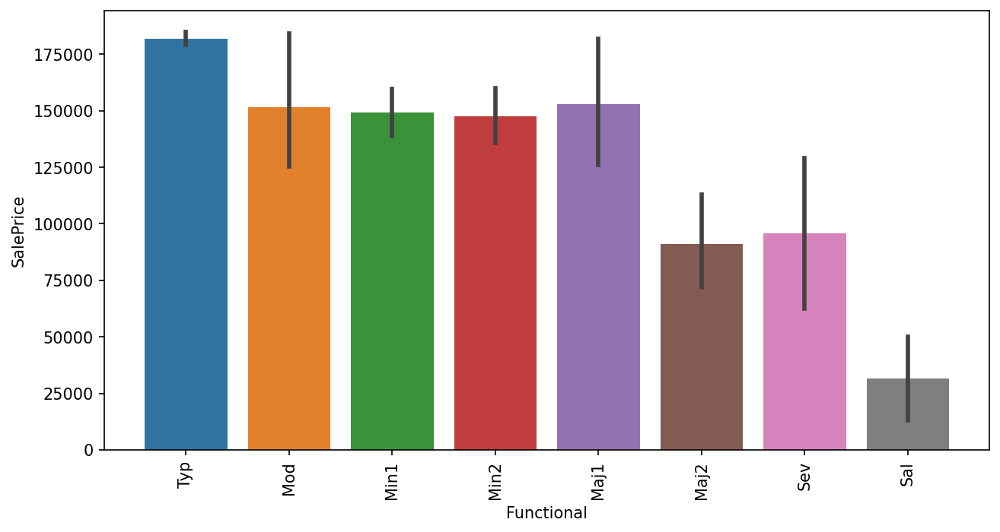

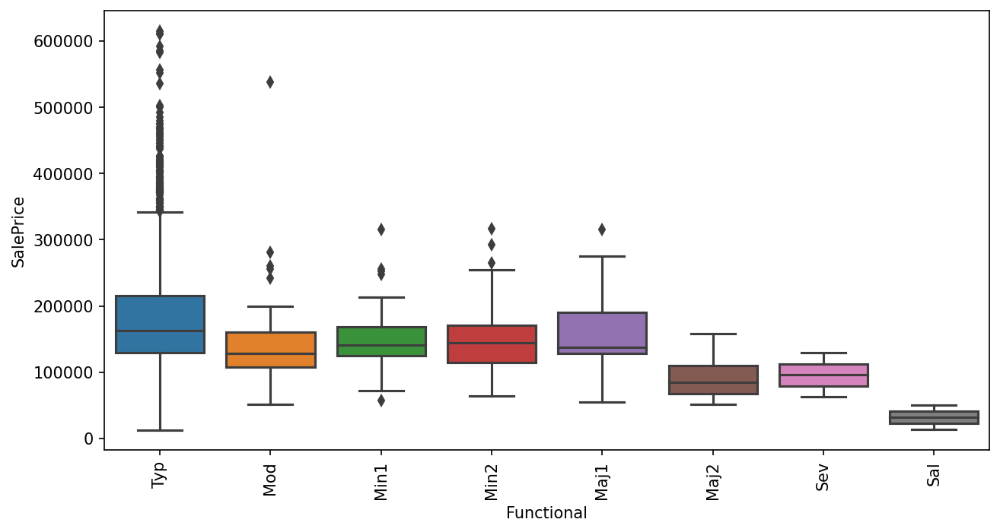

In [324]:
plot_cat(col[55])

In [325]:
cat.append(col[55])
cat[-1]

'Functional'

In [326]:
col[56]

'Fireplaces'

<Figure size 1500x750 with 0 Axes>

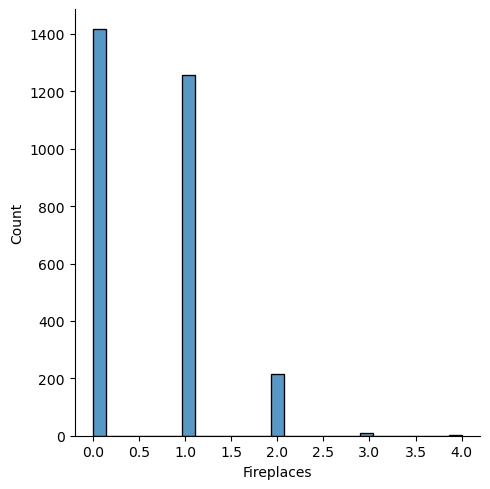

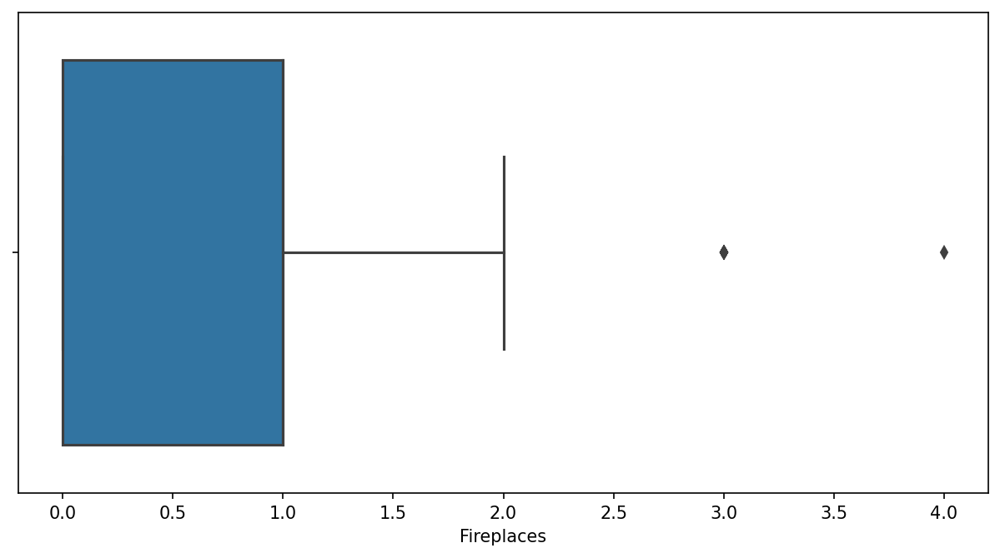

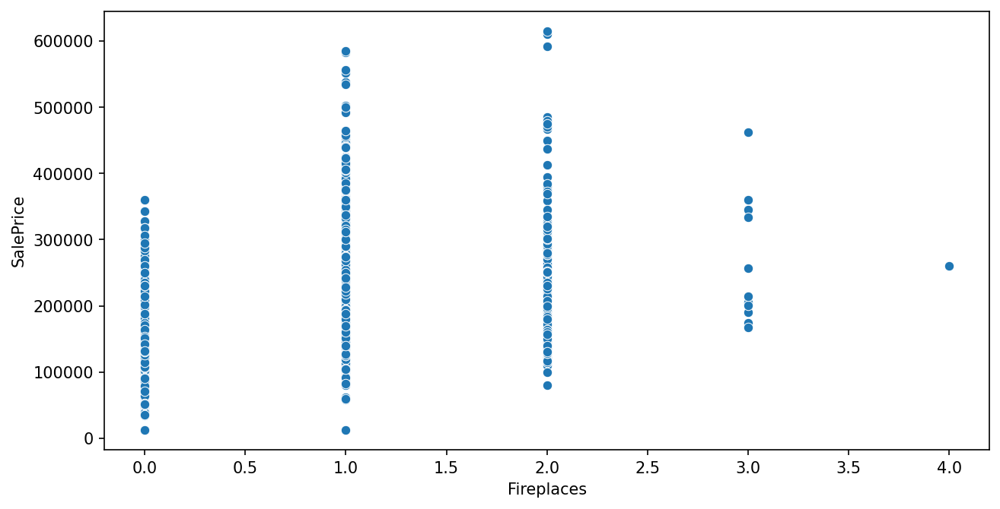

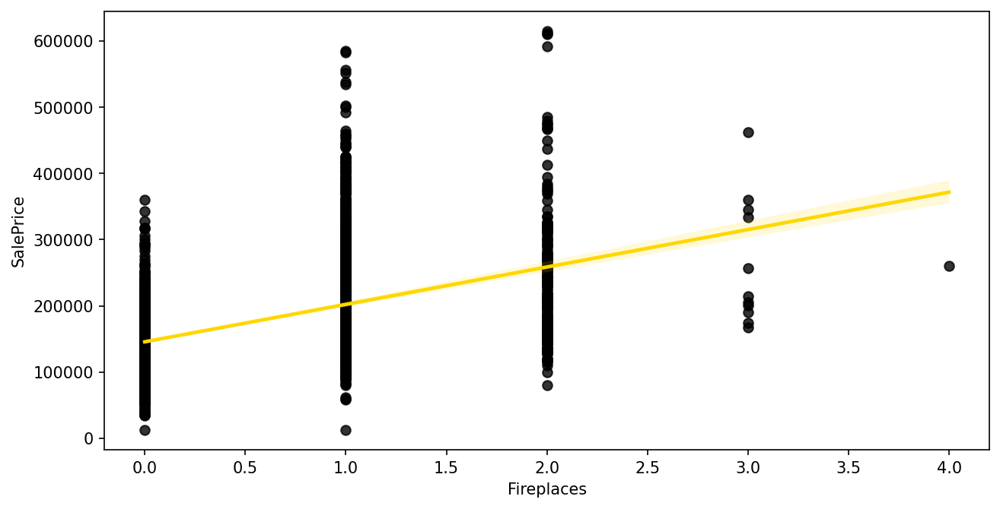

In [327]:
plot_num(col[56])

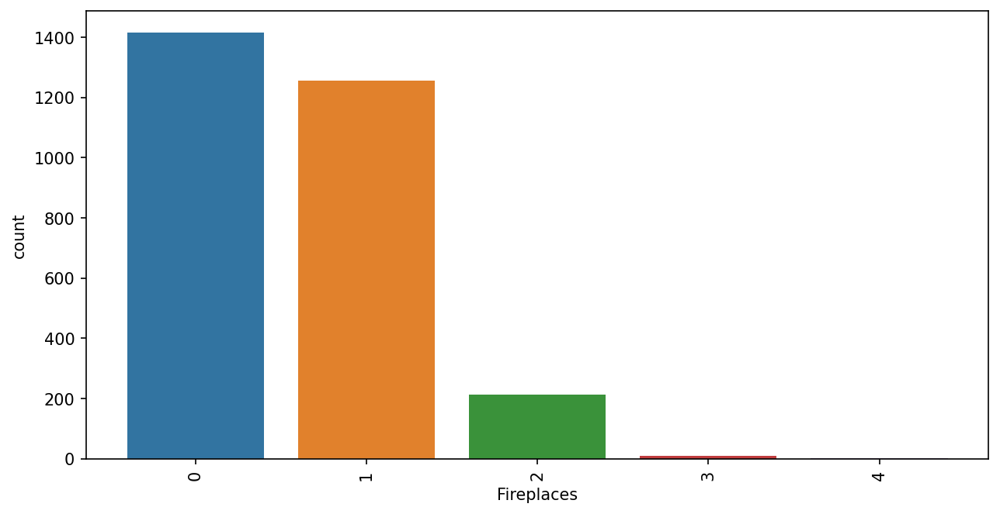

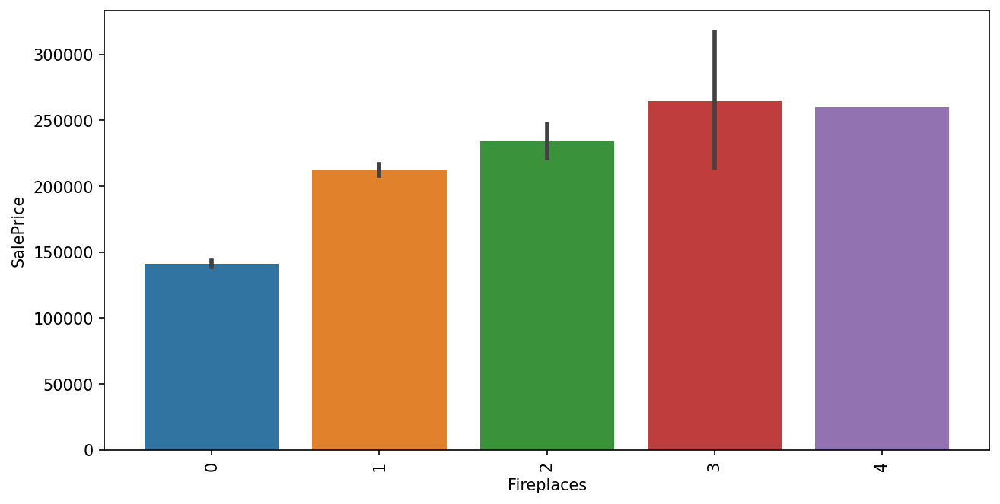

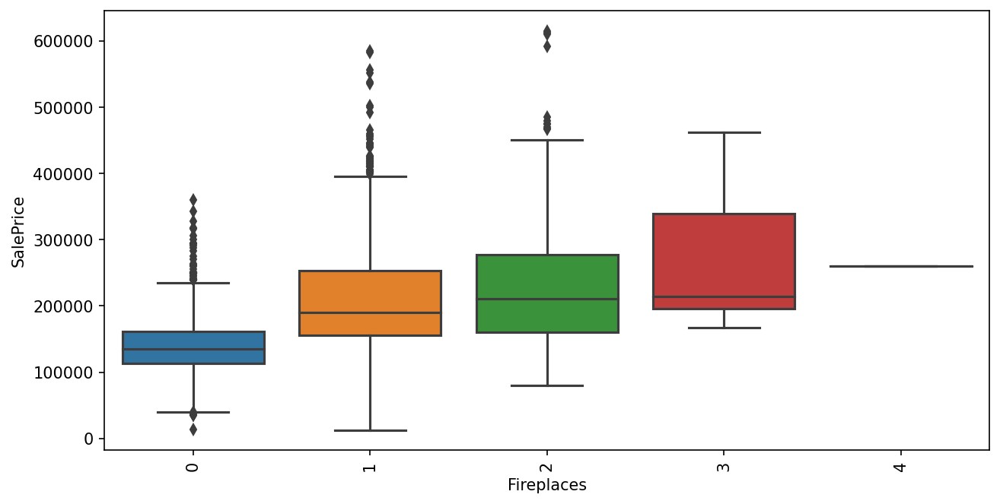

In [328]:
plot_cat(col[56])

In [329]:
num.append(col[56])

In [330]:
col[57]

'Fireplace Qu'

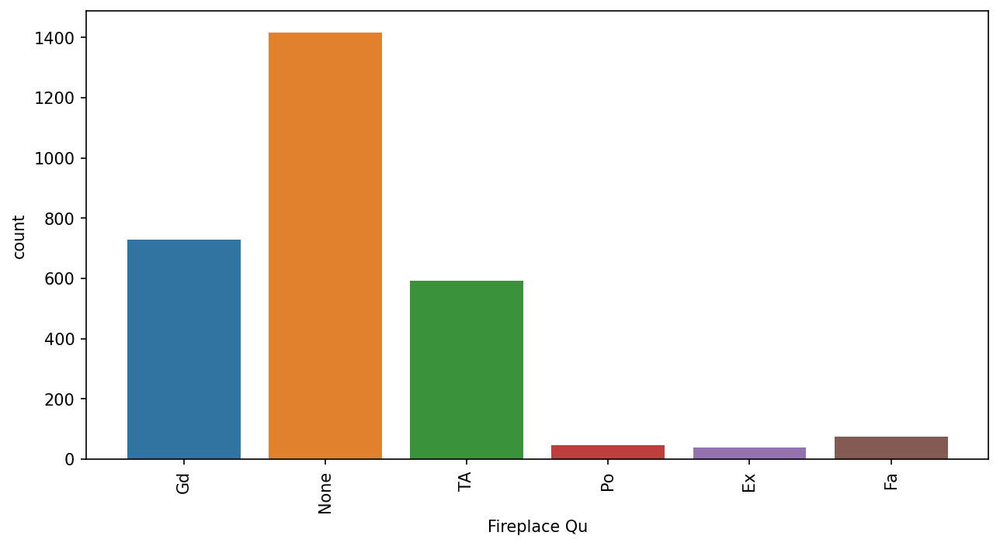

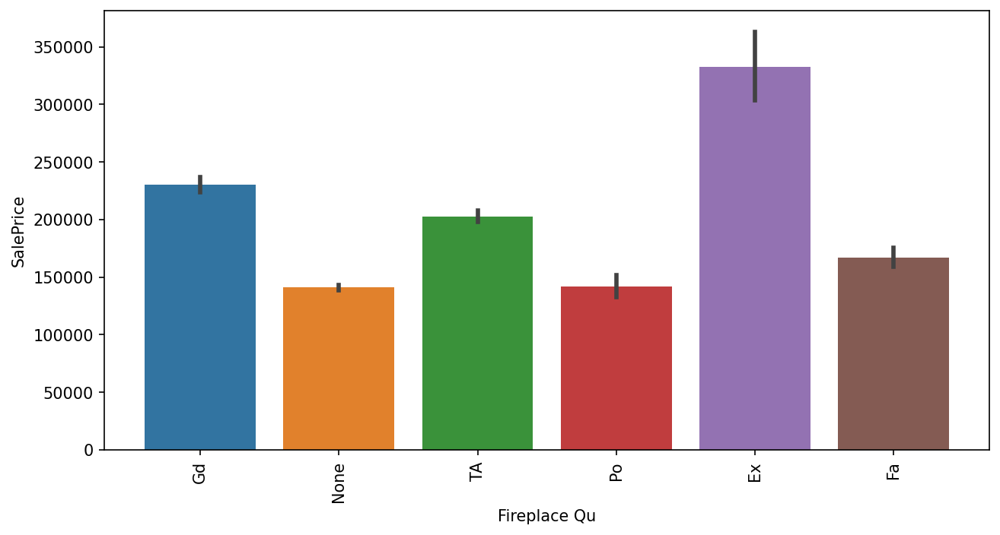

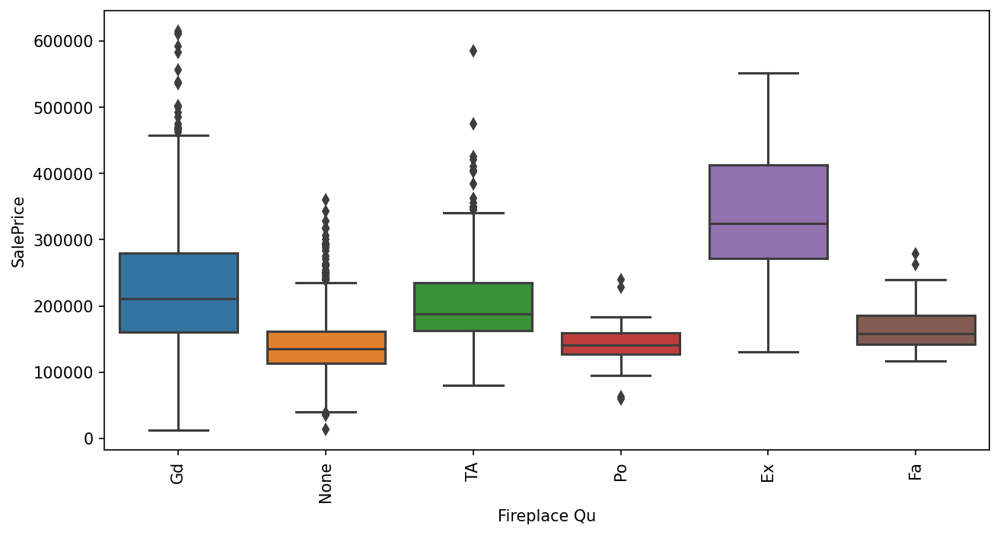

In [331]:
plot_cat(col[57])

In [332]:
cat.append(col[57])
cat[-1]

'Fireplace Qu'

In [333]:
col[58]

'Garage Type'

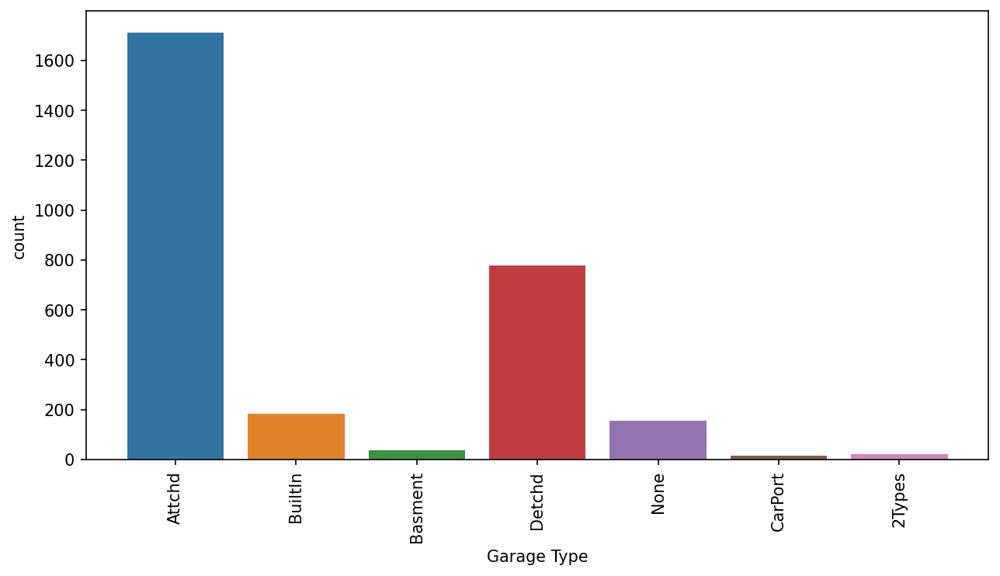

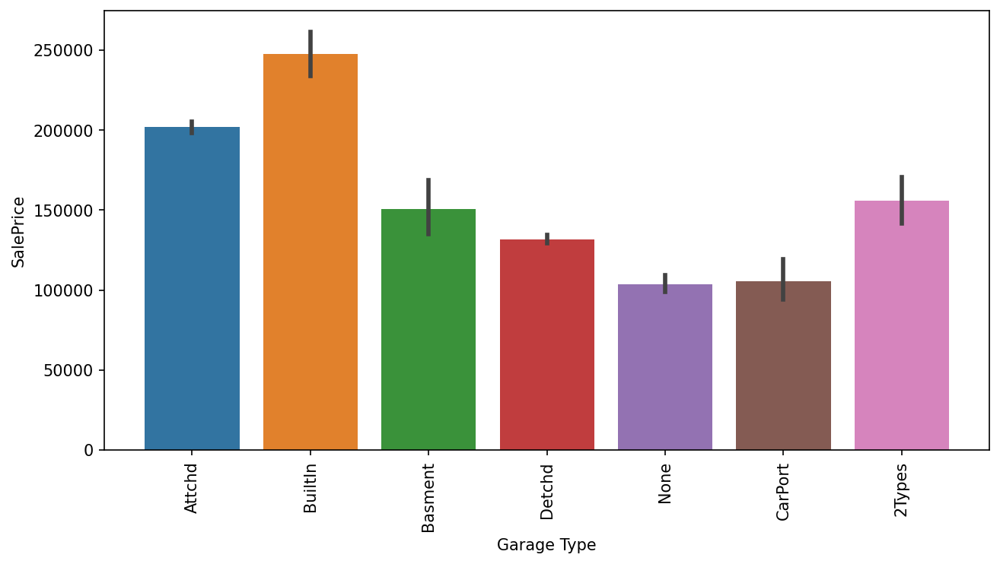

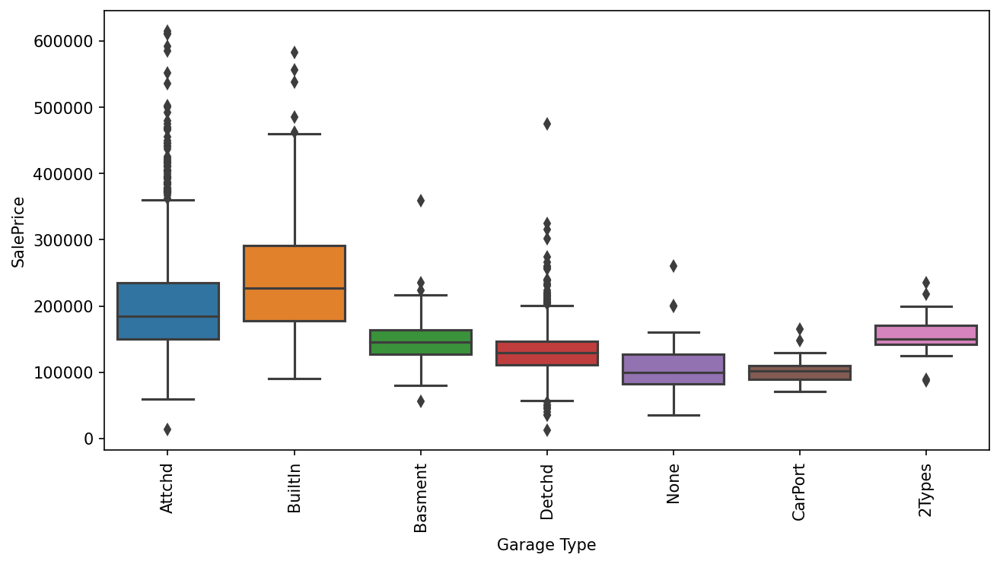

In [334]:
plot_cat(col[58])

In [335]:
cat.append(col[58])
cat[-1]

'Garage Type'

In [336]:
col[59]

'Garage Yr Blt'

In [337]:
(df[col[59]] == 'None').sum()

156

In [338]:
def fun(k):
  a=0
  if k == 'None':
    a=0
  else:
    a=k
  return a


In [339]:
df[col[59]] = df[col[59]].apply(fun)

In [340]:
(df[col[59]] == 'None').sum()

0

<Figure size 1500x750 with 0 Axes>

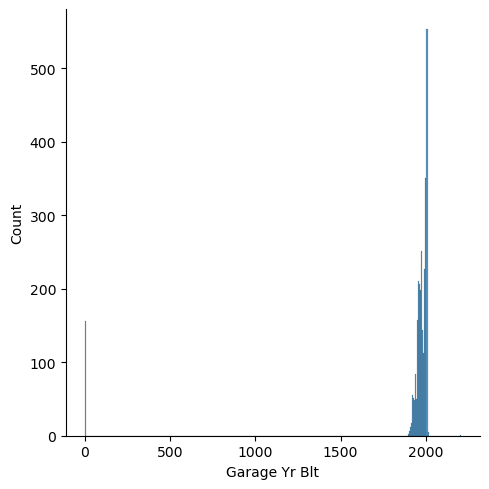

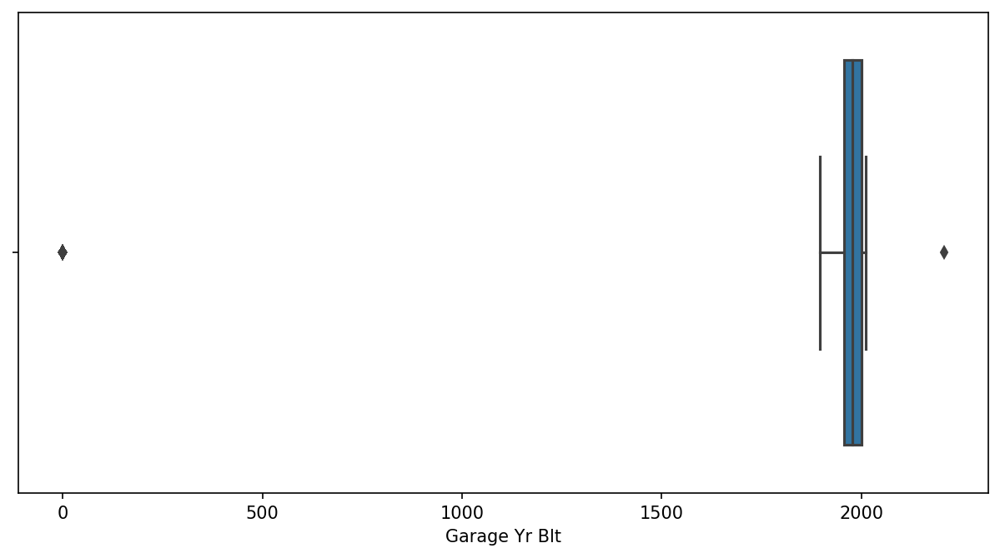

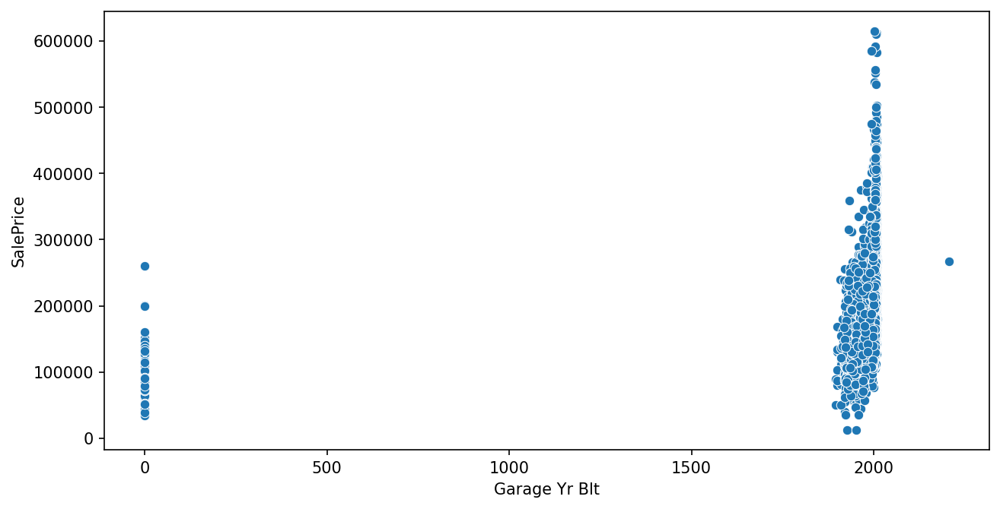

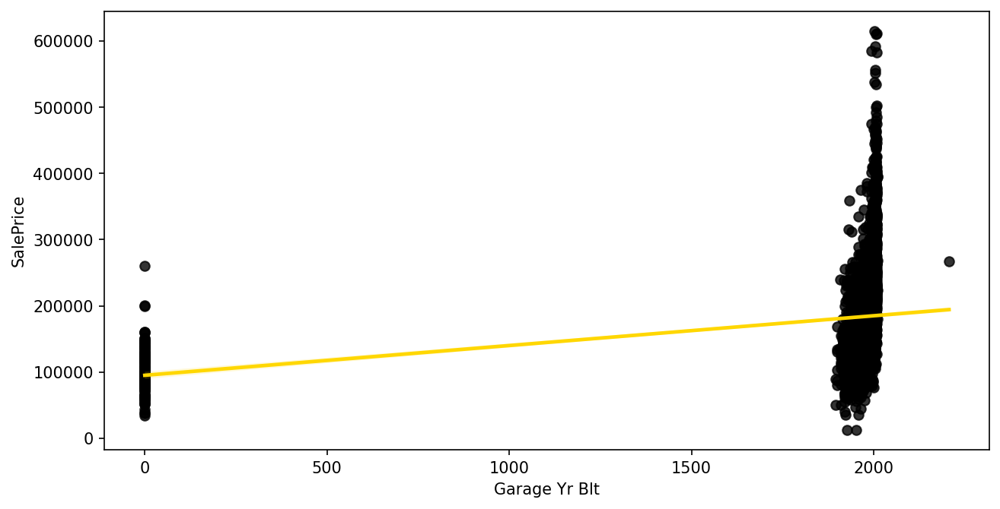

In [341]:
plot_num(col[59])

* Eliminatng this feature

In [342]:
col[60]

'Garage Finish'

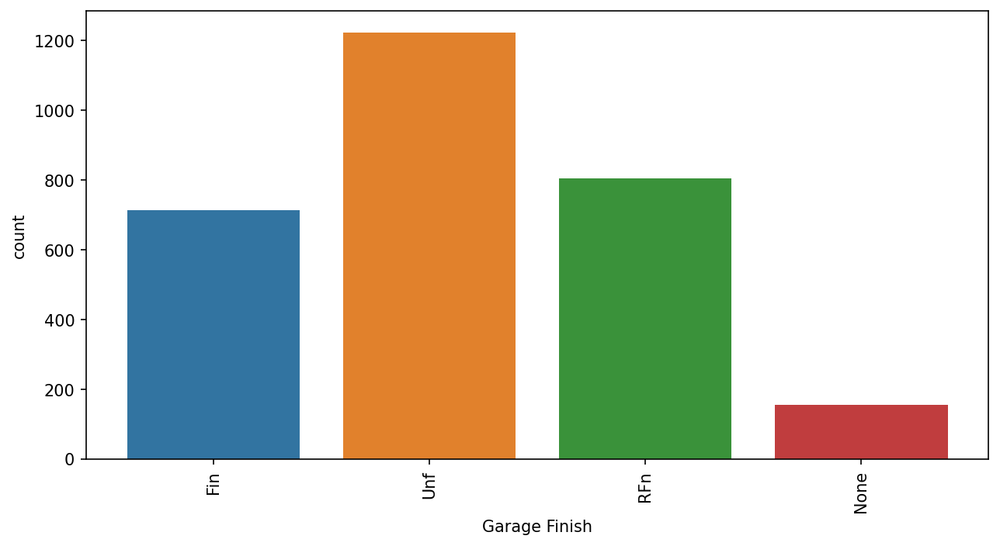

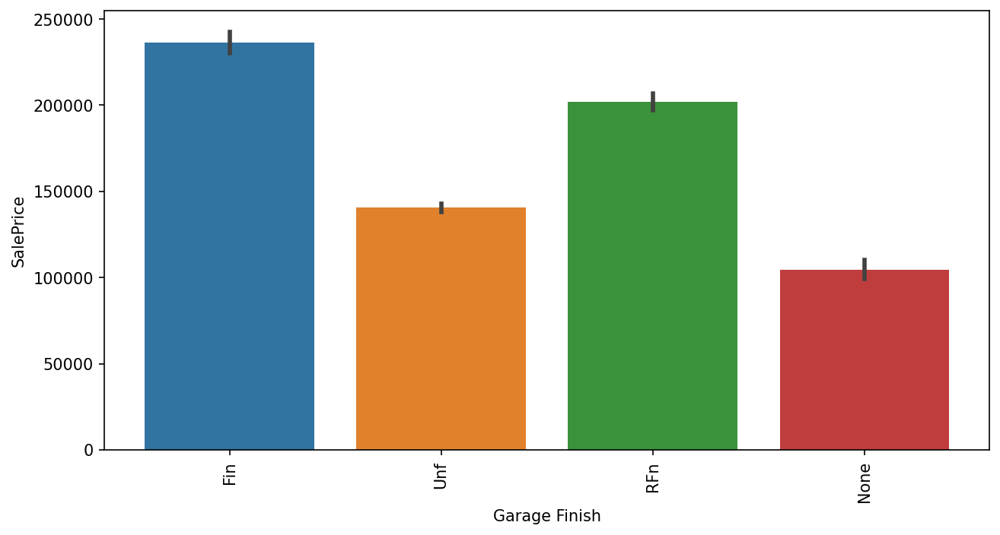

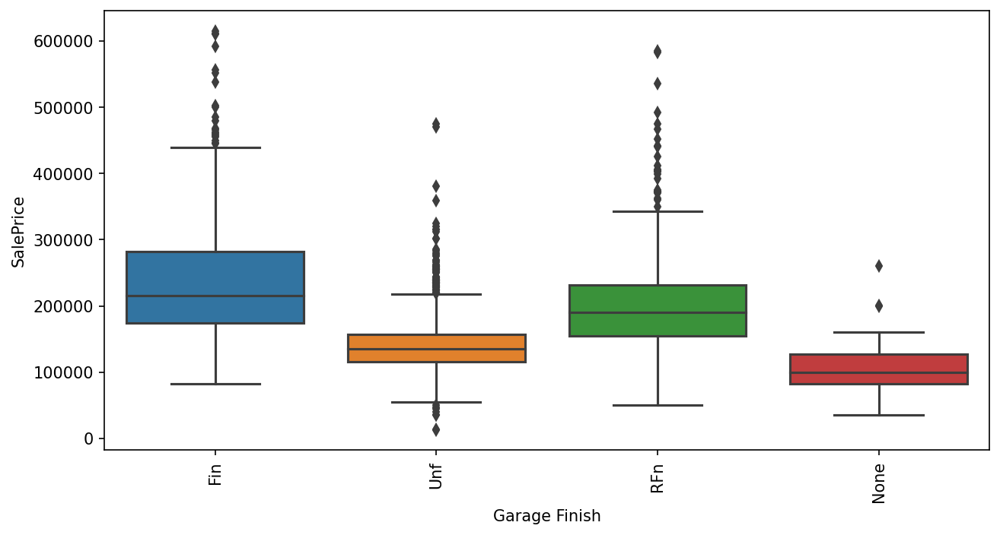

In [343]:
plot_cat(col[60])

In [344]:
df[col[60]] = df[col[60]].apply(lambda x: 1 if x=='Fin' else (2 if x=='RFn' else 0))

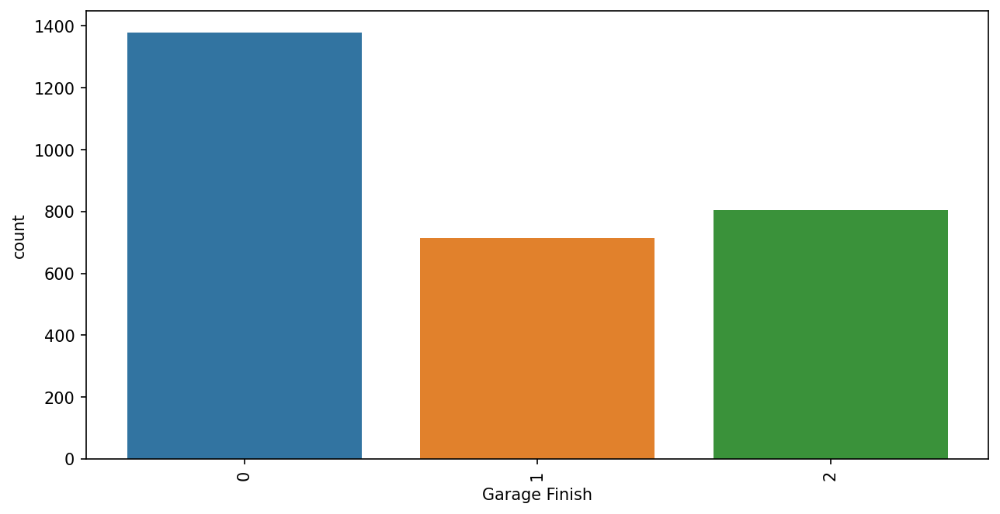

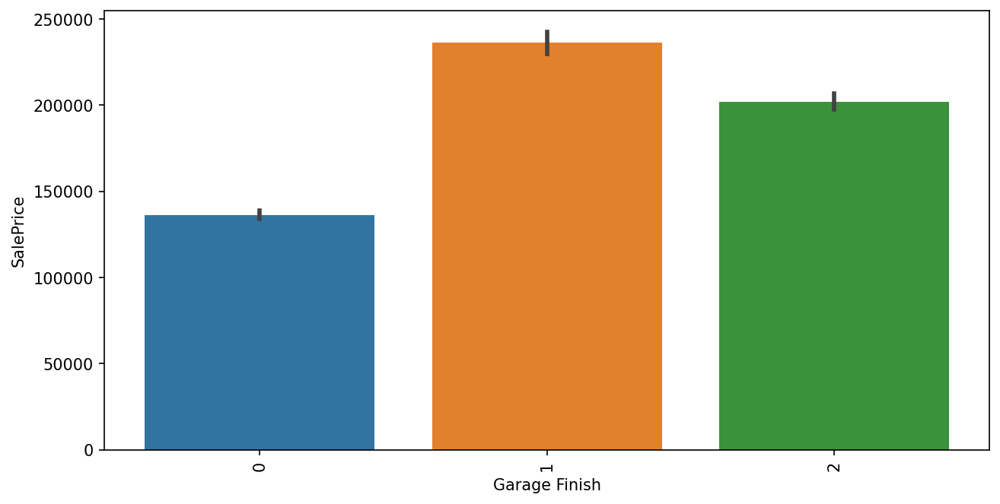

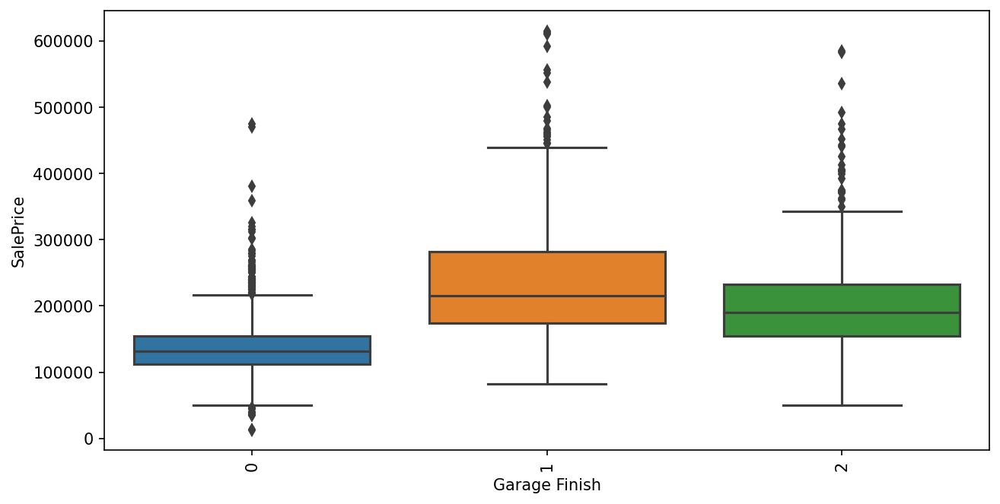

In [345]:
plot_cat(col[60])

In [346]:
num.append(col[60])
num[-1]

'Garage Finish'

In [347]:
col[61]

'Garage Cars'

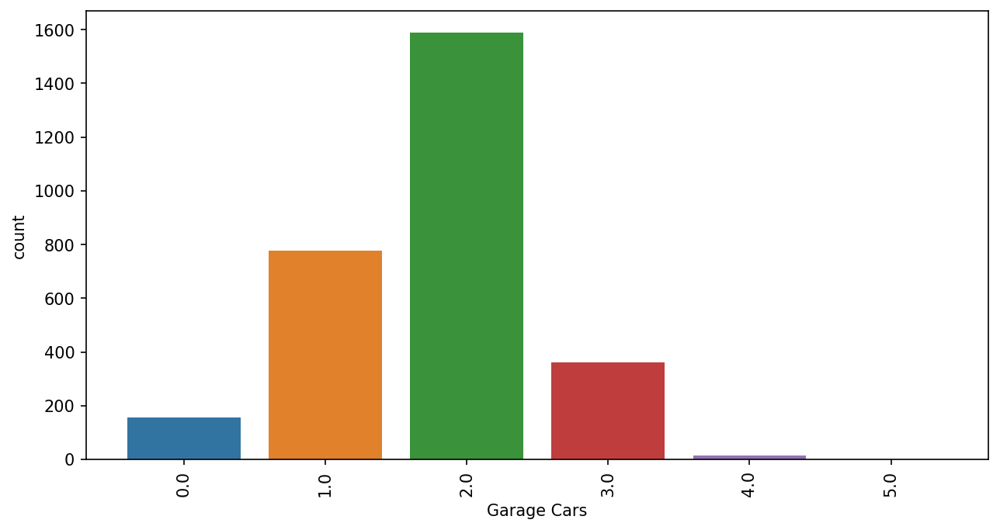

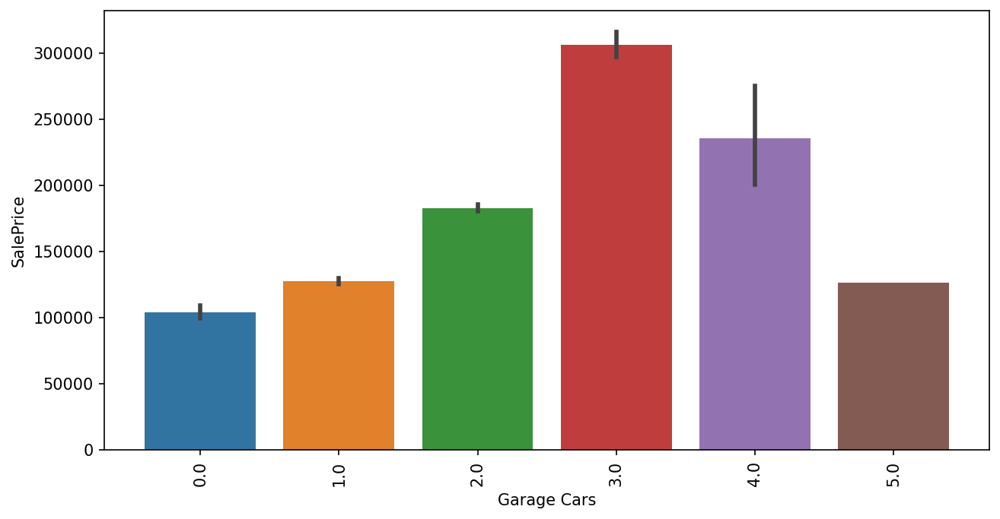

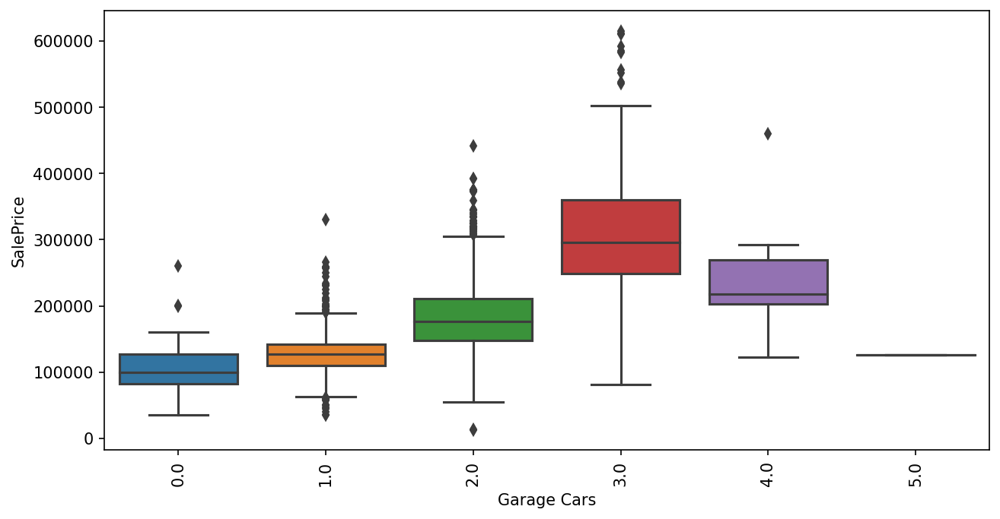

In [348]:
plot_cat(col[61])

In [349]:
num.append(col[61])
num[-1]

'Garage Cars'

In [350]:
col[62]

'Garage Area'

<Figure size 1500x750 with 0 Axes>

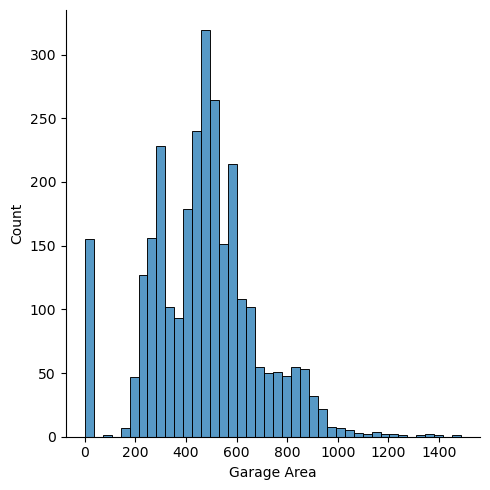

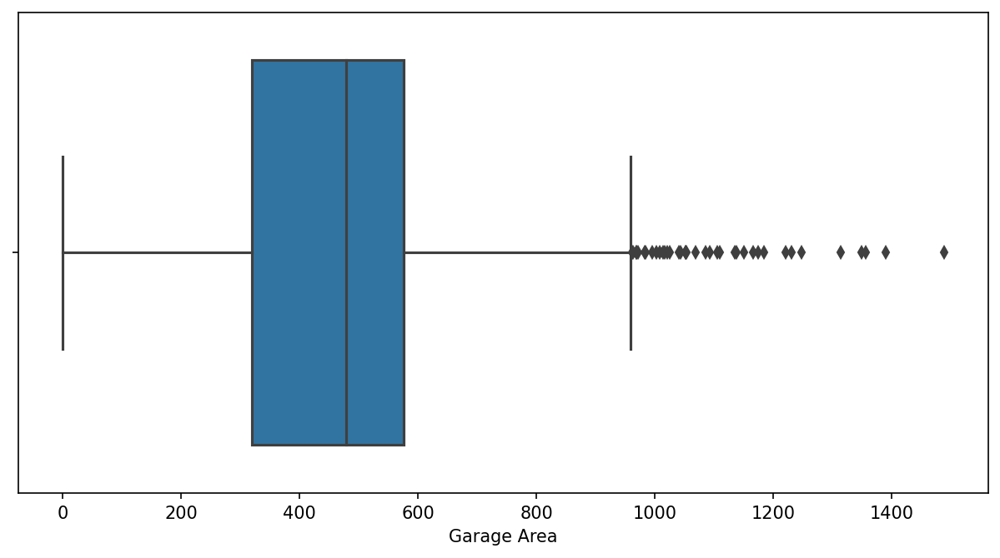

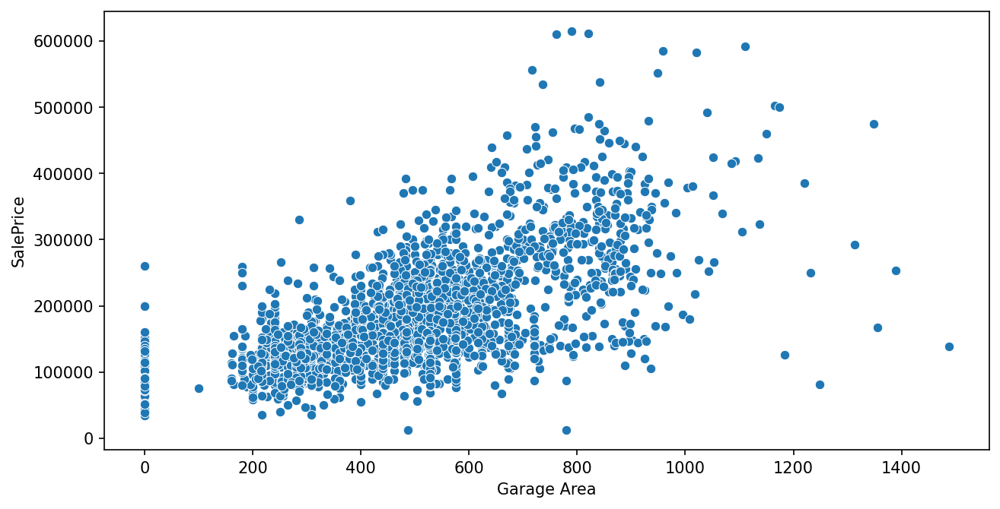

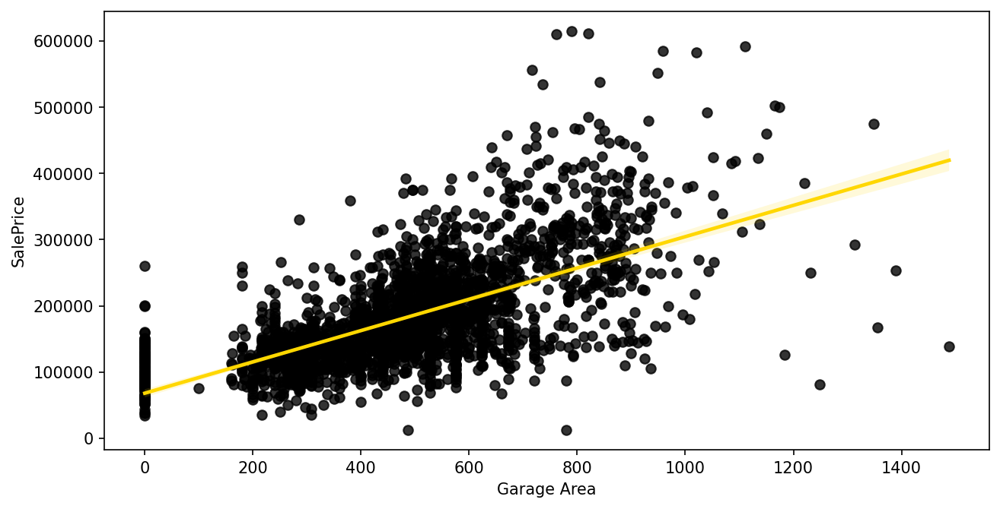

In [351]:
plot_num(col[62])

In [352]:
df = df[df[col[62]]<1200]

<Figure size 1500x750 with 0 Axes>

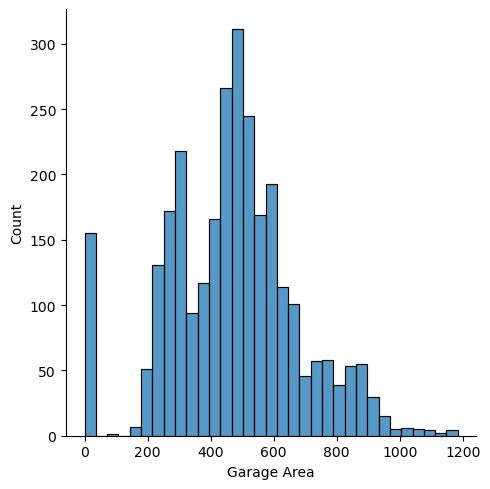

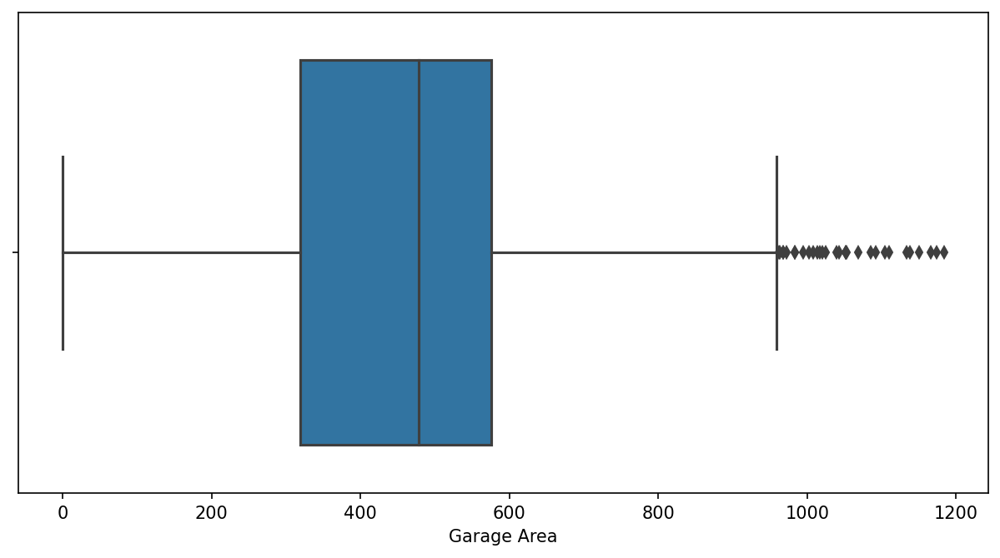

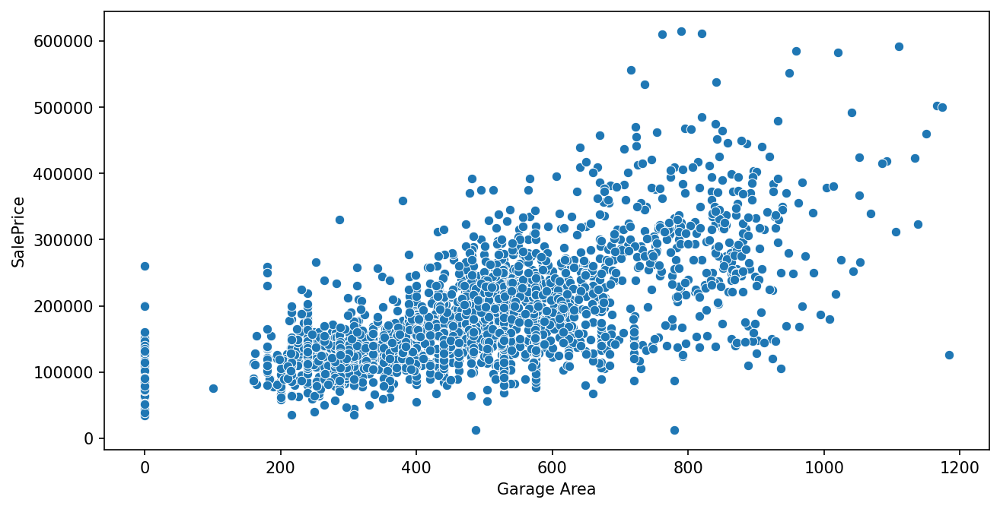

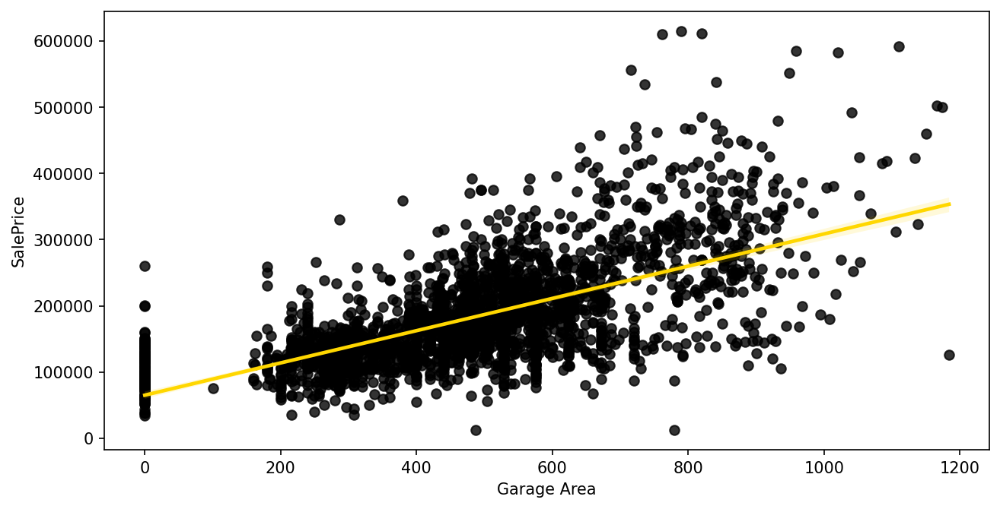

In [353]:
plot_num(col[62])

In [354]:
num.append(col[62])
num[-1]

'Garage Area'

In [355]:
col[63]

'Garage Qual'

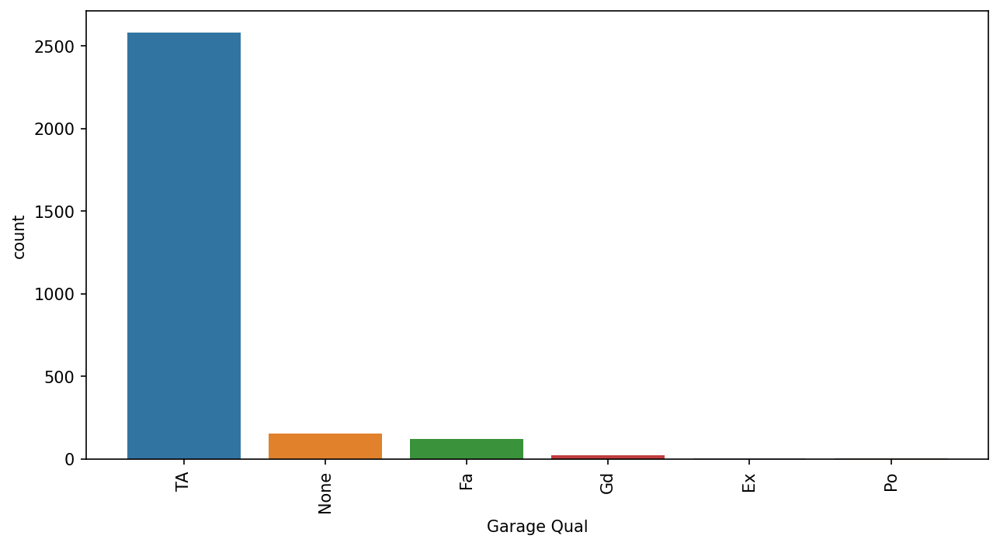

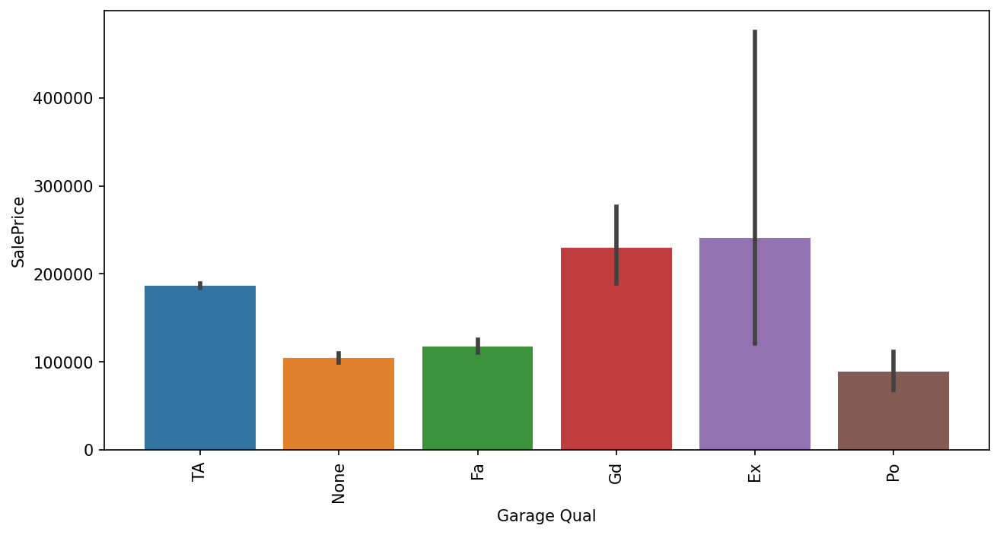

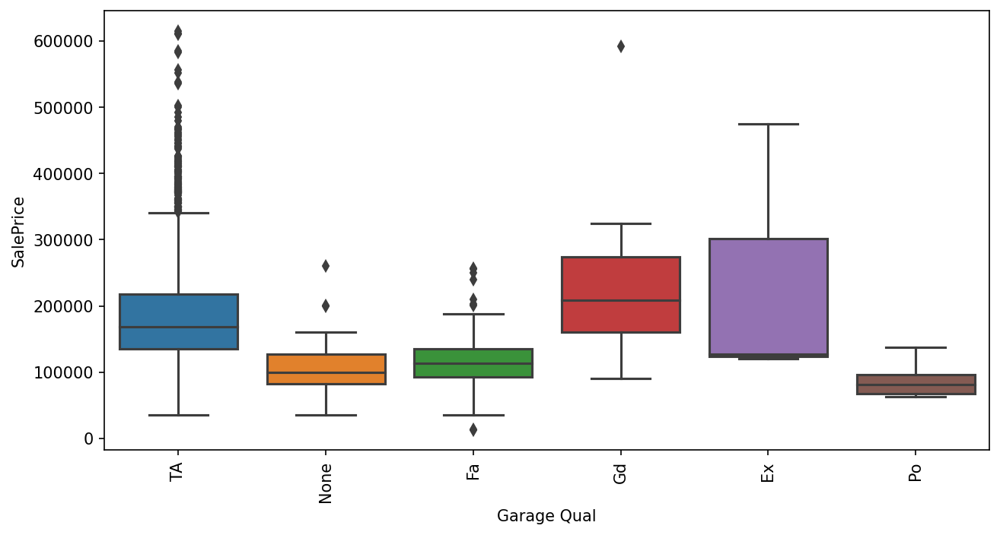

In [356]:
plot_cat(col[63])

In [357]:
df[col[63]].value_counts()

TA      2581
None     156
Fa       123
Gd        22
Po         5
Ex         3
Name: Garage Qual, dtype: int64

In [358]:
cat.append(col[63])
cat[-1]

'Garage Qual'

In [359]:
col[64]

'Garage Cond'

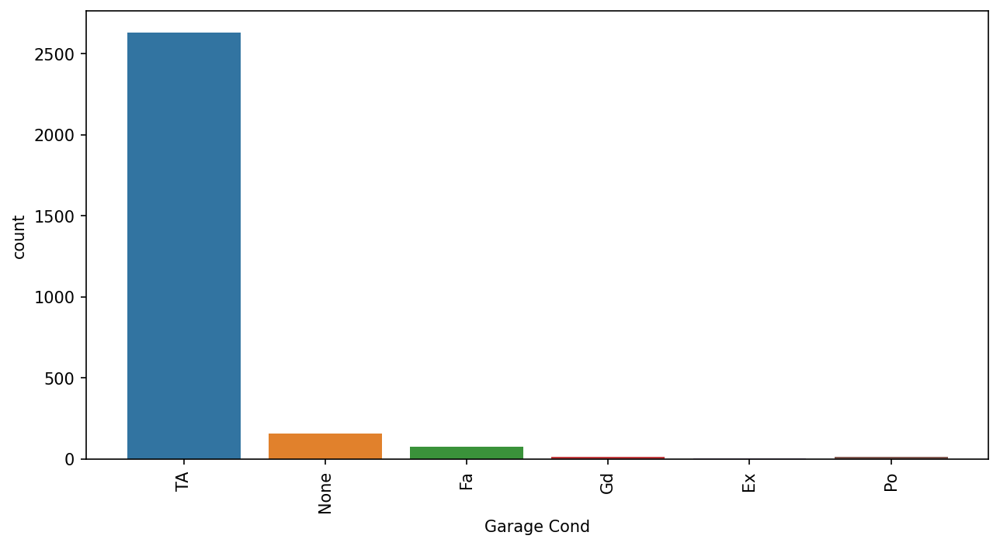

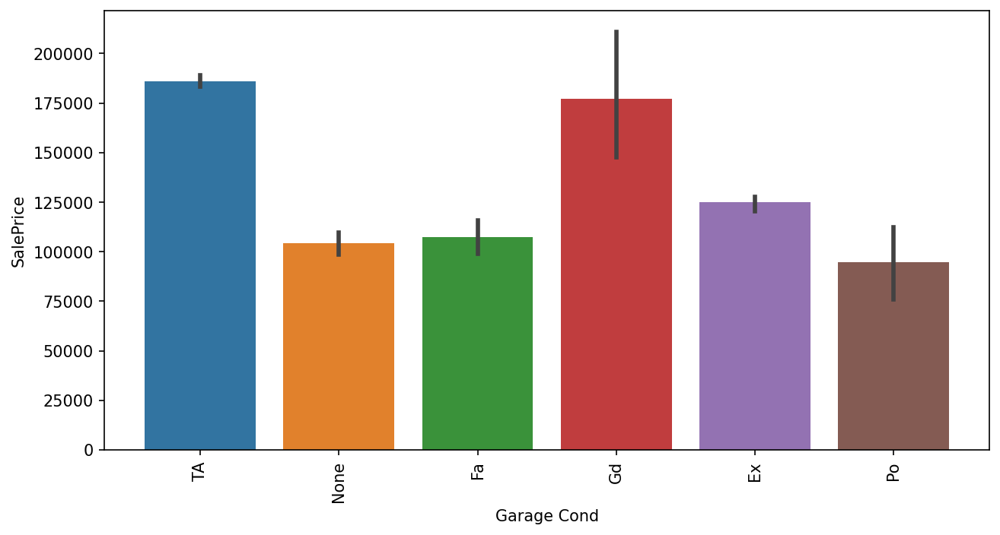

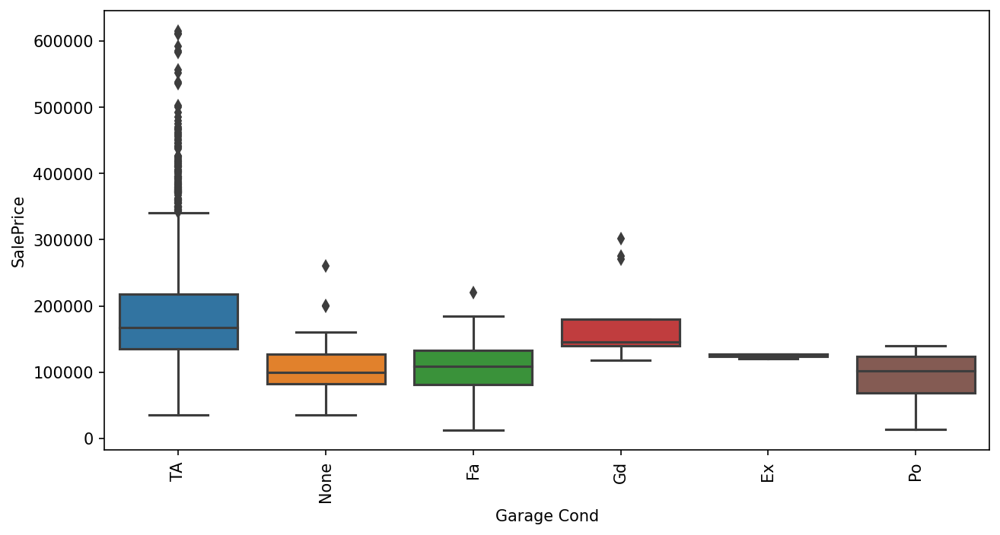

In [360]:
plot_cat(col[64])

* Eliminating this feature as it is similar to Garage Qual

In [361]:
col[65]

'Paved Drive'

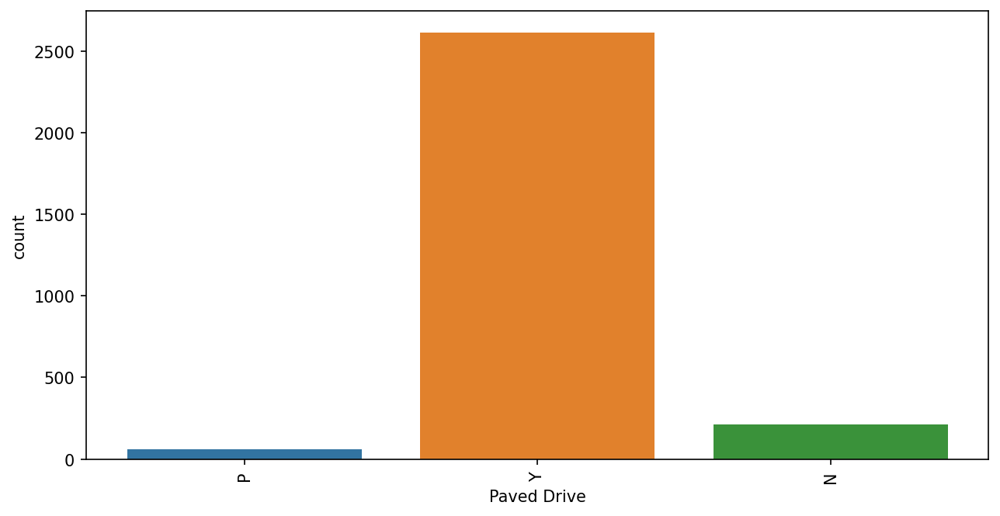

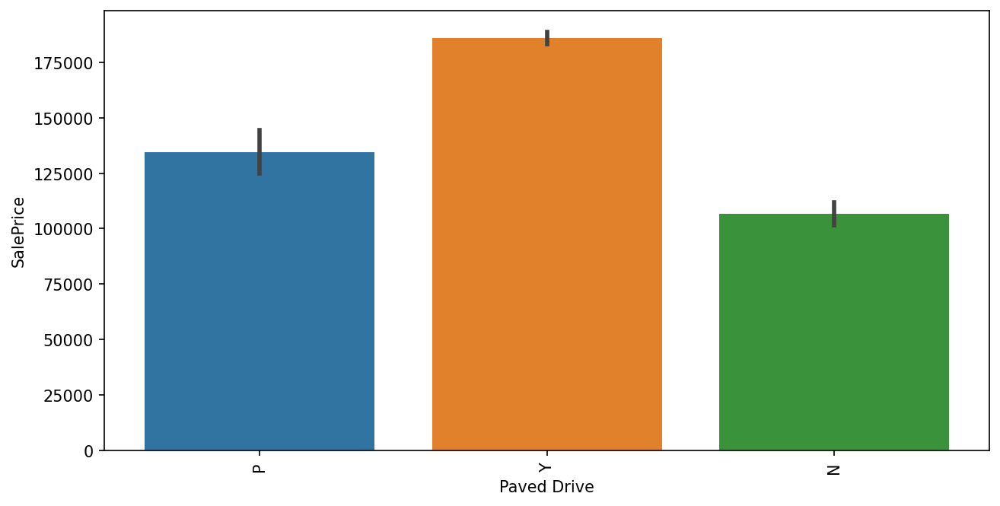

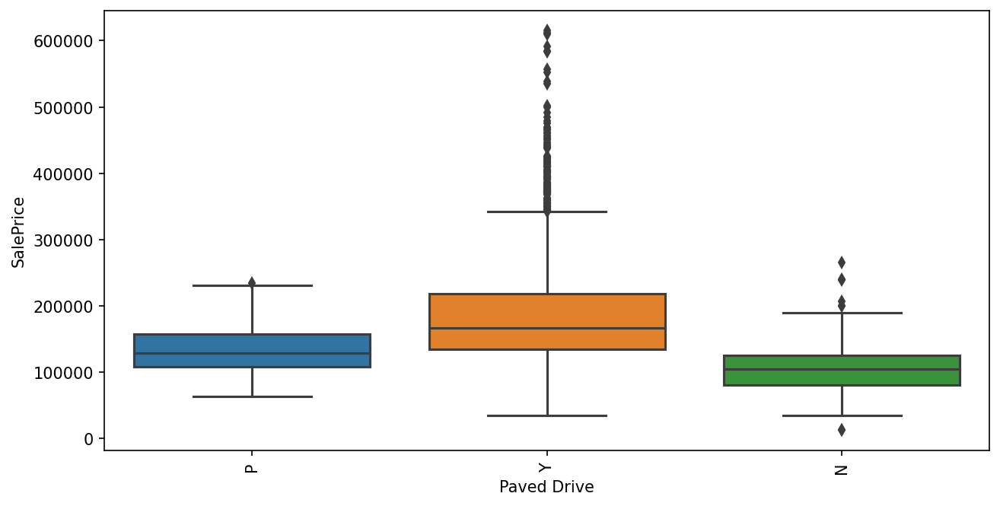

In [362]:
plot_cat(col[65])

In [363]:
cat.append(col[65])
cat[-1]

'Paved Drive'

In [364]:
col[66]

'Wood Deck SF'

<Figure size 1500x750 with 0 Axes>

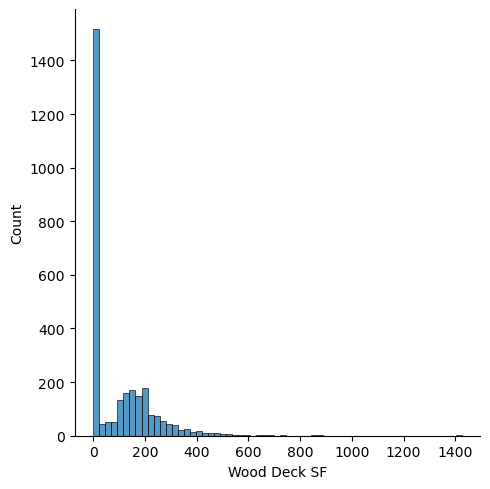

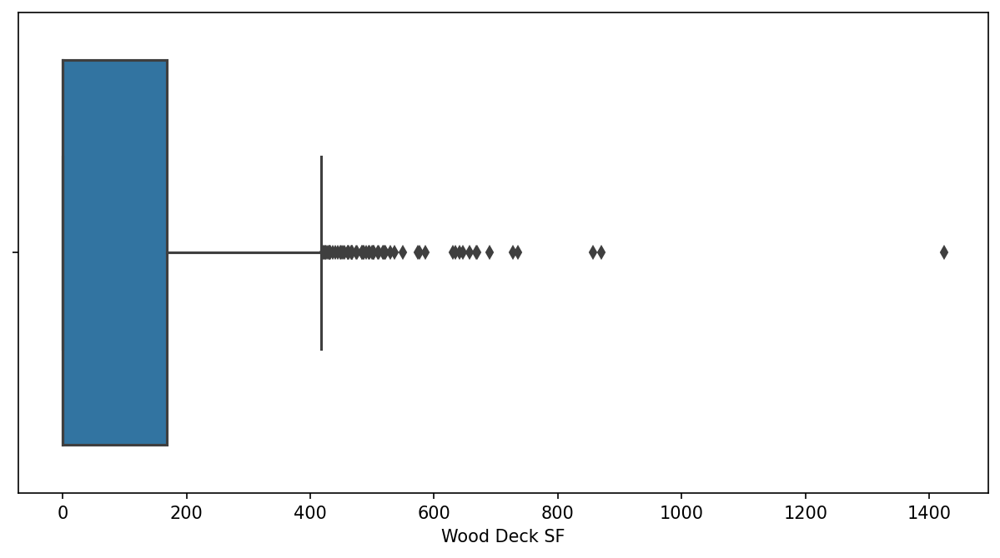

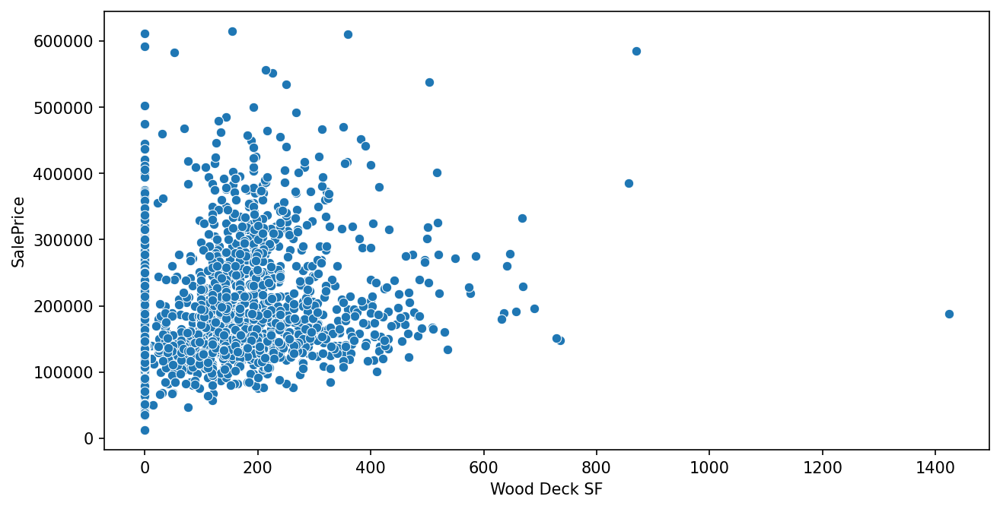

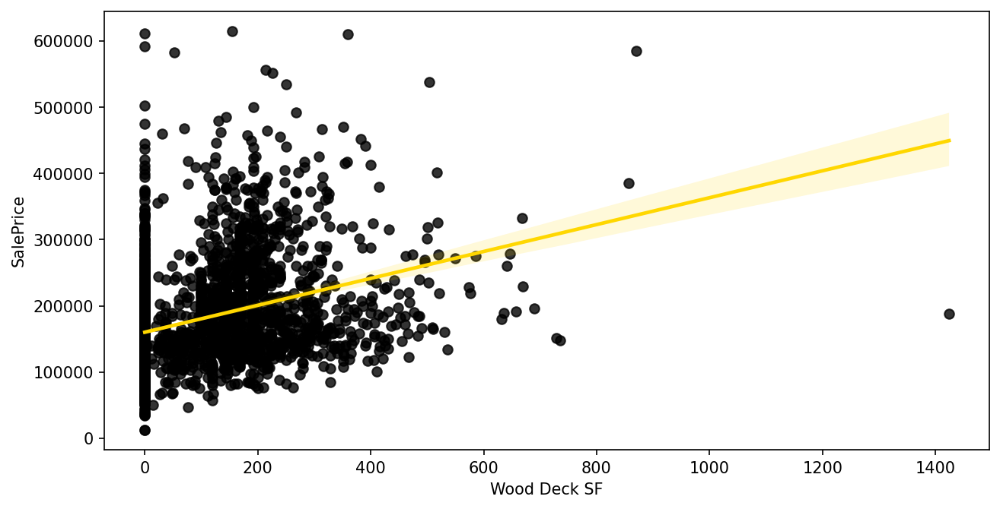

In [365]:
plot_num(col[66])

In [366]:
df = df[df[col[66]]<1000]

<Figure size 1500x750 with 0 Axes>

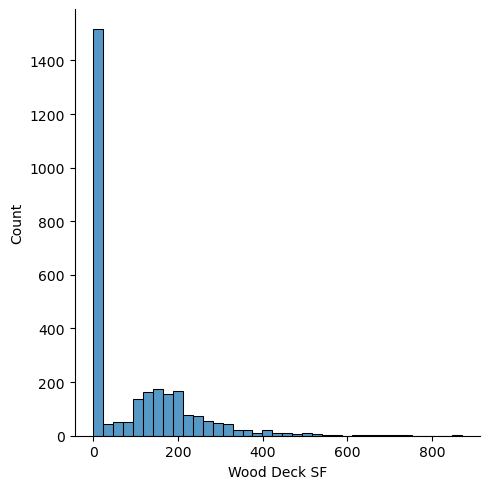

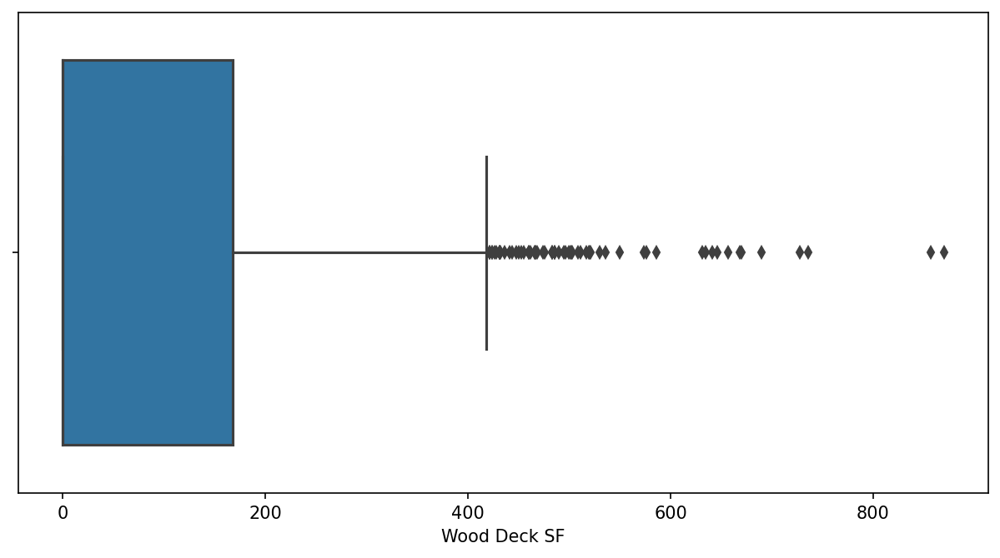

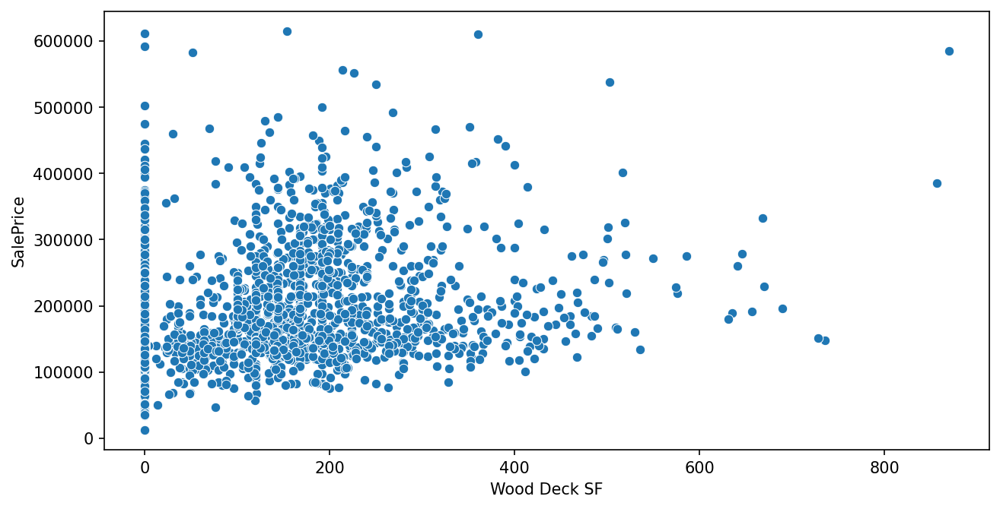

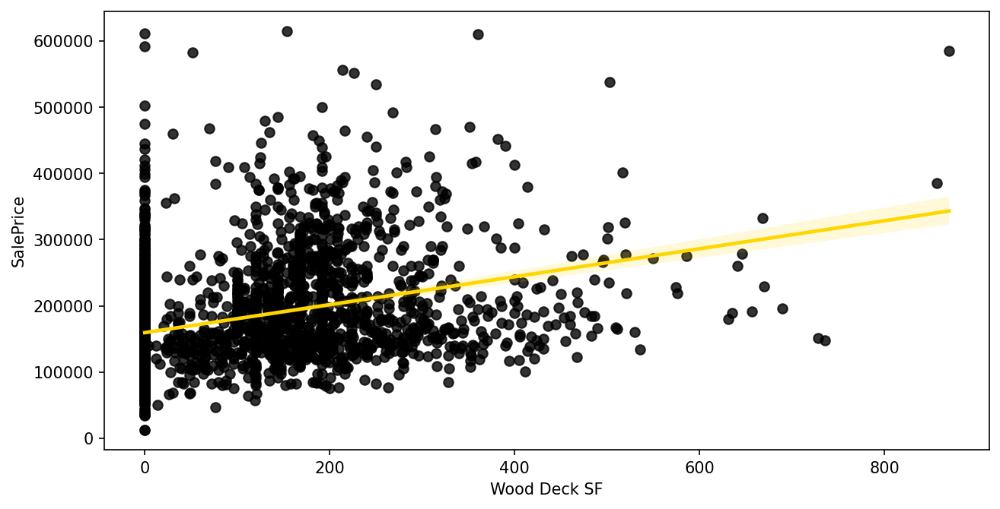

In [367]:
plot_num(col[66])

In [368]:
num.append(col[66])
num[-1]

'Wood Deck SF'

In [369]:
col[67]

'Open Porch SF'

<Figure size 1500x750 with 0 Axes>

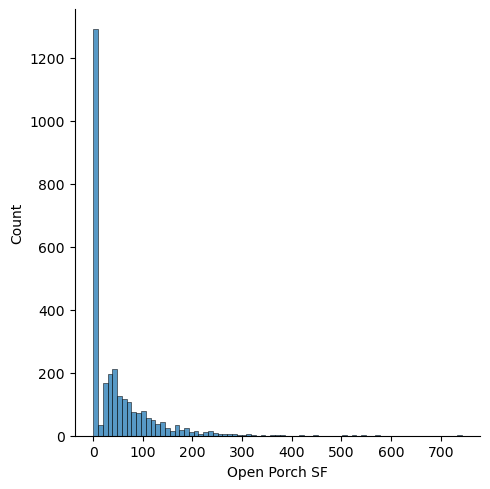

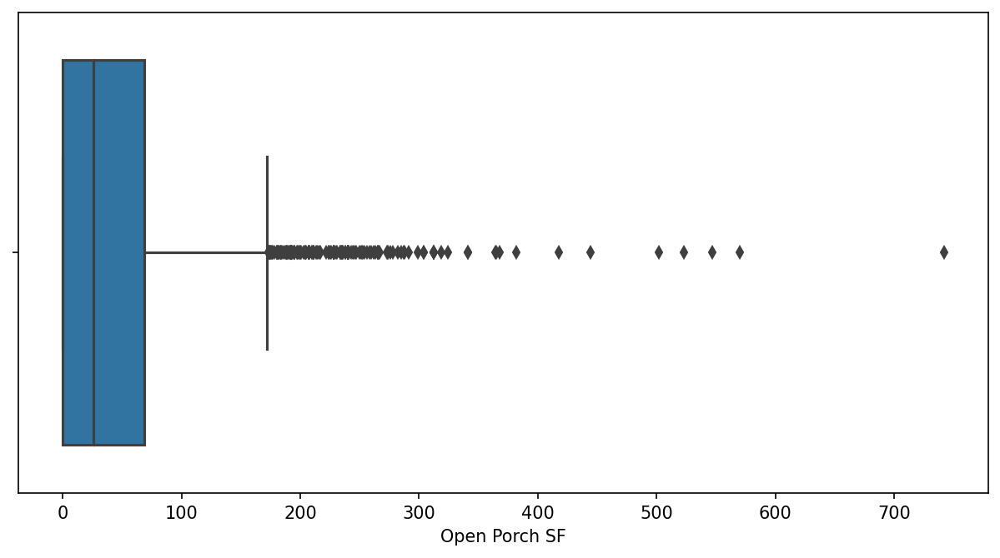

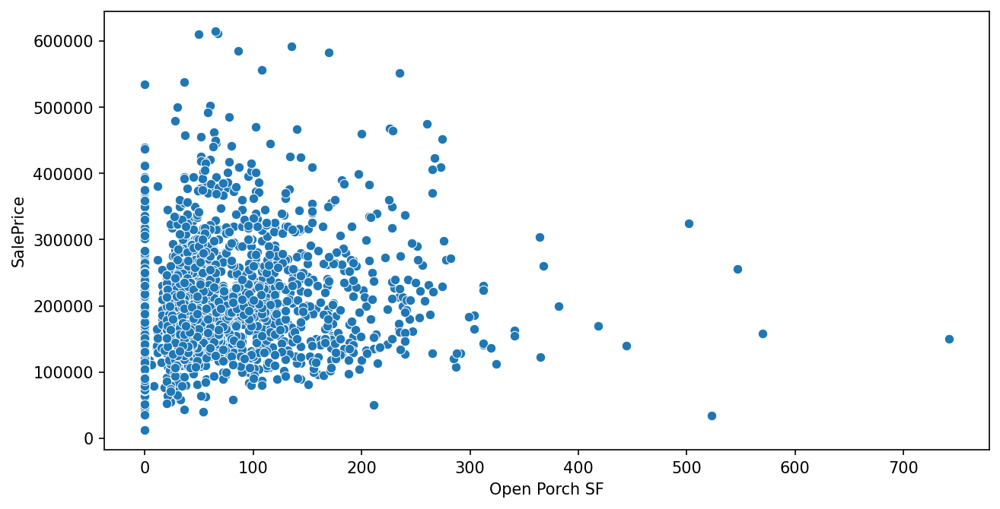

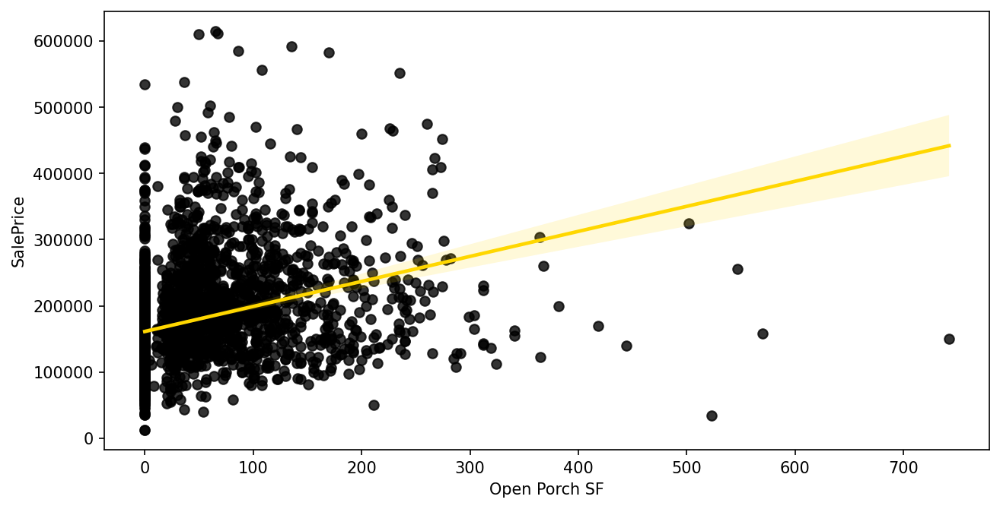

In [370]:
plot_num(col[67])

In [371]:
df=df[df[col[67]]<400]

<Figure size 1500x750 with 0 Axes>

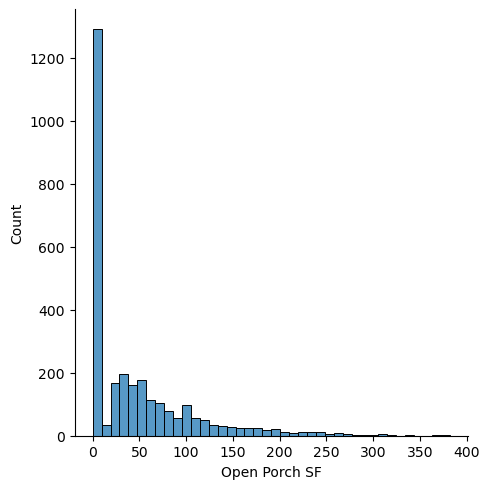

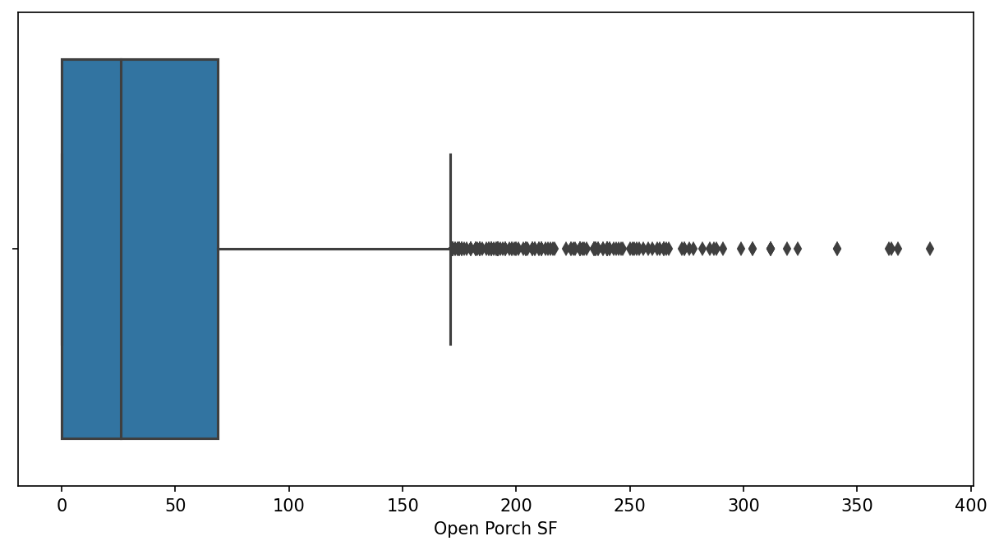

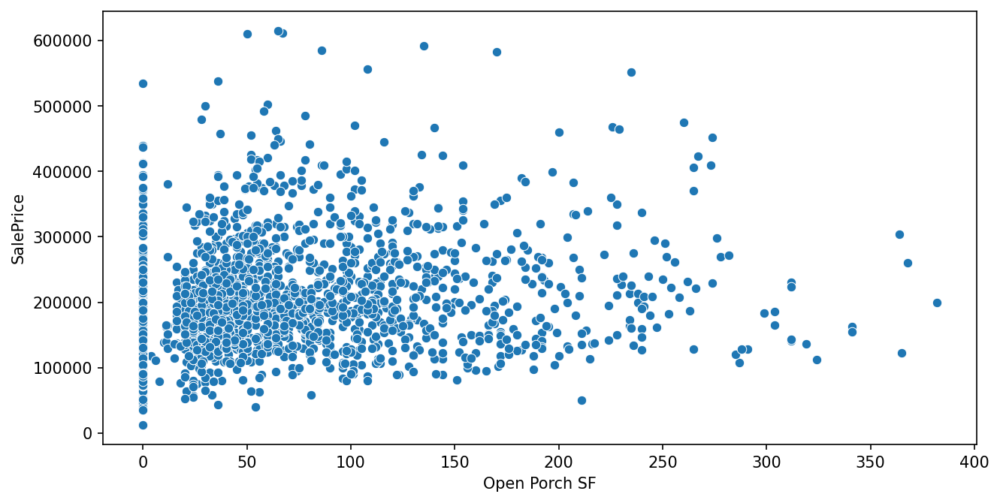

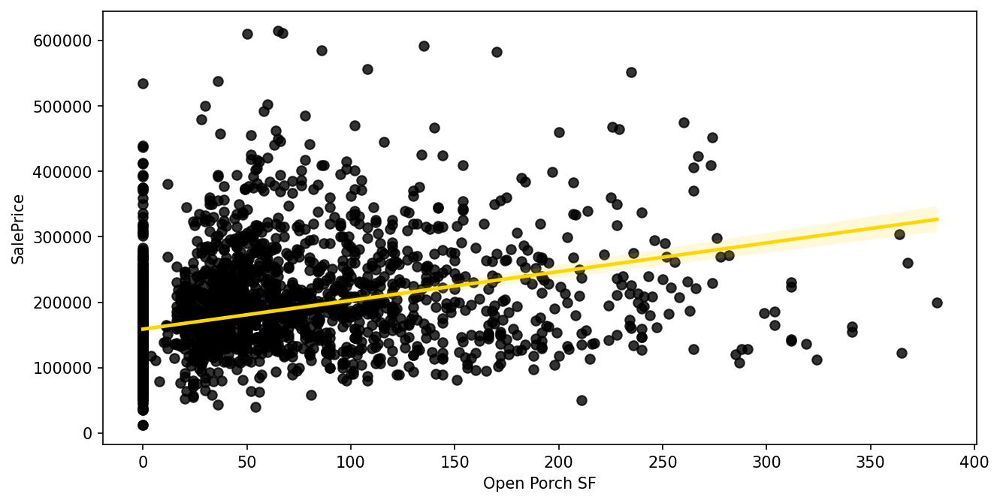

In [372]:
plot_num(col[67])

In [373]:
num.append(col[67])
num[-1]

'Open Porch SF'

In [374]:
col[68]

'Enclosed Porch'

<Figure size 1500x750 with 0 Axes>

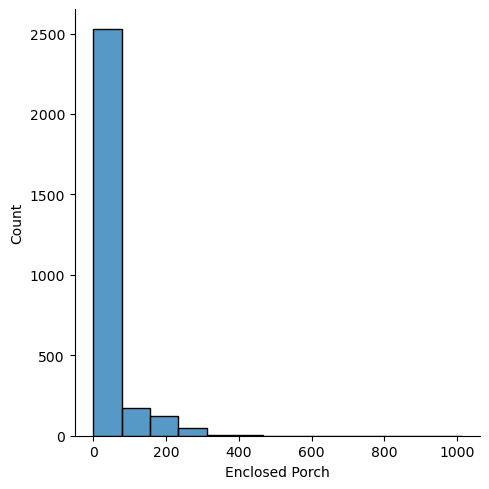

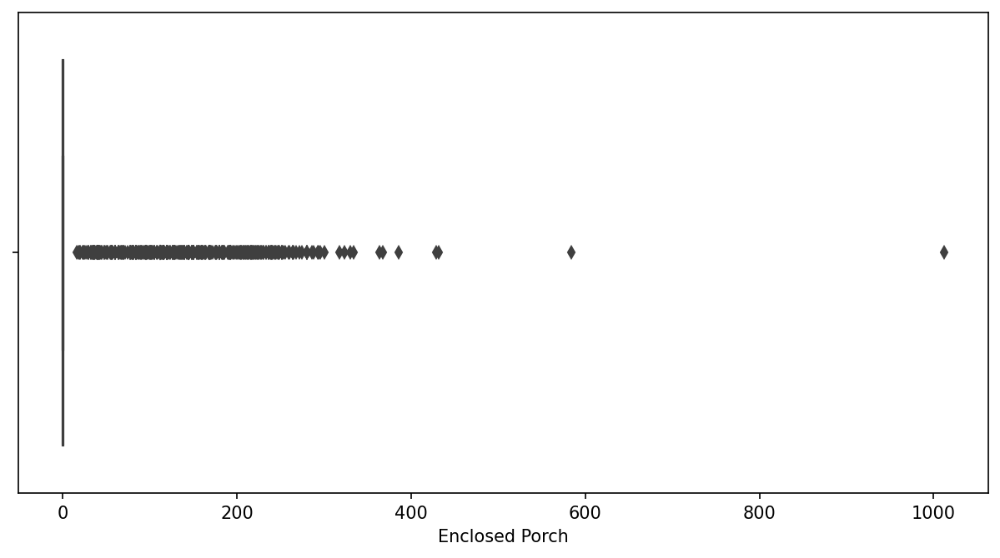

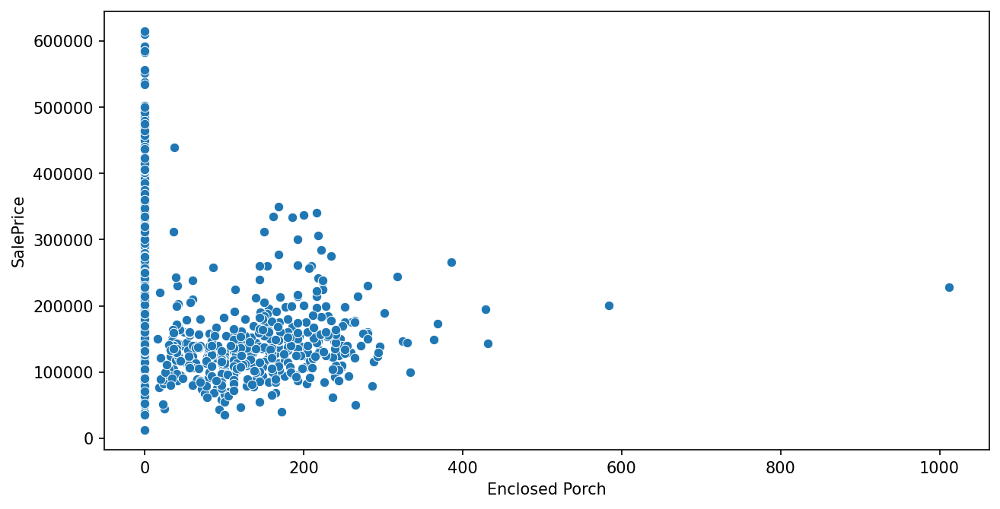

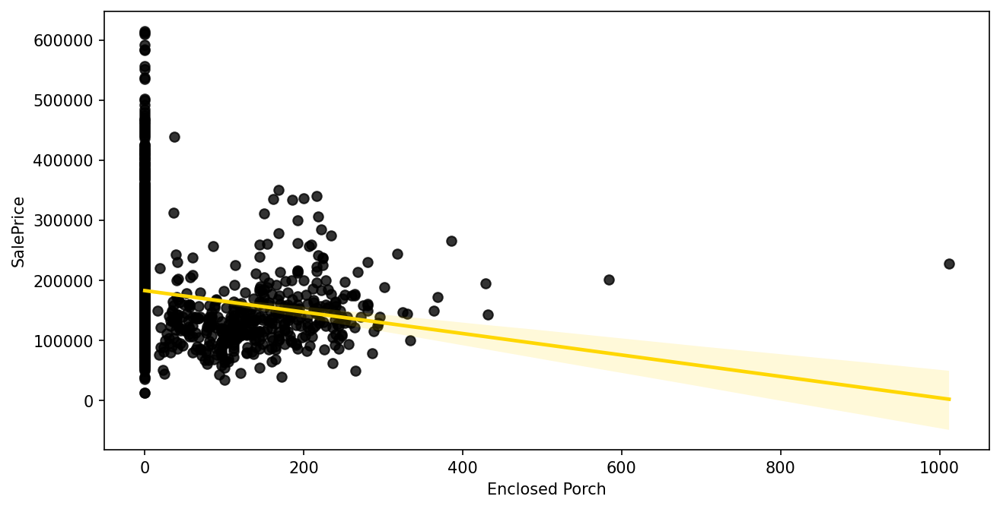

In [375]:
plot_num(col[68])

In [376]:
num.append(col[68])
num[-1]

'Enclosed Porch'

In [377]:
col[69]

'3Ssn Porch'

<Figure size 1500x750 with 0 Axes>

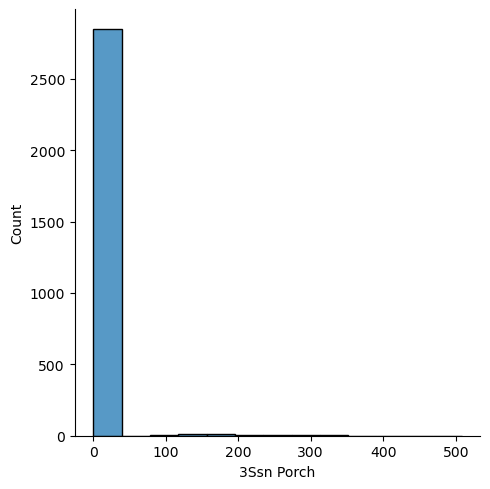

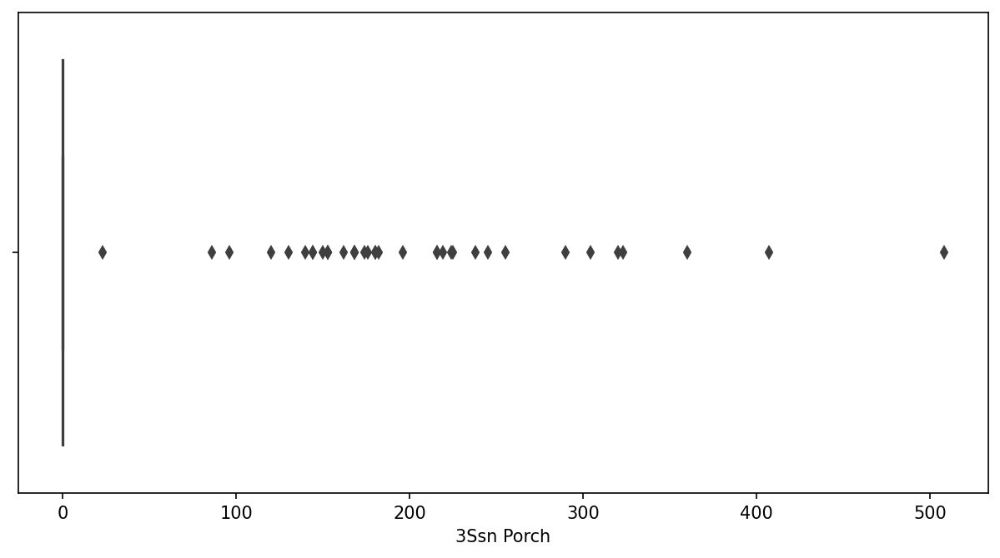

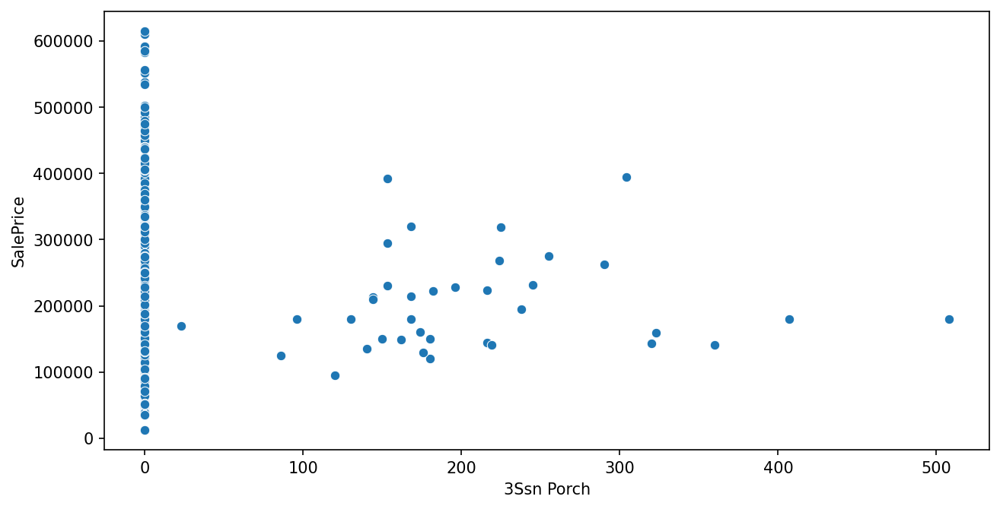

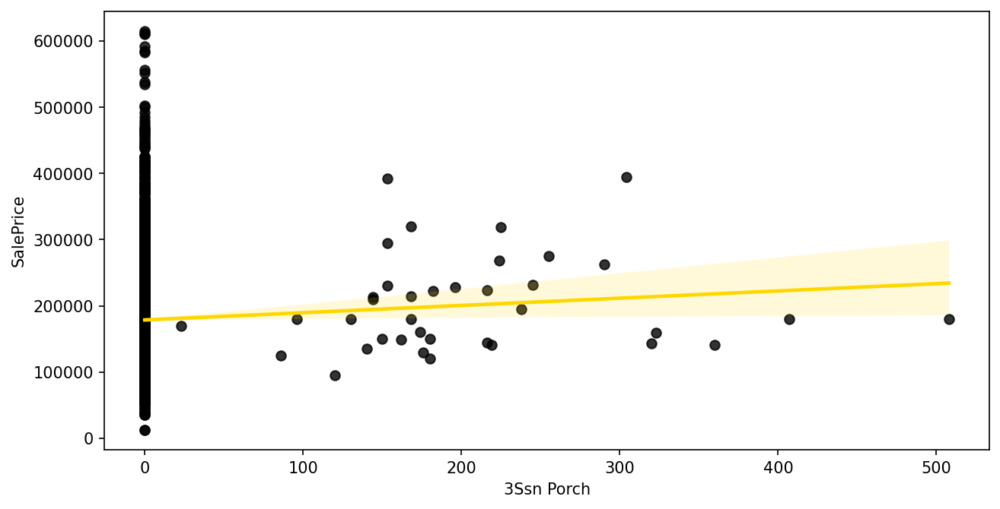

In [378]:
plot_num(col[69])

In [379]:
num.append(col[69])
num[-1]

'3Ssn Porch'

In [380]:
col[70]

'Screen Porch'

<Figure size 1500x750 with 0 Axes>

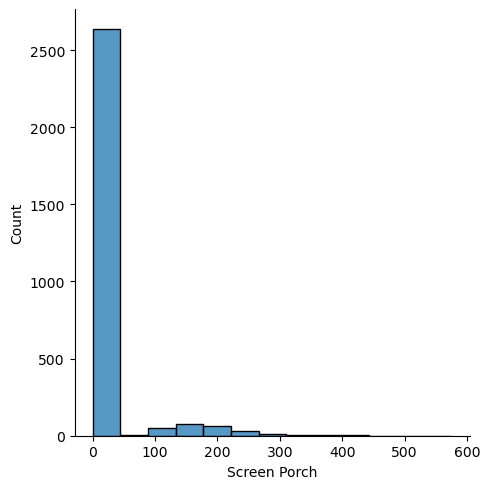

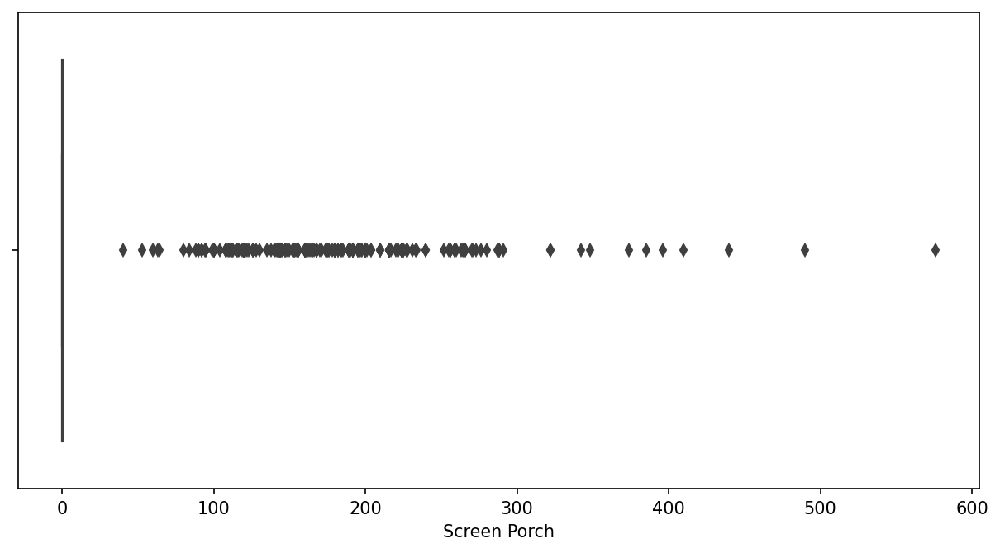

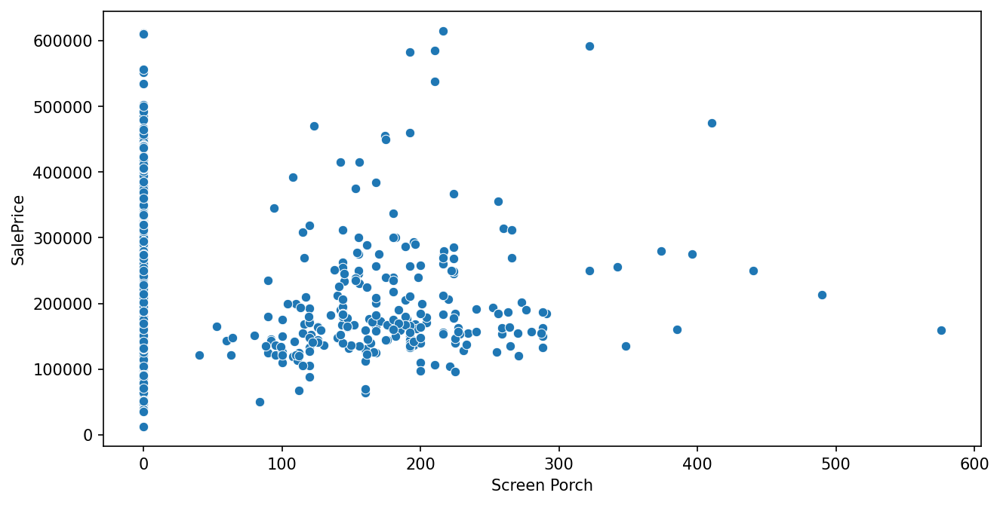

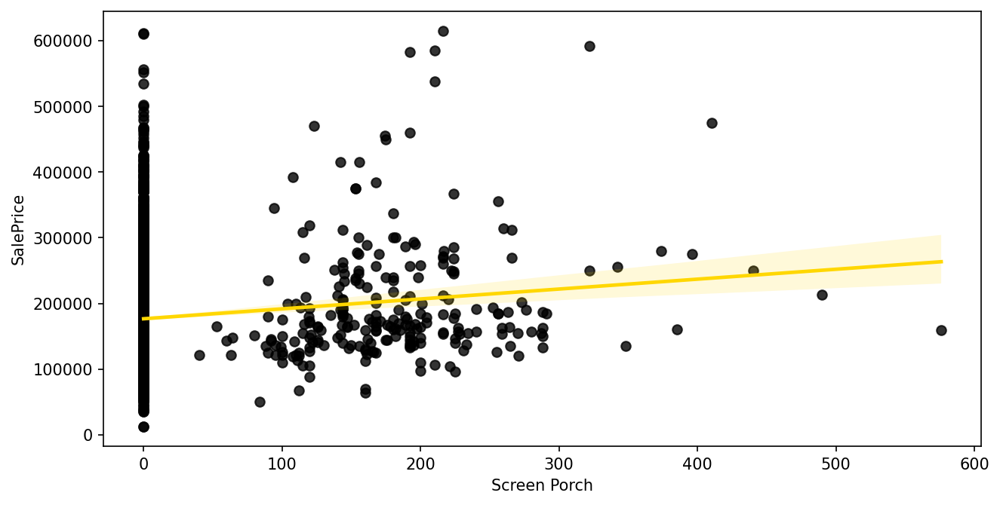

In [381]:
plot_num(col[70])

In [382]:
df.corr()['SalePrice']['Screen Porch']

C:\Users\Harish Raju\AppData\Local\Temp\ipykernel_16824\2902613945.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()['SalePrice']['Screen Porch']


0.10803961497715117

* Eliminating this feature

In [383]:
col[71]

'Pool Area'

<Figure size 1500x750 with 0 Axes>

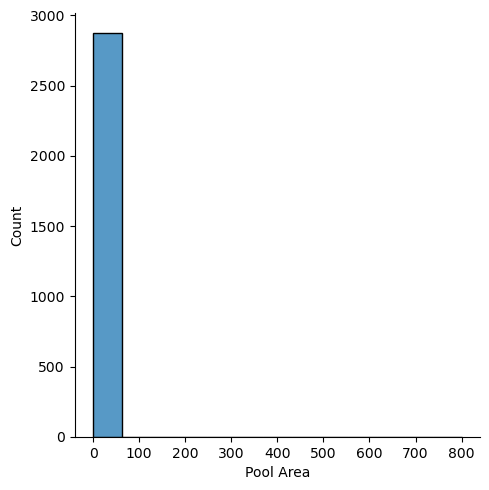

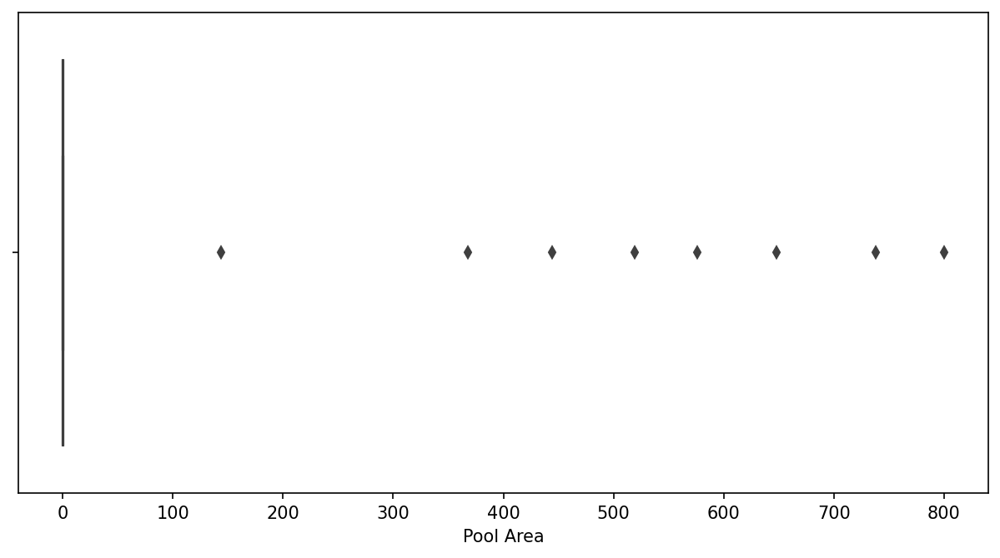

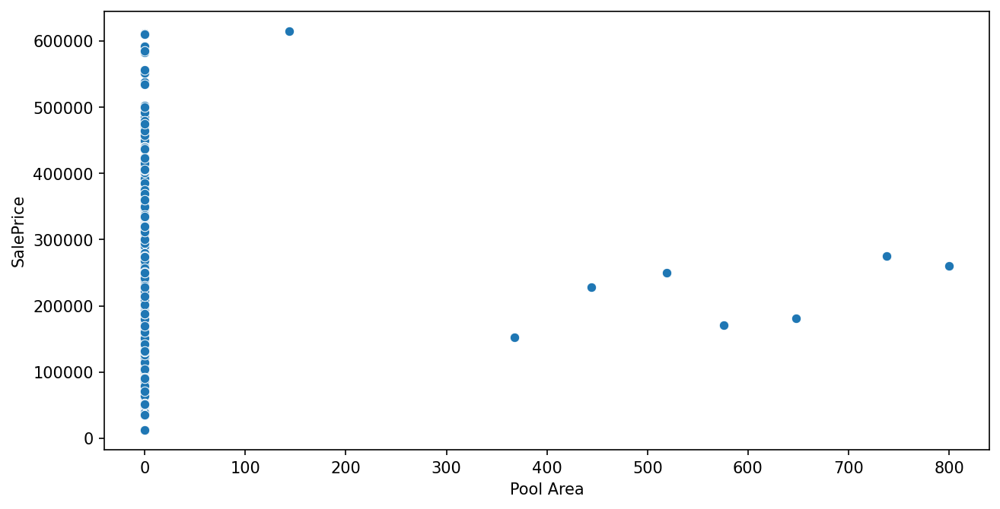

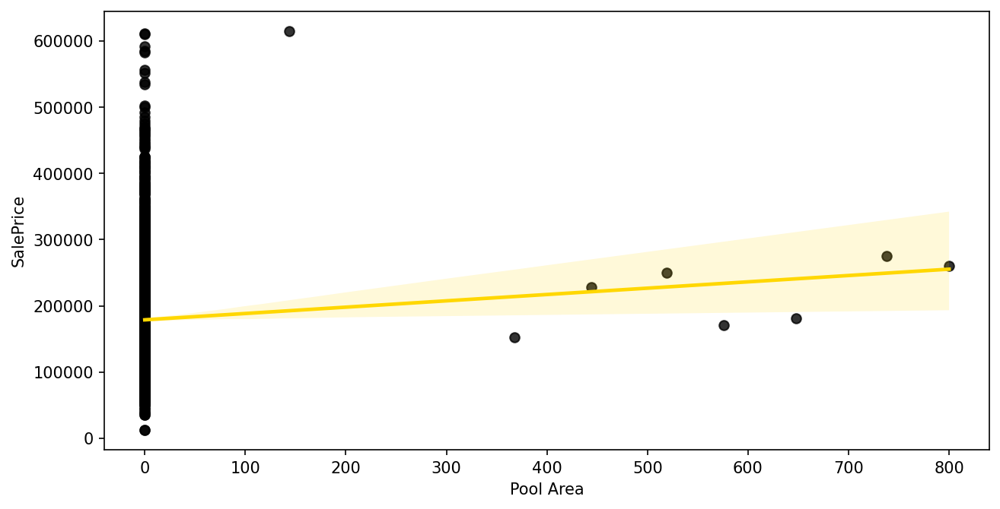

In [384]:
plot_num(col[71])

In [385]:
df = df[(df[col[71]]<100) | (df[col[71]]>200)]

<Figure size 1500x750 with 0 Axes>

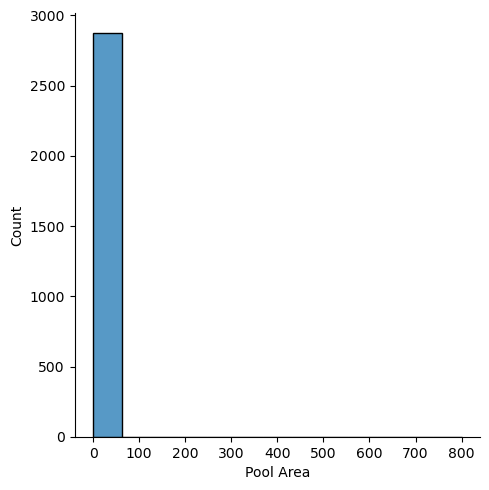

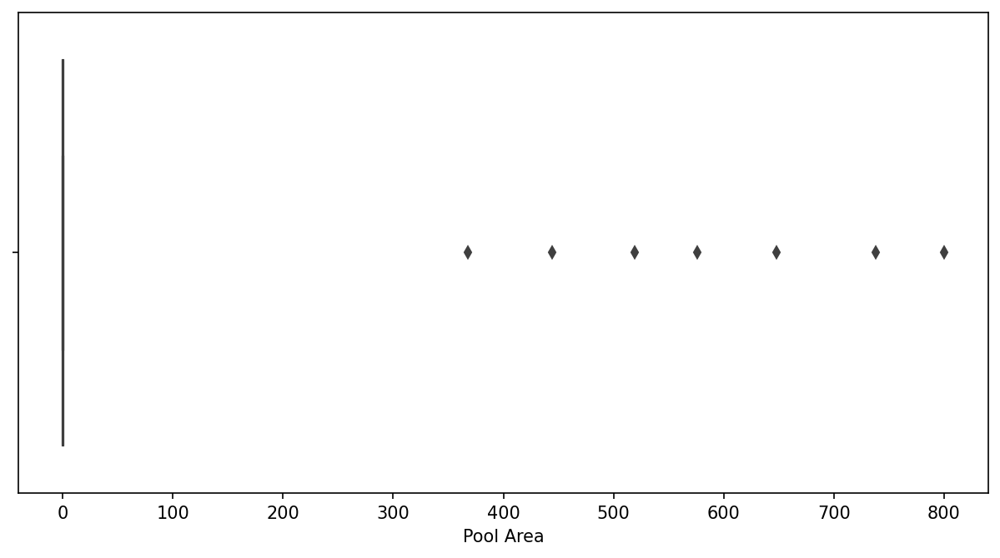

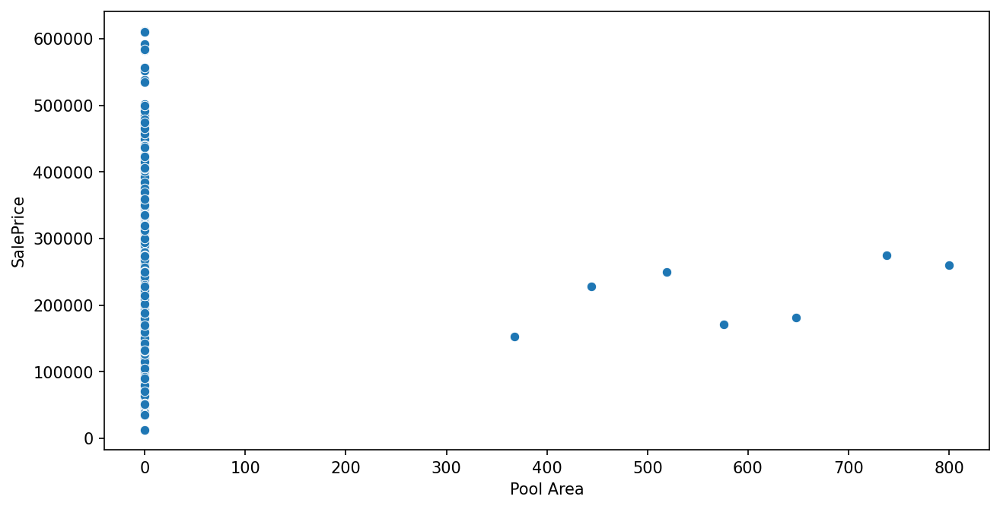

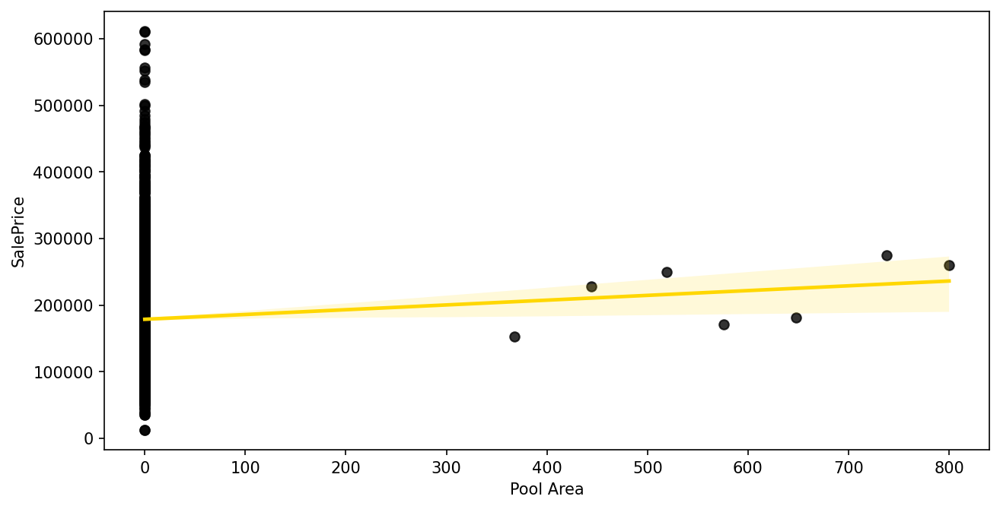

In [386]:
plot_num(col[71])

In [387]:
num.append(col[71])
num[-1]

'Pool Area'

In [388]:
col[72]

'Pool QC'

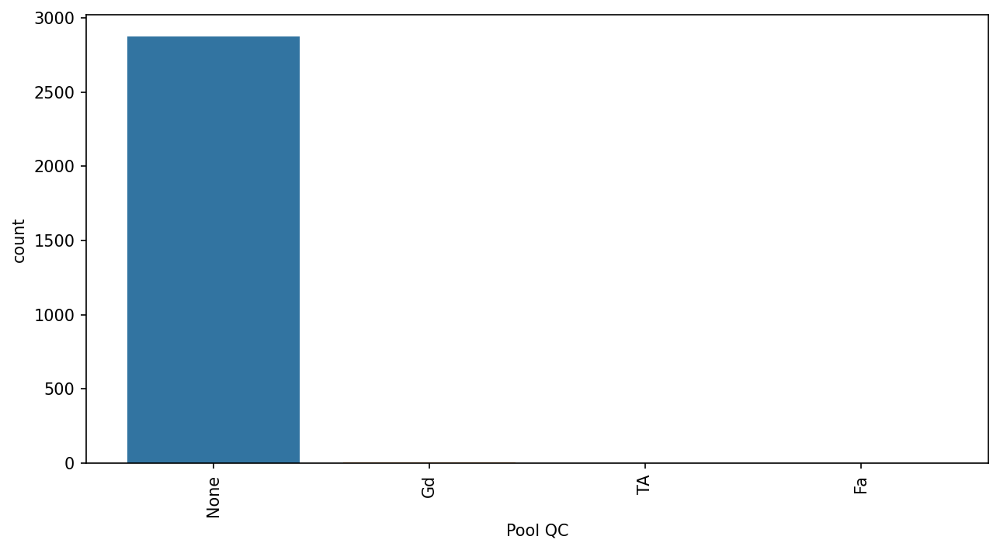

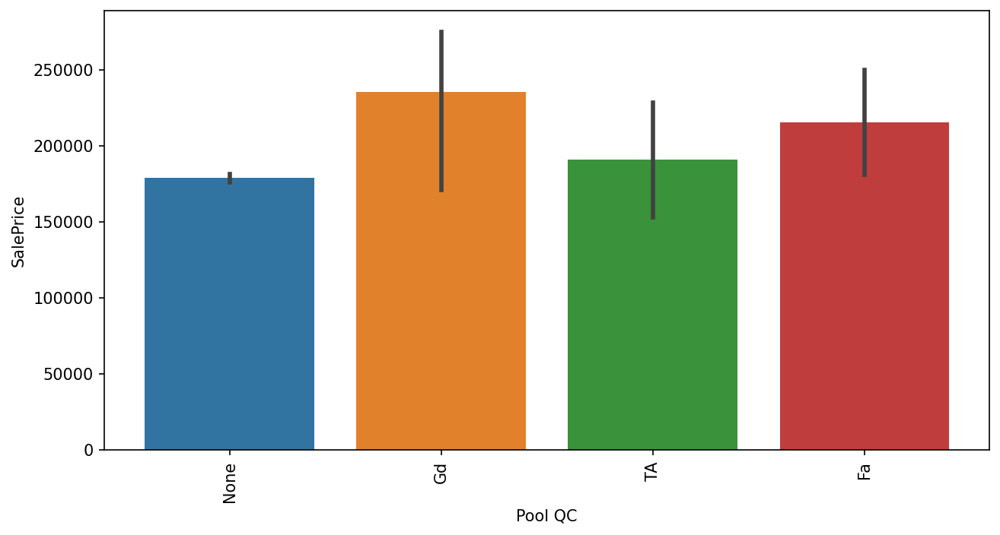

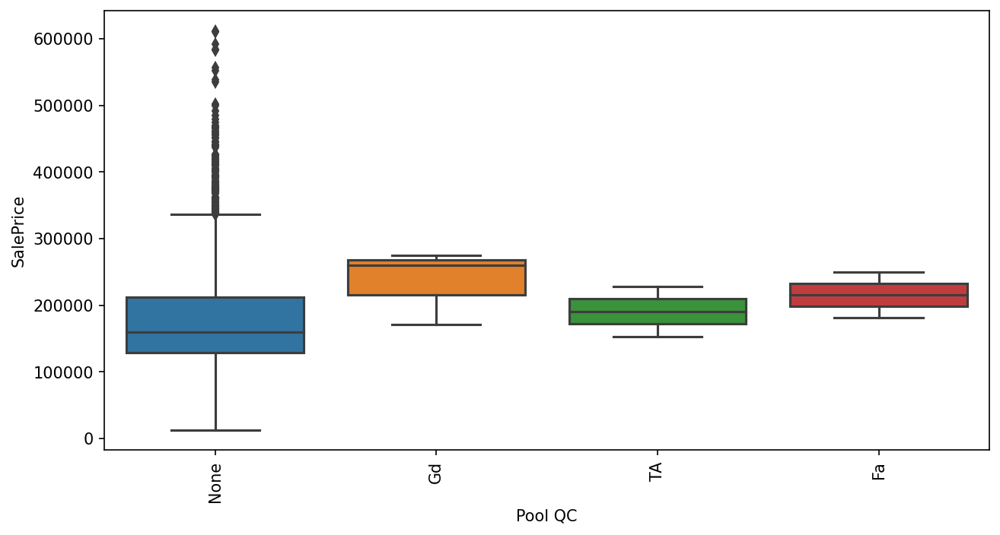

In [389]:
plot_cat(col[72])

In [390]:
cat.append(col[72])
cat[-1]

'Pool QC'

In [391]:
col[73]

'Fence'

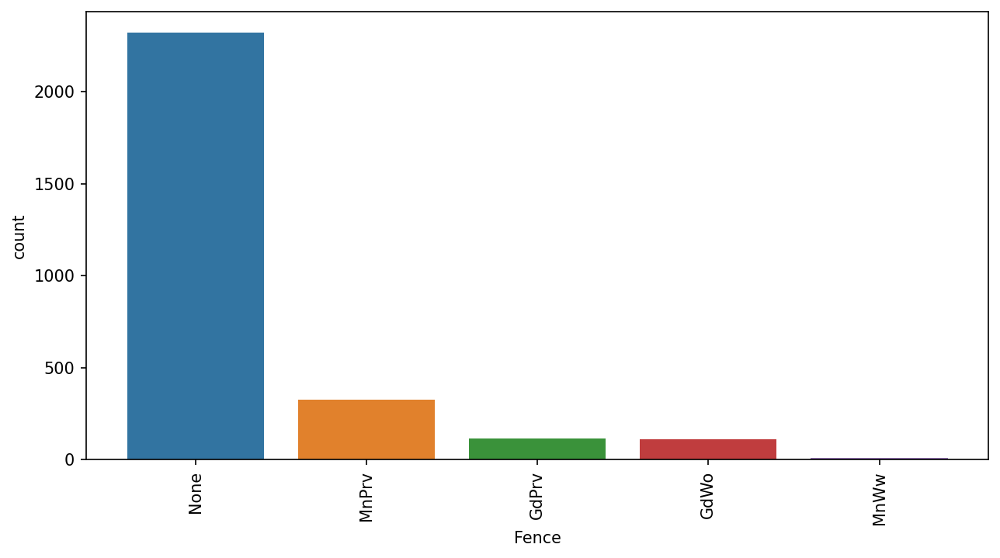

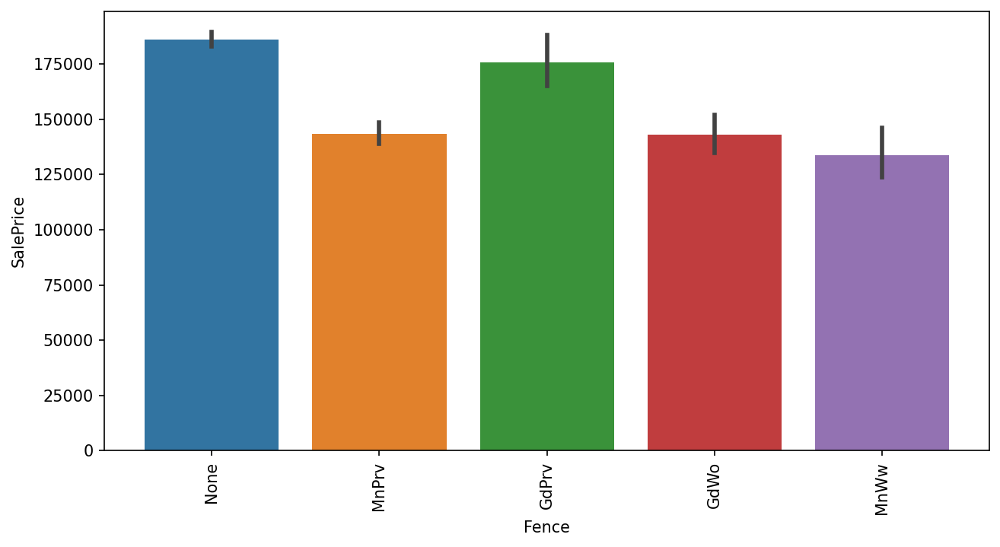

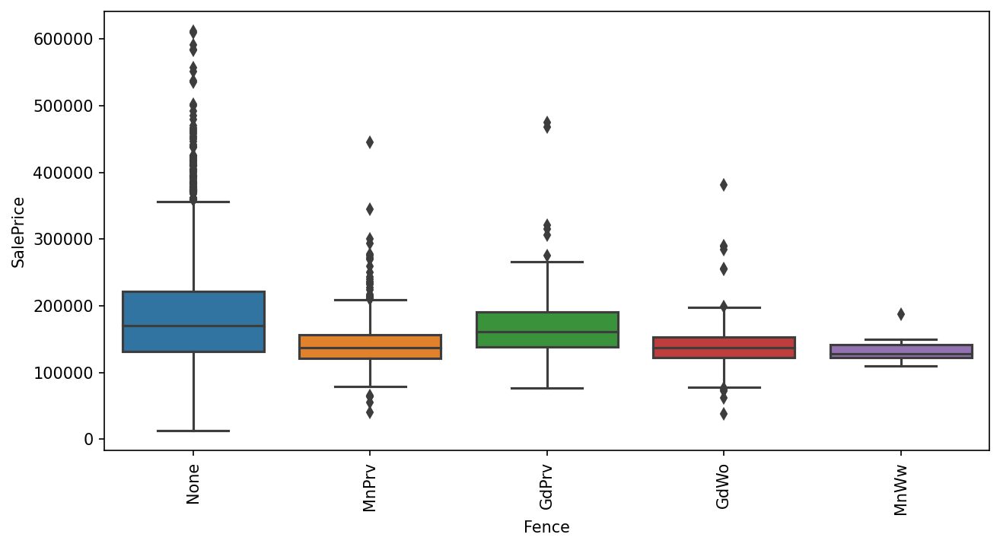

In [392]:
plot_cat(col[73])

In [393]:
cat.append(col[73])
cat[-1]

'Fence'

In [394]:
col[74]

'Misc Feature'

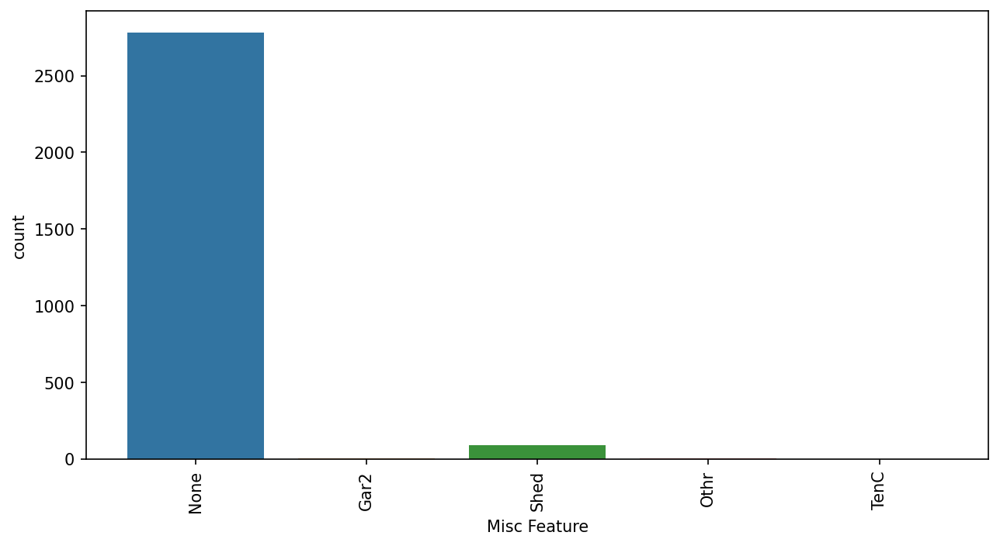

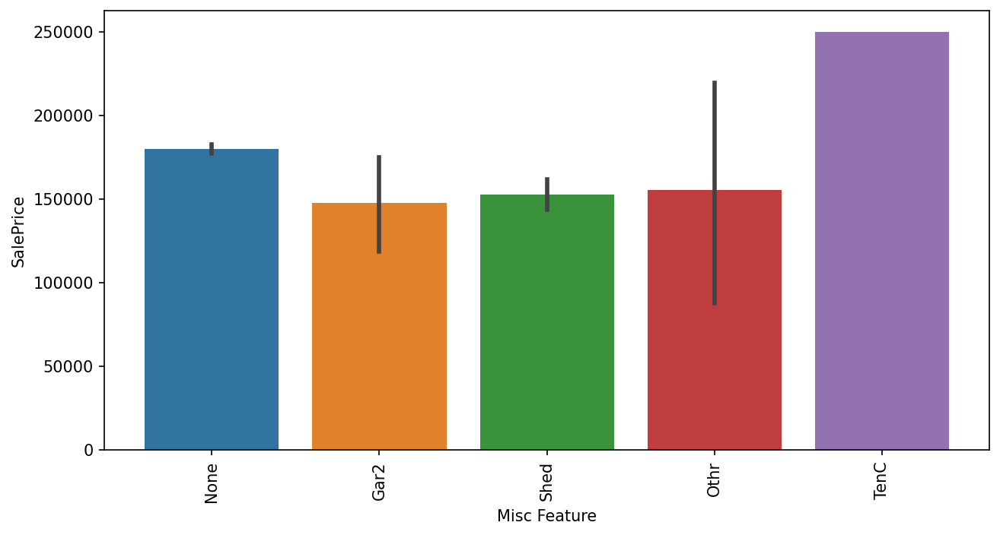

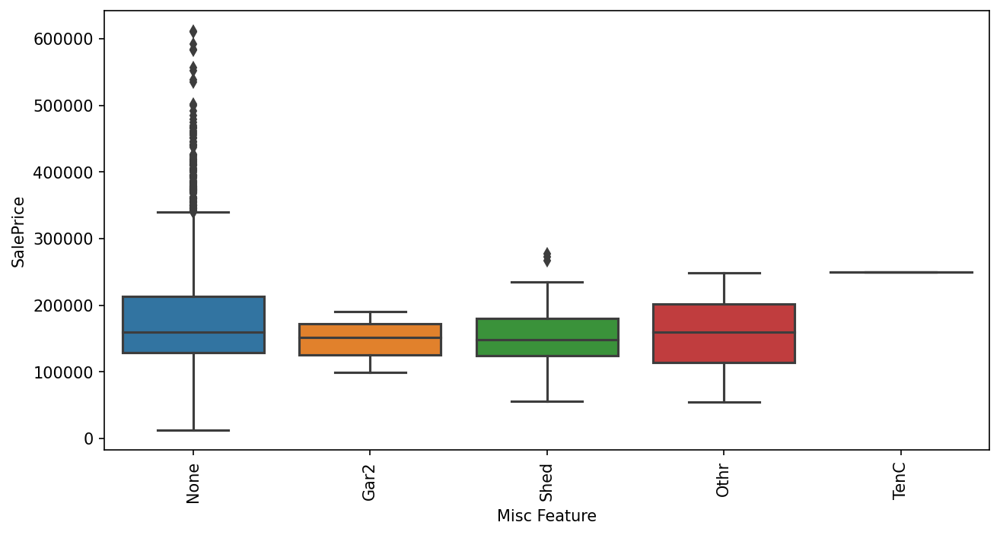

In [395]:
plot_cat(col[74])

* Eliminating this feature

In [396]:
col[75]

'Misc Val'

<Figure size 1500x750 with 0 Axes>

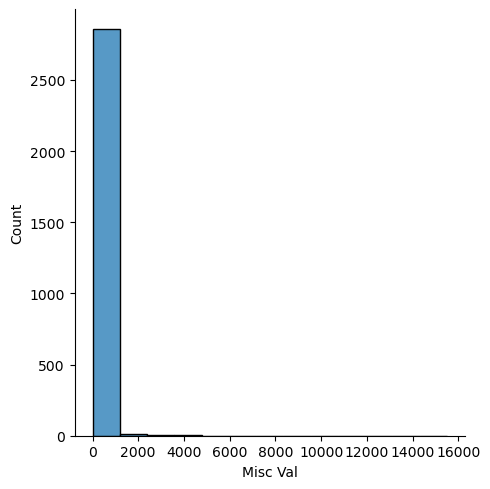

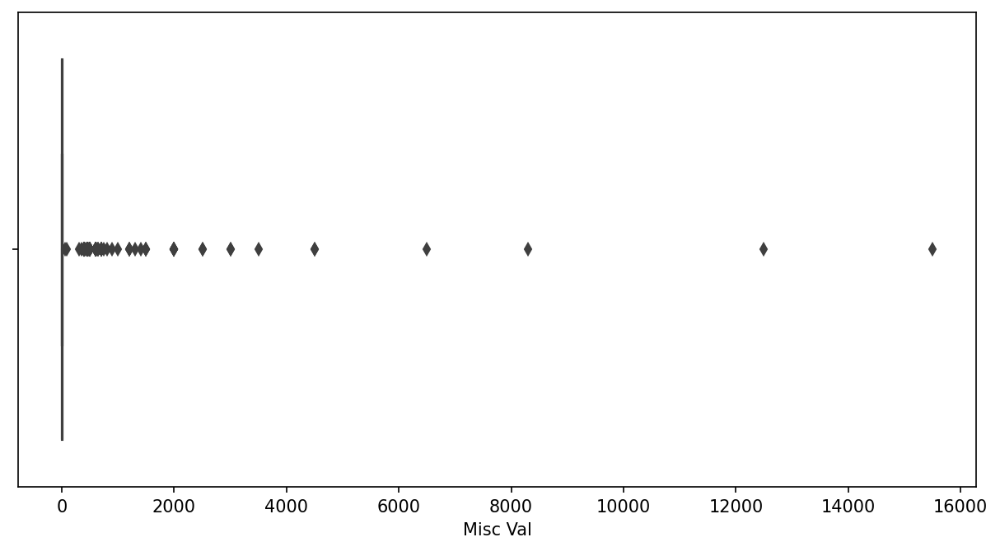

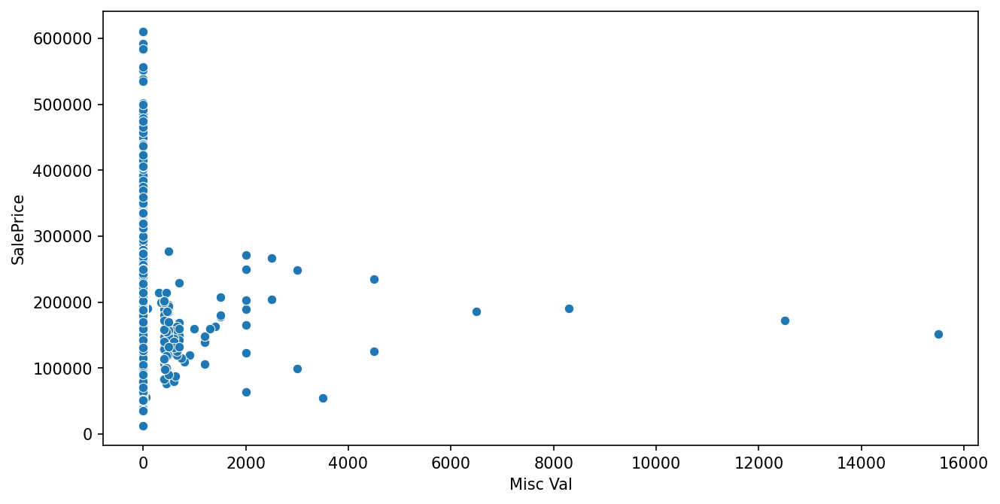

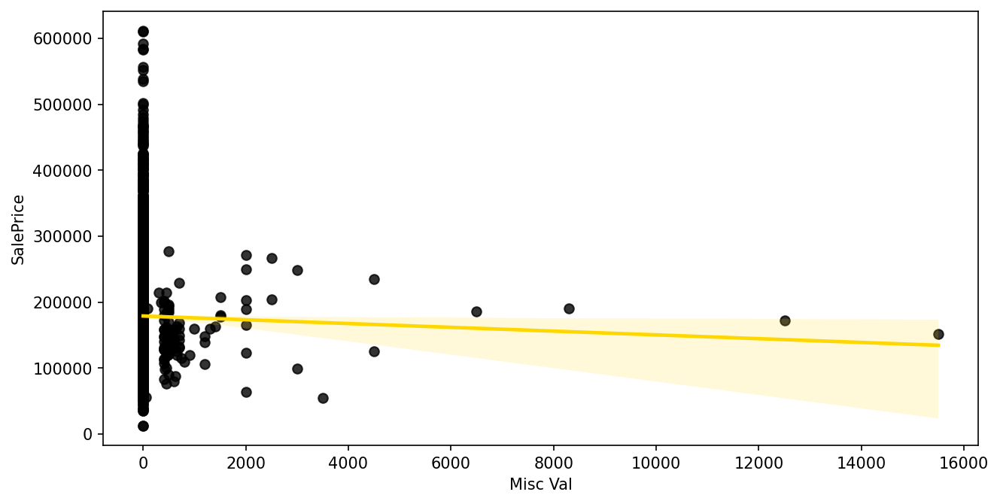

In [397]:
plot_num(col[75])

* Eliminating This Feature

In [398]:
col[76]

'Mo Sold'

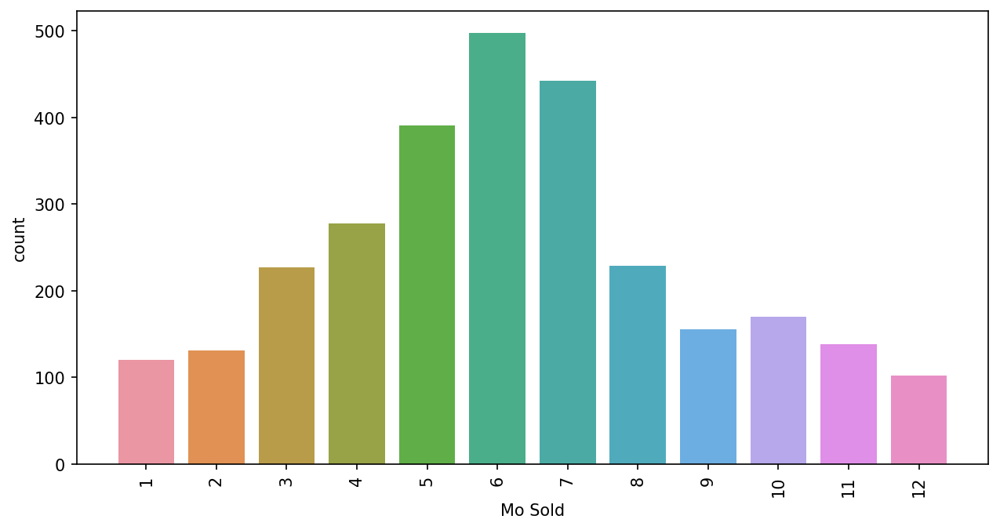

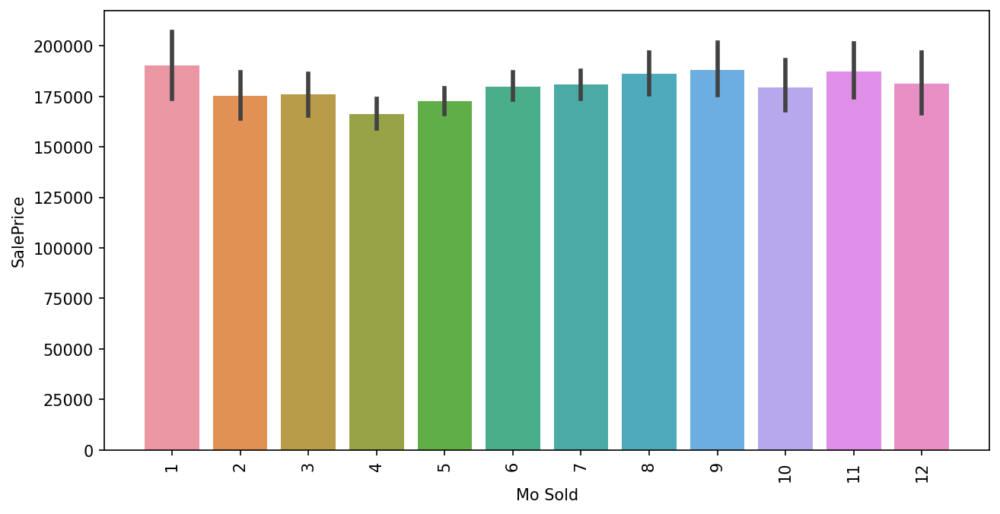

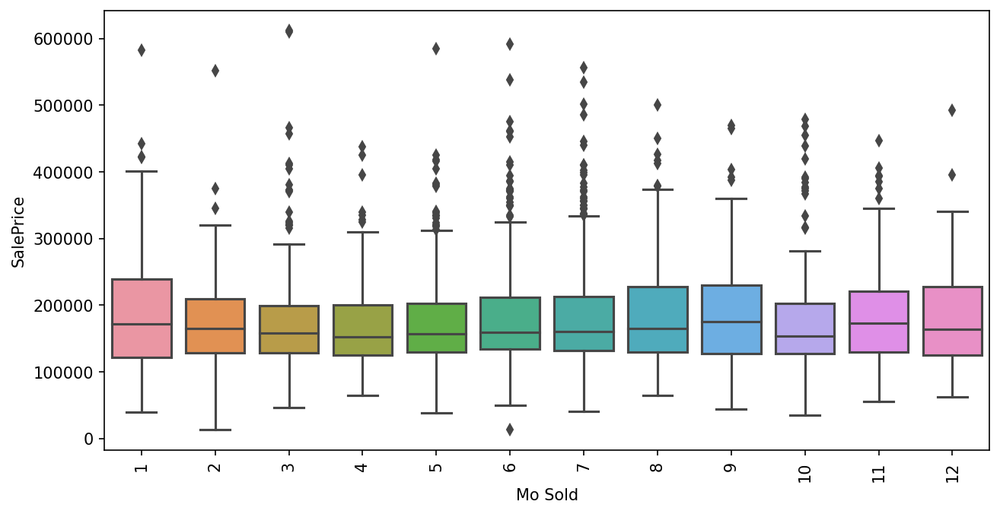

In [399]:
plot_cat(col[76])

* Eliminating This Feature

In [400]:
col[77]

'Yr Sold'

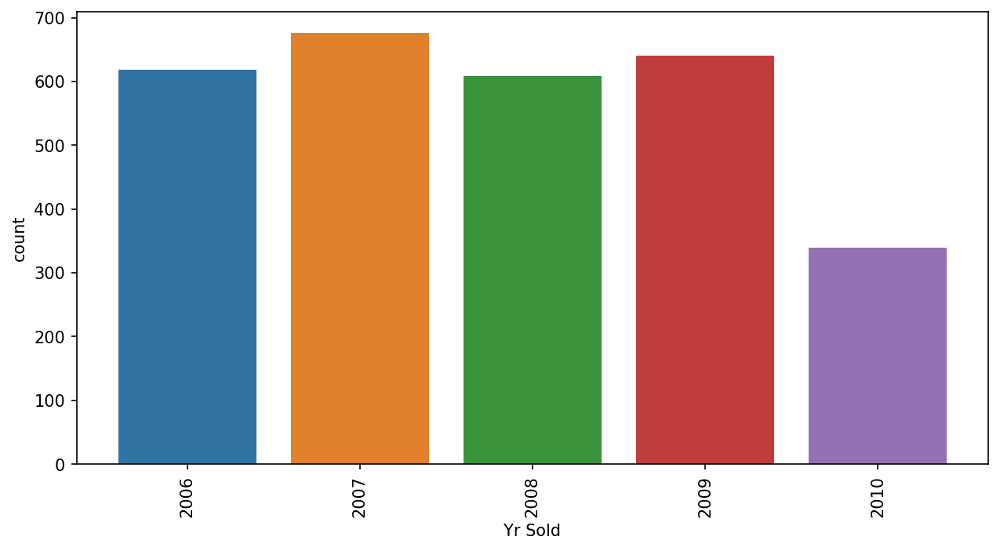

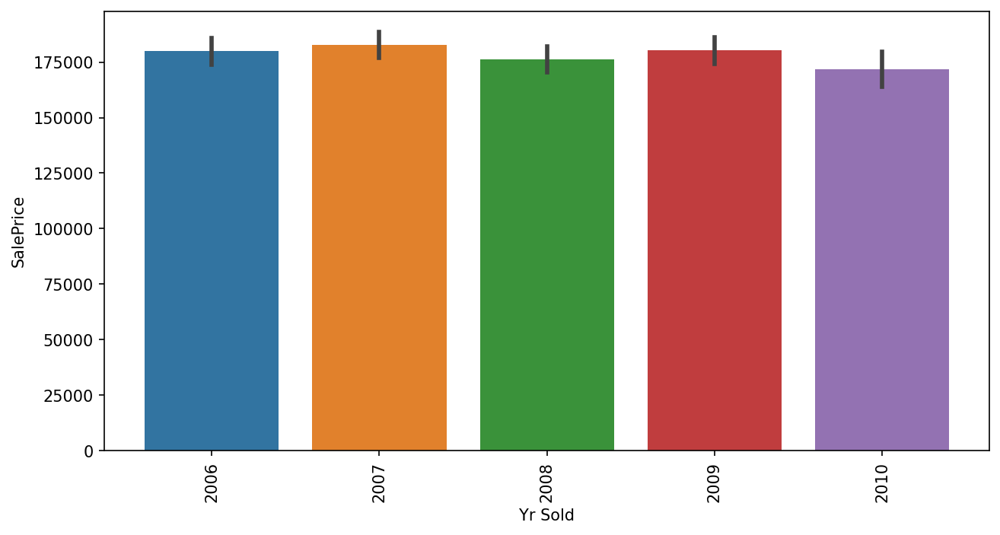

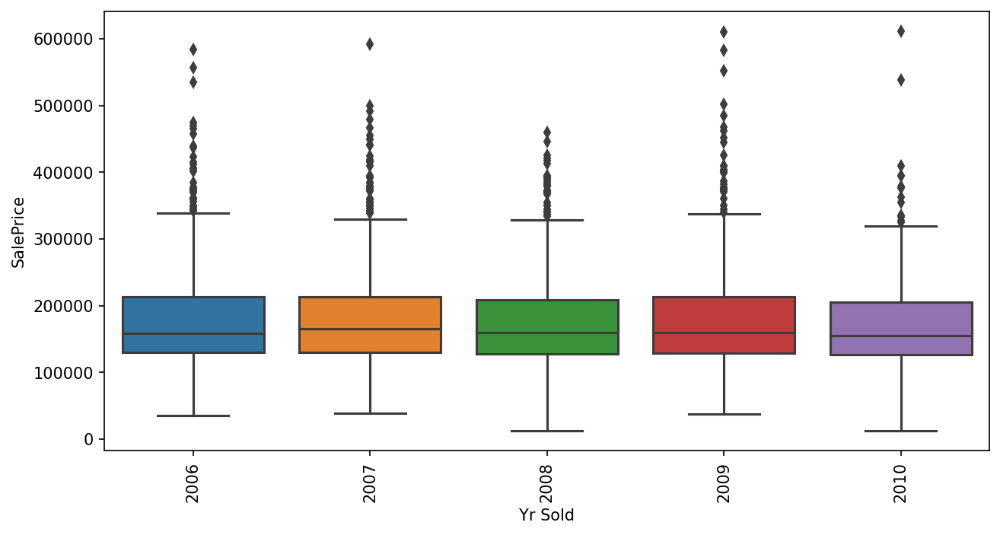

In [401]:
plot_cat(col[77])

* Eliminating this feature

In [402]:
col[78]

'Sale Type'

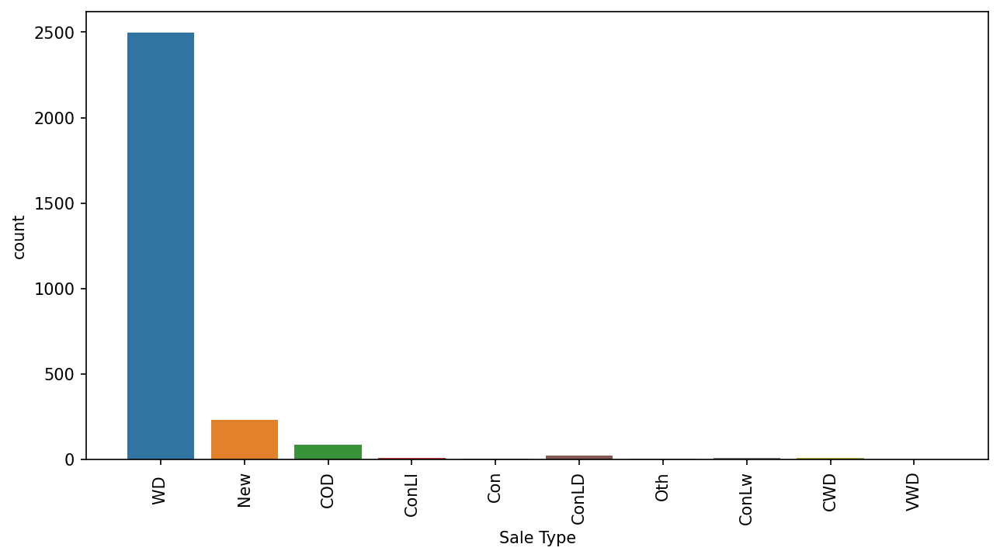

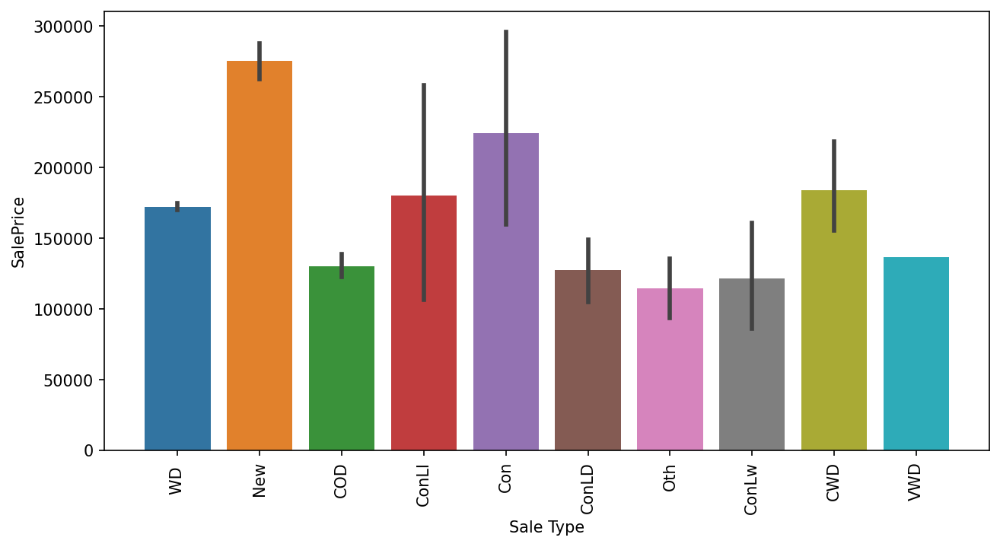

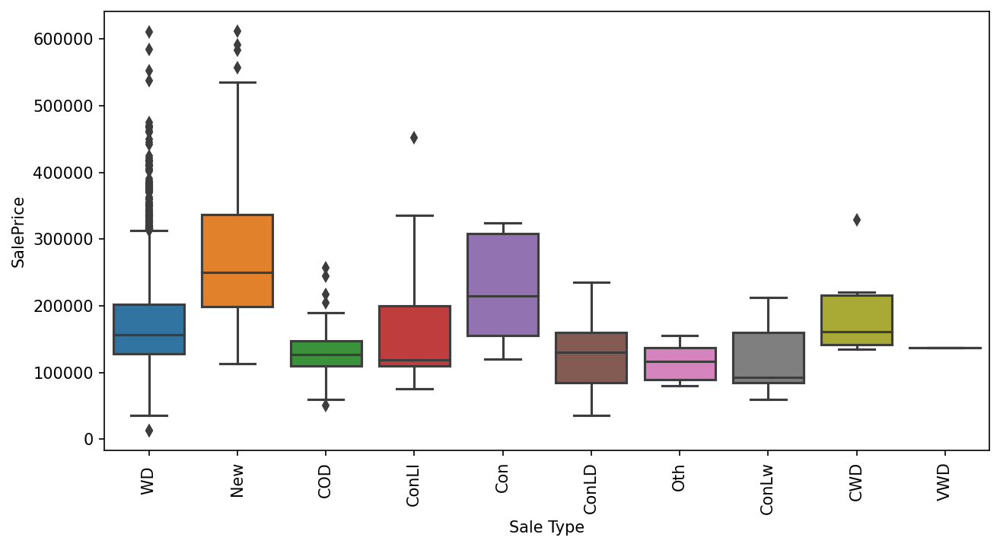

In [403]:
plot_cat(col[78])

In [404]:
cat.append(col[78])
cat[-1]

'Sale Type'

In [405]:
col[79]

'Sale Condition'

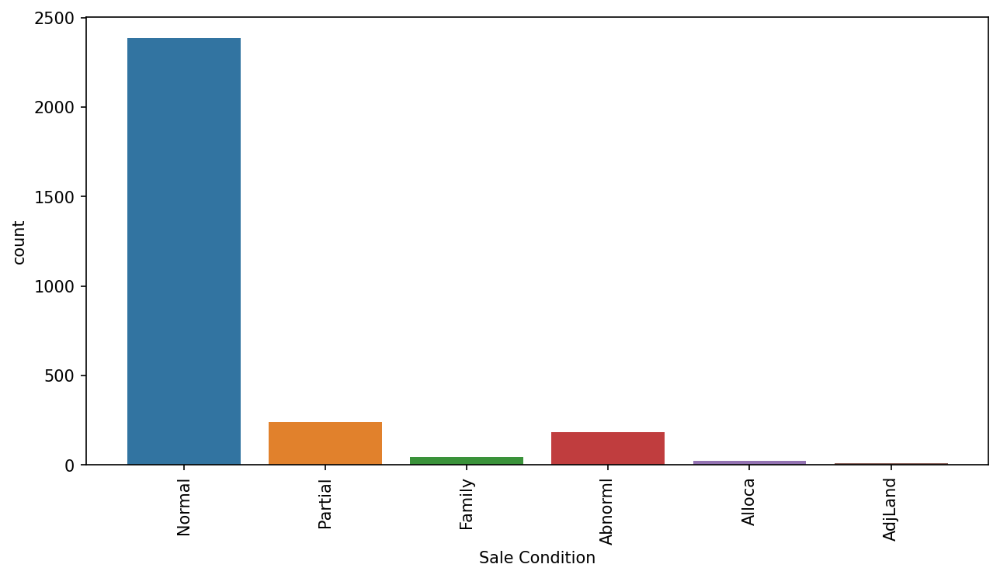

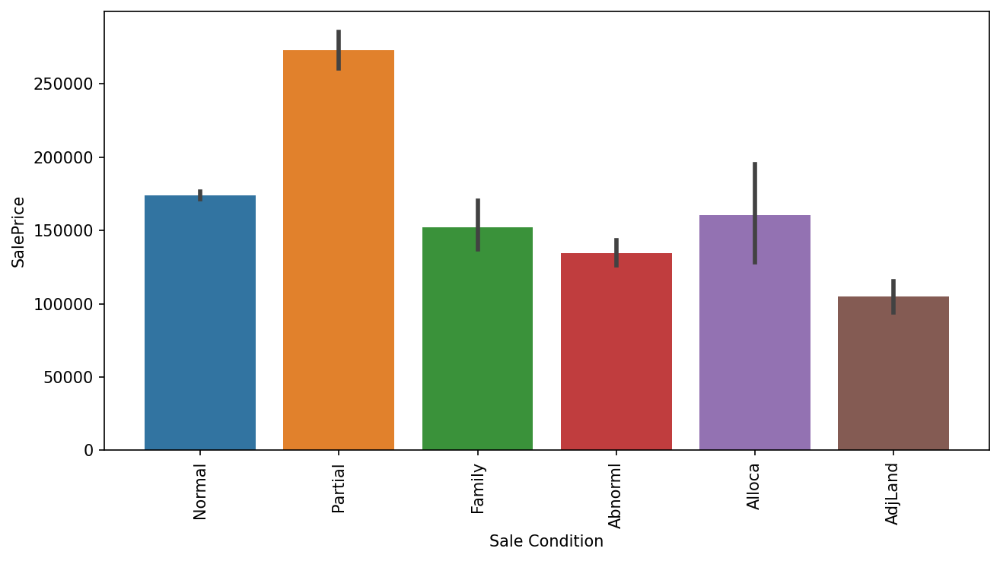

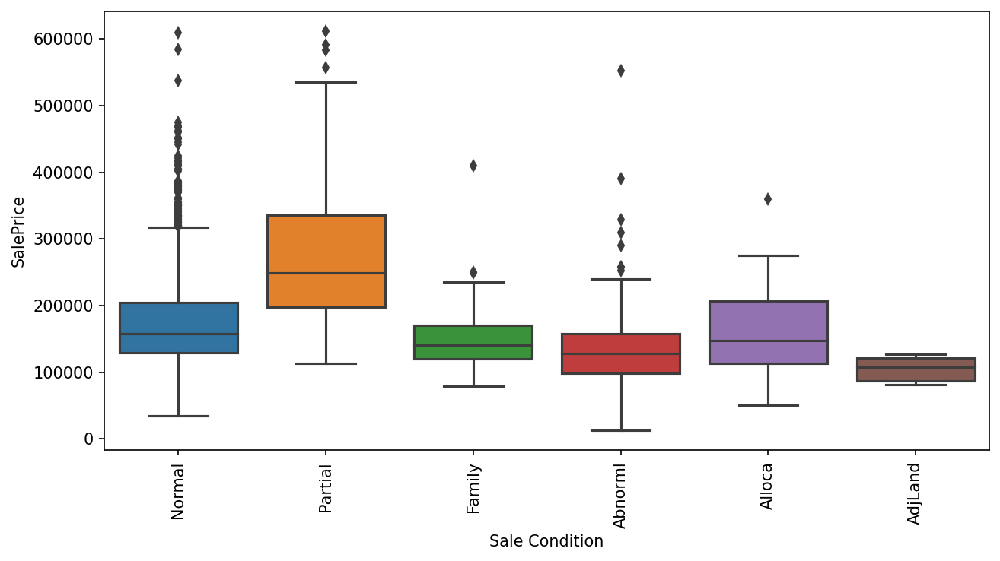

In [406]:
plot_cat(col[79])

In [407]:
cat.append(col[79])
cat[-1]

'Sale Condition'

In [408]:
col[80]

'SalePrice'

<Figure size 1500x750 with 0 Axes>

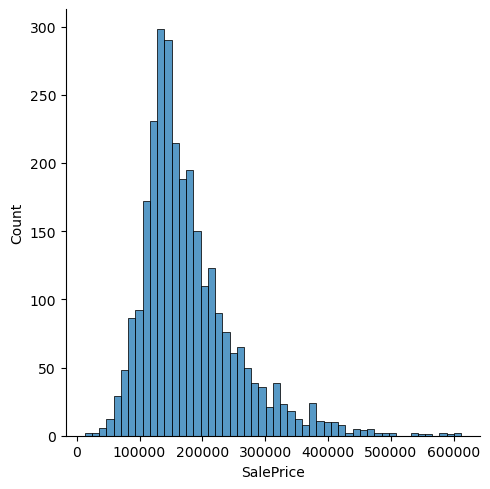

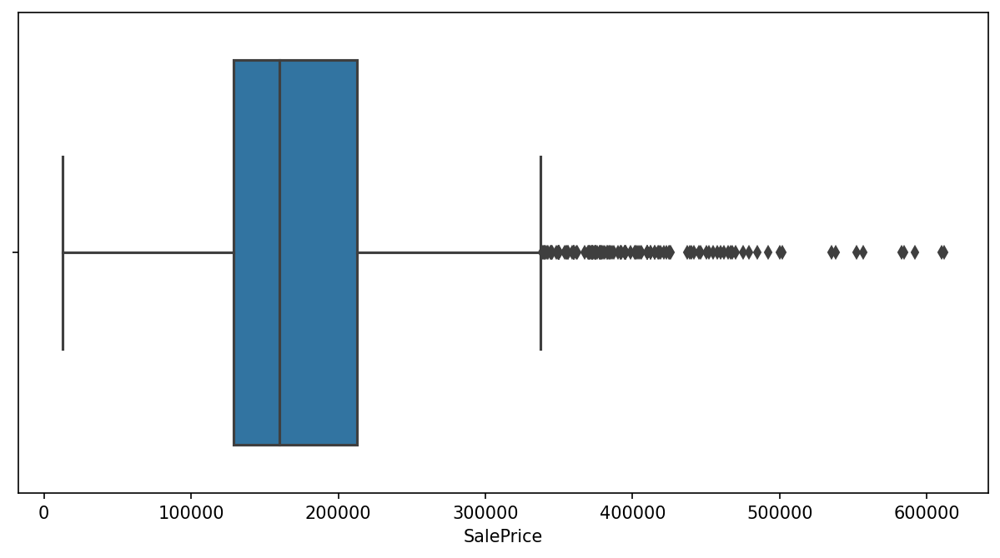

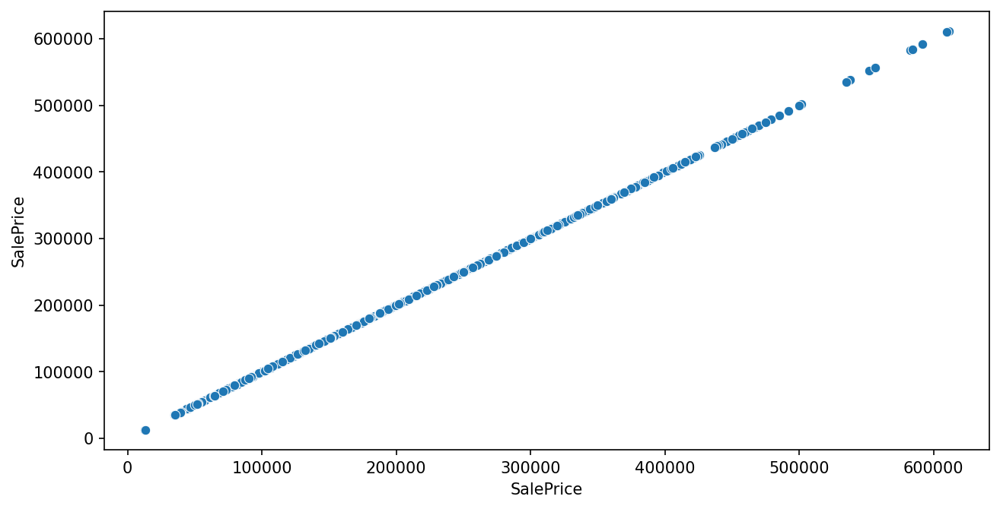

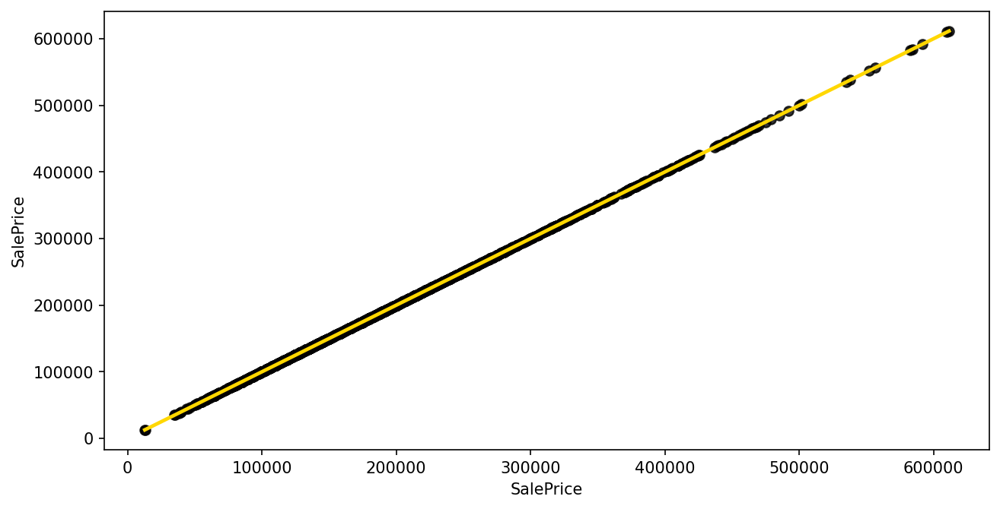

In [409]:
plot_num(col[80])

In [410]:
num.append(col[80])
num[-1]

'SalePrice'

In [411]:
df['SalePrice'].describe()

count      2881.000000
mean     178932.040958
std       76300.360786
min       12789.000000
25%      129000.000000
50%      160000.000000
75%      212500.000000
max      611657.000000
Name: SalePrice, dtype: float64

In [412]:
len(df[df['SalePrice']<350000])/len(df)*100

96.11246095105867

* We can see that for 96.1% of the data sale price is less than 350000
* We can see that the mean price is 178932.040958
* we can make a model for the whole data but i have decided to make a model which would perform much better for properties with sale price less than 350000
* i am removing 4% of the data because i can train a much better model with the rest of the 96% of the data
* In real worl depending on the business requirement we should decide if we have to train the model for the whole price range or not
* As this is a Personal project i have decided to drop this more a better model

In [413]:
len(df)

2881

In [414]:
df = df[df['SalePrice']<350000]

In [415]:
len(df)

2769

In [416]:
cat

['MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Exterior 1st',
 'Mas Vnr Type',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Cond',
 'Bsmt Exposure',
 'Heating QC',
 'Central Air',
 'Electrical',
 'Full Bath',
 'Half Bath',
 'Functional',
 'Fireplace Qu',
 'Garage Type',
 'Garage Qual',
 'Paved Drive',
 'Pool QC',
 'Fence',
 'Sale Type',
 'Sale Condition']

In [417]:
num

['Lot Frontage',
 'Lot Area',
 'Lot Shape',
 'Overall Qual',
 'Year Built',
 'Year Remod/Add',
 'Roof Matl',
 'Mas Vnr Area',
 'Bsmt Qual',
 'BsmtFin Type 1',
 'BsmtFin SF 1',
 'BsmtFin Type 2',
 'Total Bsmt SF',
 'Heating',
 '1st Flr SF',
 '2nd Flr SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Kitchen AbvGr',
 'Kitchen Qual',
 'TotRms AbvGrd',
 'Fireplaces',
 'Garage Finish',
 'Garage Cars',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 'Enclosed Porch',
 '3Ssn Porch',
 'Pool Area',
 'SalePrice']

In [418]:
len(cat) + len(num)

66

In [419]:
df_nums = df[num]
df_objs = df[cat]

In [420]:
df_objs = pd.get_dummies(df_objs,drop_first=True)

In [421]:
final_df = pd.concat([df_nums,df_objs],axis=1)

In [422]:
final_df

,Lot Frontage,Lot Area,Lot Shape,Overall Qual,Year Built,Year Remod/Add,Roof Matl,Mas Vnr Area,Bsmt Qual,BsmtFin Type 1,...,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial
0,141.0,31770,1,6,1960,1960,0,112.0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,80.0,11622,2,5,1961,1961,0,0.0,0,0,...,0,0,0,0,1,0,0,0,1,0
2,81.0,14267,1,6,1958,1958,0,108.0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,93.0,11160,2,7,1968,1968,0,0.0,0,0,...,0,0,0,0,1,0,0,0,1,0
4,74.0,13830,1,5,1997,1998,0,0.0,1,1,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,37.0,7937,1,6,1984,1984,0,0.0,0,1,...,0,0,0,0,1,0,0,0,1,0
2926,72.0,8885,1,5,1983,1983,0,0.0,1,0,...,0,0,0,0,1,0,0,0,1,0
2927,62.0,10441,2,5,1992,1992,0,0.0,1,1,...,0,0,0,0,1,0,0,0,1,0
2928,77.0,10010,2,5,1974,1975,0,0.0,1,0,...,0,0,0,0,1,0,0,0,1,0


In [423]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2769 entries, 0 to 2929
Columns: 205 entries, Lot Frontage to Sale Condition_Partial
dtypes: float64(7), int64(28), uint8(170)
memory usage: 1.2 MB


# Model building

## Preparing data(Scaling,Encoding,Splitting for training and testing)

In [424]:
X = final_df.drop(['SalePrice'],axis=1)
y = final_df['SalePrice']

In [425]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [426]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

def err(y_test,y_pred):
  MAE = mean_absolute_error(y_test,y_pred)
  MSE = mean_squared_error(y_test,y_pred)
  RMSE = np.sqrt(MSE)

  print(f'Mean absolute error : {MAE}')
  print(f'Mean Squared error : {MSE}')
  print(f'Root Mean Squared error : {RMSE}')

In [427]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

scaled_X_train = sc.fit_transform(X_train)
scaled_X_test = sc.transform(X_test)

In [428]:
# from sklearn.linear_model import LinearRegression

# model = LinearRegression()
# model.fit(scaled_X_train,y_train)
# model.fit(scaled_X_train,y_train)

# y_pred = model.predict(scaled_X_test)
# err(y_test,y_pred)

## Training

### Elastic Net

In [429]:
from sklearn.linear_model import ElasticNet
base_elastic_model = ElasticNet()
param_grid = {'alpha':[0.1,1,5,10,50,100,250,500],
              'l1_ratio':[0, .1, .5, .7, .9, .95, .99, 1]}

from sklearn.model_selection import GridSearchCV
# verbose number a personal preference
model = GridSearchCV(estimator=base_elastic_model,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=10,
                          verbose=2)

model.fit(scaled_X_train,y_train)

y_pred = model.predict(scaled_X_test)


Fitting 10 folds for each of 64 candidates, totalling 640 fits


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.321e+11, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.349e+11, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.400e+11, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.360e+11, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.356e+11, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.238e+11, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.397e+11, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.289e+11, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.430e+11, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.359e+11, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=0; total time=   0.8s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.1; total time=   0.1s
[CV] END ............................alpha=0.1, l1_ratio=0.5; total time=   0.1s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.366e+10, tolerance: 7.261e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.597e+10, tolerance: 7.195e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.865e+10, tolerance: 7.066e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.712e+10, tolerance: 7.147e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.470e+10, tolerance: 7.113e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.769e+10, tolerance: 7.057e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.275e+10, tolerance: 7.056e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.416e+11, tolerance: 7.069e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.817e+10, tolerance: 7.100e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.361e+11, tolerance: 7.248e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...........................alpha=0.1, l1_ratio=0.99; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.575e+11, tolerance: 7.261e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.158e+09, tolerance: 7.195e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.791e+11, tolerance: 7.066e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.006e+11, tolerance: 7.147e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.138e+11, tolerance: 7.113e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.137e+11, tolerance: 7.057e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.5s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.698e+11, tolerance: 7.056e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.171e+11, tolerance: 7.069e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.362e+09, tolerance: 7.100e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.567e+11, tolerance: 7.248e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=0.1, l1_ratio=1; total time=   0.5s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.800e+11, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.785e+11, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.764e+11, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   1.0s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.771e+11, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.800e+11, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.624e+11, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.782e+11, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.668e+11, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.836e+11, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.788e+11, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=0; total time=   0.8s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=1, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.466e+09, tolerance: 7.261e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.412e+09, tolerance: 7.195e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.817e+10, tolerance: 7.066e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.409e+10, tolerance: 7.147e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.985e+09, tolerance: 7.113e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.220e+09, tolerance: 7.057e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e+09, tolerance: 7.056e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.075e+10, tolerance: 7.069e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.7s
[CV] END ................................alpha=1, l1_ratio=1; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.586e+09, tolerance: 7.100e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.307e+11, tolerance: 7.248e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=1, l1_ratio=1; total time=   0.5s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.429e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.423e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.405e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.417e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.422e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.396e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.411e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.399e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.421e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.428e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=0; total time=   0.8s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.1; total time=   0.0s
[CV] END ..............................alpha=5, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.327e+11, tolerance: 7.248e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ................................alpha=5, l1_ratio=1; total time=   0.5s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.925e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.916e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.888e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.906e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.909e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.882e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.895e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.883e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.906e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.7s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.925e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=0; total time=   0.8s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=10, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.735e+10, tolerance: 7.248e+08
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=10, l1_ratio=1; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.011e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.989e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.939e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.971e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.962e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.935e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.939e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.937e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.957e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.009e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ...............................alpha=50, l1_ratio=0; total time=   0.8s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.1; total time=   0.0s
[CV] END .............................alpha=50, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.285e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(
C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.258e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in s

[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.202e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.238e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.226e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.198e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.200e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.201e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.220e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.281e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=100, l1_ratio=0; total time=   0.8s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=100, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.482e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.452e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.391e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.6s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.429e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.414e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.387e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   1.0s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.387e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   1.0s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.391e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.408e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.477e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=250, l1_ratio=0; total time=   0.8s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=250, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.554e+12, tolerance: 7.261e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.523e+12, tolerance: 7.195e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.460e+12, tolerance: 7.066e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.500e+12, tolerance: 7.147e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.484e+12, tolerance: 7.113e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.456e+12, tolerance: 7.057e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.456e+12, tolerance: 7.056e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.9s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.461e+12, tolerance: 7.069e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.477e+12, tolerance: 7.100e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s


C:\Users\Harish Raju\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.548e+12, tolerance: 7.248e+08 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.
  model = cd_fast.enet_coordinate_descent(


[CV] END ..............................alpha=500, l1_ratio=0; total time=   0.8s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.1; total time=   0.0s
[CV] END ............................alpha=500, l1_ratio=0.5; total time=   0.0s
[CV] END ...................

In [430]:
err(y_test,y_pred)

Mean absolute error : 12274.878994078272
Mean Squared error : 283011592.10413295
Root Mean Squared error : 16822.948377265293


In [431]:
model.best_params_

{'alpha': 250, 'l1_ratio': 1}

In [432]:
lr_model = ElasticNet(alpha=250,l1_ratio=1)

lr_model.fit(scaled_X_train,y_train)

y_pred_el = lr_model.predict(scaled_X_test)

In [433]:
err(y_test,y_pred)

Mean absolute error : 12274.878994078272
Mean Squared error : 283011592.10413295
Root Mean Squared error : 16822.948377265293


In [434]:
c = lr_model.coef_
cd = pd.DataFrame({'coef':c},index=X.columns)

In [435]:
cd

,coef
Lot Frontage,1291.032019
Lot Area,2230.141506
Lot Shape,-417.039992
Overall Qual,12419.990911
Year Built,4974.670731
...,...
Sale Condition_AdjLand,513.617540
Sale Condition_Alloca,31.482363
Sale Condition_Family,-373.410141
Sale Condition_Normal,2933.482295


In [436]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()

cds = sc.fit_transform(cd)

In [437]:
# cds


In [438]:
cds
a = []
for i in cds:
  a.append(i[0])


In [439]:
cds = pd.DataFrame({'coef_s':a},index=X.columns)

In [440]:
cds.sort_values('coef_s')

,coef_s
MS SubClass,0.000000
Bldg Type_Twnhs,0.048579
Heating QC_TA,0.050277
Bldg Type_Duplex,0.063250
Exter Qual_TA,0.066902
...,...
Neighborhood_NridgHt,0.362587
Year Built,0.365174
BsmtFin SF 1,0.400689
Overall Qual,0.691741


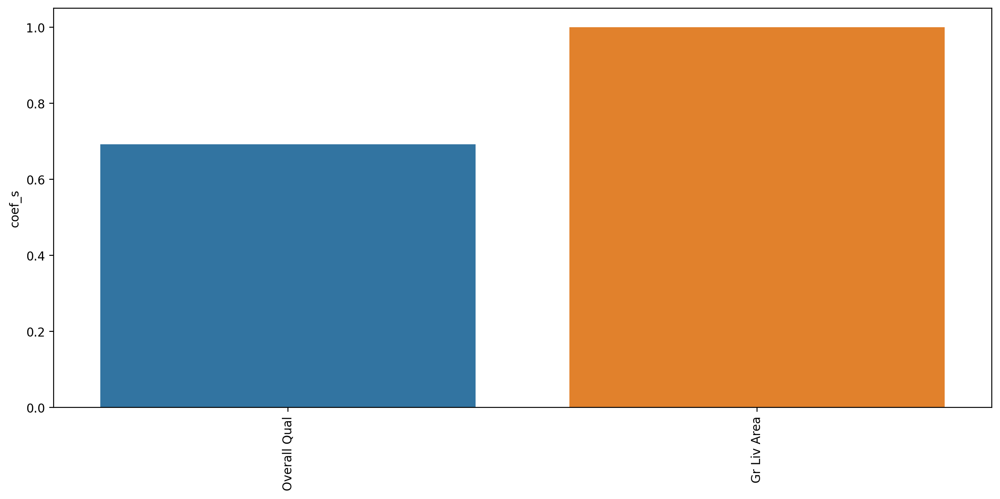

In [441]:
plt.figure(figsize=(14,6),dpi=200)
sns.barplot(data=cds[cds['coef_s']>0.5].sort_values('coef_s'),x=cds[cds['coef_s']>0.5].sort_values('coef_s').index,y='coef_s')
plt.xticks(rotation=90);

In [442]:
len(X_test),len(y_test)

(554, 554)

#### Checking Assumptions

In [443]:
# Residuals
residuals = y_test - y_pred

Text(0, 0.5, 'Residuals')

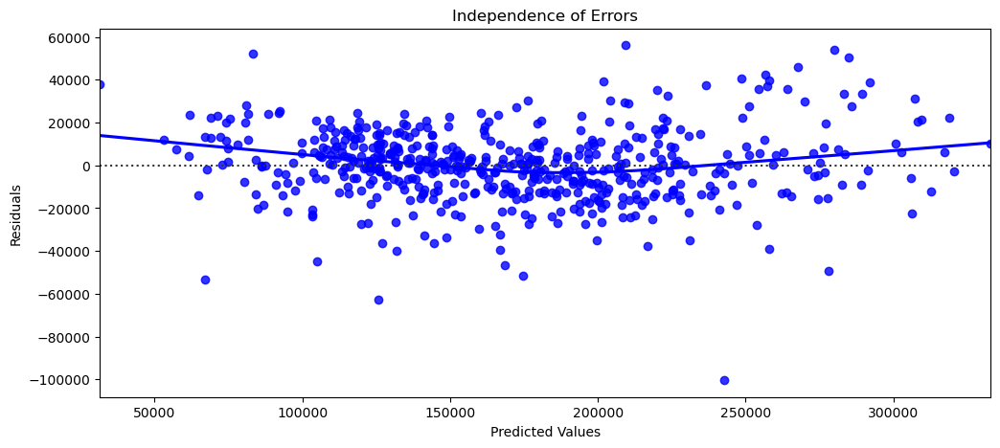

In [444]:
# Independence of Errors Assumption (Residual Plot)
plt.figure(figsize=(12,5))
sns.residplot(x=y_pred, y=residuals, lowess=True, color='blue')
plt.title('Independence of Errors')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

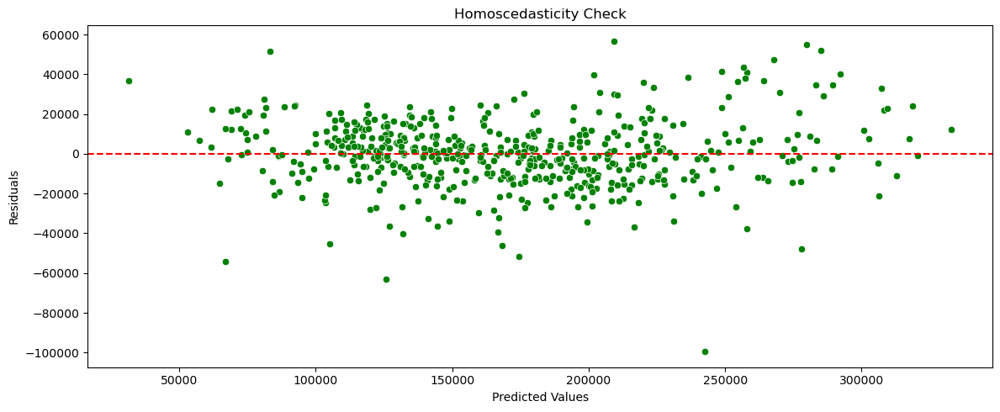

In [445]:
# Homoscedasticity Assumption (Residual Plot)
plt.figure(figsize=(12,5))
sns.scatterplot(x=y_pred, y=residuals, color='green')
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Homoscedasticity Check')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.tight_layout()
plt.show()

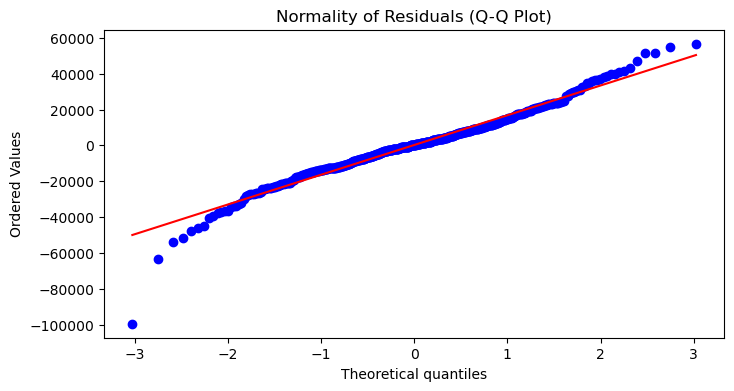

In [446]:
from scipy import stats
# Normality of Residuals (Q-Q Plot)
plt.figure(figsize=(8, 4))
stats.probplot(residuals, plot=plt)
plt.title('Normality of Residuals (Q-Q Plot)')
plt.show()

* Elastic Net regularization can help mitigate some of the issues related to multicollinearity by shrinking the coefficients of less important variables

### Random Forest

In [447]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()

param_grid = {'n_estimators':[10,50,100,150,200]}

model = GridSearchCV(estimator=model,param_grid=param_grid)

model.fit(scaled_X_train,y_train)

y_pred = model.predict(scaled_X_test)

err(y_test,y_pred)

Mean absolute error : 13413.284732250302
Mean Squared error : 360124688.82785916
Root Mean Squared error : 18976.95151566392


In [448]:
model.best_params_

{'n_estimators': 200}

In [449]:
rf_model = RandomForestRegressor(n_estimators=150)

rf_model.fit(scaled_X_train,y_train)

y_pred_rf = rf_model.predict(scaled_X_test)

In [450]:
# model.feature_importances_

In [451]:
feats = pd.DataFrame(index=X.columns,data=rf_model.feature_importances_,columns=['Importance'])

In [452]:
feats

,Importance
Lot Frontage,0.007618
Lot Area,0.015806
Lot Shape,0.001680
Overall Qual,0.582533
Year Built,0.016958
...,...
Sale Condition_AdjLand,0.000007
Sale Condition_Alloca,0.000098
Sale Condition_Family,0.001001
Sale Condition_Normal,0.001428


In [453]:
imp_feats = feats[feats['Importance']>0.01]

In [454]:
imp_feats

,Importance
Lot Area,0.015806
Overall Qual,0.582533
Year Built,0.016958
Year Remod/Add,0.012435
BsmtFin SF 1,0.024790
Total Bsmt SF,0.038605
1st Flr SF,0.021636
Gr Liv Area,0.124754
Garage Cars,0.018923
Garage Area,0.031800


In [455]:
imp_feats = imp_feats.sort_values("Importance")

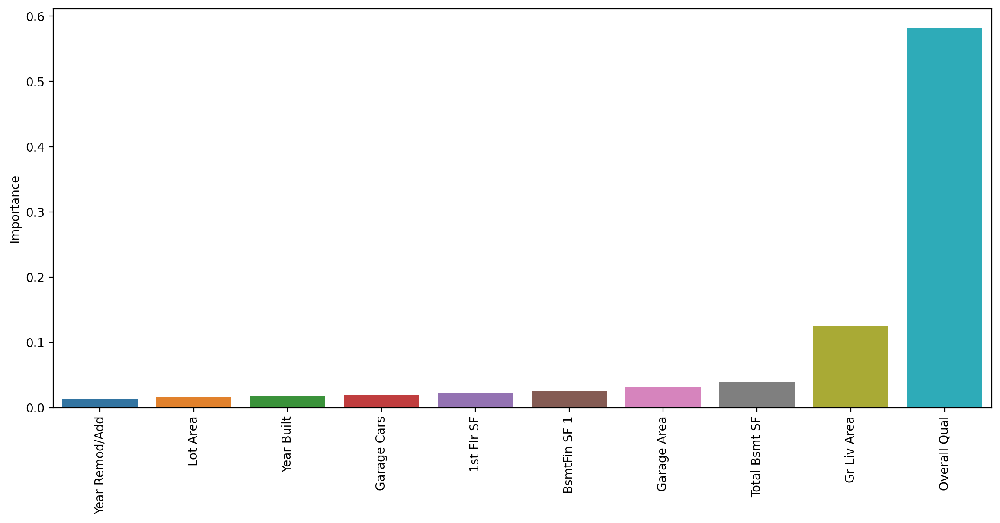

In [456]:
plt.figure(figsize=(14,6),dpi=200)
sns.barplot(data=imp_feats.sort_values('Importance'),x=imp_feats.sort_values('Importance').index,y='Importance')

plt.xticks(rotation=90);

In [457]:
y_pred1 = lr_model.predict(scaled_X_test)
y_pred2 = rf_model.predict(scaled_X_test)

In [458]:
y_pred1 = lr_model.predict(scaled_X_test)
y_pred2 = rf_model.predict(scaled_X_test)

y_pred = (y_pred1 + y_pred2) / 2

err(y_test,y_pred)

Mean absolute error : 11872.641934552663
Mean Squared error : 275889553.27727103
Root Mean Squared error : 16609.92333748928


In [459]:
y_pred = (y_pred1 + y_pred2) / 2

In [460]:
err(y_test,y_pred)

Mean absolute error : 11872.641934552663
Mean Squared error : 275889553.27727103
Root Mean Squared error : 16609.92333748928


### Gradient Boosting Regressor

In [461]:
from sklearn.ensemble import GradientBoostingRegressor
model = GradientBoostingRegressor()

param_grid = {'n_estimators':[10,50,100,150],'max_depth':[2,3,5,8,10,12,15]}

model = GridSearchCV(estimator=model,param_grid=param_grid,verbose=2)

model.fit(scaled_X_train,y_train)

y_pred = model.predict(scaled_X_test)



Fitting 5 folds for each of 28 candidates, totalling 140 fits
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.2s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.2s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.2s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.2s
[CV] END .......................max_depth=2, n_estimators=10; total time=   0.2s
[CV] END .......................max_depth=2, n_estimators=50; total time=   1.1s
[CV] END .......................max_depth=2, n_estimators=50; total time=   1.0s
[CV] END .......................max_depth=2, n_estimators=50; total time=   1.0s
[CV] END .......................max_depth=2, n_estimators=50; total time=   1.0s
[CV] END .......................max_depth=2, n_estimators=50; total time=   1.0s
[CV] END ......................max_depth=2, n_estimators=100; total time=   2.1s
[CV] END ......................max_depth=2, n_e

[CV] END ......................max_depth=12, n_estimators=10; total time=   1.2s
[CV] END ......................max_depth=12, n_estimators=10; total time=   1.2s
[CV] END ......................max_depth=12, n_estimators=10; total time=   1.2s
[CV] END ......................max_depth=12, n_estimators=10; total time=   1.4s
[CV] END ......................max_depth=12, n_estimators=50; total time=   6.9s
[CV] END ......................max_depth=12, n_estimators=50; total time=   6.6s
[CV] END ......................max_depth=12, n_estimators=50; total time=   6.5s
[CV] END ......................max_depth=12, n_estimators=50; total time=   6.9s
[CV] END ......................max_depth=12, n_estimators=50; total time=   6.9s
[CV] END .....................max_depth=12, n_estimators=100; total time=  14.2s
[CV] END .....................max_depth=12, n_estimators=100; total time=  13.2s
[CV] END .....................max_depth=12, n_estimators=100; total time=  13.8s
[CV] END ...................

In [462]:
err(y_test,y_pred)

Mean absolute error : 12250.551861339649
Mean Squared error : 283938743.5983685
Root Mean Squared error : 16850.481998992447


In [463]:
model.best_params_

{'max_depth': 3, 'n_estimators': 150}

In [464]:
gb_model = GradientBoostingRegressor(max_depth=3,n_estimators=150)
gb_model.fit(scaled_X_train,y_train)

y_pred = gb_model.predict(scaled_X_test)



In [465]:
feats = pd.DataFrame(index=X.columns,data=gb_model.feature_importances_,columns=['Importance'])
imp_feats = feats[feats['Importance']>0.01]

imp_feats = imp_feats.sort_values("Importance")

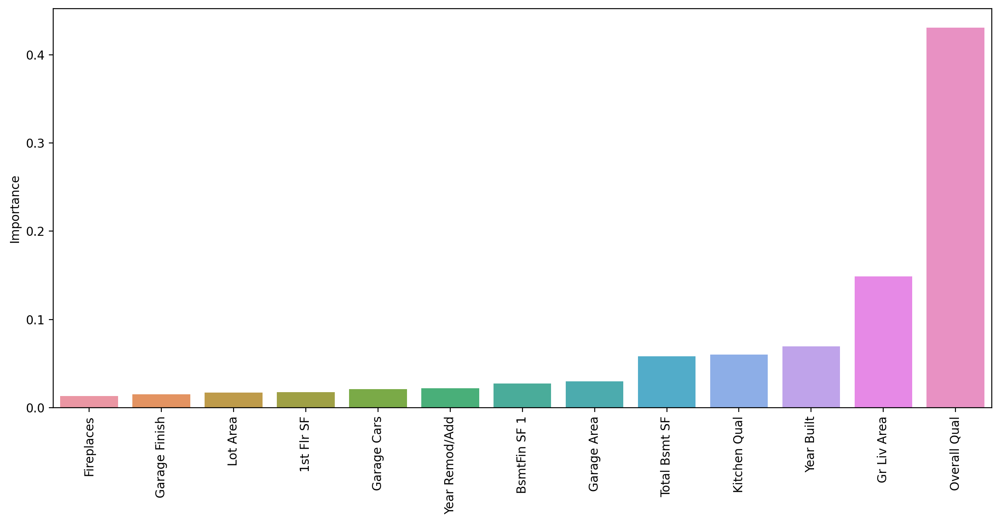

In [466]:
plt.figure(figsize=(14,6),dpi=200)
sns.barplot(data=imp_feats.sort_values('Importance'),x=imp_feats.sort_values('Importance').index,y='Importance')

plt.xticks(rotation=90);

In [467]:
y_pred1 = lr_model.predict(scaled_X_test)
y_pred2 = rf_model.predict(scaled_X_test)
y_pred3 = gb_model.predict(scaled_X_test)

y_pred = (y_pred1 + y_pred2 + y_pred3) / 3

err(y_test,y_pred)

Mean absolute error : 11620.857991340277
Mean Squared error : 262900693.0719274
Root Mean Squared error : 16214.212687390263


* We can see that combining results of 3 models is giving lower compared to individual models
* here the difference in error is not that much
* if we want the predictions with least error we can use this combination
* if the small increase in error is not a problem we can use a single mode
* It all depends on the business requirements and resources training 3 models will take time

In [468]:
df['SalePrice'].describe()

count      2769.000000
mean     169384.555796
std       59707.716365
min       12789.000000
25%      128000.000000
50%      157000.000000
75%      203000.000000
max      349265.000000
Name: SalePrice, dtype: float64

* We can see that the mean sale price is 169384.555796, with an Root Mean Squared error of 16162.5 we can say that our predictions are not that far off from the mean

In [469]:
final_df

,Lot Frontage,Lot Area,Lot Shape,Overall Qual,Year Built,Year Remod/Add,Roof Matl,Mas Vnr Area,Bsmt Qual,BsmtFin Type 1,...,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial
0,141.0,31770,1,6,1960,1960,0,112.0,0,0,...,0,0,0,0,1,0,0,0,1,0
1,80.0,11622,2,5,1961,1961,0,0.0,0,0,...,0,0,0,0,1,0,0,0,1,0
2,81.0,14267,1,6,1958,1958,0,108.0,0,0,...,0,0,0,0,1,0,0,0,1,0
3,93.0,11160,2,7,1968,1968,0,0.0,0,0,...,0,0,0,0,1,0,0,0,1,0
4,74.0,13830,1,5,1997,1998,0,0.0,1,1,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,37.0,7937,1,6,1984,1984,0,0.0,0,1,...,0,0,0,0,1,0,0,0,1,0
2926,72.0,8885,1,5,1983,1983,0,0.0,1,0,...,0,0,0,0,1,0,0,0,1,0
2927,62.0,10441,2,5,1992,1992,0,0.0,1,1,...,0,0,0,0,1,0,0,0,1,0
2928,77.0,10010,2,5,1974,1975,0,0.0,1,0,...,0,0,0,0,1,0,0,0,1,0
